In [1]:

import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.ndimage import gaussian_filter1d
import os
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.ndimage import gaussian_filter1d
from collections import defaultdict

import os, sys, pickle, time, re, csv


from scipy.stats import zscore, sem, entropy
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
from scipy.signal import correlate2d
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np
from scipy.ndimage import gaussian_filter

import statsmodels.api as sm
from tqdm import tqdm
import json

In [2]:
Data_folder="../data/processed_data"
figures_folder="../data/figures"
neuron_folder = f"{Data_folder}/neuron_raw_mingyutest"
trialtimes_folder = f"{Data_folder}/trialtimes_raw_mingyutest"

In [3]:
all_files = os.listdir(neuron_folder)
neuron_files = [f for f in all_files if f.startswith('Neuron_raw_') and f.endswith('.npy')]

mouse_recdays_ = []
for f in neuron_files:
    # Remove prefix 'Neuron_raw_' and suffix '.npy'
    stripped_name = f[len('Neuron_raw_'):-len('.npy')]
    # Split by '_' and rejoin all parts except the last one (session number)
    mouse_recday = '_'.join(stripped_name.split('_')[:-1])
    mouse_recdays_.append(mouse_recday)

# Find the unique mouse_recday identifiers
mouse_recdays = np.unique(mouse_recdays_)

# Filter out identifiers containing '_sb'
unique_mouse_recdays = [recday for recday in mouse_recdays if '_sb' not in recday]

print("Unique mouse_recday identifiers (without '_sb'):")
print(unique_mouse_recdays)

# Assign the first unique identifier to mouse_recday for later use
if len(unique_mouse_recdays) > 0:
    mouse_recday = unique_mouse_recdays[0]

mouse_recdays = unique_mouse_recdays


Unique mouse_recday identifiers (without '_sb'):
[np.str_('ah08_20250613_20250615'), np.str_('ah08_20250616_20250617'), np.str_('ah08_20250618_20250619'), np.str_('ah08_20250620_20250623'), np.str_('ah08_20250624_20250625'), np.str_('ah10_20250613_20250615'), np.str_('ah10_20250616_20250617'), np.str_('ah10_20250618_20250619'), np.str_('ah10_20250620_20250623'), np.str_('ah10_20250624_20250625'), np.str_('ly05_20250613_20250615'), np.str_('ly05_20250616_20250617'), np.str_('ly05_20250618_20250619'), np.str_('ly05_20250624_20250625'), np.str_('ly06_20250613_20250615'), np.str_('ly06_20250616_20250617'), np.str_('ly06_20250618_20250619'), np.str_('ly06_20250620_20250623'), np.str_('ly06_20250624_20250625'), np.str_('ly07_20250613_20250615'), np.str_('ly07_20250616_20250617'), np.str_('ly07_20250618_20250619'), np.str_('ly07_20250620_20250623'), np.str_('ly07_20250624_20250625')]


In [ ]:
# def partition(alist, indices):
#     return np.asarray([np.asarray(alist[i:j]) for i, j in zip(indices[:-1], indices[1:])])
def partition(alist, indices):
    return np.asarray([np.asarray(alist[i:j]) for i, j in zip(indices[:-1], indices[1:])])

def normalise(xx,num_bins=90,take_max=False):
    lenxx=len(xx)
    if lenxx<num_bins:
        xx=np.repeat(xx,10)/10
        lenxx=lenxx*10
    indices_polar=np.arange(lenxx)
    if take_max==True:
        normalized_xx=st.binned_statistic(indices_polar,xx, 'max', bins=num_bins)[0]
    else:
        normalized_xx=st.binned_statistic(indices_polar,xx, 'mean', bins=num_bins)[0]
    return(normalized_xx)

def raw_to_norm(raw_neuron,Trial_times_conc,num_states=4,return_mean=True,smoothing=True,\
                take_max=False,smoothing_sigma=10):
    raw_neuron_split=remove_empty(partition(list(raw_neuron),list(Trial_times_conc)))
    if len(raw_neuron_split)%num_states!=0:
        raw_neuron_split=raw_neuron_split[:len(raw_neuron_split)-len(raw_neuron_split)%num_states]
    
    if take_max==True:
        raw_neuron_split_norm=np.asarray([normalise(raw_neuron_split[ii],take_max=True)\
                                          for ii in np.arange(len(raw_neuron_split))])
    else:
        raw_neuron_split_norm=np.asarray([normalise(raw_neuron_split[ii]) for ii in np.arange(len(raw_neuron_split))])
    
    Actual_norm=(raw_neuron_split_norm.reshape(len(raw_neuron_split_norm)//num_states,\
                                               len(raw_neuron_split_norm[0])*num_states))
    
    if return_mean==True:
        Actual_norm_mean=np.nanmean(Actual_norm,axis=0)
        if smoothing==True:
            Actual_norm_smoothed=smooth_circular(Actual_norm_mean,sigma=smoothing_sigma)
            return(Actual_norm_smoothed)
        else:
            return(Actual_norm_mean)
    else:
        return(Actual_norm)
    


def get_sessions(mouse_recday, Data_folder=Data_folder):
    
    Tasks = np.load(Data_folder + "Task_data_" + mouse_recday + ".npy")
    sessions_to_try = range(len(Tasks))
    sessions = []
    for session in sessions_to_try:
        try:
            data_neurons = np.load(
                Data_folder + "Neuron_" + mouse_recday + "_" + str(session) + ".npy"
            )
            sessions.append(session)
        except:
            print("Exception: " + mouse_recday + "_" + str(session) + ".npy  not found")
        
    return sessions, Tasks

def unroll_listoflists(l):
    flat_list = [item for sublist in l for item in sublist]
    return(flat_list)

def smooth_circ(xx, sigma=10, axis=0):
    x_smoothed = gaussian_filter1d(np.hstack((xx, xx, xx)), sigma, axis=axis)[
        len(xx) : int(len(xx) * 2)
    ]
    return x_smoothed

def mean_neuron_session(data_neuron):
    
    return np.mean(data_neuron, 0)

def std_err(data_neuron):
    return smooth_circ(sem(data_neuron, axis=0))

def occupency_map(raw_locs, maze_mat, place_plot):
    occupency_map = maze_mat.copy()
    for i in range(1,22):
        occupency_map[place_plot[i]]=np.sum(raw_locs==i)
        
    return occupency_map

def spikes_in_place_map(raw_spikes, raw_locs, maze_mat, place_plot):
    max_ind = min(len(raw_spikes), len(raw_locs))
    spikes_map=maze_mat.copy()
    raw_locs = raw_locs[:max_ind]
    raw_spikes = raw_spikes[:max_ind]
    for i in range(1,22):
        locs_ = raw_locs==i
        spikes_ = np.sum(raw_spikes[locs_])
        spikes_map[place_plot[i]] = spikes_
        
    return(spikes_map)

def place_map(raw_spikes, raw_locs, maze_mat, place_plot):
    occupency_ = occupency_map(raw_locs, maze_mat, place_plot)
    spikes_in_place_ = spikes_in_place_map(raw_spikes, raw_locs, maze_mat, place_plot)
    place_map = np.divide(spikes_in_place_, occupency_)
    return(place_map)
    

def get_raster_arrays(raw_spikes_state):
    spike_events_ = [np.where(raw_spikes_state[i]>0)[0] for i in range(len(raw_spikes_state))]
    trial_len_ = np.asarray([[len(raw_spikes_state[i])] for i in range(len(raw_spikes_state))])
    return spike_events_, trial_len_

def get_data_for_state(Neuron_raw, Location_raw, state, trial_times):

    Neuron_state = []
    Location_state = []
    Neuron_state_pertrial = []
    state_dic = {
        'A': 0,
        'B': 1,
        'C': 2,
        'D': 3
    }
    
    for trial in trial_times:
        trial_inds = (trial/25).astype(int) # 25 is scaling factor between tria samling rate and neuron/locs sampling rate
        state_inds = [trial_inds[state_dic[state]], trial_inds[state_dic[state]+1]]

        neuron_ = Neuron_raw[state_inds[0]:state_inds[1]]
        locs_ = Location_raw[state_inds[0]:state_inds[1]]
        Neuron_state.extend(neuron_)
        Neuron_state_pertrial.append(neuron_)
        Location_state.extend(locs_)
        
    Neuron_state_arr = np.array(Neuron_state)
    Location_state_arr = np.array(Location_state)    
        
    return Neuron_state_arr, Location_state_arr, Neuron_state_pertrial


def get_max_time(raster, conversion=40):
    max_time=0
    for i in raster:
        if len(i)>0:
            if max(i)>max_time:
                max_time=max(i)
    bins = np.array(list(range(max_time)))
    bins_s = bins/conversion
    ind_of_max_s = 0
    max_s = 0
    for i , j in enumerate(bins_s):
        if i%conversion==0:
            ind_of_max_s  = i
            max_s = j.astype(int)
    return max_time/conversion, bins, ind_of_max_s, max_s

def average_over_factor(m, factor):
    # Calculate the number of columns in the reshaped array
    new_columns = m.shape[1] // factor * factor

    # Pad the array with zeros to make the number of columns divisible by the factor
    padded_m = np.pad(m[:, :new_columns], ((0, 0), (0, factor - (new_columns % factor))), mode='constant')

    # Reshape the array to have 'factor' columns per block and flatten the last dimension
    reshaped_m = padded_m.reshape(m.shape[0], -1, factor)

    # Take the mean along the last axis (axis=-1) to get the average for each block
    result = np.mean(reshaped_m, axis=-1)

    return result


def sample_every_nth(matrix, n):
    """
    Sample every nth element of a numpy matrix.

    Parameters:
    - matrix: numpy array, input matrix (1D or 2D)
    - n: int, sampling interval

    Returns:
    - numpy array, sampled elements
    """
    if matrix.ndim == 1:
        return matrix[::n]
    elif matrix.ndim == 2:
        return matrix[:, ::n]
    else:
        raise ValueError("Input matrix must be either 1 or 2-dimensional")

def average_over_factor_1d(arr, factor):
    # Calculate the number of elements in the reshaped array
    new_length = len(arr) // factor * factor

    # Pad the array with zeros to make the length divisible by the factor
    padded_arr = np.pad(arr[:new_length], (0, factor - (new_length % factor)), mode='constant')

    # Reshape the array to have 'factor' elements per block
    reshaped_arr = padded_arr.reshape(-1, factor)

    # Take the mean along the last axis (axis=-1) to get the average for each block
    result = np.mean(reshaped_arr, axis=-1)

    return result


def smooth_and_calculate_scalar_derivatives(data_matrix, sigma=3, dt=1.0):
    # Assuming data_matrix is an nx2 array with x and y positions

    # Separate x and y columns
    x_positions = data_matrix[:, 0]
    y_positions = data_matrix[:, 1]

    # Smooth the data using 1D Gaussian filter
    x_smoothed = gaussian_filter1d(x_positions, sigma=sigma)
    y_smoothed = gaussian_filter1d(y_positions, sigma=sigma)

    
    # Calculate speeds (first derivative) and magnitudes
    vx = np.gradient(x_smoothed, dt)
    vy = np.gradient(y_smoothed, dt)
    speed = np.sqrt(vx**2 + vy**2)

    # calculate acceleration
    acceleration = np.gradient(speed, dt)
    # Combine results into a single array
    smoothed_data = np.column_stack((x_smoothed, y_smoothed, speed, acceleration))

    return smoothed_data




ah08_20250613_20250615
(151, 45293)


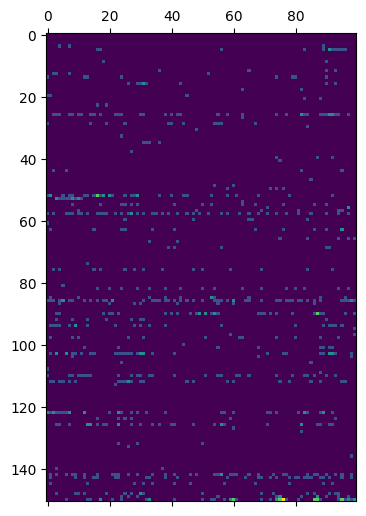

In [5]:
##Example raw neuron activity
mouse_recday=mouse_recdays[0]
print(mouse_recday)
session=0
Neuron_raw=np.load(f"{neuron_folder}/Neuron_raw_{mouse_recday}_{session}.npy")


print(np.shape(Neuron_raw))
plt.matshow(Neuron_raw[:,:100])


ah08_20250618_20250619
Exception: ah08_20250618_20250619_8.npy  not found
Exception: ah08_20250618_20250619_9.npy  not found
[0, 1, 2, 3, 4, 5, 6, 7]
Section of Raw data fed in - all neurons


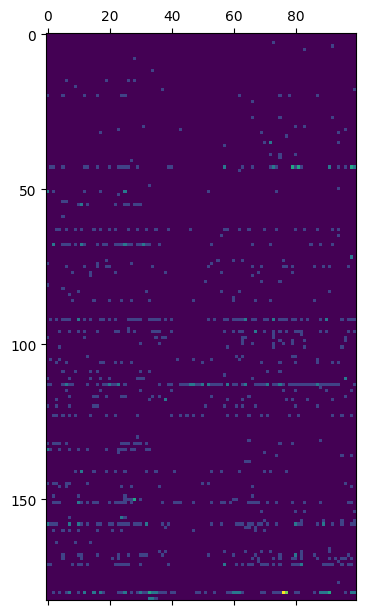

Section of Raw data fed in - all neurons


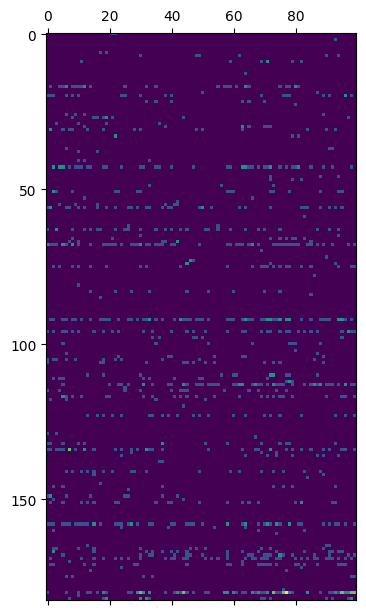

Section of Raw data fed in - all neurons


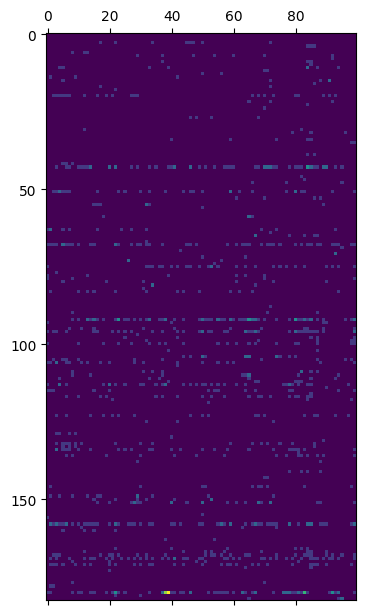

Section of Raw data fed in - all neurons


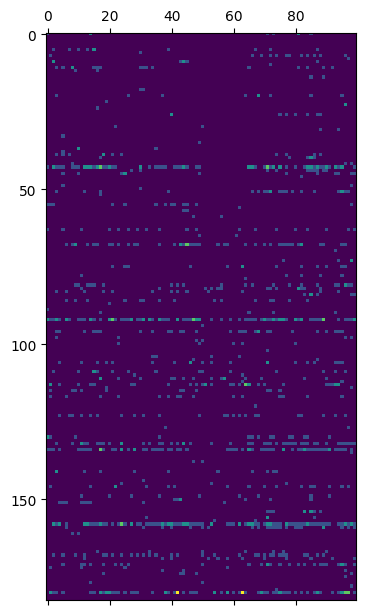

Section of Raw data fed in - all neurons


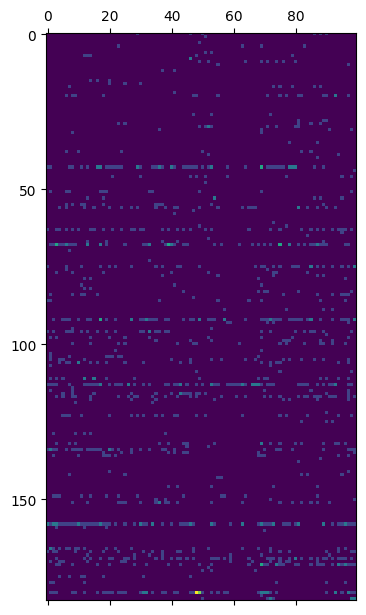

Section of Raw data fed in - all neurons


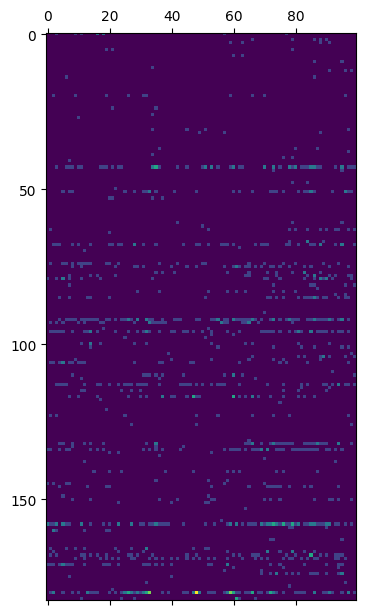

Section of Raw data fed in - all neurons


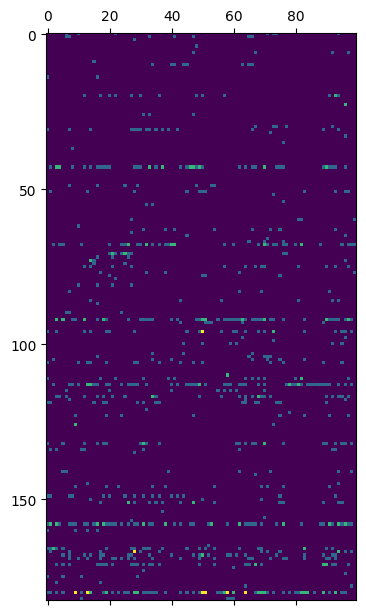

Section of Raw data fed in - all neurons


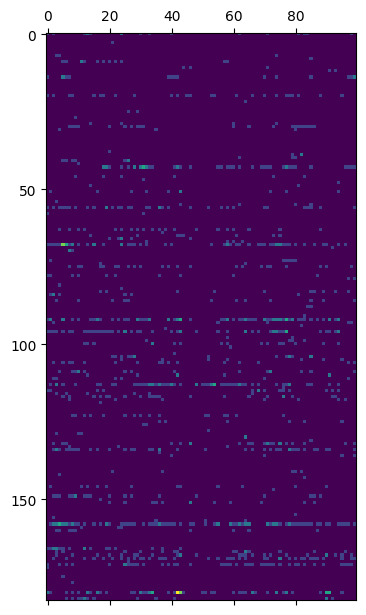

_____
Example output neuron
trials x normalised time bins
dashed lines represent reward times


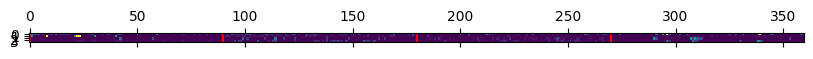

In [6]:
###Normalisation - i.e. how to get from array of raw firing rates and state times to
##normalised firing matrices

def get_sessions_temp(mouse_recday, Data_folder=neuron_folder):
    sessions_to_try = range(10)
    sessions = []
    for session in sessions_to_try:
        try:
            data_neurons = np.load(
                Data_folder + "/Neuron_raw_" + mouse_recday + "_" + str(session) + ".npy"
            )
            sessions.append(session)
        except:
            print("Exception: " + mouse_recday + "_" + str(session) + ".npy  not found")
        
    return sessions


def partition(alist, indices):
    """
    Partitions a list into sublists based on a list of indices.
    Returns a numpy array of the sublists with dtype=object to handle varying lengths.
    """
    return np.asarray([np.asarray(alist[i:j]) for i, j in zip(indices[:-1], indices[1:])], dtype=object)



###Example
mouse_recday="ah08_20250618_20250619"
print(mouse_recday)
norm_neurons_list = []
sessions = get_sessions_temp(mouse_recday)
print(sessions)
for session in sessions:
    Neuron_raw=np.load(f"{neuron_folder}/Neuron_raw_{mouse_recday}_{session}.npy")
    Trial_times=np.load(f"{trialtimes_folder}/trialtimes_{mouse_recday}_{session}.npy")
    num_trials=len(Trial_times)
    num_neurons=len(Neuron_raw)

    print('Section of Raw data fed in - all neurons')
    plt.matshow(Neuron_raw[:,:100])
    plt.show()

    ##Normalisation
    num_bins=90
    num_states=4
    num_phases=3

    Trial_times_conc=np.hstack((np.concatenate(Trial_times[:,:-1]),Trial_times[-1,-1])).astype(int)
    Neurons_norm=np.zeros((num_neurons,num_trials,num_bins*num_states))
    Neurons_norm[:]=np.nan
    for neuron in np.arange(num_neurons):
        Neuron_raw_neuron=Neuron_raw[neuron,:]
        Neuron_raw_neuron_split=partition(list(Neuron_raw_neuron), list(Trial_times_conc))
        Neuron_raw_neuron_split_norm=np.asarray([normalise(Neuron_raw_neuron_split[ii])\
                                                for ii in np.arange(len(Neuron_raw_neuron_split))])
        Neuron_norm=(Neuron_raw_neuron_split_norm.reshape(len(Neuron_raw_neuron_split_norm)//4,\
                                                        len(Neuron_raw_neuron_split_norm[0])*4))
        
        Neurons_norm[neuron]=Neuron_norm
    norm_neurons_list.append(Neurons_norm)

print('_____')
print('Example output neuron')
print('trials x normalised time bins')
print('dashed lines represent reward times')
###plotting example
neuron=0
fig, ax = plt.subplots(figsize=(10, 5))
cax = ax.matshow(Neurons_norm[neuron])
for angle in np.arange(4)*90:
    ax.axvline(angle,color='red',ls='dashed')
plt.show()

ValueError: x and y must have same first dimension, but have shapes (360,) and (1,)

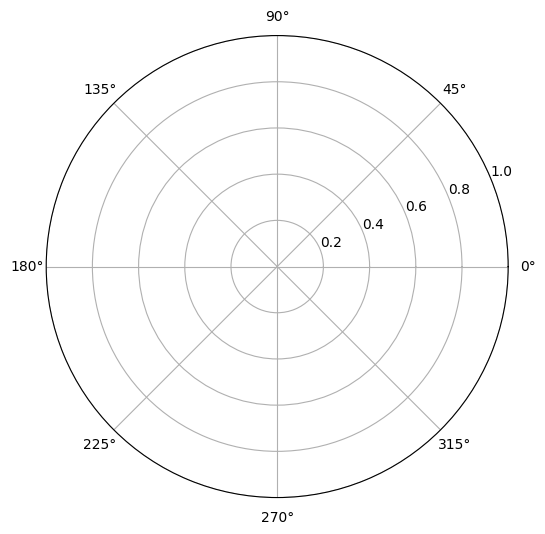

In [7]:
"""
For Yiying - preprocessing code to get from raw neuron activity to normalised firing rate matrices in trial progress bins.
assumes you have Trial_times and Neuron_raw arrays for a session, and that Trial_times is an array of shape (num_trials, num_states)
 with the time indices for each state transition in the trial, and Neuron_raw is an array of shape (num_neurons, total_time_points) with the raw firing rates of each neuron at each time point.

 
Important!!!
Your data should be truncates so that the first timebin of the ephys data is aligend to the first A
so trial 1 state a is 0 in trial_times. First column of the neural array should be the firing rate at time 0, which is the start of state A in trial 1. 
This way, when we partition the neural data using the trial times, we will get the correct segments of neural activity corresponding to each state in each trial.
"""



import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from scipy.stats import zscore, sem, entropy



def partition(alist, indices):
    """
    Partitions a list into sublists based on a list of indices.
    Returns a numpy array of the sublists with dtype=object to handle varying lengths.
    """
    return np.asarray([np.asarray(alist[i:j]) for i, j in zip(indices[:-1], indices[1:])], dtype=object)
def unroll_listoflists(l):
    flat_list = [item for sublist in l for item in sublist]
    return(flat_list)

def smooth_circ(xx, sigma=10, axis=0):
    x_smoothed = gaussian_filter1d(np.hstack((xx, xx, xx)), sigma, axis=axis)[
        len(xx) : int(len(xx) * 2)
    ]
    return x_smoothed
def std_err(data_neuron):
    return smooth_circ(sem(data_neuron, axis=0))



num_trials=len(Trial_times)
num_neurons=len(Neuron_raw)

num_bins=90
num_states=4
num_phases=3

Trial_times_conc=np.hstack((np.concatenate(Trial_times[:,:-1]),Trial_times[-1,-1])).astype(int)
Neurons_norm=np.zeros((num_neurons,num_trials,num_bins*num_states))
Neurons_norm[:]=np.nan
for neuron in np.arange(num_neurons):
    Neuron_raw_neuron=Neuron_raw[neuron,:]
    Neuron_raw_neuron_split=partition(list(Neuron_raw_neuron), list(Trial_times_conc))
    Neuron_raw_neuron_split_norm=np.asarray([normalise(Neuron_raw_neuron_split[ii])\
                                            for ii in np.arange(len(Neuron_raw_neuron_split))])
    Neuron_norm=(Neuron_raw_neuron_split_norm.reshape(len(Neuron_raw_neuron_split_norm)//4,\
                                                    len(Neuron_raw_neuron_split_norm[0])*4))
    
    Neurons_norm[neuron]=Neuron_norm
    
Mean_norm = np.mean(Neuron_norm, axis=0)

Smoothed_norm = smooth_circ(Mean_norm)

Std_err_smooth= std_err(Neuron_norm)

############################################
# -------- POLAR PLOTTING CODE -------- #
############################################

# Total bins across full trial
total_bins = num_bins * num_states

# Circular angles for plotting
angles = np.linspace(0, 2 * np.pi, total_bins, endpoint=False)

for neuron_idx in range(num_neurons):


    neuron_data = Smoothed_norm[neuron_idx]

    error = Std_err_smooth[neuron_idx]


    fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(111, projection="polar")

    ax.plot(angles, neuron_data, linewidth=2)
    ax.fill_between(angles, neuron_data - error, neuron_data + error, alpha=0.3)

    # Optional: mark state boundaries
    state_boundaries = np.arange(0, total_bins, num_bins)
    for sb in state_boundaries:
        ax.plot(
            [angles[sb], angles[sb]],
            [0, np.nanmax(neuron_data)],
            linestyle="--",
            linewidth=1,
        )

    ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    ax.set_title(f"Neuron {neuron_idx} Polar Firing Rate", fontsize=14)

    plt.tight_layout()
    plt.show()

In [ ]:
def get_sessions_temp(mouse_recday, Data_folder=neuron_folder):
    
    sessions_to_try = range(10)
    sessions = []
    for session in sessions_to_try:
        try:
            data_neurons = np.load(
                Data_folder + "/Neuron_raw_" + mouse_recday + "_" + str(session) + ".npy"
            )
            sessions.append(session)
        except:
            print("Exception: " + mouse_recday + "_" + str(session) + ".npy  not found")
        
    return sessions

get_sessions_temp(mouse_recday)

Exception: ah08_20250618_20250619_8.npy  not found
Exception: ah08_20250618_20250619_9.npy  not found


[0, 1, 2, 3, 4, 5, 6, 7]

In [12]:
def partition(alist, indices):
    return np.asarray([np.asarray(alist[i:j]) for i, j in zip(indices[:-1], indices[1:])])

def normalise(xx,num_bins=90,take_max=False):
    lenxx=len(xx)
    if lenxx<num_bins:
        xx=np.repeat(xx,10)/10
        lenxx=lenxx*10
    indices_polar=np.arange(lenxx)
    if take_max==True:
        normalized_xx=st.binned_statistic(indices_polar,xx, 'max', bins=num_bins)[0]
    else:
        normalized_xx=st.binned_statistic(indices_polar,xx, 'mean', bins=num_bins)[0]
    return(normalized_xx)

def raw_to_norm(raw_neuron,Trial_times_conc,num_states=4,return_mean=True,smoothing=True,\
                take_max=False,smoothing_sigma=10):
    raw_neuron_split=remove_empty(partition(list(raw_neuron),list(Trial_times_conc)))
    if len(raw_neuron_split)%num_states!=0:
        raw_neuron_split=raw_neuron_split[:len(raw_neuron_split)-len(raw_neuron_split)%num_states]
    
    if take_max==True:
        raw_neuron_split_norm=np.asarray([normalise(raw_neuron_split[ii],take_max=True)\
                                          for ii in np.arange(len(raw_neuron_split))])
    else:
        raw_neuron_split_norm=np.asarray([normalise(raw_neuron_split[ii]) for ii in np.arange(len(raw_neuron_split))])
    
    Actual_norm=(raw_neuron_split_norm.reshape(len(raw_neuron_split_norm)//num_states,\
                                               len(raw_neuron_split_norm[0])*num_states))
    
    if return_mean==True:
        Actual_norm_mean=np.nanmean(Actual_norm,axis=0)
        if smoothing==True:
            Actual_norm_smoothed=smooth_circular(Actual_norm_mean,sigma=smoothing_sigma)
            return(Actual_norm_smoothed)
        else:
            return(Actual_norm_mean)
    else:
        return(Actual_norm)
    


# def get_sessions(mouse_recday, Data_folder=Data_folder):
    
#     Tasks = np.load(Data_folder + "Task_data_" + mouse_recday + ".npy")
#     sessions_to_try = range(len(Tasks))
#     sessions = []
#     for session in sessions_to_try:
#         try:
#             data_neurons = np.load(
#                 Data_folder + "Neuron_" + mouse_recday + "_" + str(session) + ".npy"
#             )
#             sessions.append(session)
#         except:
#             print("Exception: " + mouse_recday + "_" + str(session) + ".npy  not found")
        
#     return sessions, Tasks

def unroll_listoflists(l):
    flat_list = [item for sublist in l for item in sublist]
    return(flat_list)

def smooth_circ(xx, sigma=10, axis=0):
    x_smoothed = gaussian_filter1d(np.hstack((xx, xx, xx)), sigma, axis=axis)[
        len(xx) : int(len(xx) * 2)
    ]
    return x_smoothed

def mean_neuron_session(data_neuron):
    
    return np.mean(data_neuron, 0)

def std_err(data_neuron):
    return smooth_circ(sem(data_neuron, axis=0))

def occupency_map(raw_locs, maze_mat, place_plot):
    occupency_map = maze_mat.copy()
    for i in range(1,22):
        occupency_map[place_plot[i]]=np.sum(raw_locs==i)
        
    return occupency_map

def spikes_in_place_map(raw_spikes, raw_locs, maze_mat, place_plot):
    max_ind = min(len(raw_spikes), len(raw_locs))
    spikes_map=maze_mat.copy()
    raw_locs = raw_locs[:max_ind]
    raw_spikes = raw_spikes[:max_ind]
    for i in range(1,22):
        locs_ = raw_locs==i
        spikes_ = np.sum(raw_spikes[locs_])
        spikes_map[place_plot[i]] = spikes_
        
    return(spikes_map)

def place_map(raw_spikes, raw_locs, maze_mat, place_plot):
    occupency_ = occupency_map(raw_locs, maze_mat, place_plot)
    spikes_in_place_ = spikes_in_place_map(raw_spikes, raw_locs, maze_mat, place_plot)
    place_map = np.divide(spikes_in_place_, occupency_)
    return(place_map)
    

def get_raster_arrays(raw_spikes_state):
    spike_events_ = [np.where(raw_spikes_state[i]>0)[0] for i in range(len(raw_spikes_state))]
    trial_len_ = np.asarray([[len(raw_spikes_state[i])] for i in range(len(raw_spikes_state))])
    return spike_events_, trial_len_

def get_data_for_state(Neuron_raw, Location_raw, state, trial_times):

    Neuron_state = []
    Location_state = []
    Neuron_state_pertrial = []
    state_dic = {
        'A': 0,
        'B': 1,
        'C': 2,
        'D': 3
    }
    
    for trial in trial_times:
        trial_inds = (trial/25).astype(int) # 25 is scaling factor between tria samling rate and neuron/locs sampling rate
        state_inds = [trial_inds[state_dic[state]], trial_inds[state_dic[state]+1]]

        neuron_ = Neuron_raw[state_inds[0]:state_inds[1]]
        locs_ = Location_raw[state_inds[0]:state_inds[1]]
        Neuron_state.extend(neuron_)
        Neuron_state_pertrial.append(neuron_)
        Location_state.extend(locs_)
        
    Neuron_state_arr = np.array(Neuron_state)
    Location_state_arr = np.array(Location_state)    
        
    return Neuron_state_arr, Location_state_arr, Neuron_state_pertrial


def get_max_time(raster, conversion=40):
    max_time=0
    for i in raster:
        if len(i)>0:
            if max(i)>max_time:
                max_time=max(i)
    bins = np.array(list(range(max_time)))
    bins_s = bins/conversion
    ind_of_max_s = 0
    max_s = 0
    for i , j in enumerate(bins_s):
        if i%conversion==0:
            ind_of_max_s  = i
            max_s = j.astype(int)
    return max_time/conversion, bins, ind_of_max_s, max_s

def average_over_factor(m, factor):
    # Calculate the number of columns in the reshaped array
    new_columns = m.shape[1] // factor * factor

    # Pad the array with zeros to make the number of columns divisible by the factor
    padded_m = np.pad(m[:, :new_columns], ((0, 0), (0, factor - (new_columns % factor))), mode='constant')

    # Reshape the array to have 'factor' columns per block and flatten the last dimension
    reshaped_m = padded_m.reshape(m.shape[0], -1, factor)

    # Take the mean along the last axis (axis=-1) to get the average for each block
    result = np.mean(reshaped_m, axis=-1)

    return result


def sample_every_nth(matrix, n):
    """
    Sample every nth element of a numpy matrix.

    Parameters:
    - matrix: numpy array, input matrix (1D or 2D)
    - n: int, sampling interval

    Returns:
    - numpy array, sampled elements
    """
    if matrix.ndim == 1:
        return matrix[::n]
    elif matrix.ndim == 2:
        return matrix[:, ::n]
    else:
        raise ValueError("Input matrix must be either 1 or 2-dimensional")

def average_over_factor_1d(arr, factor):
    # Calculate the number of elements in the reshaped array
    new_length = len(arr) // factor * factor

    # Pad the array with zeros to make the length divisible by the factor
    padded_arr = np.pad(arr[:new_length], (0, factor - (new_length % factor)), mode='constant')

    # Reshape the array to have 'factor' elements per block
    reshaped_arr = padded_arr.reshape(-1, factor)

    # Take the mean along the last axis (axis=-1) to get the average for each block
    result = np.mean(reshaped_arr, axis=-1)

    return result


def smooth_and_calculate_scalar_derivatives(data_matrix, sigma=3, dt=1.0):
    # Assuming data_matrix is an nx2 array with x and y positions

    # Separate x and y columns
    x_positions = data_matrix[:, 0]
    y_positions = data_matrix[:, 1]

    # Smooth the data using 1D Gaussian filter
    x_smoothed = gaussian_filter1d(x_positions, sigma=sigma)
    y_smoothed = gaussian_filter1d(y_positions, sigma=sigma)

    
    # Calculate speeds (first derivative) and magnitudes
    vx = np.gradient(x_smoothed, dt)
    vy = np.gradient(y_smoothed, dt)
    speed = np.sqrt(vx**2 + vy**2)

    # calculate acceleration
    acceleration = np.gradient(speed, dt)
    # Combine results into a single array
    smoothed_data = np.column_stack((x_smoothed, y_smoothed, speed, acceleration))

    return smoothed_data

def build_mapping_dict():
    """
    Builds and returns a dictionary that maps node labels (node_1 through node_9)
    to integers 1-9, and edge labels (edge_1-2, edge_1-4, etc.) to integers 10-21.
    
    Feel free to modify or expand the edges list if needed.
    """
    # 1) Node labels: "node_1" -> 1, "node_2" -> 2, ..., "node_9" -> 9
    mapping_dict = {}
    for i in range(1, 10):
        mapping_dict[f"node_{i}"] = i

    # 2) Define the list of edges you have in your maze
    #    For example, let's pretend we have 12 distinct edges total
    #    so that they map from 10 to 21 (12 edges). Adjust as needed.


    edges = [
        "1-2",  # corresponds to "edge_1-2"
        "2-3",
        "1-4",
        "2-5",
        "3-6",
        "4-5",
        "5-6",
        "4-7",
        "5-8",
        "6-9",
        "7-8",
        "8-9",
    ]

    # 3) Starting from integer 10 for edges. We create keys of the form "edge_1-2"
    start_value = 10
    for idx, edge in enumerate(edges, start=start_value):
        mapping_dict[f"edge_{edge}"] = idx

    return mapping_dict


def convert_label_to_int(label, mapping):
    """
    Given a label (e.g., 'node_4' or 'edge_1-2') and a mapping dictionary,
    returns the corresponding integer code.
    """
    if pd.isna(label) or label == 'nan':
        return np.nan
    # Otherwise, look up in the mapping dictionary
    if label not in mapping:
        raise ValueError(f"Label '{label}' not found in mapping dictionary.")
    return mapping[label]
    # if label not in mapping:
    #     raise ValueError(f"Label '{label}' not found in the mapping dictionary.")
    # return mapping[label]


def compute_task_state_arrays(trial_times, num_bins=3):
    """
    Computes state_array, goal_progress_array, goal_progress_binned,
    time_from_last_reward, and time_to_next_reward based on trial_times.

    Parameters:
        trial_times (numpy.ndarray): An array of shape (num_states, num_trials)
                                        containing timestamps of task state onsets.
        num_bins (int): Number of bins for goal_progress_binned.

    Returns:
        state_array (numpy.ndarray): Categorical array of active task state.
        goal_progress_array (numpy.ndarray): Float array of progress between states.
        goal_progress_binned (numpy.ndarray): Binned categorical version of progress.
        time_from_last_reward (numpy.ndarray): Time since the last state onset.
        time_to_next_reward (numpy.ndarray): Time until the next state onset.
    """

    # Get maximum time index
    max_time = np.max(trial_times)
    num_states = trial_times.shape[1] - 1

    # Initialize output arrays
    state_array = np.zeros(max_time + 1, dtype=int)
    goal_progress_array = np.zeros(max_time + 1, dtype=float)
    goal_progress_binned = np.zeros(max_time + 1, dtype=int)
    time_from_last_reward = np.zeros(max_time + 1, dtype=int)
    time_to_next_reward = np.zeros(max_time + 1, dtype=int)

    # Flatten and sort trial_times to process them as events
    trial_times_sorted = np.sort(trial_times.flatten())  # Ensure sorted order
    # trial_times_sorted = trial_times_sorted[trial_times_sorted > 0]  # Remove zeros (if any)

    # Iterate over time bins to determine state and progress
    for i in range(len(trial_times_sorted) - 1):
        start_time = trial_times_sorted[i]
        end_time = trial_times_sorted[i + 1]

        # Skip if the start_time is the same as the end_time (to avoid double counting)
        if start_time == end_time:
            continue

        # Assign the state (i corresponds to the task state)
        state_array[start_time:end_time] = i % num_states

        # Compute progress between these two states
        time_range = np.arange(start_time, end_time)
        progress = (time_range - start_time) / (end_time - start_time)
        goal_progress_array[start_time:end_time] = progress

        # Convert to categorical bins
        goal_progress_binned[start_time:end_time] = np.floor(progress * num_bins).astype(int)

        # Compute time_from_last_reward (distance from last reward onset)
        time_from_last_reward[start_time:end_time] = time_range - start_time

        # Compute time_to_next_reward (distance to next reward onset)
        time_to_next_reward[start_time:end_time] = end_time - time_range

    # Assign the final state from the last timestamp onwards
    last_time = trial_times_sorted[-1]
    state_array[last_time:] = (len(trial_times_sorted) - 1) % num_states
    goal_progress_array[last_time:] = 1.0
    goal_progress_binned[last_time:] = num_bins - 1  # Final bin
    time_from_last_reward[last_time:] = np.arange(0, max_time - last_time + 1)
    time_to_next_reward[last_time:] = 0  # No future reward after last state

    return state_array, goal_progress_array, goal_progress_binned, time_from_last_reward, time_to_next_reward


def compute_distance_to_rewards(trial_times, speed_array):
    """
    Computes distance_from_last_reward and distance_to_next_reward
    based on integrating speed over time. This method uses
    cumulative sums and searchsorted, which avoids the pitfalls
    of manual forward/backward loops.

    Parameters
    ----------
    trial_times : np.ndarray
        An array of shape (num_states, num_trials) containing the
        timestamps of reward/task state onsets (in bins).
        Each entry must be an integer time bin.
    speed_array : np.ndarray
        A 1D array of speed values over time; speed_array[t] is
        the speed during the interval [t, t+1).

    Returns
    -------
    distance_from_last_reward : np.ndarray
        1D array where distance_from_last_reward[t] is the distance
        traveled since the last reward up to time bin t.
    distance_to_next_reward : np.ndarray
        1D array where distance_to_next_reward[t] is the distance
        that will be traveled from time t up to the next reward.
    """

    # 1) Flatten and sort the reward times
    reward_times = np.sort(trial_times.flatten())
    # Filter out any invalid or zero times if needed
    reward_times = reward_times[reward_times >= 0]  # or > 0 if you never want 0
    reward_times = np.unique(reward_times)          # ensure uniqueness

    # 2) Determine the maximum time so we can size our arrays
    max_time = int(reward_times[-1])  # last reward time
    # Optionally, if your session extends beyond the last reward by some margin,
    # you might know the total length T. In that case, use T-1 or T in place of max_time.
    # For example, if speed_array is length 1000, the maximum bin is 999:
    # max_time = len(speed_array) - 1

    # 3) Construct the cumulative distance array
    #    Let's define cumulative_distance[t] = distance traveled from time 0 up to (but not including) t.
    #    Hence, cumulative_distance has length = len(speed_array)+1 for convenience.
    #    We'll clip if needed so we don't exceed the length of speed_array.
    T = len(speed_array)
    cumulative_distance = np.zeros(T + 1)
    for i in range(1, T + 1):
        cumulative_distance[i] = cumulative_distance[i - 1] + speed_array[i - 1]

    # Prepare outputs; we'll fill up to T or max_time+1, whichever is smaller
    # If your session truly extends to T, we can do T as upper bound
    n_timepoints = min(T, max_time + 1)
    distance_from_last_reward = np.zeros(n_timepoints, dtype=float)
    distance_to_next_reward = np.zeros(n_timepoints, dtype=float)

    # 4) For each time t, figure out:
    #    - The index of the last reward <= t
    #    - The index of the next reward >= t

    for t in range(n_timepoints):
        # a) Find the reward index for the last reward <= t
        #    Using searchsorted with 'right' gives us the index where t would be inserted
        #    to keep order, so we subtract 1 to get the reward <= t
        idx_last = np.searchsorted(reward_times, t, side='right') - 1

        if idx_last < 0:
            # means t is before the first reward
            last_reward_time = 0
        else:
            last_reward_time = reward_times[idx_last]

        # b) Distance from last reward = cumulative_distance[t] - cumulative_distance[last_reward_time]
        #    We have to clip to ensure we don't go out of range
        t_clipped = min(t, T)
        last_clipped = min(last_reward_time, T)
        distance_from_last_reward[t] = (
            cumulative_distance[t_clipped] - cumulative_distance[last_clipped]
        )

        # c) Find the next reward >= t
        idx_next = np.searchsorted(reward_times, t, side='left')
        if idx_next >= len(reward_times):
            # no future rewards
            next_reward_time = t  # same time => zero distance
        else:
            next_reward_time = reward_times[idx_next]

        # d) Distance to next reward = cumulative_distance[next_reward_time] - cumulative_distance[t]
        next_clipped = min(next_reward_time, T)
        distance_to_next_reward[t] = (
            cumulative_distance[next_clipped] - cumulative_distance[t_clipped]
        )

    return distance_from_last_reward, distance_to_next_reward






In [13]:
mouse_recday

np.str_('ah08_20250613_20250615')

In [14]:
# data_dic = {}
# norm_neurons_dic = {}
# session_inds_dic = {}
# tasks_dic = {}

# def partition(alist, indices):
#     """
#     Partitions a list into sublists based on a list of indices.
#     Returns a numpy array of the sublists with dtype=object to handle varying lengths.
#     """
#     return np.asarray([np.asarray(alist[i:j]) for i, j in zip(indices[:-1], indices[1:])], dtype=object)

# for mouse_recday in mouse_recdays:
#     norm_neurons_list = []
#     session_inds = []
#     tasks = []
#     data_dic[mouse_recday] = {}
#     awake_inds = get_sessions_temp(mouse_recday, Data_folder=neuron_folder)
#     tasks_dic[mouse_recday] = {}
#     for session in range(12):  # this is the highest plausible number of sessions
#         neuron_file = f'{neuron_folder}/Neuron_raw_{mouse_recday}_{session}.npy'
#         trial_times_file = f'{trialtimes_folder}/trialtimes_{mouse_recday}_{session}.npy'
#         task_file = f'{trialtimes_folder}/Task_data_{mouse_recday}_{session}.npy'
#         data_dic[mouse_recday][session] = {}
#         print(f'{mouse_recday} session {session}')
        
#         if os.path.exists(neuron_file):
#             Neuron_raw = np.load(neuron_file)
#             print('found_neurons')
#             data_dic[mouse_recday][session]['Neuron_raw'] = Neuron_raw
#         else:
#             Neuron_raw = np.array([])  # Handle the case where Neuron_raw file does not exist
#             print('Neuron_raw file does not exist for this session')

#         if os.path.exists(task_file):
#             Task = np.load(task_file, allow_pickle=True)
#             tasks.append(Task)
#             data_dic[mouse_recday][session]['Task'] = Task
#             tasks_dic[mouse_recday][session] = Task
#             print('found_task')



#         if os.path.exists(trial_times_file) and os.path.exists(neuron_file):
#             Trial_times = np.load(trial_times_file)
#             Trial_times_bins = (Trial_times).astype(int)
   
#             data_dic[mouse_recday][session]['Trial_times'] = Trial_times

            


            

#             num_trials = len(Trial_times) if Trial_times is not None else 0
#             data_dic[mouse_recday][session]['num_trials'] = num_trials
#             num_neurons = len(Neuron_raw)
#             data_dic[mouse_recday][session]['num_neurons'] = num_neurons

#             session_inds.append(session)

#             if Trial_times is not None and len(Trial_times) > 0 and num_neurons > 0:
#                 # Normalisation
#                 num_bins = 90
#                 num_states = 4
#                 num_phases = 3

#                 Trial_times_conc = np.hstack((np.concatenate(Trial_times[:, :-1]), Trial_times[-1, -1])).astype(int)
#                 Neurons_norm = np.zeros((num_neurons, num_trials, num_bins * num_states))
#                 Mean_norm = np.zeros((num_neurons, num_bins * num_states))
#                 Smoothed_norm = np.zeros((num_neurons, num_bins * num_states))
#                 Std_err_smooth = np.zeros((num_neurons, num_bins * num_states))

#                 Neurons_norm[:] = np.nan
#                 Mean_norm[:] = np.nan
#                 Smoothed_norm[:] = np.nan
#                 Std_err_smooth[:] = np.nan



#                 for neuron in np.arange(num_neurons):
#                     Neuron_raw_neuron = Neuron_raw[neuron, :]

#                     Neuron_raw_neuron_split = partition(list(Neuron_raw_neuron), list(Trial_times_conc))


#                     Neuron_raw_neuron_split_norm = np.asarray([normalise(Neuron_raw_neuron_split[ii])
#                                                                 for ii in np.arange(len(Neuron_raw_neuron_split))])


#                     Neuron_norm = (Neuron_raw_neuron_split_norm.reshape(len(Neuron_raw_neuron_split_norm) // 4,
#                                                                         len(Neuron_raw_neuron_split_norm[0]) * 4))

            

#                     Neurons_norm[neuron] = Neuron_norm

#                     Mean_norm[neuron] = np.mean(Neuron_norm, axis=0)

#                     Smoothed_norm[neuron] = smooth_circ(Mean_norm[neuron])

#                     Std_err_smooth[neuron] = std_err(Neuron_norm)
        

#                 print('normalised_neurons')

#                 data_dic[mouse_recday][session]['Neurons_norm'] = Neurons_norm
#                 norm_neurons_list.append(Neurons_norm)
#                 data_dic[mouse_recday][session]['Neurons_mean'] = np.mean(Neurons_norm, axis=1)
#                 data_dic[mouse_recday][session]['Mean_norm'] = Mean_norm
#                 data_dic[mouse_recday][session]['Smoothed_norm'] = Smoothed_norm
#                 data_dic[mouse_recday][session]['Std_err_smooth'] = Std_err_smooth
#                 print('session done')

#         else:
#             if os.path.exists(neuron_file):
#                 data_dic[mouse_recday][session]['Trial_times'] = None
#                 data_dic[mouse_recday][session]['num_trials'] = 0
#                 data_dic[mouse_recday][session]['num_neurons'] = len(Neuron_raw)
#                 print('no trials for this session')

#     norm_neurons_dic[mouse_recday] = norm_neurons_list
#     session_inds_dic[mouse_recday] = session_inds
#     # tasks_dic[mouse_recday] = tasks
# for mouse_recday in mouse_recdays:
#     # Iterate over a copy of the keys to allow for safe deletion
#     for session in list(data_dic[mouse_recday].keys()):
#         # Check if the session dictionary is empty
#         if not data_dic[mouse_recday][session]:
#             print(f'{mouse_recday} session {session} has no data keys, deleting.')
#             del data_dic[mouse_recday][session]

# # save data_dic to a file



In [15]:
import pickle
import os

# Define the folder where the processed data is saved
processed_data_folder = "../data/processed_data"

# Load the main data dictionary
with open(os.path.join(processed_data_folder, 'data_dic.pkl'), 'rb') as f:
    data_dic = pickle.load(f)

# Load the normalized neurons dictionary
with open(os.path.join(processed_data_folder, 'norm_neurons_dic.pkl'), 'rb') as f:
    norm_neurons_dic = pickle.load(f)

# Load the session indices dictionary
with open(os.path.join(processed_data_folder, 'session_inds_dic.pkl'), 'rb') as f:
    session_inds_dic = pickle.load(f)

# Load the tasks dictionary
with open(os.path.join(processed_data_folder, 'tasks_dic.pkl'), 'rb') as f:
    tasks_dic = pickle.load(f)

print(f"Loaded data dictionaries from {processed_data_folder}")


Loaded data dictionaries from ../data/processed_data


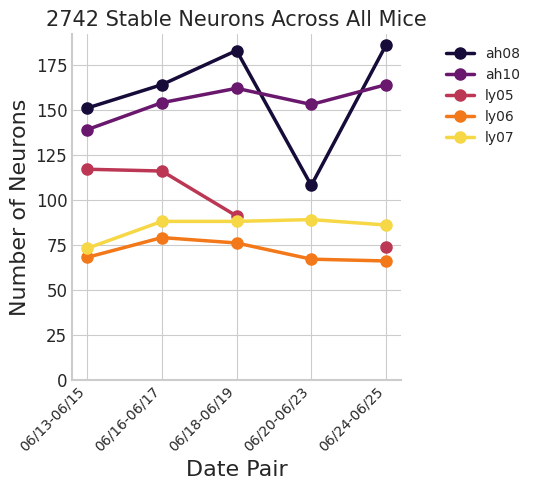

In [16]:
import pandas as pd
from collections import defaultdict
import seaborn as sns
import matplotlib.pyplot as plt

# Create a dictionary to hold the data for plotting
neuron_counts_by_mouse = defaultdict(lambda: defaultdict(int))
# Extract unique date pairs to define the x-axis categories
date_pairs = sorted(list(set(['_'.join(recday.split('_')[1:]) for recday in mouse_recdays])))

# Create a more readable label for each date pair
date_pair_labels = {}
for dp in date_pairs:
    d1, d2 = dp.split('_')
    # Format as MM/DD-MM/DD
    label = f"{d1[4:6]}/{d1[6:]}-{d2[4:6]}/{d2[6:]}"
    date_pair_labels[dp] = label

total = 0
# Iterate over each recording day
for mouse_recday in mouse_recdays:
    # Extract mouse ID and the date pair string
    parts = mouse_recday.split('_')
    mouse_id = parts[0]
    date_pair_str = '_'.join(parts[1:])
    
    # Get the number of neurons for this recording day
    if data_dic.get(mouse_recday) and data_dic[mouse_recday]:
        first_session_key = next(iter(data_dic[mouse_recday]))
        num_neurons = data_dic[mouse_recday][first_session_key].get('num_neurons', 0)
        
        # Store the neuron count for the corresponding mouse and date pair
        neuron_counts_by_mouse[mouse_id][date_pair_str] = num_neurons
        total += num_neurons

# Create the plot
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax = plt.subplots(figsize=(6, 5))

# Get the list of formatted labels for the x-axis ticks
xtick_labels = [date_pair_labels[dp] for dp in date_pairs]
# Get the 'inferno' colormap and create a color for each mouse
cmap = plt.get_cmap('inferno')
num_mice = len(neuron_counts_by_mouse)
colors = cmap(np.linspace(0.1, 0.9, num_mice))

# Plot the data for each mouse
for i, (mouse_id, data) in enumerate(neuron_counts_by_mouse.items()):
    # Create a list of counts ordered by the date_pairs list
    counts = [data.get(dp, np.nan) for dp in date_pairs] # Use np.nan for missing data
    ax.plot(range(len(date_pairs)), counts, marker='o', linestyle='-', label=mouse_id, markersize=8, linewidth=2.5, color=colors[i])

# Formatting the plot
ax.set_title(f'{total} Stable Neurons Across All Mice', fontsize=15)
ax.set_xlabel('Date Pair', fontsize=16)
ax.set_ylabel('Number of Neurons', fontsize=16)

# Set x-axis ticks and labels
ax.set_xticks(range(len(date_pairs)))
ax.set_xticklabels(xtick_labels, rotation=45, ha='right')

# Set y-axis to start at zero
ax.set_ylim(bottom=0)

# Increase font size for legend and ticks
ax.legend(title='Mouse ID', fontsize=12, title_fontsize=14)
# move legend to the right outside of the plot
# needs to be further right
ax.legend(bbox_to_anchor=(1.4, 1), loc='upper right')
plt.yticks(fontsize=12)

# Make axis lines thicker
ax.spines['left'].set_linewidth(1.5)
ax.spines['bottom'].set_linewidth(1.5)

plt.tight_layout()
sns.despine()
# plt.savefig('../data/figures/neuron_counts_by_mouse_and_datepair.pdf', dpi=300, bbox_inches='tight')
plt.show()

In [17]:
plot = False
# Function to compute entropy
def compute_entropy(distribution):
    probabilities = distribution / np.sum(distribution)  # Normalize to probabilities
    return entropy(probabilities)

# Function to perform permutation test and return null distribution
def permutation_test_with_visualization(original_entropy, session_data_whole, n_permutations=1000):
    permuted_entropies = []
    num_trials = session_data_whole.shape[0]
    num_bins = session_data_whole.shape[1]
    session_data_whole = session_data_whole.flatten()
    for _ in range(n_permutations):
        shift = np.random.randint(0,len(session_data_whole)-1)

        shuffled_firing_rate = np.roll(session_data_whole, shift)
        shuffled_firing_rate = np.mean(shuffled_firing_rate.reshape(num_trials, num_bins), axis=0)
        shuffled_firing_rate = shuffled_firing_rate/max(shuffled_firing_rate)
        # Divide shuffled firing rate into 4 bins and compute average for each
        shuffled_binned = [
            np.mean(shuffled_firing_rate[i:i + 90])
            for i in range(0, len(shuffled_firing_rate), 90)
        ]
        permuted_entropies.append(compute_entropy(shuffled_binned))
    # Return null distribution
    return permuted_entropies

# Parameters for permutation test
n_permutations = 100
significance_threshold = 0.05
n_timepoints = 360
# Analyze each neuron


binned_frs = {}
sig_neurons_dic = {}

for mouse_recday in mouse_recdays:
    sessions = list(data_dic[mouse_recday].keys())
    num_neurons  = data_dic[mouse_recday][sessions[0]]['num_neurons']
    binned_frs[mouse_recday] = {}
    significant_neurons = []  # Store indices of neurons that pass the test
    results = []  # Store data for visualization
    entropies = []

    for neuron_idx in range(num_neurons):
        binned_frs[mouse_recday][neuron_idx] = {}
        for session in sessions:
            try:

                if data_dic[mouse_recday][session]['num_trials'] < 2:
                    print('not enough trials for task 1, skipping')
                    continue
                if 'defaultdict' in str(data_dic[mouse_recday][session]['Task']):
                    print('no task for task 1, skipping)')
                    continue
            except:
                print('some issue with task data, skipping')
                continue
            session_data_whole = data_dic[mouse_recday][session]['Neurons_norm'][neuron_idx] 

            norm_firing_rate = data_dic[mouse_recday][session]['Neurons_mean'][neuron_idx] 


            # Step 3: Divide into 4 bins and compute average for each bin
            binned_firing_rate = [
                np.mean(norm_firing_rate[i:i + 90])
                for i in range(0, len(norm_firing_rate), 90)
            ]

            binned_frs[mouse_recday][neuron_idx][session] = binned_firing_rate
            print(binned_firing_rate)
            # Step 4: Calculate entropy of the binned distribution
            neuron_entropy = compute_entropy(binned_firing_rate)
            entropies.append(neuron_entropy)
            print(neuron_entropy)
            print('_____________')
            # Step 5: Perform permutation test
            # null_entropies = permutation_test_with_visualization(
            #     neuron_entropy, session_data_whole, n_permutations
            # )
            # Calculate p-value
            # p_value = np.mean(neuron_entropy > np.array(null_entropies))
            threshold_entropy = 1.35 # np.percentile(null_entropies, 5)  # 5th percentile

            significant = neuron_entropy < threshold_entropy  # Check for significance < threshold_entropy  # Check for significance
            # Step 6: Check significance
            if significant:
                significant_neurons.append(neuron_idx)
                results.append({
                    "session_idx": session,
                    "neuron_idx": neuron_idx,
                    "mean_firing_rate": norm_firing_rate,
                    "angles": np.linspace(0, 2 * np.pi, num=n_timepoints, endpoint=False),
                    "entropy": neuron_entropy,
                    # "null_entropies": null_entropies,
                    "threshold_entropy": threshold_entropy
                })
    sigx = list(set(significant_neurons))
    sigx.sort()
    sig_neurons_dic[mouse_recday] = sigx
    # Visualization
    for result in results:
        session_idx = result["session_idx"]
        neuron_idx = result["neuron_idx"]
        mean_firing_rate = result["mean_firing_rate"]
        angles = result["angles"]
        entropy_val = result["entropy"]
        # null_entropies = np.array(result["null_entropies"])  # Convert to NumPy array for processing
        threshold_entropy = result["threshold_entropy"]

        fr_data = data_dic[mouse_recday][session_idx]['Neurons_mean'][neuron_idx]
        std_err_neuron = data_dic[mouse_recday][session_idx]['Std_err_smooth'][neuron_idx]
                # Compute the mean firing rate across trials
     
        mean_firing_rates = data_dic[mouse_recday][session_idx]['Smoothed_norm'][neuron_idx]
        # Filter invalid values from null_entropies
        # valid_null_entropies = null_entropies[np.isfinite(null_entropies)]

        # # Plotting
        # if plot:
        #     fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        #     # Plot 1: Polar line plot of mean firing rate
        #     ax1 = fig.add_subplot(121, projection="polar")
        #     ax1.plot(angles, mean_firing_rates, label=f"Neuron {neuron_idx} (Session {session_idx})")
        #     ax1.set_title("Polar Line Plot", fontsize=14)
        #     ax1.set_theta_zero_location("N")
        #     ax1.set_theta_direction(-1)

        #     # Plot 2: Null distribution of entropy
        #     ax2 = fig.add_subplot(122)
        #     if valid_null_entropies.size > 0:  # Check if there are valid values
        #         ax2.hist(valid_null_entropies, bins=30, alpha=0.7, color="grey", label="Null Distribution")
        #         ax2.axvline(entropy_val, color="red", linestyle="--", linewidth=2, label="Actual Entropy")
        #         ax2.axvline(threshold_entropy, color="green", linestyle="--", linewidth=2, label="Threshold")
        #         ax2.set_title("Null Distribution of Entropy", fontsize=14)
        #         ax2.set_xlabel("Entropy")
        #         ax2.set_ylabel("Frequency")
        #         ax2.legend()
        
        #     else:
        #         ax2.text(0.5, 0.5, "No valid null entropies", fontsize=14, ha='center')
        #     plt.suptitle(f"Neuron {neuron_idx+1} (Session {session_idx}: {binned_frs[mouse_recday][neuron_idx][session_idx]}", fontsize=16)
        #     plt.tight_layout()
        #     plt.show()


[np.float64(0.027225552225552226), np.float64(0.023279430408042413), np.float64(0.023548554820900108), np.float64(0.023962418300653595)]
1.3842349366821365
_____________
[np.float64(0.03156055630193562), np.float64(0.04623330445455202), np.float64(0.02711368878035545), np.float64(0.032267962528446055)]
1.3654784658407806
_____________
[np.float64(0.026936561907273414), np.float64(0.03497464768118535), np.float64(0.03173280423280423), np.float64(0.01923307111831702)]
1.3632307598343507
_____________
[np.float64(0.01775877469400361), np.float64(0.01821747605729299), np.float64(0.03138751236449447), np.float64(0.01288888888888889)]
1.3312386800994966
_____________
[np.float64(0.0016594516594516595), np.float64(0.0008574882797968259), np.float64(0.001561124061124061), np.float64(0.005739470966743694)]
1.119626139749872
_____________
[np.float64(0.0012648202999080188), np.float64(0.0018829260099101368), np.float64(0.002098765432098765), np.float64(0.0007463396881386299)]
1.3189606163628063


not enough trials for task 1, skipping
[0, 1, 2, 4, 5, 6]
not enough trials for task 1, skipping
[0, 1, 2, 4, 5, 6]
[0, 1, 2, 4, 5, 6]
not enough trials for task 1, skipping
[0, 1, 2, 4, 5, 6]
not enough trials for task 1, skipping
not enough trials for task 1, skipping
not enough trials for task 1, skipping
not enough trials for task 1, skipping
not enough trials for task 1, skipping
not enough trials for task 1, skipping
not enough trials for task 1, skipping
[0, 2, 6, 7]
[0, 1, 2, 4, 5, 6]
[0, 1, 2, 4, 5, 6]
[0, 1, 2, 4, 5, 6]
[0, 1, 2, 4, 5, 6]
not enough trials for task 1, skipping
not enough trials for task 1, skipping
not enough trials for task 1, skipping
not enough trials for task 1, skipping
[0, 2, 3, 6, 7, 8]
[0, 1, 2, 4, 5, 6]
[0, 1, 2, 4, 5, 6]
not enough trials for task 1, skipping
not enough trials for task 1, skipping
[0, 1, 2, 4, 5]
not enough trials for task 1, skipping
not enough trials for task 1, skipping
not enough trials for task 1, skipping
not enough trials for

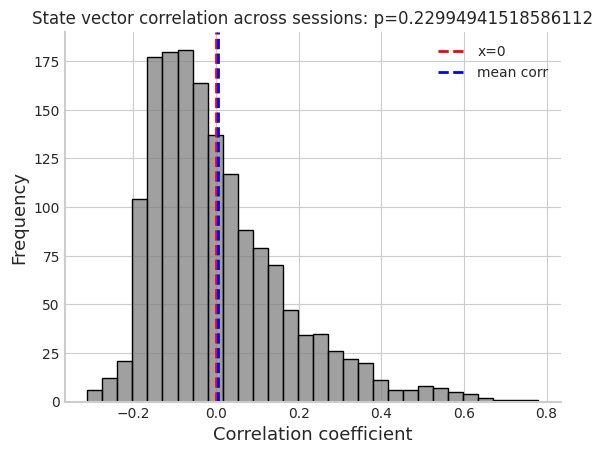

In [18]:

valid_sessions_dic = {}
all_neuron_correlations=[]
for mouse_recday in mouse_recdays:
    valid_sessions = []
    tasks = []
    for session in list(data_dic[mouse_recday].keys()):
        if session == 'valid_sessions':
            continue
        if data_dic[mouse_recday][session]['num_trials'] < 2:
            print('not enough trials for task 1, skipping')
            continue
        if 'defaultdict' in str(data_dic[mouse_recday][session]['Task']):
            print('no task, skipping)')
            continue
        if not any(np.array_equal(data_dic[mouse_recday][session]['Task'], candidate) for candidate in tasks):
            tasks.append(data_dic[mouse_recday][session]['Task'])
            valid_sessions.append(session)
    # data_dic[mouse_recday]['valid_sessions'] = valid_sessions
    sig_neurons = sig_neurons_dic[mouse_recday]
    print(valid_sessions)
    valid_sessions_dic[mouse_recday] = valid_sessions
    for neuron_idx in sig_neurons:
            corrs = []
            for i, session1_idx in enumerate(valid_sessions[:-1]):
                for session2_idx in valid_sessions[i+1:]:

                    binned_firing_rate1 = zscore(binned_frs[mouse_recday][neuron_idx][session1_idx])
                    
                    binned_firing_rate2 = zscore(binned_frs[mouse_recday][neuron_idx][session2_idx])


                    correlation = np.corrcoef(binned_firing_rate1, binned_firing_rate2)[0, 1]
                    corrs.append(correlation)
        
            all_neuron_correlations.append(np.mean(corrs))

t_stat, p_value = stats.ttest_1samp(all_neuron_correlations, 0)
mean_corr = np.mean(all_neuron_correlations)
fig, ax = plt.subplots()
sns.histplot(all_neuron_correlations, kde=False, color="grey", bins=30)
sns.despine()

# Increase line thickness
plt.tick_params(axis='both', which='major', width=2)  # Increase thickness of the ticks

# Increase tick size
plt.tick_params(axis='both', which='major', labelsize=10)  # Increase 
# Add a red vertical line at x=0
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='x=0')
plt.axvline(x=mean_corr, color='blue', linestyle='--', linewidth=2, label='mean corr')
plt.gca().spines['left'].set_linewidth(1.5)  # Make y-axis thicker
plt.gca().spines['bottom'].set_linewidth(1.5)  
# Add labels and legend
plt.xlabel('Correlation coefficient', fontsize=13)
plt.ylabel('Frequency', fontsize=13)
plt.title(f'State vector correlation across sessions: p={p_value}')
plt.legend()
# plt.savefig('../data/figures/remapping_correlations.pdf', dpi=300) 
# Show the plot
plt.show()


In [19]:
preprocessed_folder = "../data/preprocessed/ephys"
mouse_recday = 'ly07_20250624_20250625'
# The following paths are examples and will be constructed dynamically in the function.
# single_units = "../data/preprocessed/ephys/ly07/2025-06-24_2025-06-25_preprocessed/kilosort_output/QC_single_units.npy"
# unit_list = "../data/preprocessed/ephys/ly07/2025-06-24_2025-06-25_preprocessed/kilosort_output/cluster_reports/unit list.csv"
# channel_locs = "../data/preprocessed/ephys/ly07/2025-06-24_2025-06-25_preprocessed/kilosort_output/sorter_output/channel_positions.npy"

def find_LEC_units(mouse_recday, preprocessed_folder, max_y_lec=200):
    """
    Identifies LEC units based on the provided mouse_recday and preprocessed folder.
    Returns a list of unit IDs corresponding to LEC units.
    - Extracts mouse ID and recday from mouse_recday.
    - Restructures date to yyyy-mm-dd_yyyy-mm-dd format.
    - Finds single_units file.
    - Loads unit list csv.
    - Finds channel locations file.
    - Identifies LEC channels based on x and y coordinates.
    - Produces npy array of length single_units with 1 for LEC units and 0 for non-LEC units.
    - In unit_list, finds the channel for each unit in single_units.
    - unit_id and max_on_channel_id are columns in unit_list.
    - channel ID corresponds to index in channel_locs and is structured e.g., CH0, CH1, etc.
    - channel_locs is [x, y] coordinates for each channel.
    - If mouse == 'ah08', max Y coordinate of LEC is 350.
    - Else, max Y coordinate of LEC is 200.
    """
    # 1. Parse mouse_recday to get mouse_id and formatted date
    parts = mouse_recday.split('_')
    mouse_id = parts[0]
    date1, date2 = parts[1], parts[2]
    rec_date_formatted = f"{date1[:4]}-{date1[4:6]}-{date1[6:]}_{date2[:4]}-{date2[4:6]}-{date2[6:]}"

    # 2. Construct file paths
    base_path = os.path.join(preprocessed_folder, mouse_id, f"{rec_date_formatted}_preprocessed", "kilosort_output")
    single_units_file = os.path.join(base_path, "QC_single_units.npy")
    unit_list_file = os.path.join(base_path, "cluster_reports", "unit list.csv")
    channel_locs_file = os.path.join(base_path, "sorter_output", "channel_positions.npy")

    # 3. Load the data
    try:
        single_units = np.load(single_units_file)
        unit_df = pd.read_csv(unit_list_file, sep='\t')
        channel_locs = np.load(channel_locs_file)
    except FileNotFoundError as e:
        print(f"Error loading files for {mouse_recday}: {e}")
        return np.array([])



    # 5. Create a mapping from unit_id to its max channel
    # Corrected column name from 'cluster_id' to 'unit_id'
    unit_to_channel = unit_df.set_index('unit_id')['max_on_channel_id'].to_dict()

    # 6. Identify LEC units
    LEC_units = []
    for unit_id in single_units:
        if unit_id in unit_to_channel:
            channel_str = unit_to_channel[unit_id]
            try:
                # Extract channel index from string like 'CH123'
                channel_idx = int(re.search(r'\d+', channel_str).group())
                
                # Check if the channel index is valid
                if 0 <= channel_idx < len(channel_locs):
                    # Get y-coordinate and check if it's in LEC
                    y_coord = channel_locs[channel_idx][1]
                    if y_coord <= max_y_lec:
                        LEC_units.append(1)
                    else:
                        LEC_units.append(0)
                else:
                    LEC_units.append(0) # Invalid channel index
            except (AttributeError, ValueError):
                LEC_units.append(0) # Channel string format is unexpected
        else:
            LEC_units.append(0) # Unit not found in the list

    return np.array(LEC_units)

# Example usage:
LEC_units_mask = find_LEC_units(mouse_recday, preprocessed_folder, max_y_lec=200)
print(f"Found {np.sum(LEC_units_mask)} LEC units out of {len(LEC_units_mask)} total single units for {mouse_recday}.")
print(LEC_units_mask)

Found 14 LEC units out of 86 total single units for ly07_20250624_20250625.
[0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 1 1 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0]


LEC units mask length 151 matches number of neurons 151 for ah08_20250613_20250615.
After LEC filtering, 123 significant neurons remain for ah08_20250613_20250615.
LEC units mask length 164 matches number of neurons 164 for ah08_20250616_20250617.
After LEC filtering, 130 significant neurons remain for ah08_20250616_20250617.
LEC units mask length 183 matches number of neurons 183 for ah08_20250618_20250619.
After LEC filtering, 136 significant neurons remain for ah08_20250618_20250619.
LEC units mask length 108 matches number of neurons 108 for ah08_20250620_20250623.
After LEC filtering, 79 significant neurons remain for ah08_20250620_20250623.
LEC units mask length 186 matches number of neurons 186 for ah08_20250624_20250625.
After LEC filtering, 124 significant neurons remain for ah08_20250624_20250625.


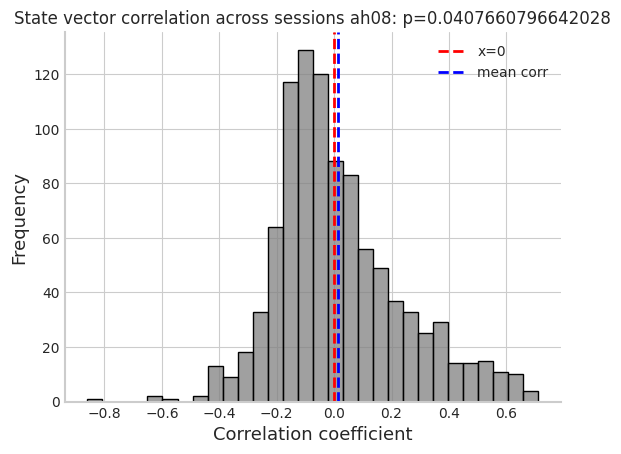

LEC units mask length 139 matches number of neurons 139 for ah10_20250613_20250615.
After LEC filtering, 80 significant neurons remain for ah10_20250613_20250615.
LEC units mask length 154 matches number of neurons 154 for ah10_20250616_20250617.
After LEC filtering, 84 significant neurons remain for ah10_20250616_20250617.
LEC units mask length 162 matches number of neurons 162 for ah10_20250618_20250619.
After LEC filtering, 93 significant neurons remain for ah10_20250618_20250619.
LEC units mask length 153 matches number of neurons 153 for ah10_20250620_20250623.
After LEC filtering, 90 significant neurons remain for ah10_20250620_20250623.
LEC units mask length 164 matches number of neurons 164 for ah10_20250624_20250625.
After LEC filtering, 90 significant neurons remain for ah10_20250624_20250625.


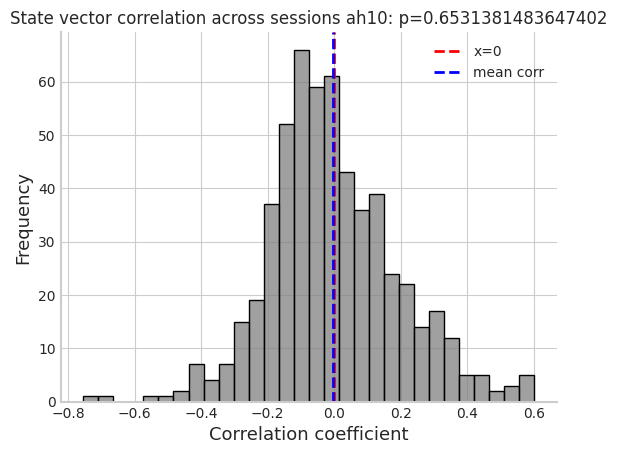

LEC units mask length 117 matches number of neurons 117 for ly05_20250613_20250615.
After LEC filtering, 77 significant neurons remain for ly05_20250613_20250615.
LEC units mask length 116 matches number of neurons 116 for ly05_20250616_20250617.
After LEC filtering, 68 significant neurons remain for ly05_20250616_20250617.
LEC units mask length 109 does NOT match number of neurons 91 for ly05_20250618_20250619. Skipping this mouse_recday.
LEC units mask length 74 matches number of neurons 74 for ly05_20250624_20250625.
After LEC filtering, 38 significant neurons remain for ly05_20250624_20250625.


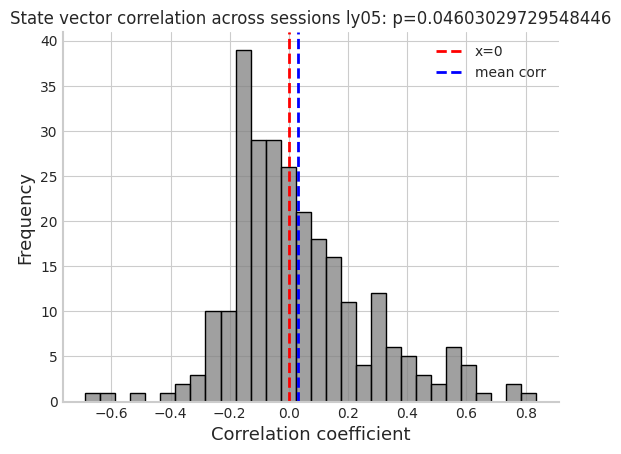

LEC units mask length 68 matches number of neurons 68 for ly06_20250613_20250615.
After LEC filtering, 29 significant neurons remain for ly06_20250613_20250615.
LEC units mask length 79 matches number of neurons 79 for ly06_20250616_20250617.
After LEC filtering, 37 significant neurons remain for ly06_20250616_20250617.
LEC units mask length 76 matches number of neurons 76 for ly06_20250618_20250619.
After LEC filtering, 26 significant neurons remain for ly06_20250618_20250619.
LEC units mask length 67 matches number of neurons 67 for ly06_20250620_20250623.
After LEC filtering, 30 significant neurons remain for ly06_20250620_20250623.
LEC units mask length 66 matches number of neurons 66 for ly06_20250624_20250625.
After LEC filtering, 22 significant neurons remain for ly06_20250624_20250625.


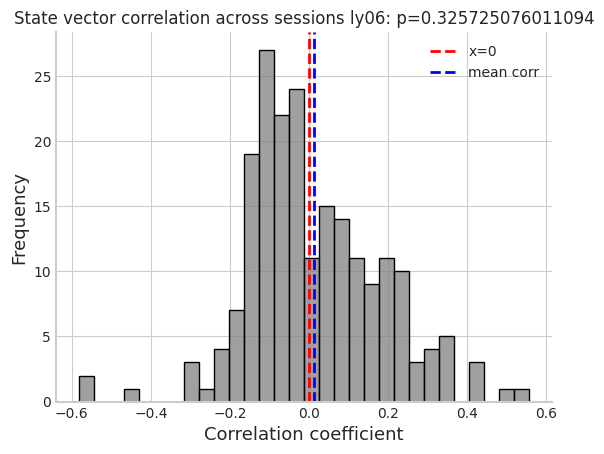

LEC units mask length 73 matches number of neurons 73 for ly07_20250613_20250615.
After LEC filtering, 29 significant neurons remain for ly07_20250613_20250615.
LEC units mask length 88 matches number of neurons 88 for ly07_20250616_20250617.
After LEC filtering, 40 significant neurons remain for ly07_20250616_20250617.
LEC units mask length 88 matches number of neurons 88 for ly07_20250618_20250619.
After LEC filtering, 30 significant neurons remain for ly07_20250618_20250619.
LEC units mask length 89 matches number of neurons 89 for ly07_20250620_20250623.
After LEC filtering, 29 significant neurons remain for ly07_20250620_20250623.
LEC units mask length 86 matches number of neurons 86 for ly07_20250624_20250625.
After LEC filtering, 39 significant neurons remain for ly07_20250624_20250625.


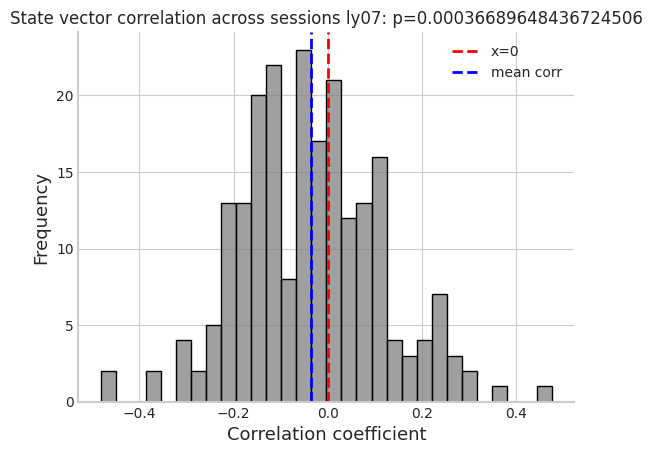

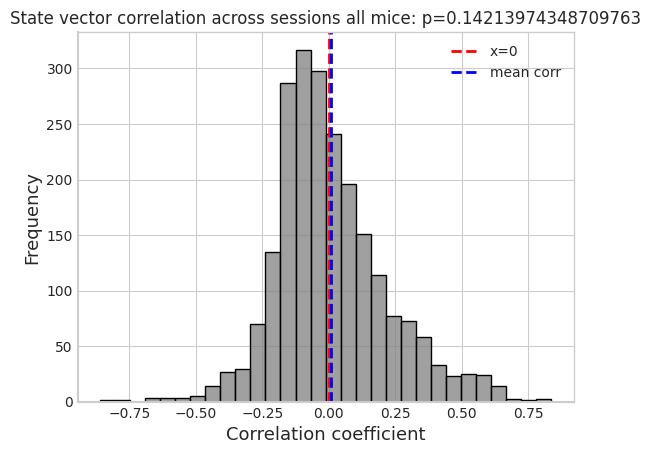

In [20]:

valid_sessions_dic = {}


max_y_lec_dic = {
    'ah08': 200,
    'ah10': 200,
    'ly05': 200,
    'ly06': 200,
    'ly07': 200
}

all_neuron_correlations_across_mice = []

mouse_corrs_dic = {}
sig_lec_neurons_dic = {}
for mouse in ['ah08', 'ah10', 'ly05', 'ly06', 'ly07']:
    all_neuron_correlations=[]
    for mouse_recday in mouse_recdays:
        if mouse not in mouse_recday:
            continue

        LEC_units_mask = find_LEC_units(mouse_recday, preprocessed_folder, max_y_lec_dic[mouse])

        # check if lec_units_mask is same length as number of neurons in data_dic
        if len(LEC_units_mask) == data_dic[mouse_recday][list(data_dic[mouse_recday].keys())[0]]['num_neurons']:
            print(f"LEC units mask length {len(LEC_units_mask)} matches number of neurons {data_dic[mouse_recday][list(data_dic[mouse_recday].keys())[0]]['num_neurons']} for {mouse_recday}.")
        else:
            print(f"LEC units mask length {len(LEC_units_mask)} does NOT match number of neurons {data_dic[mouse_recday][list(data_dic[mouse_recday].keys())[0]]['num_neurons']} for {mouse_recday}. Skipping this mouse_recday.")
            continue

        valid_sessions = []
        tasks = []
        
        for session in list(data_dic[mouse_recday].keys()):
            if session == 'valid_sessions':
                continue
            if data_dic[mouse_recday][session]['num_trials'] < 2:
                # print('not enough trials for task 1, skipping')
                continue
            if 'defaultdict' in str(data_dic[mouse_recday][session]['Task']):
                # print('no task, skipping)')
                continue
            if not any(np.array_equal(data_dic[mouse_recday][session]['Task'], candidate) for candidate in tasks):
                tasks.append(data_dic[mouse_recday][session]['Task'])
                valid_sessions.append(session)

        # data_dic[mouse_recday]['valid_sessions'] = valid_sessions
        sig_neurons = sig_neurons_dic[mouse_recday]
        sig_neurons_lec = [neuron for neuron in sig_neurons if neuron < len(LEC_units_mask) and LEC_units_mask[neuron] == 1]    
        if mouse_recday not in sig_lec_neurons_dic:
            sig_lec_neurons_dic[mouse_recday] = sig_neurons_lec
        LEC_neurons = [neuron for neuron in range(len(LEC_units_mask)) if LEC_units_mask[neuron] == 1]
        # LEC_neurons = [neuron for neuron in range(len(LEC_units_mask)) if LEC_units_mask[neuron] == 1]
        print(f'After LEC filtering, {len(sig_neurons)} significant neurons remain for {mouse_recday}.')
        valid_sessions_dic[mouse_recday] = valid_sessions

        for neuron_idx in sig_neurons_lec:
            corrs = []
            for i, session1_idx in enumerate(valid_sessions[:-1]):
                for session2_idx in valid_sessions[i+1:]:
                    # print(session1_idx, session2_idx)
                    binned_firing_rate1 = zscore(binned_frs[mouse_recday][neuron_idx][session1_idx])

                    binned_firing_rate2 = zscore(binned_frs[mouse_recday][neuron_idx][session2_idx])
                    # print(binned_firing_rate1-binned_firing_rate2)

                    correlation = np.corrcoef(binned_firing_rate1, binned_firing_rate2)[0, 1]
                    corrs.append(correlation)
            
                all_neuron_correlations.append(np.mean(corrs))
    all_neuron_correlations_across_mice.extend(all_neuron_correlations)
    
    mouse_corrs_dic[mouse] = all_neuron_correlations

    t_stat, p_value = stats.ttest_1samp(all_neuron_correlations, 0)
    mean_corr = np.mean(all_neuron_correlations)
    fig, ax = plt.subplots()
    sns.histplot(all_neuron_correlations, kde=False, color="grey", bins=30)
    sns.despine()

    # Increase line thickness
    plt.tick_params(axis='both', which='major', width=2)  # Increase thickness of the ticks

    # Increase tick size
    plt.tick_params(axis='both', which='major', labelsize=10)  # Increase 
    # Add a red vertical line at x=0
    plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='x=0')
    plt.axvline(x=mean_corr, color='blue', linestyle='--', linewidth=2, label='mean corr')
    plt.gca().spines['left'].set_linewidth(1.5)  # Make y-axis thicker
    plt.gca().spines['bottom'].set_linewidth(1.5)  
    # Add labels and legend
    plt.xlabel('Correlation coefficient', fontsize=13)
    plt.ylabel('Frequency', fontsize=13)
    plt.title(f'State vector correlation across sessions {mouse}: p={p_value}')
    plt.legend()
    plt.savefig(f'../data/figures/remapping_correlations_{mouse}.pdf', dpi=300) 
    # Show the plot
    plt.show()

# Now analyze all neurons across all mice
t_stat, p_value = stats.ttest_1samp(all_neuron_correlations_across_mice, 0)
mean_corr = np.mean(all_neuron_correlations_across_mice)
fig, ax = plt.subplots()
sns.histplot(all_neuron_correlations_across_mice, kde=False, color="grey", bins=30)
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='x=0')
plt.axvline(x=mean_corr, color='blue', linestyle='--', linewidth=2, label='mean corr')
plt.gca().spines['left'].set_linewidth(1.5)  # Make y-axis thicker
plt.gca().spines['bottom'].set_linewidth(1.5)  
# Add labels and legend
plt.xlabel('Correlation coefficient', fontsize=13)
plt.ylabel('Frequency', fontsize=13)
plt.title(f'State vector correlation across sessions all mice: p={p_value}')
plt.legend()
plt.show()

LEC units mask length 151 matches number of neurons 151 for ah08_20250613_20250615.
After LEC filtering, 123 significant neurons remain for ah08_20250613_20250615.
LEC units mask length 164 matches number of neurons 164 for ah08_20250616_20250617.
After LEC filtering, 130 significant neurons remain for ah08_20250616_20250617.
LEC units mask length 183 matches number of neurons 183 for ah08_20250618_20250619.
After LEC filtering, 136 significant neurons remain for ah08_20250618_20250619.
LEC units mask length 108 matches number of neurons 108 for ah08_20250620_20250623.
After LEC filtering, 79 significant neurons remain for ah08_20250620_20250623.
LEC units mask length 186 matches number of neurons 186 for ah08_20250624_20250625.
After LEC filtering, 124 significant neurons remain for ah08_20250624_20250625.


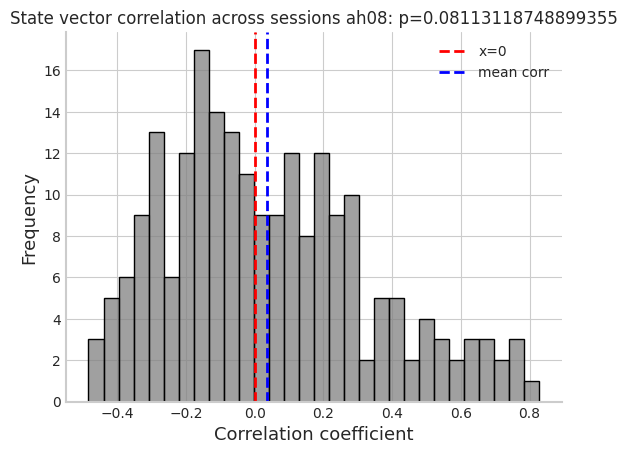

LEC units mask length 139 matches number of neurons 139 for ah10_20250613_20250615.
After LEC filtering, 80 significant neurons remain for ah10_20250613_20250615.
LEC units mask length 154 matches number of neurons 154 for ah10_20250616_20250617.
After LEC filtering, 84 significant neurons remain for ah10_20250616_20250617.
LEC units mask length 162 matches number of neurons 162 for ah10_20250618_20250619.
After LEC filtering, 93 significant neurons remain for ah10_20250618_20250619.
LEC units mask length 153 matches number of neurons 153 for ah10_20250620_20250623.
After LEC filtering, 90 significant neurons remain for ah10_20250620_20250623.
LEC units mask length 164 matches number of neurons 164 for ah10_20250624_20250625.
After LEC filtering, 90 significant neurons remain for ah10_20250624_20250625.


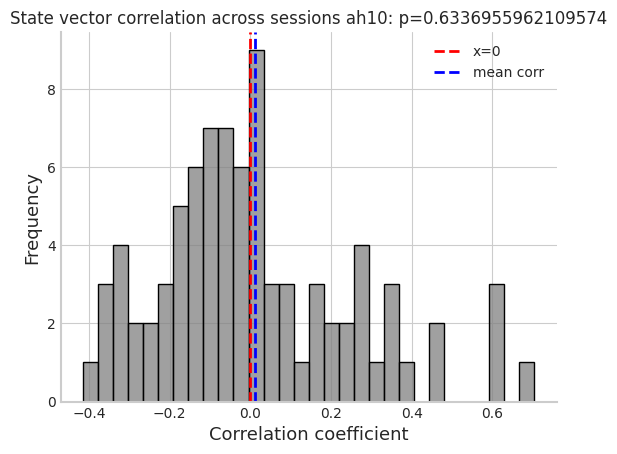

LEC units mask length 117 matches number of neurons 117 for ly05_20250613_20250615.
After LEC filtering, 77 significant neurons remain for ly05_20250613_20250615.
LEC units mask length 116 matches number of neurons 116 for ly05_20250616_20250617.
After LEC filtering, 68 significant neurons remain for ly05_20250616_20250617.
LEC units mask length 109 does NOT match number of neurons 91 for ly05_20250618_20250619. Skipping this mouse_recday.
LEC units mask length 74 matches number of neurons 74 for ly05_20250624_20250625.
After LEC filtering, 38 significant neurons remain for ly05_20250624_20250625.


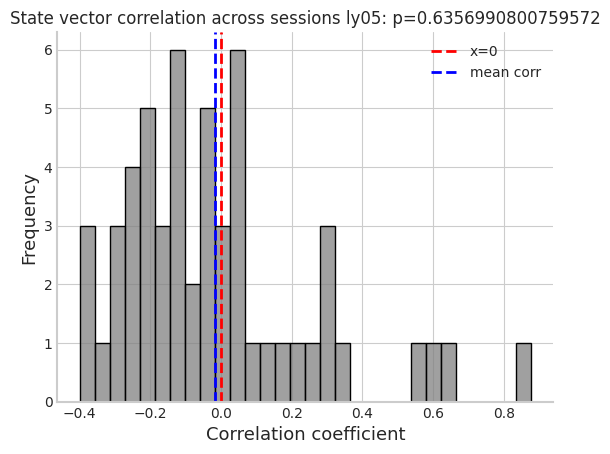

LEC units mask length 68 matches number of neurons 68 for ly06_20250613_20250615.
After LEC filtering, 29 significant neurons remain for ly06_20250613_20250615.
LEC units mask length 79 matches number of neurons 79 for ly06_20250616_20250617.
After LEC filtering, 37 significant neurons remain for ly06_20250616_20250617.
LEC units mask length 76 matches number of neurons 76 for ly06_20250618_20250619.
After LEC filtering, 26 significant neurons remain for ly06_20250618_20250619.
LEC units mask length 67 matches number of neurons 67 for ly06_20250620_20250623.
After LEC filtering, 30 significant neurons remain for ly06_20250620_20250623.
LEC units mask length 66 matches number of neurons 66 for ly06_20250624_20250625.
After LEC filtering, 22 significant neurons remain for ly06_20250624_20250625.


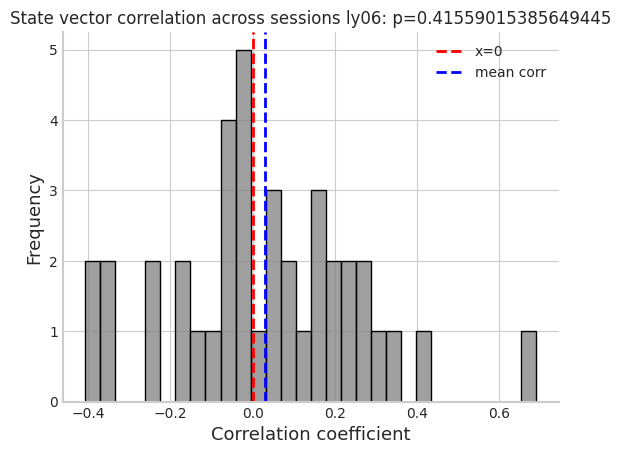

LEC units mask length 73 matches number of neurons 73 for ly07_20250613_20250615.
After LEC filtering, 29 significant neurons remain for ly07_20250613_20250615.
LEC units mask length 88 matches number of neurons 88 for ly07_20250616_20250617.
After LEC filtering, 40 significant neurons remain for ly07_20250616_20250617.
LEC units mask length 88 matches number of neurons 88 for ly07_20250618_20250619.
After LEC filtering, 30 significant neurons remain for ly07_20250618_20250619.
LEC units mask length 89 matches number of neurons 89 for ly07_20250620_20250623.
After LEC filtering, 29 significant neurons remain for ly07_20250620_20250623.
LEC units mask length 86 matches number of neurons 86 for ly07_20250624_20250625.
After LEC filtering, 39 significant neurons remain for ly07_20250624_20250625.


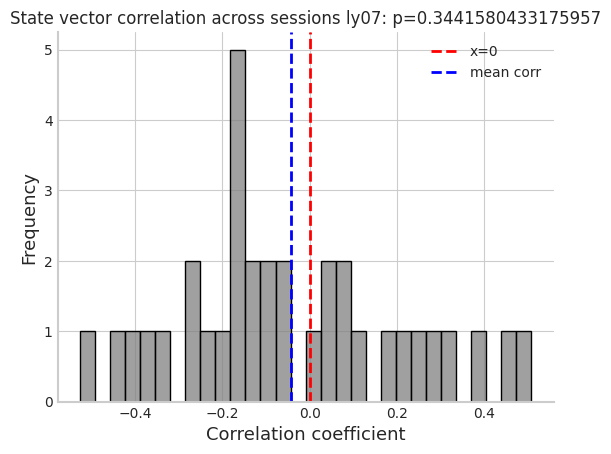

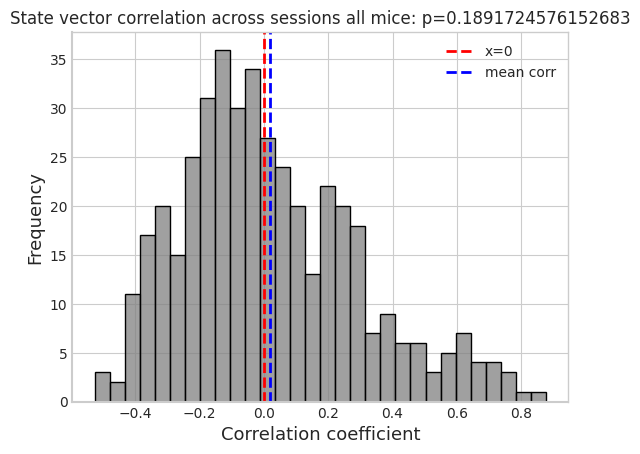

In [21]:


max_y_lec_dic = {
    'ah08': 200,
    'ah10': 150,
    'ly05': 150,
    'ly06': 150,
    'ly07': 150
}

all_neuron_correlations_across_mice = []

mouse_corrs_dic = {}
sig_lec_neurons_dic = {}
for mouse in ['ah08', 'ah10', 'ly05', 'ly06', 'ly07']:
    all_neuron_correlations=[]
    for mouse_recday in mouse_recdays:
        if mouse not in mouse_recday:
            continue

        LEC_units_mask = find_LEC_units(mouse_recday, preprocessed_folder, max_y_lec_dic[mouse])

        # check if lec_units_mask is same length as number of neurons in data_dic
        if len(LEC_units_mask) == data_dic[mouse_recday][list(data_dic[mouse_recday].keys())[0]]['num_neurons']:
            print(f"LEC units mask length {len(LEC_units_mask)} matches number of neurons {data_dic[mouse_recday][list(data_dic[mouse_recday].keys())[0]]['num_neurons']} for {mouse_recday}.")
        else:
            print(f"LEC units mask length {len(LEC_units_mask)} does NOT match number of neurons {data_dic[mouse_recday][list(data_dic[mouse_recday].keys())[0]]['num_neurons']} for {mouse_recday}. Skipping this mouse_recday.")
            continue

        tasks = []

        # data_dic[mouse_recday]['valid_sessions'] = valid_sessions
        sig_neurons = sig_neurons_dic[mouse_recday]
        sig_neurons_lec = [neuron for neuron in sig_neurons if neuron < len(LEC_units_mask) and LEC_units_mask[neuron] == 1]    
        if mouse_recday not in sig_lec_neurons_dic:
            sig_lec_neurons_dic[mouse_recday] = sig_neurons_lec
        LEC_neurons = [neuron for neuron in range(len(LEC_units_mask)) if LEC_units_mask[neuron] == 1]
        # LEC_neurons = [neuron for neuron in range(len(LEC_units_mask)) if LEC_units_mask[neuron] == 1]
        print(f'After LEC filtering, {len(sig_neurons)} significant neurons remain for {mouse_recday}.')
        
        valid_sessions = valid_sessions_dic[mouse_recday]
        day1_sessions = valid_sessions[:3]
        day2_sessions = valid_sessions[3:]
        
        for neuron_idx in sig_neurons_lec:
            corrs = []
            # Correlations within day 1
            for i, session1_idx in enumerate(day1_sessions[:-1]):
                for session2_idx in day1_sessions[i+1:]:
                    binned_firing_rate1 = zscore(binned_frs[mouse_recday][neuron_idx][session1_idx])
                    binned_firing_rate2 = zscore(binned_frs[mouse_recday][neuron_idx][session2_idx])
                    correlation = np.corrcoef(binned_firing_rate1, binned_firing_rate2)[0, 1]
                    corrs.append(correlation)
            
            # Correlations within day 2
            for i, session1_idx in enumerate(day2_sessions[:-1]):
                for session2_idx in day2_sessions[i+1:]:
                    binned_firing_rate1 = zscore(binned_frs[mouse_recday][neuron_idx][session1_idx])
                    binned_firing_rate2 = zscore(binned_frs[mouse_recday][neuron_idx][session2_idx])
                    correlation = np.corrcoef(binned_firing_rate1, binned_firing_rate2)[0, 1]
                    corrs.append(correlation)
            
            if corrs:
                all_neuron_correlations.append(np.mean(corrs))  
                all_neuron_correlations_across_mice.append(np.mean(corrs))
    
    mouse_corrs_dic[mouse] = all_neuron_correlations

    t_stat, p_value = stats.ttest_1samp(all_neuron_correlations, 0)
    mean_corr = np.mean(all_neuron_correlations)
    fig, ax = plt.subplots()
    sns.histplot(all_neuron_correlations, kde=False, color="grey", bins=30)
    sns.despine()

    # Increase line thickness
    plt.tick_params(axis='both', which='major', width=2)  # Increase thickness of the ticks

    # Increase tick size
    plt.tick_params(axis='both', which='major', labelsize=10)  # Increase 
    # Add a red vertical line at x=0
    plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='x=0')
    plt.axvline(x=mean_corr, color='blue', linestyle='--', linewidth=2, label='mean corr')
    plt.gca().spines['left'].set_linewidth(1.5)  # Make y-axis thicker
    plt.gca().spines['bottom'].set_linewidth(1.5)  
    # Add labels and legend
    plt.xlabel('Correlation coefficient', fontsize=13)
    plt.ylabel('Frequency', fontsize=13)
    plt.title(f'State vector correlation across sessions {mouse}: p={p_value}')
    plt.legend()
    # plt.savefig(f'../data/figures/remapping_correlations_{mouse}.pdf', dpi=300) 
    # Show the plot
    plt.show()

# Now analyze all neurons across all mice
t_stat, p_value = stats.ttest_1samp(all_neuron_correlations_across_mice, 0)
mean_corr = np.mean(all_neuron_correlations_across_mice)
fig, ax = plt.subplots()
sns.histplot(all_neuron_correlations_across_mice, kde=False, color="grey", bins=30)
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='x=0')
plt.axvline(x=mean_corr, color='blue', linestyle='--', linewidth=2, label='mean corr')
plt.gca().spines['left'].set_linewidth(1.5)  # Make y-axis thicker
plt.gca().spines['bottom'].set_linewidth(1.5)  
# Add labels and legend
plt.xlabel('Correlation coefficient', fontsize=13)
plt.ylabel('Frequency', fontsize=13)
plt.title(f'State vector correlation across sessions all mice: p={p_value}')
plt.legend()
plt.show()

LEC units mask length 151 matches number of neurons 151 for ah08_20250613_20250615.
After LEC filtering, 123 significant neurons remain for ah08_20250613_20250615.
LEC units mask length 164 matches number of neurons 164 for ah08_20250616_20250617.
After LEC filtering, 130 significant neurons remain for ah08_20250616_20250617.
LEC units mask length 183 matches number of neurons 183 for ah08_20250618_20250619.
After LEC filtering, 136 significant neurons remain for ah08_20250618_20250619.
LEC units mask length 108 matches number of neurons 108 for ah08_20250620_20250623.
After LEC filtering, 79 significant neurons remain for ah08_20250620_20250623.
LEC units mask length 186 matches number of neurons 186 for ah08_20250624_20250625.
After LEC filtering, 124 significant neurons remain for ah08_20250624_20250625.


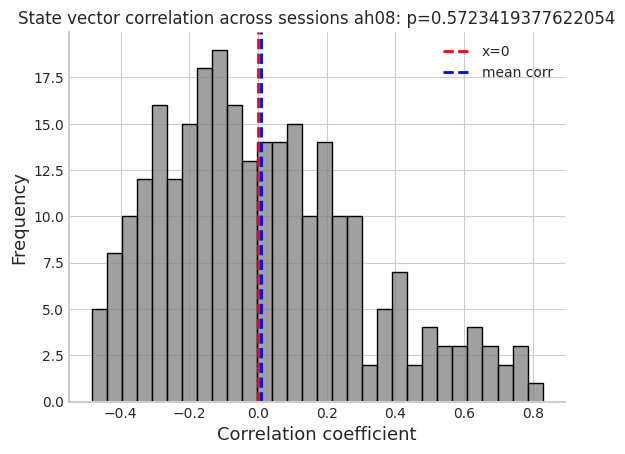

LEC units mask length 139 matches number of neurons 139 for ah10_20250613_20250615.
After LEC filtering, 80 significant neurons remain for ah10_20250613_20250615.
LEC units mask length 154 matches number of neurons 154 for ah10_20250616_20250617.
After LEC filtering, 84 significant neurons remain for ah10_20250616_20250617.
LEC units mask length 162 matches number of neurons 162 for ah10_20250618_20250619.
After LEC filtering, 93 significant neurons remain for ah10_20250618_20250619.
LEC units mask length 153 matches number of neurons 153 for ah10_20250620_20250623.
After LEC filtering, 90 significant neurons remain for ah10_20250620_20250623.
LEC units mask length 164 matches number of neurons 164 for ah10_20250624_20250625.
After LEC filtering, 90 significant neurons remain for ah10_20250624_20250625.


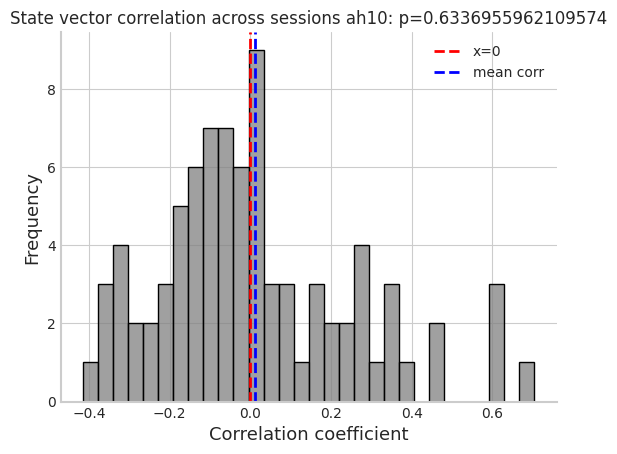

LEC units mask length 117 matches number of neurons 117 for ly05_20250613_20250615.
After LEC filtering, 77 significant neurons remain for ly05_20250613_20250615.
LEC units mask length 116 matches number of neurons 116 for ly05_20250616_20250617.
After LEC filtering, 68 significant neurons remain for ly05_20250616_20250617.
LEC units mask length 109 does NOT match number of neurons 91 for ly05_20250618_20250619. Skipping this mouse_recday.
LEC units mask length 74 matches number of neurons 74 for ly05_20250624_20250625.
After LEC filtering, 38 significant neurons remain for ly05_20250624_20250625.


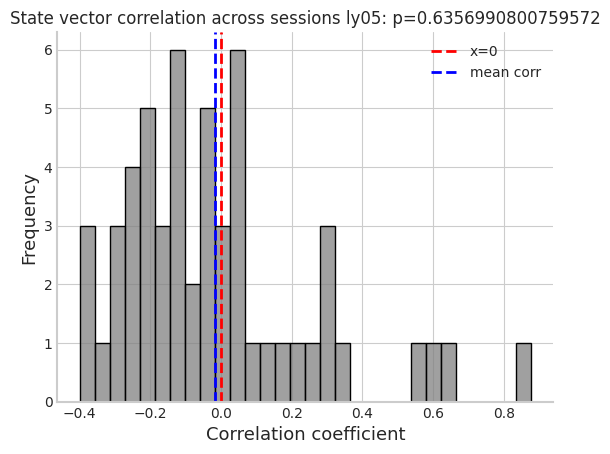

LEC units mask length 68 matches number of neurons 68 for ly06_20250613_20250615.
After LEC filtering, 29 significant neurons remain for ly06_20250613_20250615.
LEC units mask length 79 matches number of neurons 79 for ly06_20250616_20250617.
After LEC filtering, 37 significant neurons remain for ly06_20250616_20250617.
LEC units mask length 76 matches number of neurons 76 for ly06_20250618_20250619.
After LEC filtering, 26 significant neurons remain for ly06_20250618_20250619.
LEC units mask length 67 matches number of neurons 67 for ly06_20250620_20250623.
After LEC filtering, 30 significant neurons remain for ly06_20250620_20250623.
LEC units mask length 66 matches number of neurons 66 for ly06_20250624_20250625.
After LEC filtering, 22 significant neurons remain for ly06_20250624_20250625.


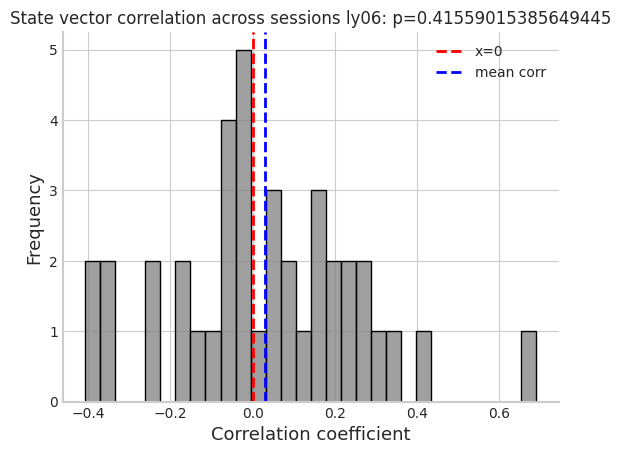

LEC units mask length 73 matches number of neurons 73 for ly07_20250613_20250615.
After LEC filtering, 29 significant neurons remain for ly07_20250613_20250615.
LEC units mask length 88 matches number of neurons 88 for ly07_20250616_20250617.
After LEC filtering, 40 significant neurons remain for ly07_20250616_20250617.
LEC units mask length 88 matches number of neurons 88 for ly07_20250618_20250619.
After LEC filtering, 30 significant neurons remain for ly07_20250618_20250619.
LEC units mask length 89 matches number of neurons 89 for ly07_20250620_20250623.
After LEC filtering, 29 significant neurons remain for ly07_20250620_20250623.
LEC units mask length 86 matches number of neurons 86 for ly07_20250624_20250625.
After LEC filtering, 39 significant neurons remain for ly07_20250624_20250625.


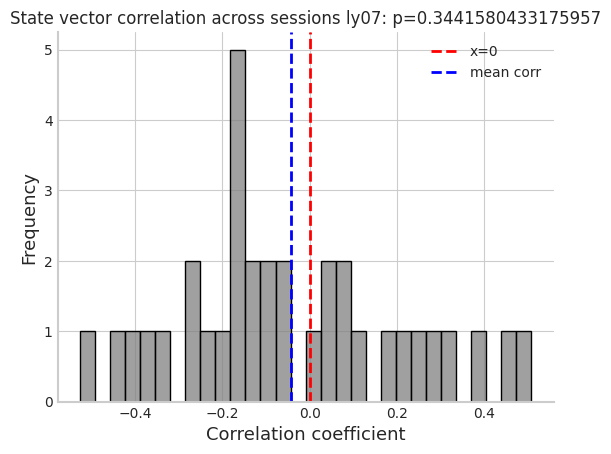

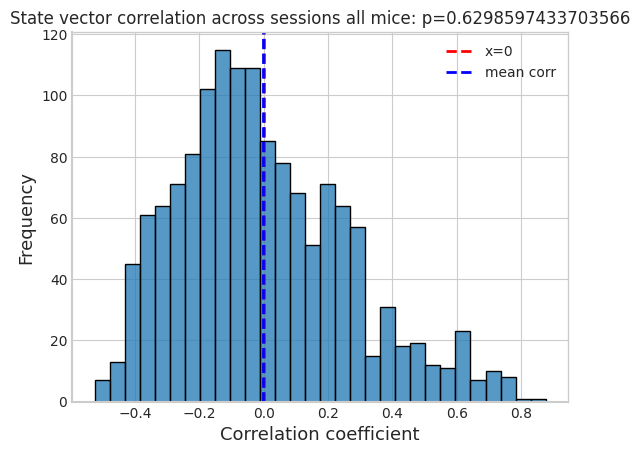

In [22]:
extreme_corrs_dict = {}

max_y_lec_dic = {
    'ah08': 250,
    'ah10': 150,
    'ly05': 150,
    'ly06': 150,
    'ly07': 150
}

all_neuron_correlations_across_mice = []

mouse_corrs_dic = {}
sig_lec_neurons_dic = {}
for mouse in ['ah08', 'ah10', 'ly05', 'ly06', 'ly07']:
    all_neuron_correlations=[]
    for mouse_recday in mouse_recdays:
        if mouse not in mouse_recday:
            continue

        extreme_corrs_dict[mouse_recday] = {'high_corr': [], 'low_corr': []}

        LEC_units_mask = find_LEC_units(mouse_recday, preprocessed_folder, max_y_lec_dic[mouse])

        # check if lec_units_mask is same length as number of neurons in data_dic
        if len(LEC_units_mask) == data_dic[mouse_recday][list(data_dic[mouse_recday].keys())[0]]['num_neurons']:
            print(f"LEC units mask length {len(LEC_units_mask)} matches number of neurons {data_dic[mouse_recday][list(data_dic[mouse_recday].keys())[0]]['num_neurons']} for {mouse_recday}.")
        else:
            print(f"LEC units mask length {len(LEC_units_mask)} does NOT match number of neurons {data_dic[mouse_recday][list(data_dic[mouse_recday].keys())[0]]['num_neurons']} for {mouse_recday}. Skipping this mouse_recday.")
            continue

        tasks = []

        # data_dic[mouse_recday]['valid_sessions'] = valid_sessions
        sig_neurons = sig_neurons_dic[mouse_recday]
        sig_neurons_lec = [neuron for neuron in sig_neurons if neuron < len(LEC_units_mask) and LEC_units_mask[neuron] == 1]    
        if mouse_recday not in sig_lec_neurons_dic:
            sig_lec_neurons_dic[mouse_recday] = sig_neurons_lec
        LEC_neurons = [neuron for neuron in range(len(LEC_units_mask)) if LEC_units_mask[neuron] == 1]
        # LEC_neurons = [neuron for neuron in range(len(LEC_units_mask)) if LEC_units_mask[neuron] == 1]
        print(f'After LEC filtering, {len(sig_neurons)} significant neurons remain for {mouse_recday}.')
        
        valid_sessions = valid_sessions_dic[mouse_recday]
        day1_sessions = valid_sessions[:3]
        day2_sessions = valid_sessions[3:]
        
        for neuron_idx in sig_neurons_lec:
            corrs = []
            # Correlations within day 1
            for i, session1_idx in enumerate(day1_sessions[:-1]):
                for session2_idx in day1_sessions[i+1:]:
                    binned_firing_rate1 = zscore(binned_frs[mouse_recday][neuron_idx][session1_idx])
                    binned_firing_rate2 = zscore(binned_frs[mouse_recday][neuron_idx][session2_idx])
                    correlation = np.corrcoef(binned_firing_rate1, binned_firing_rate2)[0, 1]
                    corrs.append(correlation)
            
            # Correlations within day 2
            for i, session1_idx in enumerate(day2_sessions[:-1]):
                for session2_idx in day2_sessions[i+1:]:
                    binned_firing_rate1 = zscore(binned_frs[mouse_recday][neuron_idx][session1_idx])
                    binned_firing_rate2 = zscore(binned_frs[mouse_recday][neuron_idx][session2_idx])
                    correlation = np.corrcoef(binned_firing_rate1, binned_firing_rate2)[0, 1]
                    corrs.append(correlation)
            
            if corrs:
                mean_corr_neuron = np.mean(corrs)
                all_neuron_correlations.append(mean_corr_neuron)  
                
                if mean_corr_neuron > 0.3:
                    extreme_corrs_dict[mouse_recday]['high_corr'].append(neuron_idx)
                if mean_corr_neuron < 0.3:
                    extreme_corrs_dict[mouse_recday]['low_corr'].append(neuron_idx)

        all_neuron_correlations_across_mice.extend(all_neuron_correlations)
    
    mouse_corrs_dic[mouse] = all_neuron_correlations

    t_stat, p_value = stats.ttest_1samp(all_neuron_correlations, 0)
    mean_corr = np.mean(all_neuron_correlations)
    fig, ax = plt.subplots()
    sns.histplot(all_neuron_correlations, kde=False, color="grey", bins=30)
    sns.despine()

    # Increase line thickness
    plt.tick_params(axis='both', which='major', width=2)  # Increase thickness of the ticks

    # Increase tick size
    plt.tick_params(axis='both', which='major', labelsize=10)  # Increase 
    # Add a red vertical line at x=0
    plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='x=0')
    plt.axvline(x=mean_corr, color='blue', linestyle='--', linewidth=2, label='mean corr')
    plt.gca().spines['left'].set_linewidth(1.5)  # Make y-axis thicker
    plt.gca().spines['bottom'].set_linewidth(1.5)  
    # Add labels and legend
    plt.xlabel('Correlation coefficient', fontsize=13)
    plt.ylabel('Frequency', fontsize=13)
    plt.title(f'State vector correlation across sessions {mouse}: p={p_value}')
    plt.legend()
    # plt.savefig(f'../data/figures/remapping_correlations_{mouse}.pdf', dpi=300) 
    # Show the plot
    plt.show()

# Now analyze all neurons across all mice
t_stat, p_value = stats.ttest_1samp(all_neuron_correlations_across_mice, 0)
mean_corr = np.mean(all_neuron_correlations_across_mice)
fig, ax = plt.subplots()
sns.histplot(all_neuron_correlations_across_mice, kde=False, bins=30)
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='x=0')
plt.axvline(x=mean_corr, color='blue', linestyle='--', linewidth=2, label='mean corr')
plt.gca().spines['left'].set_linewidth(1.5)  # Make y-axis thicker
plt.gca().spines['bottom'].set_linewidth(1.5)  
# Add labels and legend
plt.xlabel('Correlation coefficient', fontsize=13)
plt.ylabel('Frequency', fontsize=13)
plt.title(f'State vector correlation across sessions all mice: p={p_value}')
plt.legend()
# plt.savefig('../data/figures/remapping_correlations_all_mice.pdf', dpi=300)
plt.show()

Mean: 0.00025484892034763367
Std: 0.1493324553157615
2.5%, 97.5% quantiles: [-0.18463539  0.37552392]


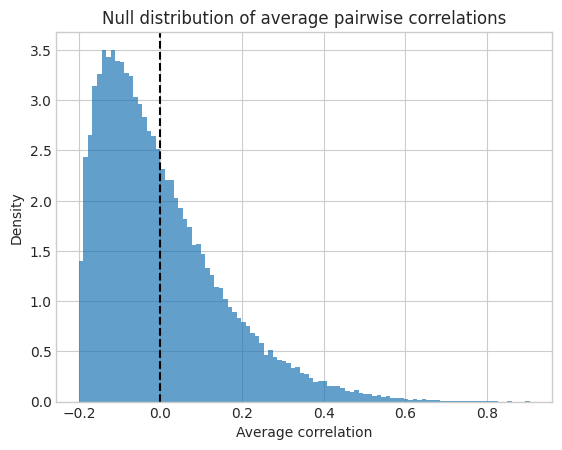

In [23]:


def avg_pairwise_corr(num_tasks, num_states):
    # draw 6 vectors of length 4
    X = np.random.randn(num_tasks, num_states)
    # center each vector
    Xc = X - X.mean(axis=1, keepdims=True)
    norms = np.linalg.norm(Xc, axis=1)
    
    rs = []
    for i in range(num_tasks):
        for j in range(i+1, num_tasks):
            r = np.dot(Xc[i], Xc[j]) / (norms[i] * norms[j])
            rs.append(r)
    return np.mean(rs)

# simulate
N = 100_000
samples = np.array([avg_pairwise_corr(6, 4) for _ in range(N)])

print("Mean:", np.mean(samples))
print("Std:", np.std(samples))
print("2.5%, 97.5% quantiles:", np.quantile(samples, [0.025, 0.975]))

# histogram
plt.hist(samples, bins=100, density=True, alpha=0.7)
plt.axvline(0, color='k', linestyle='--')
plt.xlabel("Average correlation")
plt.ylabel("Density")
plt.title("Null distribution of average pairwise correlations")
plt.show()


Processing ah08_20250613_20250615 with 6 valid sessions.
Processing ah08_20250616_20250617 with 6 valid sessions.
Processing ah08_20250618_20250619 with 6 valid sessions.
Processing ah08_20250620_20250623 with 6 valid sessions.
Processing ah08_20250624_20250625 with 4 valid sessions.
Processing ah10_20250613_20250615 with 6 valid sessions.
Processing ah10_20250616_20250617 with 6 valid sessions.
Processing ah10_20250618_20250619 with 6 valid sessions.
Processing ah10_20250620_20250623 with 6 valid sessions.
Processing ah10_20250624_20250625 with 6 valid sessions.
Processing ly05_20250613_20250615 with 6 valid sessions.
Processing ly05_20250616_20250617 with 6 valid sessions.
Processing ly05_20250618_20250619 with 5 valid sessions.
Processing ly05_20250624_20250625 with 4 valid sessions.
Processing ly06_20250613_20250615 with 6 valid sessions.
Processing ly06_20250616_20250617 with 6 valid sessions.
Processing ly06_20250618_20250619 with 7 valid sessions.
Processing ly06_20250620_202506

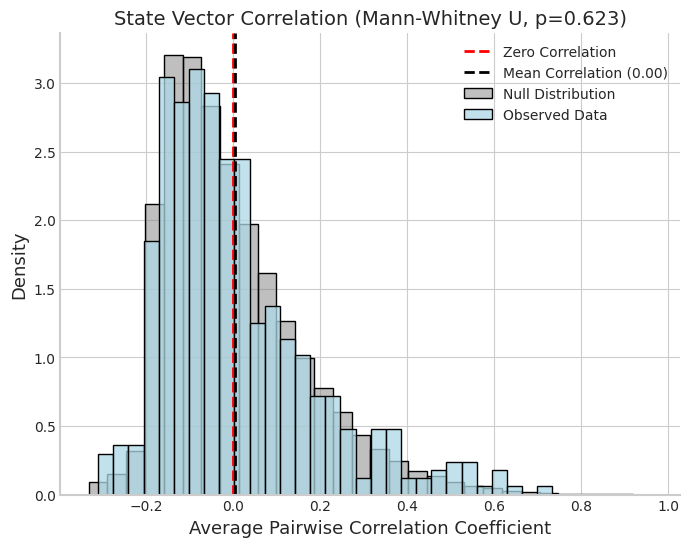

In [24]:
from scipy.stats import zscore, ttest_1samp
import seaborn as sns
import scipy.stats as stats

valid_sessions_dic = {}
all_neuron_correlations = []
all_null_samples = []  # To aggregate null distributions

for mouse_recday in mouse_recdays:
    valid_sessions = []
    tasks = []
    for session in list(data_dic[mouse_recday].keys()):
        try:
            if data_dic[mouse_recday][session]['num_trials'] < 2:
                continue
            if 'defaultdict' in str(data_dic[mouse_recday][session]['Task']):
                continue
            if not any(np.array_equal(data_dic[mouse_recday][session]['Task'], candidate) for candidate in tasks):
                tasks.append(data_dic[mouse_recday][session]['Task'])
                valid_sessions.append(session)
        except KeyError:
            continue

    valid_sessions_dic[mouse_recday] = valid_sessions
    sig_neurons = sig_lec_neurons_dic.get(mouse_recday, [])
    
    print(f"Processing {mouse_recday} with {len(valid_sessions)} valid sessions.")

    # Generate null distribution for the current number of valid sessions
    num_tasks = len(valid_sessions)
    if num_tasks > 1:
        num_states = 4  # Based on the binning logic (360 degrees / 90 degrees per bin)
        n_simulations = 10000
        null_samples = np.array([avg_pairwise_corr(num_tasks, num_states) for _ in range(n_simulations)])
        all_null_samples.extend(null_samples)

    # Calculate real correlations
    for neuron_idx in sig_neurons:
        corrs = []
        if len(valid_sessions) > 1:
            for i, session1_idx in enumerate(valid_sessions[:-1]):
                for session2_idx in valid_sessions[i+1:]:
                    binned_firing_rate1 = zscore(binned_frs[mouse_recday][neuron_idx][session1_idx])
                    binned_firing_rate2 = zscore(binned_frs[mouse_recday][neuron_idx][session2_idx])
                    
                    correlation = np.corrcoef(binned_firing_rate1, binned_firing_rate2)[0, 1]
                    corrs.append(correlation)
            
            if corrs:
                all_neuron_correlations.append(np.mean(corrs))

# Perform t-test on the actual data
t_stat, p_value = stats.ttest_1samp(all_neuron_correlations, 0)
mean_corr = np.mean(all_neuron_correlations)
# Perform Mann-Whitney U test
u_stat, p_value = stats.mannwhitneyu(all_neuron_correlations, all_null_samples, alternative='greater')

# Plotting
fig, ax = plt.subplots(figsize=(8, 6))

# Plot histogram of the null distribution
sns.histplot(all_null_samples, stat='density', kde=False, color='gray', bins=30, label='Null Distribution', ax=ax, alpha=0.5)

# Plot histogram of the actual data
sns.histplot(all_neuron_correlations, stat='density', kde=False, color="lightblue", bins=30, label='Observed Data', ax=ax)



sns.despine()

# Increase line thickness for axes and ticks
plt.tick_params(axis='both', which='major', width=2, labelsize=10)
plt.gca().spines['left'].set_linewidth(1.5)
plt.gca().spines['bottom'].set_linewidth(1.5)

# Add vertical lines
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Correlation')
plt.axvline(x=mean_corr, color='black', linestyle='--', linewidth=2, label=f'Mean Correlation ({mean_corr:.2f})')

# Add labels and legend
plt.xlabel('Average Pairwise Correlation Coefficient', fontsize=13)
plt.ylabel('Density', fontsize=13)
plt.title(f'State Vector Correlation (Mann-Whitney U, p={p_value:.3g})', fontsize=14)
plt.legend()
# fig.savefig('../data/figures/LEC_remapping_correlations_with_null.pdf', dpi=300)
# plt.savefig('/Users/AdamHarris/Desktop/remapping_correlations_with_null.pdf', dpi=300)
plt.show()


In [ ]:
u_stat

np.float64(57224045.0)

In [ ]:
all_neuron_correlations_across_mice.__len__()

1407

In [9]:
for mouse_recday in extreme_corrs_dict:
    print(f"{mouse_recday}: {len(extreme_corrs_dict[mouse_recday]['high_corr'])} high corr neurons, {len(extreme_corrs_dict[mouse_recday]['low_corr'])} low corr neurons")

NameError: name 'extreme_corrs_dict' is not defined

In [ ]:
for mouse_recday in extreme_corrs_dict:
    print(f"{mouse_recday} high corr neurons: {extreme_corrs_dict[mouse_recday]['high_corr']}")


ah08_20250613_20250615 high corr neurons: [2, 20, 33, 51, 130]
ah08_20250616_20250617 high corr neurons: [2, 13, 15, 18, 32, 46, 50, 126]
ah08_20250618_20250619 high corr neurons: [5, 56, 140, 149, 153]
ah08_20250620_20250623 high corr neurons: [3, 4, 16, 17, 18, 28, 78, 84, 88, 95]
ah08_20250624_20250625 high corr neurons: [18, 19, 40, 55, 59, 117, 121, 143]
ah10_20250613_20250615 high corr neurons: []
ah10_20250616_20250617 high corr neurons: [3, 79, 96, 103]
ah10_20250618_20250619 high corr neurons: [103, 104]
ah10_20250620_20250623 high corr neurons: [105]
ah10_20250624_20250625 high corr neurons: [20, 73, 99, 100]
ly05_20250613_20250615 high corr neurons: [0, 3, 8, 53]
ly05_20250616_20250617 high corr neurons: []
ly05_20250618_20250619 high corr neurons: []
ly05_20250624_20250625 high corr neurons: [19, 44]
ly06_20250613_20250615 high corr neurons: []
ly06_20250616_20250617 high corr neurons: []
ly06_20250618_20250619 high corr neurons: []
ly06_20250620_20250623 high corr neurons:

--- All Mice ---
Component 1: Mean=0.25, StdDev=0.22, Weight=0.36
Component 2: Mean=-0.14, StdDev=0.16, Weight=0.64


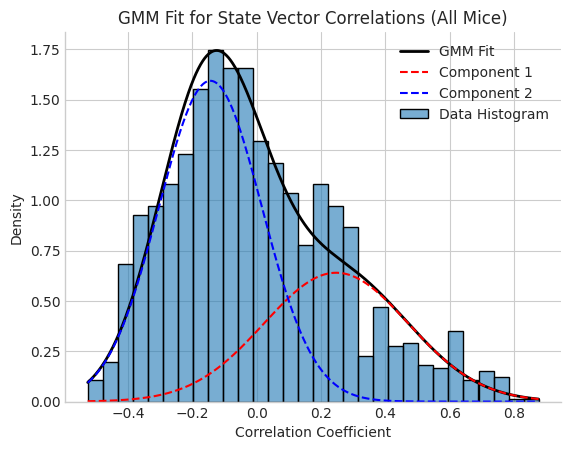

In [25]:
from sklearn.mixture import GaussianMixture 
from scipy.stats import norm 
# Reshape data for GMM 
corrs = np.array(all_neuron_correlations_across_mice).reshape(-1, 1) 
# Fit a 2-component Gaussian Mixture Model 
gmm = GaussianMixture(n_components=2, random_state=0).fit(corrs) 
# Get the parameters of the fitted model 
means = gmm.means_.flatten()
covariances = gmm.covariances_.flatten() 
weights = gmm.weights_.flatten() 
print(f"--- All Mice ---") 
print(f"Component 1: Mean={means[0]:.2f}, StdDev={np.sqrt(covariances[0]):.2f}, Weight={weights[0]:.2f}") 
print(f"Component 2: Mean={means[1]:.2f}, StdDev={np.sqrt(covariances[1]):.2f}, Weight={weights[1]:.2f}") 
# --- Visualization --- 
fig, ax = plt.subplots() 
# Plot histogram of the data 
sns.histplot(corrs, bins=30, stat='density', color='grey', alpha=0.6, label='Data Histogram') 
# Generate x-values for plotting the PDF 
x_range = np.linspace(corrs.min(), corrs.max(), 1000).reshape(-1, 1) 
# Calculate the PDF for the combined GMM 
log_prob = gmm.score_samples(x_range) 
pdf = np.exp(log_prob) 
# Plot the individual Gaussian components 
pdf_individual = [w * norm.pdf(x_range.flatten(), m, np.sqrt(c)) for w, m, c in zip(weights, means, covariances)] 
ax.plot(x_range, pdf, 'k-', linewidth=2, label='GMM Fit') 
ax.plot(x_range, pdf_individual[0], 'r--', label='Component 1') 
ax.plot(x_range, pdf_individual[1], 'b--', label='Component 2') 
ax.set_title(f'GMM Fit for State Vector Correlations (All Mice)') 
ax.set_xlabel('Correlation Coefficient') 
ax.set_ylabel('Density') 
ax.legend() 
sns.despine() 
# plt.savefig('../data/figures/remapping_correlations_all_mice_gmm.pdf', dpi=300)
plt.show()

Best by BIC: K=4
Best by AIC: K=4
Best by ICL: K=5
Best by CV : K=4 (mean -0.1110 ± 0.0412)


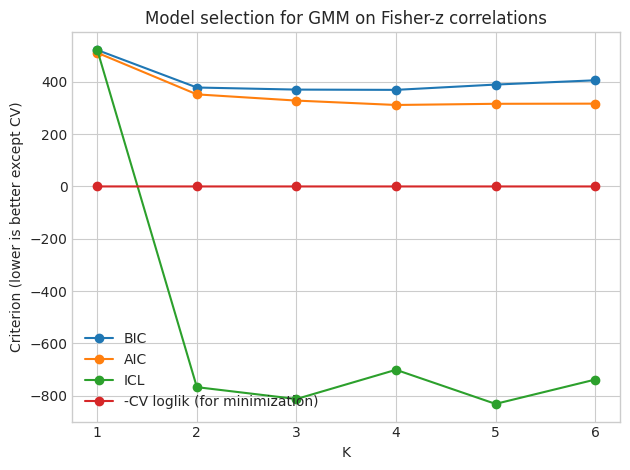

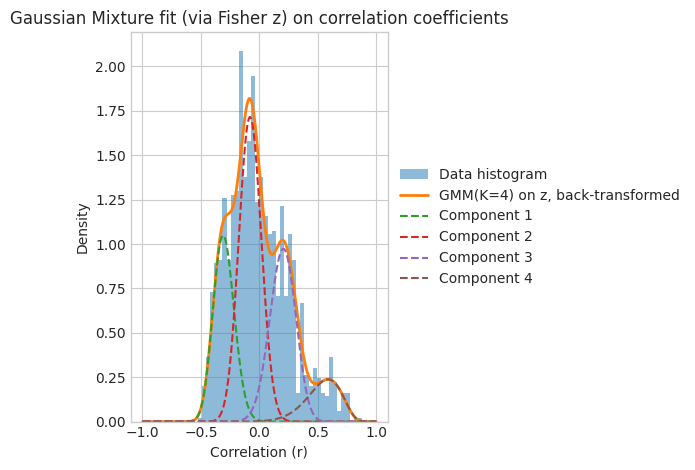

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import KFold
from dataclasses import dataclass

# ---------- Prep your data ----------
corrs = np.asarray(all_neuron_correlations_across_mice, dtype=float).ravel()
# clip to avoid +/-1 blowing up atanh
eps = 1e-9
corrs = np.clip(corrs, -1+eps, 1-eps)
z = np.arctanh(corrs)            # real line
X = z[:, None]                   # (n,1)

@dataclass
class FitStats:
    k: int
    model: GaussianMixture
    aic: float
    bic: float
    icl: float
    cv_mean: float | None
    cv_std: float | None

def cross_validated_loglik(X, k, n_splits=5, random_state=0, n_init=5, reg_covar=1e-6):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    scores = []
    for tr, va in kf.split(X):
        gm = GaussianMixture(
            n_components=k, covariance_type="full",
            n_init=n_init, reg_covar=reg_covar,
            init_params="kmeans", random_state=random_state,
            max_iter=1000, tol=1e-3
        ).fit(X[tr])
        scores.append(gm.score(X[va]))  # mean log-lik per sample
    return float(np.mean(scores)), float(np.std(scores))

def icl_score(gm: GaussianMixture, X: np.ndarray) -> float:
    """
    ICL ≈ BIC - 2 * classification entropy
    where entropy = -sum_i sum_k tau_ik log tau_ik
    Lower is better.
    """
    bic = gm.bic(X)
    resp = gm.predict_proba(X)  # (n,k)
    entropy = -np.sum(resp * np.log(resp + 1e-12))
    return bic - 2.0 * entropy

# ---------- Fit across K and compute criteria ----------
Kmax = 6
results: list[FitStats] = []
for k in range(1, Kmax+1):
    gm = GaussianMixture(
        n_components=k, covariance_type="full",
        n_init=10, reg_covar=1e-6,
        init_params="kmeans", random_state=0,
        max_iter=2000, tol=1e-3
    ).fit(X)
    aic = gm.aic(X)
    bic = gm.bic(X)
    icl = icl_score(gm, X)
    cv_mean, cv_std = cross_validated_loglik(X, k, n_splits=5, random_state=0, n_init=5)
    results.append(FitStats(k, gm, aic, bic, icl, cv_mean, cv_std))

# Picks
best_bic = min(results, key=lambda r: r.bic)
best_aic = min(results, key=lambda r: r.aic)
best_icl = min(results, key=lambda r: r.icl)
best_cv  = max(results, key=lambda r: r.cv_mean)

print(f"Best by BIC: K={best_bic.k}")
print(f"Best by AIC: K={best_aic.k}")
print(f"Best by ICL: K={best_icl.k}")
print(f"Best by CV : K={best_cv.k} (mean {best_cv.cv_mean:.4f} ± {best_cv.cv_std:.4f})")

# ---------- Plot criteria vs K ----------
ks = np.array([r.k for r in results])
plt.figure()
plt.plot(ks, [r.bic for r in results], marker='o', label='BIC')
plt.plot(ks, [r.aic for r in results], marker='o', label='AIC')
plt.plot(ks, [r.icl for r in results], marker='o', label='ICL')
plt.plot(ks, [-r.cv_mean for r in results], marker='o', label='-CV loglik (for minimization)')
plt.xlabel('K'); plt.ylabel('Criterion (lower is better except CV)')
plt.title('Model selection for GMM on Fisher-z correlations')
plt.legend(); plt.tight_layout(); 
# plt.savefig('../data/figures/remapping_correlations_all_mice_gmm_criteria.pdf', dpi=300)
plt.show()

# ---------- Refit best (by BIC) and plot on original correlation axis ----------
gm = best_bic.model

# sort components by mean for consistent coloring
order = np.argsort(gm.means_.ravel())
weights = gm.weights_[order]
means_z = gm.means_.ravel()[order]
stds_z = np.sqrt(gm.covariances_.ravel()[order])

# grid on r-space and corresponding z-space
r_grid = np.linspace(-0.999, 0.999, 2000)
z_grid = np.arctanh(r_grid)
# Jacobian |dz/dr| for transforming densities back to r
jac = 1.0 / (1.0 - r_grid**2)

# total mixture density on r: f_r(r) = f_z(z(r)) * |dz/dr|
log_pdf_z = gm.score_samples(z_grid[:, None])          # log f_z
pdf_r = np.exp(log_pdf_z) * jac

# individual components on r
def normal_pdf(x, mu, sigma):
    return (1.0/(np.sqrt(2*np.pi)*sigma)) * np.exp(-0.5*((x-mu)/sigma)**2)

comp_pdfs_r = []
for w, m, s in zip(weights, means_z, stds_z):
    comp_pdfs_r.append(w * normal_pdf(z_grid, m, s) * jac)

# Plot histogram on r, overlay mixture and components
plt.figure()
plt.hist(corrs, bins=40, density=True, alpha=0.5, label='Data histogram')
plt.plot(r_grid, pdf_r, lw=2, label=f'GMM(K={best_bic.k}) on z, back-transformed')
for i, pdfi in enumerate(comp_pdfs_r, 1):
    plt.plot(r_grid, pdfi, ls='--', label=f'Component {i}')
plt.xlabel('Correlation (r)'); plt.ylabel('Density')
plt.title('Gaussian Mixture fit (via Fisher z) on correlation coefficients')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
# plt.savefig('../data/figures/remapping_correlations_all_mice_gmm_bic.pdf', dpi=300)
plt.show()

# ---------- If K=2, compute the posterior-equality threshold and draw it ----------
if best_bic.k == 2:
    w1, w2 = weights
    m1, m2 = means_z
    s1, s2 = stds_z

    # Solve for z where w1 N(z|m1,s1)=w2 N(z|m2,s2) -> quadratic az^2 + bz + c = 0
    a = (1/s2**2 - 1/s1**2)
    b = (-2*m2/s2**2 + 2*m1/s1**2)
    c = (m2**2/s2**2 - m1**2/s1**2) + 2.0*np.log((w1/s1)/(w2/s2))

    roots = []
    if abs(a) < 1e-12:
        if abs(b) > 1e-12:
            roots = [-c/b]
    else:
        disc = b*b - 4*a*c
        if disc >= 0:
            roots = [(-b - np.sqrt(disc))/(2*a), (-b + np.sqrt(disc))/(2*a)]
    # pick the root that lies between the means (typical decision boundary)
    if len(roots) > 0:
        z_thresh = min(roots, key=lambda rr: abs(rr - np.clip(rr, min(m1,m2), max(m1,m2))))  # prefer between means
        # fall back to the one closest to the interval if neither is inside
        if not (min(m1,m2) <= z_thresh <= max(m1,m2)):
            z_thresh = min(roots, key=lambda rr: min(abs(rr-m1), abs(rr-m2)))
        r_thresh = np.tanh(z_thresh)
        print(f"Posterior-equality threshold (K=2): r ≈ {r_thresh:.4f}")
        # draw on previous plot
        plt.figure()
        plt.hist(corrs, bins=40, density=True, alpha=0.5, label='Data histogram')
        plt.plot(r_grid, pdf_r, lw=2, label=f'GMM(K=2) on z, back-transformed')
        for i, pdfi in enumerate(comp_pdfs_r, 1):
            plt.plot(r_grid, pdfi, ls='--', label=f'Component {i}')
        plt.axvline(r_thresh, color='k', ls=':', lw=2, label='Posterior equality')
        plt.xlabel('Correlation (r)'); plt.ylabel('Density')
        plt.title('K=2 decision threshold')
        plt.legend(); plt.tight_layout(); plt.show()


Processing ah08_20250620_20250623, Session 0


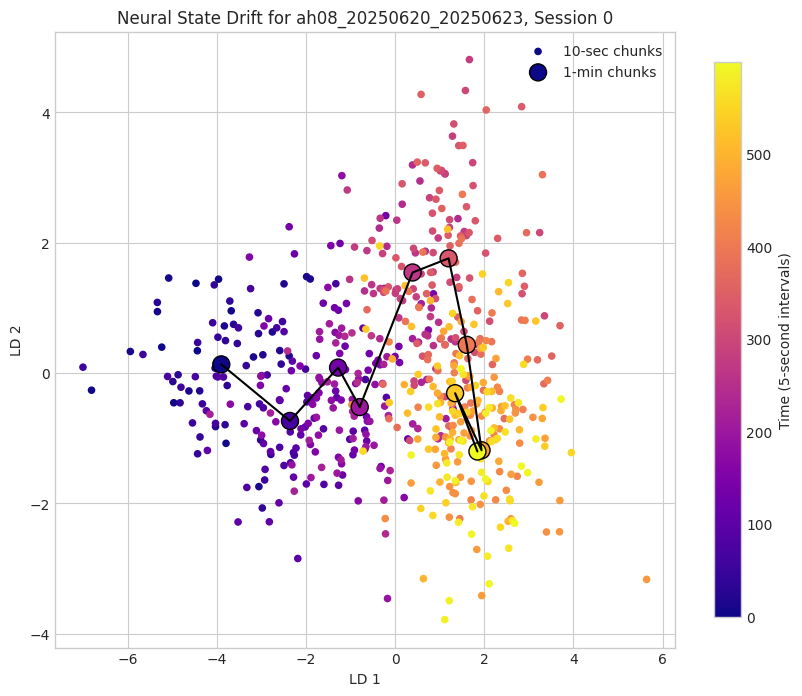

Processing ah08_20250620_20250623, Session 1


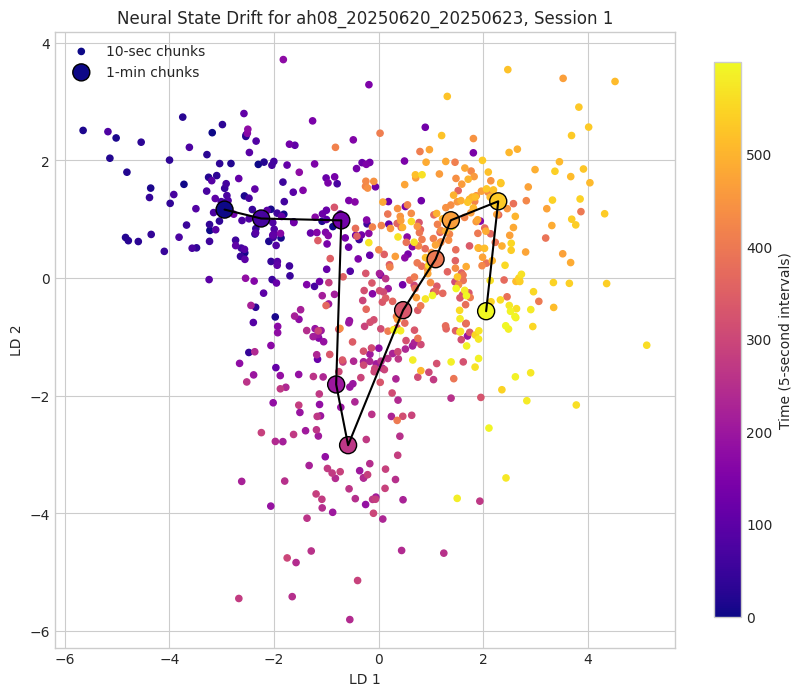

Processing ah08_20250620_20250623, Session 2


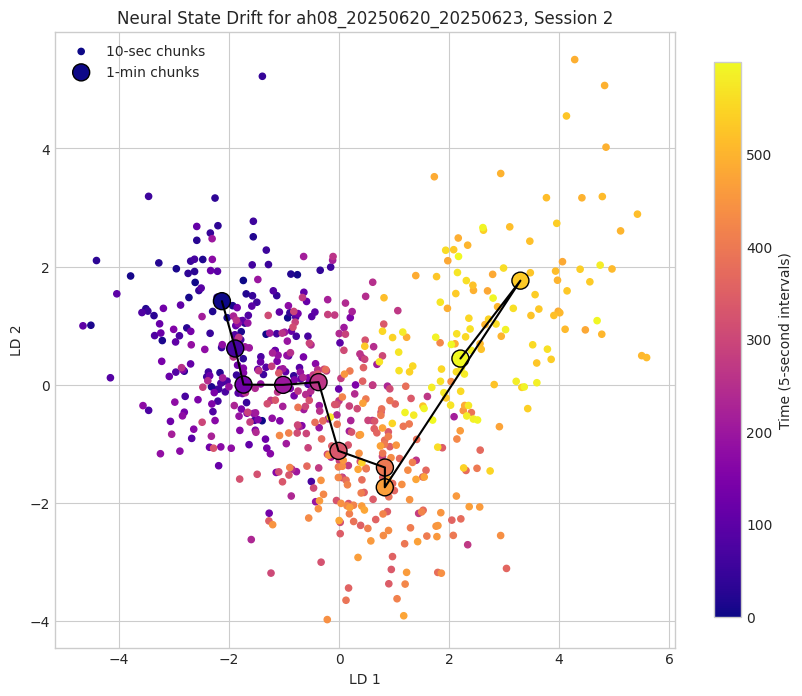

Processing ah08_20250620_20250623, Session 4


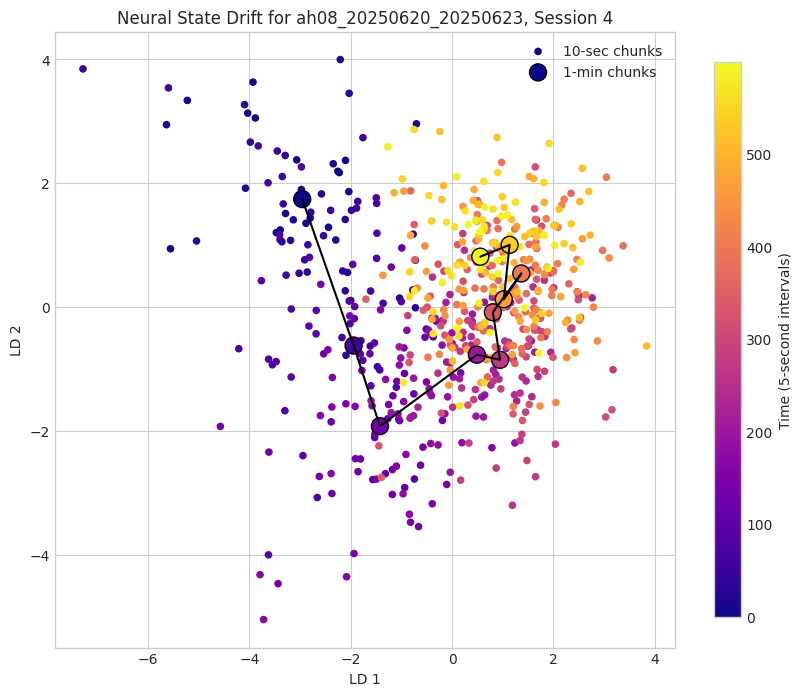

Processing ah08_20250620_20250623, Session 5


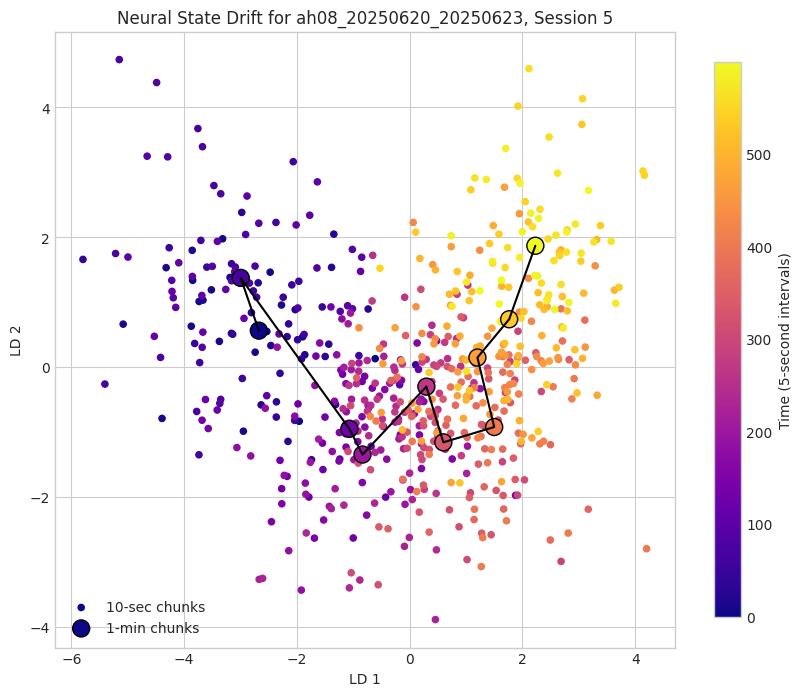

Processing ah08_20250620_20250623, Session 6


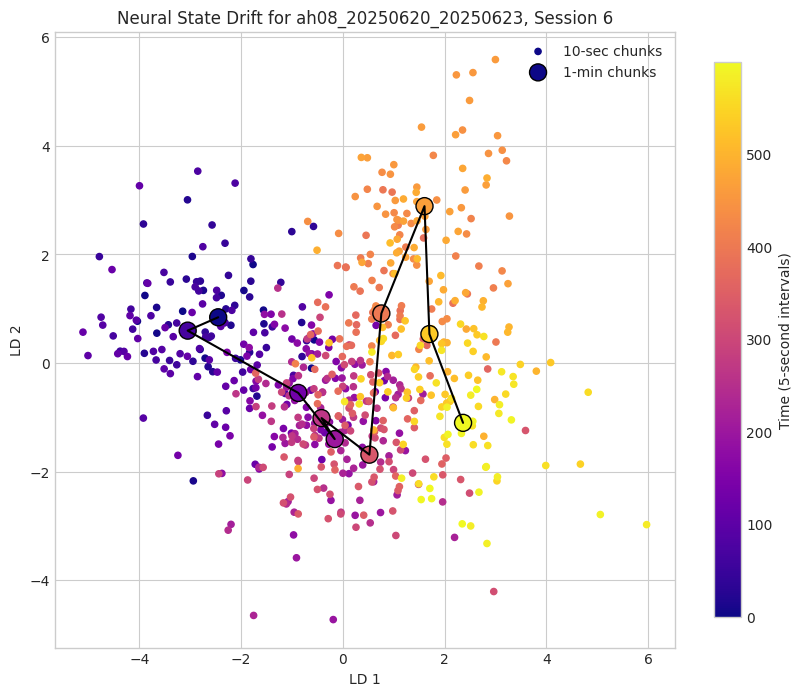

In [30]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

# Define the number of time points per minute-long chunk
# Define chunk sizes in terms of time points
# Assuming 360 points represent 10 minutes of normalized time
# 1 minute = 36 points, 10 seconds = 6 points
TEN_SEC_CHUNK_SIZE = 40

ONE_MIN_CHUNK_SIZE = 2400  # 1 minute worth of data points (360 points for 10 minutes, so 36 points per minute)
TOTAL_DURATION_POINTS = 24000  # First 10 minutes worth of data points

num_min_chunks = TOTAL_DURATION_POINTS // ONE_MIN_CHUNK_SIZE
num_sec_chunks = TOTAL_DURATION_POINTS // TEN_SEC_CHUNK_SIZE
# Process only the first mouse_recday as requested
mouse_recday = mouse_recdays[3]

# Check if there are significant LEC neurons for this mouse_recday
if mouse_recday not in sig_lec_neurons_dic or not sig_lec_neurons_dic[mouse_recday]:
    print(f"No significant LEC neurons for {mouse_recday}, skipping.")
else:
    sig_lec_neurons = sig_lec_neurons_dic[mouse_recday]
    
    valid_sessions = valid_sessions_dic[mouse_recday]

    # Iterate through each session for the selected mouse_recday
    for session_idx in valid_sessions:
        print(f"Processing {mouse_recday}, Session {session_idx}")

        # 1. Get data for the current session (first 10 minutes)
        session_data = data_dic[mouse_recday][session_idx]['Neuron_raw'][:, :TOTAL_DURATION_POINTS]
        
        # 2. Create 1-minute averaged data for projection
        # Shape: (n_samples, n_features) -> (num_min_chunks, n_neurons)
        X_min_chunks = np.array([
            np.mean(session_data[:, i*ONE_MIN_CHUNK_SIZE:(i+1)*ONE_MIN_CHUNK_SIZE], axis=1)
            for i in range(num_min_chunks)
        ])
        
        # 3. Create 10-second averaged data for LDA training
        # Shape: (n_samples, n_features) -> (num_sec_chunks, n_neurons)
        X_sec_chunks = np.array([
            np.mean(session_data[:, i*TEN_SEC_CHUNK_SIZE:(i+1)*TEN_SEC_CHUNK_SIZE], axis=1)
            for i in range(num_sec_chunks)
        ])

        # Create labels for each chunk. For LDA, we need classes. 
        # We can assign each 1-minute interval as a class.
        y_sec_labels = np.repeat(np.arange(num_min_chunks), ONE_MIN_CHUNK_SIZE // TEN_SEC_CHUNK_SIZE)
        y_min_labels = np.arange(num_min_chunks)

        # 4. Scale data
        scaler = StandardScaler()
        X_sec_chunks_scaled = scaler.fit_transform(X_sec_chunks)
        X_min_chunks_scaled = scaler.transform(X_min_chunks) # Use the same scaler

        # 5. Perform LDA on 10-second chunks
        n_components = min(2, num_min_chunks - 1, len(sig_lec_neurons))
        if n_components < 1:
            print(f"Not enough data to perform LDA for Session {session_idx}, skipping.")
            continue
            
        lda = LinearDiscriminantAnalysis(n_components=n_components)
        # Train on 10-sec chunks
        X_sec_projected = lda.fit_transform(X_sec_chunks_scaled, y_sec_labels)
        
        # Project 1-minute chunks onto the same axes
        X_min_projected = lda.transform(X_min_chunks_scaled)

        # 6. Visualize the drift
        fig, ax = plt.subplots(figsize=(10, 8))

        # Plot 10-second chunks (continuous color, small points)
        # Use time index for color, not class label
        time_indices_sec = np.arange(num_sec_chunks)
        scatter_sec = ax.scatter(
            X_sec_projected[:, 0], X_sec_projected[:, 1],
            c=time_indices_sec, cmap='plasma', s=20, label='10-sec chunks'
        )

        # Plot 1-minute chunks (discrete color, large points)
        time_indices_min = np.arange(num_min_chunks)
        scatter_min = ax.scatter(
            X_min_projected[:, 0], X_min_projected[:, 1],
            c=time_indices_min, cmap='plasma', s=150, edgecolor='black', label='1-min chunks'
        )
        
        # Connect 1-minute chunks with lines
        ax.plot(X_min_projected[:, 0], X_min_projected[:, 1], color='black', linestyle='-', marker='')

        # Add labels and title
        ax.set_title(f'Neural State Drift for {mouse_recday}, Session {session_idx}')
        ax.set_xlabel('LD 1')
        ax.set_ylabel('LD 2')
        ax.legend()
        
        # Add a color bar for the 10-second continuous data
        cbar = fig.colorbar(scatter_sec, ax=ax, shrink=0.9)
        cbar.set_label('Time (5-second intervals)')
        
        plt.show()


Processing ah08_20250613_20250615, Session 0


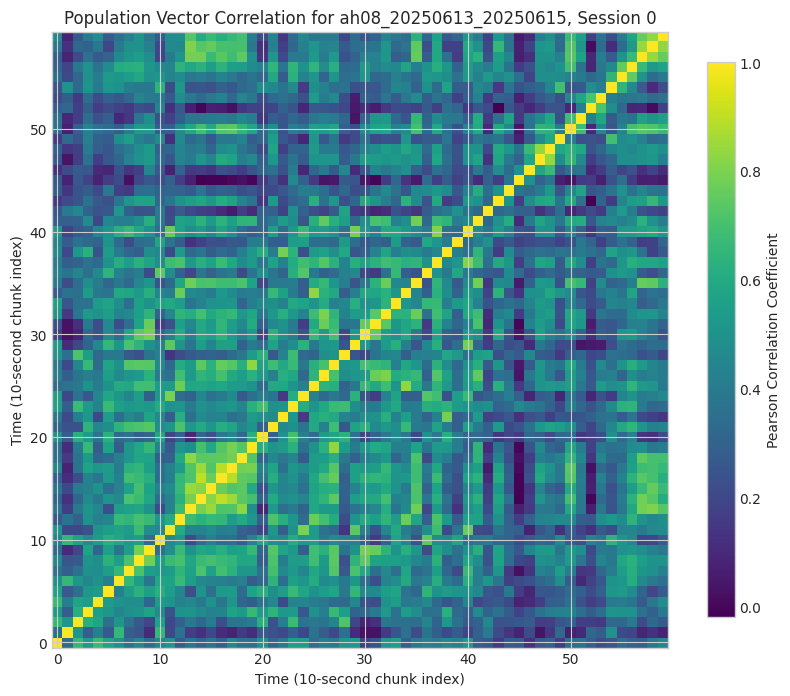

Processing ah08_20250613_20250615, Session 1


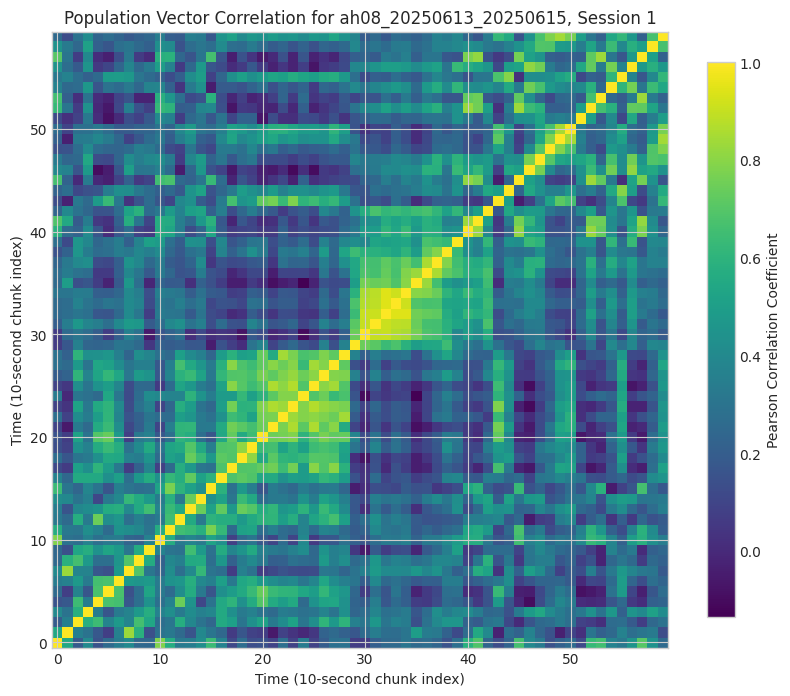

Processing ah08_20250613_20250615, Session 2


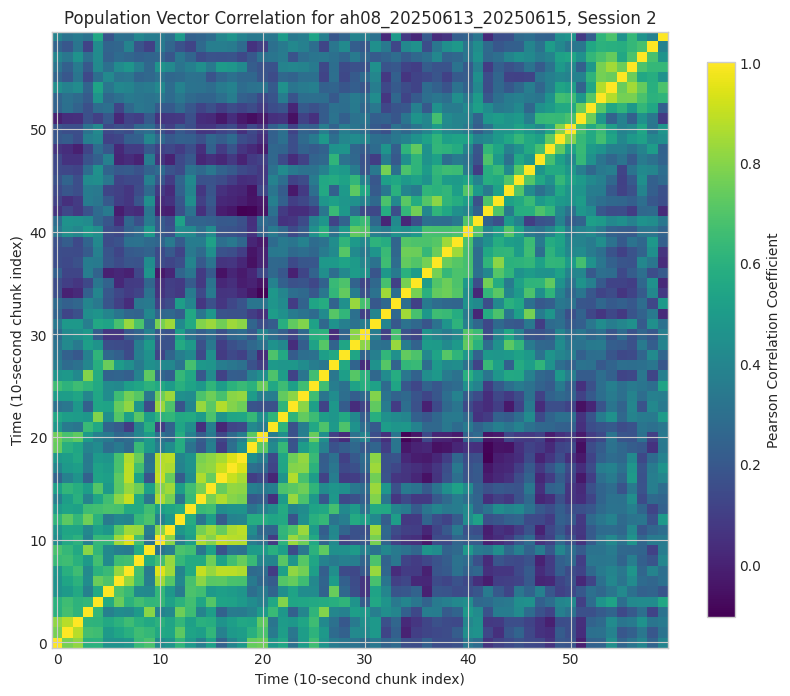

Processing ah08_20250613_20250615, Session 4


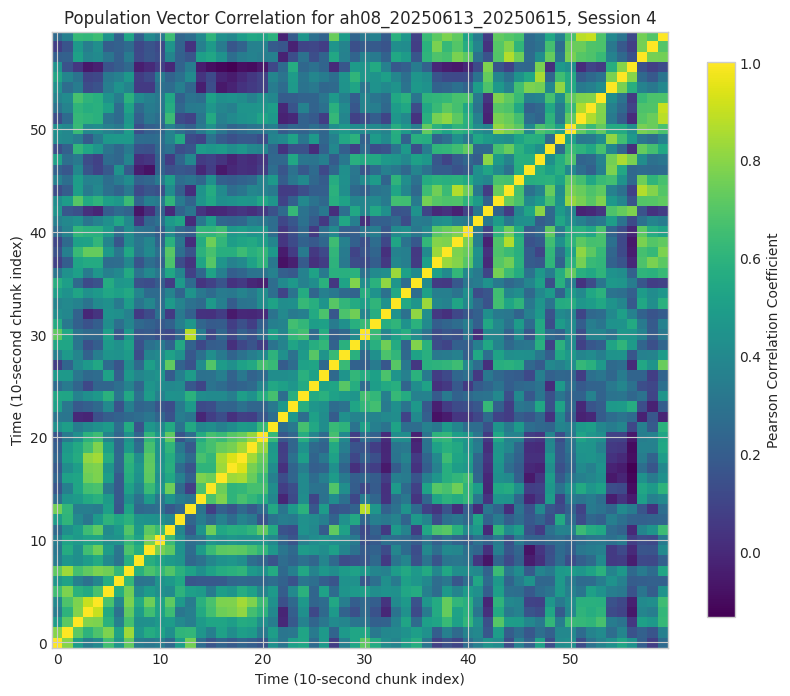

Processing ah08_20250613_20250615, Session 5


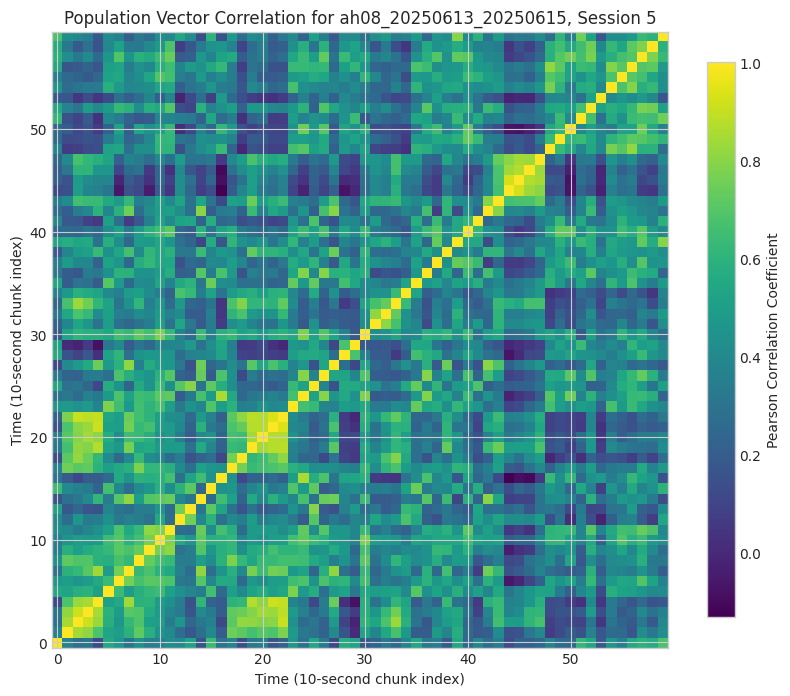

Processing ah08_20250613_20250615, Session 6


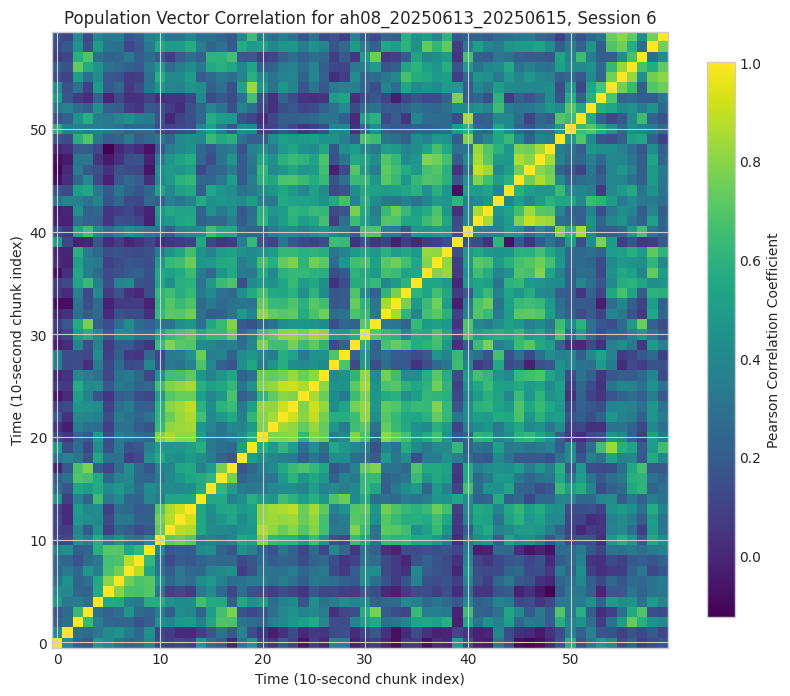

In [31]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

# Define the number of time points per minute-long chunk
# Define chunk sizes in terms of time points
# Assuming 360 points represent 10 minutes of normalized time
# 1 minute = 36 points, 10 seconds = 6 points
TEN_SEC_CHUNK_SIZE = 400
ONE_MIN_CHUNK_SIZE = 2400
TOTAL_DURATION_POINTS = 24000  # First 10 minutes worth of data points

num_min_chunks = TOTAL_DURATION_POINTS // ONE_MIN_CHUNK_SIZE
num_sec_chunks = TOTAL_DURATION_POINTS // TEN_SEC_CHUNK_SIZE
# Process only the first mouse_recday as requested
mouse_recday = mouse_recdays[0]

# Check if there are significant LEC neurons for this mouse_recday
if mouse_recday not in sig_lec_neurons_dic or not sig_lec_neurons_dic[mouse_recday]:
    print(f"No significant LEC neurons for {mouse_recday}, skipping.")
else:
    sig_lec_neurons = sig_lec_neurons_dic[mouse_recday]
    valid_sessions = valid_sessions_dic[mouse_recday]

    # Iterate through each session for the selected mouse_recday
    for session_idx in valid_sessions:
        print(f"Processing {mouse_recday}, Session {session_idx}")

        # 1. Get data for the current session (first 10 minutes)
        session_data = data_dic[mouse_recday][session_idx]['Neuron_raw'][sig_lec_neurons, :TOTAL_DURATION_POINTS]
        
        # 2. Create 10-second averaged data chunks (population vectors)
        # Shape: (n_samples, n_features) -> (num_sec_chunks, n_neurons)
        X_sec_chunks = np.array([
            np.mean(session_data[:, i*TEN_SEC_CHUNK_SIZE:(i+1)*TEN_SEC_CHUNK_SIZE], axis=1)
            for i in range(num_sec_chunks)
        ])

        # 3. Calculate the timepoint x timepoint correlation matrix
        # np.corrcoef expects features in rows, so we transpose X_sec_chunks
        # The result is a (num_sec_chunks, num_sec_chunks) matrix
        correlation_matrix = np.corrcoef(X_sec_chunks)

        # 4. Visualize the correlation matrix
        fig, ax = plt.subplots(figsize=(10, 8))
        im = ax.imshow(correlation_matrix, cmap='viridis', origin='lower')

        # Add labels and title
        ax.set_title(f'Population Vector Correlation for {mouse_recday}, Session {session_idx}')
        ax.set_xlabel('Time (10-second chunk index)')
        ax.set_ylabel('Time (10-second chunk index)')
        
        # Add a color bar
        cbar = fig.colorbar(im, ax=ax, shrink=0.9)
        cbar.set_label('Pearson Correlation Coefficient')
        
        plt.show()


In [ ]:
"""
for each recday, and each pair of non-repeating tasks within that recday, calculate the correlation of the population vector (binned firing rates across neurons) between those two tasks.
seperated by states (state A task 1 vs state A task 2, state B task 1 vs state B task 2), and then average those correlations to get a single correlation value for each neuron for that recday. Then we can look at the distribution of those correlation values across neurons, and see if they are significantly different from zero (which would indicate remapping across sessions). 
report and plot the correlations aggregated across all mice for each statre separately, and then aggregated across all mice and states together.
do this for all neurons, and then separately for just the significant LEC neurons.
"""



(10, 44)

ANALYZING ALL NEURONS

Processing ah08_20250613_20250615
  Valid sessions: [0, 1, 2, 3, 4, 5, 6, 7]
  Task pairs to analyze: 26
    Comparing task_0 (session 0) vs task_1 (session 1)
      Using all 151 neurons
      Mean correlation across states: 0.885
    Comparing task_0 (session 0) vs task_2 (session 2)
      Using all 151 neurons
      Mean correlation across states: 0.883
    Comparing task_0 (session 0) vs task_4 (session 4)
      Using all 151 neurons
      Mean correlation across states: 0.838
    Comparing task_0 (session 0) vs task_5 (session 5)
      Using all 151 neurons
      Mean correlation across states: 0.842
    Comparing task_0 (session 0) vs task_6 (session 6)
      Using all 151 neurons
      Mean correlation across states: 0.835
    Comparing task_0 (session 0) vs task_7 (session 7)
      Using all 151 neurons
      Mean correlation across states: 0.704
    Comparing task_1 (session 1) vs task_2 (session 2)
      Using all 151 neurons
      Mean correlation acro

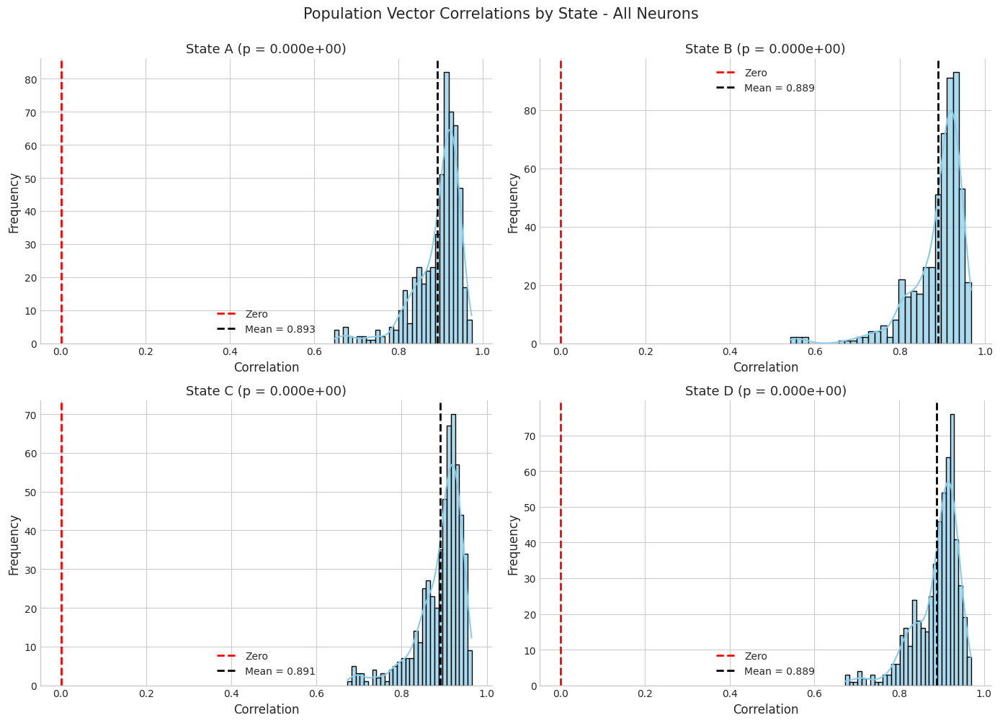


ANALYSIS ACROSS ALL STATES - All Neurons

All States Combined:
  N = 2172 correlations
  Mean correlation = 0.890 ± 0.057
  t-statistic = 726.791
  p-value = 0.000e+00


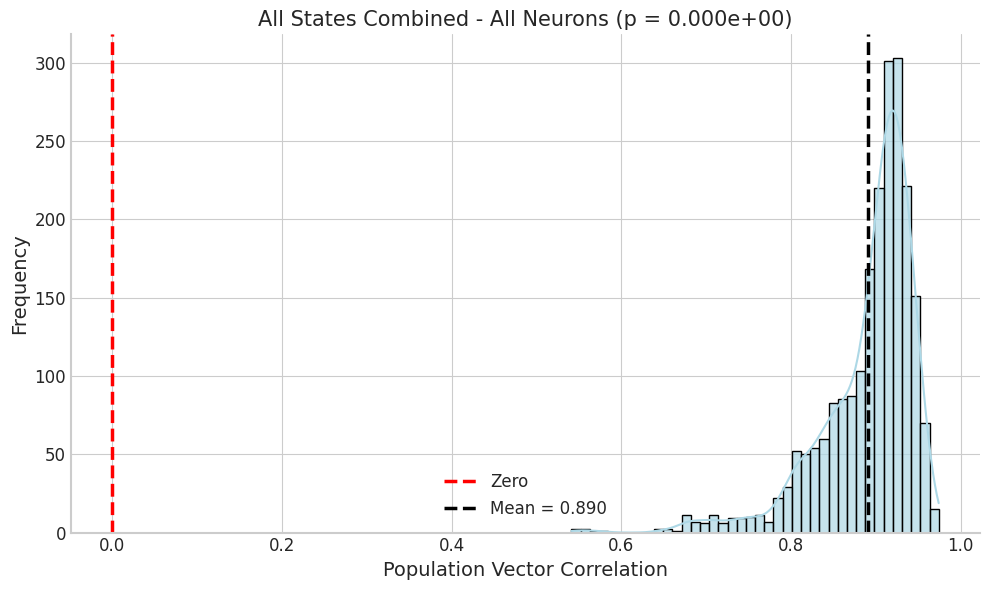


ANALYSIS BY MOUSE - All Neurons

Mouse ah08:
  N = 408
  Mean correlation = 0.867 ± 0.063
  t-statistic = 277.609
  p-value = 0.000e+00

Mouse ah10:
  N = 500
  Mean correlation = 0.903 ± 0.032
  t-statistic = 624.128
  p-value = 0.000e+00

Mouse ly05:
  N = 328
  Mean correlation = 0.844 ± 0.075
  t-statistic = 202.181
  p-value = 0.000e+00

Mouse ly06:
  N = 480
  Mean correlation = 0.927 ± 0.028
  t-statistic = 734.167
  p-value = 0.000e+00

Mouse ly07:
  N = 456
  Mean correlation = 0.892 ± 0.047
  t-statistic = 403.807
  p-value = 0.000e+00


/tmp/ipykernel_153311/2460187653.py:318: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=results_df, x='state', y='correlation', palette='Set2', ax=ax)


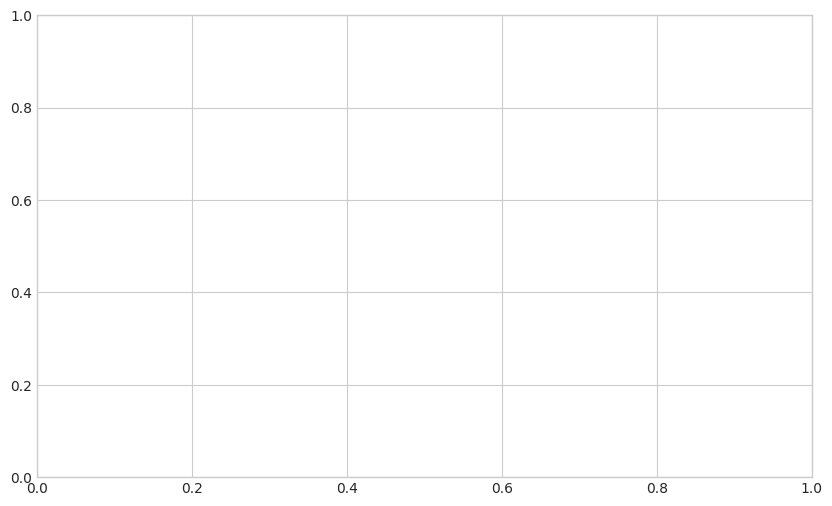

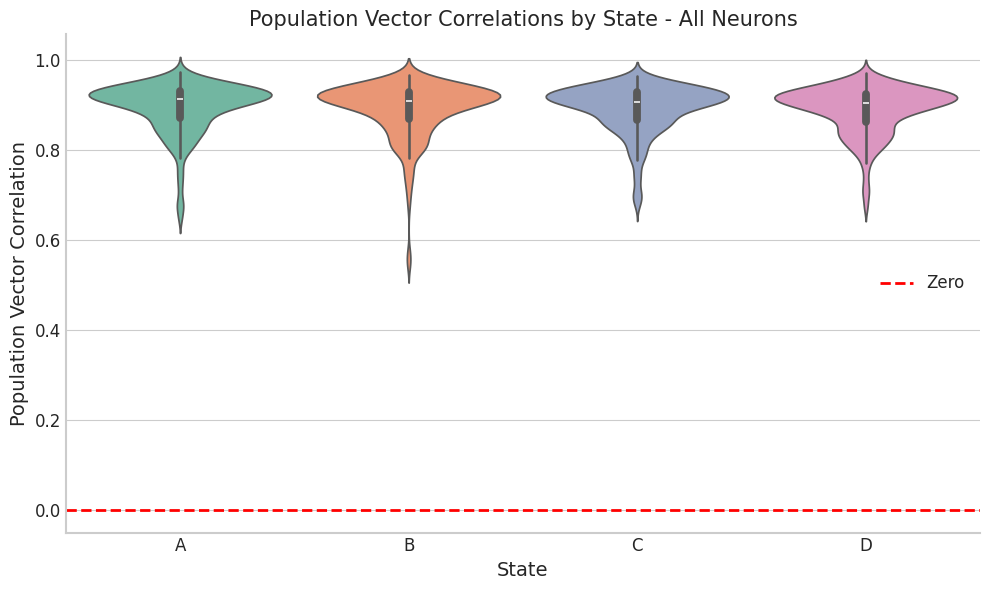


ANALYSIS BY STATE - Significant LEC Neurons

State A:
  N = 543 task pairs
  Mean correlation = 0.436 ± 0.235
  t-statistic = 43.216
  p-value = 9.861e-178

State B:
  N = 543 task pairs
  Mean correlation = 0.432 ± 0.223
  t-statistic = 45.184
  p-value = 6.144e-186

State C:
  N = 543 task pairs
  Mean correlation = 0.432 ± 0.226
  t-statistic = 44.521
  p-value = 3.373e-183

State D:
  N = 543 task pairs
  Mean correlation = 0.429 ± 0.223
  t-statistic = 44.747
  p-value = 3.894e-184


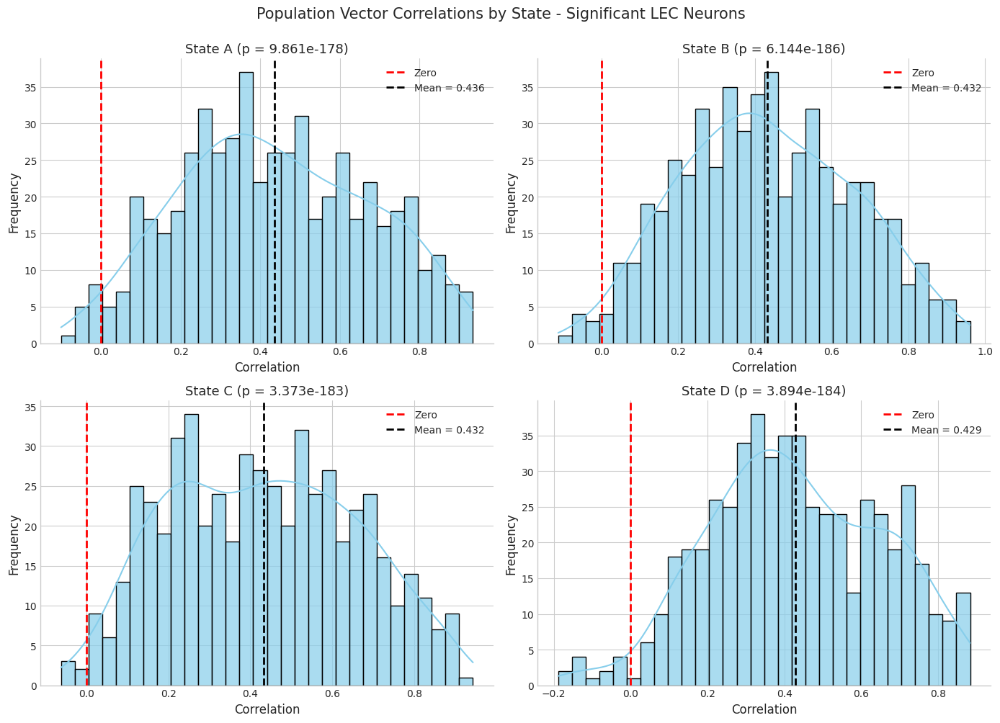


ANALYSIS ACROSS ALL STATES - Significant LEC Neurons

All States Combined:
  N = 2172 correlations
  Mean correlation = 0.432 ± 0.227
  t-statistic = 88.839
  p-value = 0.000e+00


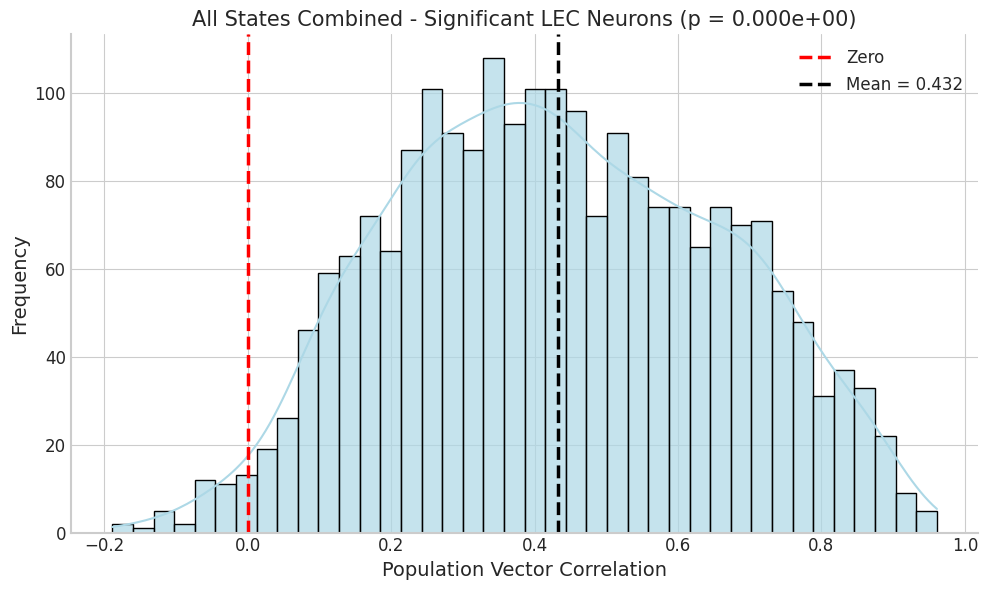


ANALYSIS BY MOUSE - Significant LEC Neurons

Mouse ah08:
  N = 408
  Mean correlation = 0.252 ± 0.161
  t-statistic = 31.565
  p-value = 1.887e-111

Mouse ah10:
  N = 500
  Mean correlation = 0.470 ± 0.196
  t-statistic = 53.457
  p-value = 1.119e-208

Mouse ly05:
  N = 328
  Mean correlation = 0.549 ± 0.232
  t-statistic = 42.844
  p-value = 3.465e-136

Mouse ly06:
  N = 480
  Mean correlation = 0.547 ± 0.212
  t-statistic = 56.309
  p-value = 2.346e-213

Mouse ly07:
  N = 456
  Mean correlation = 0.348 ± 0.179
  t-statistic = 41.510
  p-value = 8.117e-157


/tmp/ipykernel_153311/2460187653.py:318: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=results_df, x='state', y='correlation', palette='Set2', ax=ax)


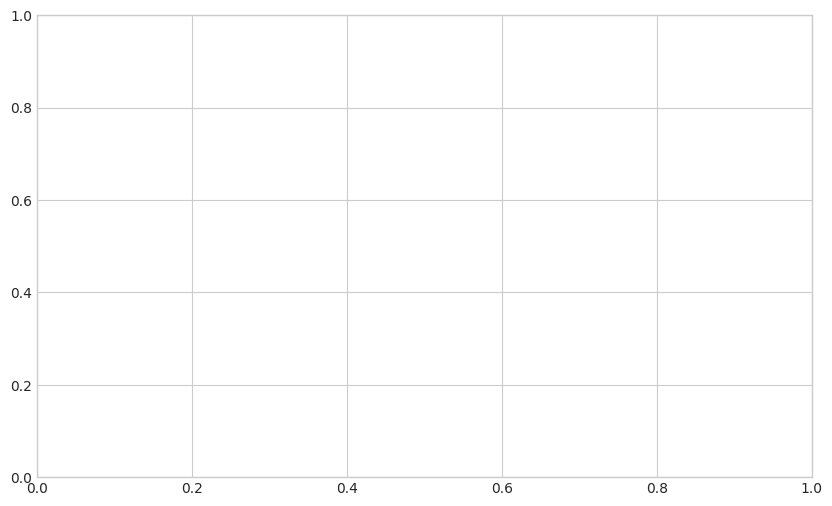

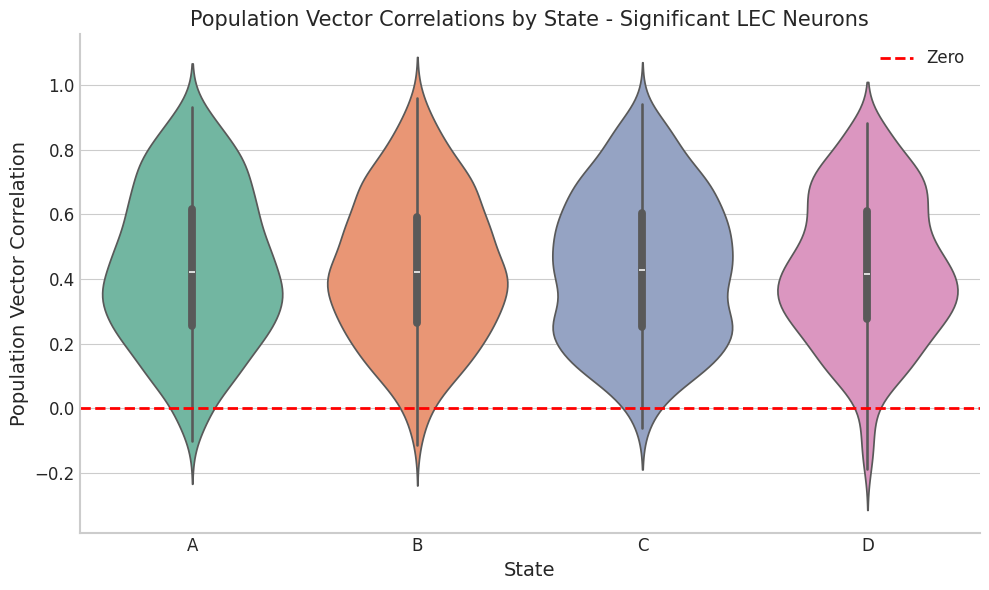


COMPARISON: ALL NEURONS vs SIGNIFICANT LEC NEURONS

All Neurons:
  N = 2172
  Mean = 0.890 ± 0.057

Significant LEC Neurons:
  N = 2172
  Mean = 0.432 ± 0.227

Mann-Whitney U test:
  U-statistic = 4632927.00
  p-value = 0.000e+00


/tmp/ipykernel_153311/2460187653.py:431: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=combined_df, x='Group', y='Correlation', palette=['lightcoral', 'skyblue'], ax=ax)


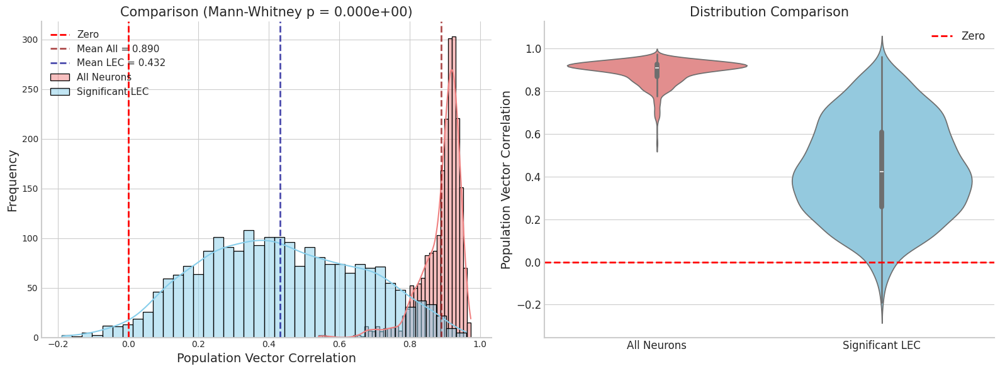

In [34]:
# Population Vector Correlation Analysis
# For each recday and each pair of tasks, calculate correlation of population vectors across states

from scipy.stats import pearsonr, ttest_1samp, mannwhitneyu
from itertools import combinations
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def calculate_population_vector_correlations(data_dic, session_inds_dic, norm_neurons_dic, 
                                             tasks_dic, significant_neurons=None):
    """
    Calculate population vector correlations between pairs of tasks within each recording day.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data for each mouse_recday and session
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    norm_neurons_dic : dict
        Dictionary containing normalized neuron data
    tasks_dic : dict
        Dictionary containing task information for each session
    significant_neurons : dict, optional
        Dictionary mapping mouse_recday to indices of significant neurons
        
    Returns:
    --------
    results_df : pandas DataFrame
        DataFrame with columns: mouse_recday, mouse, date_pair, task_pair, state, correlation
    """
    
    results_list = []
    num_bins = 90
    num_states = 4
    
    for mouse_recday in data_dic.keys():
        if mouse_recday not in session_inds_dic:
            continue
            
        # Get valid sessions for this recday
        valid_sessions = session_inds_dic[mouse_recday]
        
        if len(valid_sessions) < 2:
            continue
            
        print(f"\nProcessing {mouse_recday}")
        print(f"  Valid sessions: {valid_sessions}")
        
        # Extract mouse ID and date pair
        parts = mouse_recday.split('_')
        mouse_id = parts[0]
        date_pair_str = '_'.join(parts[1:])
        
        # Get task labels for each session
        session_tasks = []
        for session in valid_sessions:
            if mouse_recday in tasks_dic and session in tasks_dic[mouse_recday]:
                task = tasks_dic[mouse_recday][session]
                session_tasks.append((session, task))
            else:
                print(f"  Warning: No task found for session {session}")
        
        # Create pairs of non-repeating tasks
        task_pairs = []
        for i, (sess1, task1) in enumerate(session_tasks):
            for sess2, task2 in session_tasks[i+1:]:
                if not np.array_equal(task1, task2):  # Only non-repeating tasks
                    task_pairs.append(((sess1, task1), (sess2, task2)))
        
        if len(task_pairs) == 0:
            print(f"  No valid task pairs found")
            continue
            
        print(f"  Task pairs to analyze: {len(task_pairs)}")
        
        # For each task pair, calculate correlations by state
        for (sess1, task1), (sess2, task2) in task_pairs:
            task1_str = str(task1) if isinstance(task1, str) else f"task_{sess1}"
            task2_str = str(task2) if isinstance(task2, str) else f"task_{sess2}"
            print(f"    Comparing {task1_str} (session {sess1}) vs {task2_str} (session {sess2})")
            
            # Get normalized neurons for both sessions
            if mouse_recday not in norm_neurons_dic:
                print(f"      Warning: No normalized neurons found")
                continue
            
            # norm_neurons_dic[mouse_recday] is a list indexed by position in valid_sessions
            # Need to map session numbers to list positions
            try:
                if isinstance(norm_neurons_dic[mouse_recday], dict):
                    # If it's a dict, use session numbers as keys
                    if isinstance(norm_neurons_dic[mouse_recday][sess1], dict):
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]['Neurons_norm']
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]['Neurons_norm']
                    else:
                        # Direct array access with session as key
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]
                else:
                    # It's a list indexed by position, not session number
                    # Find the position of sess1 and sess2 in the valid_sessions list
                    sess1_idx = valid_sessions.index(sess1)
                    sess2_idx = valid_sessions.index(sess2)
                    norm_data1 = norm_neurons_dic[mouse_recday][sess1_idx]
                    norm_data2 = norm_neurons_dic[mouse_recday][sess2_idx]
            except (IndexError, KeyError, ValueError) as e:
                print(f"      Warning: Could not access normalized data for sessions {sess1}, {sess2}: {e}")
                continue
            
            # Filter for significant neurons if provided
            if significant_neurons is not None and mouse_recday in significant_neurons:
                sig_neuron_inds = significant_neurons[mouse_recday]
                norm_data1 = norm_data1[sig_neuron_inds]
                norm_data2 = norm_data2[sig_neuron_inds]
                print(f"      Using {len(sig_neuron_inds)} significant neurons")
            else:
                print(f"      Using all {norm_data1.shape[0]} neurons")
            
            num_neurons = norm_data1.shape[0]
            
            # Ensure both have the same number of neurons
            if norm_data1.shape[0] != norm_data2.shape[0]:
                print(f"      Warning: Neuron count mismatch, skipping")
                continue
            
            # For each state, calculate population vector correlation
            state_correlations = []
            for state_idx in range(num_states):
                # Extract bins for this state
                state_start = state_idx * num_bins
                state_end = (state_idx + 1) * num_bins
                
                # Average across trials to get population vector for each session
                # Shape: (num_neurons, num_bins)
                pop_vec1 = np.nanmean(norm_data1[:, :, state_start:state_end], axis=1)
                pop_vec2 = np.nanmean(norm_data2[:, :, state_start:state_end], axis=1)
                
                # Flatten to create population vectors
                # Shape: (num_neurons * num_bins,)
                pop_vec1_flat = pop_vec1.flatten()
                pop_vec2_flat = pop_vec2.flatten()
                
                # Remove NaN values
                valid_mask = ~(np.isnan(pop_vec1_flat) | np.isnan(pop_vec2_flat))
                pop_vec1_clean = pop_vec1_flat[valid_mask]
                pop_vec2_clean = pop_vec2_flat[valid_mask]
                
                if len(pop_vec1_clean) > 1:
                    # Calculate correlation
                    corr, p_val = pearsonr(pop_vec1_clean, pop_vec2_clean)
                    state_correlations.append(corr)
                    
                    # Store result
                    state_name = ['A', 'B', 'C', 'D'][state_idx]
                    results_list.append({
                        'mouse_recday': mouse_recday,
                        'mouse': mouse_id,
                        'date_pair': date_pair_str,
                        'session1': sess1,
                        'session2': sess2,
                        'task1': task1_str,
                        'task2': task2_str,
                        'task_pair': f"{task1_str}_vs_{task2_str}",
                        'state': state_name,
                        'correlation': corr,
                        'p_value': p_val,
                        'num_neurons': num_neurons,
                        'num_valid_bins': len(pop_vec1_clean)
                    })
                else:
                    print(f"      Warning: Not enough valid data for state {state_idx}")
            
            if len(state_correlations) > 0:
                mean_corr = np.mean(state_correlations)
                print(f"      Mean correlation across states: {mean_corr:.3f}")
    
    # Convert to DataFrame
    results_df = pd.DataFrame(results_list)
    
    return results_df


def plot_and_analyze_correlations(results_df, title_suffix=""):
    """
    Plot and analyze population vector correlations.
    
    Parameters:
    -----------
    results_df : pandas DataFrame
        Results from calculate_population_vector_correlations
    title_suffix : str
        Suffix to add to plot titles (e.g., "All Neurons" or "Significant LEC Neurons")
    """
    if len(results_df) == 0:
        print(f"No results to plot for {title_suffix}")
        return
    
    # 1. Aggregate by state
    print(f"\n{'='*80}")
    print(f"ANALYSIS BY STATE - {title_suffix}")
    print(f"{'='*80}")
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()
    
    states = ['A', 'B', 'C', 'D']
    state_stats = {}
    
    for idx, state in enumerate(states):
        state_data = results_df[results_df['state'] == state]['correlation'].values
        
        if len(state_data) > 0:
            # Statistical test against zero
            t_stat, p_value = ttest_1samp(state_data, 0)
            mean_corr = np.mean(state_data)
            std_corr = np.std(state_data)
            
            state_stats[state] = {
                'mean': mean_corr,
                'std': std_corr,
                't_stat': t_stat,
                'p_value': p_value,
                'n': len(state_data)
            }
            
            print(f"\nState {state}:")
            print(f"  N = {len(state_data)} task pairs")
            print(f"  Mean correlation = {mean_corr:.3f} ± {std_corr:.3f}")
            print(f"  t-statistic = {t_stat:.3f}")
            print(f"  p-value = {p_value:.3e}")
            
            # Plot histogram
            ax = axes[idx]
            sns.histplot(state_data, kde=True, color="skyblue", bins=30, ax=ax, alpha=0.7)
            ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
            ax.axvline(x=mean_corr, color='black', linestyle='--', linewidth=2, 
                      label=f'Mean = {mean_corr:.3f}')
            ax.set_xlabel('Correlation', fontsize=12)
            ax.set_ylabel('Frequency', fontsize=12)
            ax.set_title(f'State {state} (p = {p_value:.3e})', fontsize=13)
            ax.legend()
            sns.despine(ax=ax)
    
    plt.suptitle(f'Population Vector Correlations by State - {title_suffix}', 
                 fontsize=15, y=1.00)
    plt.tight_layout()
    plt.show()
    
    # 2. Aggregate across all states
    print(f"\n{'='*80}")
    print(f"ANALYSIS ACROSS ALL STATES - {title_suffix}")
    print(f"{'='*80}")
    
    all_corrs = results_df['correlation'].values
    t_stat, p_value = ttest_1samp(all_corrs, 0)
    mean_corr = np.mean(all_corrs)
    std_corr = np.std(all_corrs)
    
    print(f"\nAll States Combined:")
    print(f"  N = {len(all_corrs)} correlations")
    print(f"  Mean correlation = {mean_corr:.3f} ± {std_corr:.3f}")
    print(f"  t-statistic = {t_stat:.3f}")
    print(f"  p-value = {p_value:.3e}")
    
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.histplot(all_corrs, kde=True, color="lightblue", bins=40, alpha=0.7)
    ax.axvline(x=0, color='red', linestyle='--', linewidth=2.5, label='Zero')
    ax.axvline(x=mean_corr, color='black', linestyle='--', linewidth=2.5, 
              label=f'Mean = {mean_corr:.3f}')
    ax.set_xlabel('Population Vector Correlation', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title(f'All States Combined - {title_suffix} (p = {p_value:.3e})', fontsize=15)
    ax.legend(fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    sns.despine()
    plt.tight_layout()
    plt.show()
    
    # 3. Aggregate by mouse
    print(f"\n{'='*80}")
    print(f"ANALYSIS BY MOUSE - {title_suffix}")
    print(f"{'='*80}")
    
    mice = results_df['mouse'].unique()
    mouse_stats = {}
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for mouse in sorted(mice):
        mouse_data = results_df[results_df['mouse'] == mouse]['correlation'].values
        
        if len(mouse_data) > 0:
            mean_corr = np.mean(mouse_data)
            std_corr = np.std(mouse_data)
            t_stat, p_value = ttest_1samp(mouse_data, 0)
            
            mouse_stats[mouse] = {
                'mean': mean_corr,
                'std': std_corr,
                't_stat': t_stat,
                'p_value': p_value,
                'n': len(mouse_data)
            }
            
            print(f"\nMouse {mouse}:")
            print(f"  N = {len(mouse_data)}")
            print(f"  Mean correlation = {mean_corr:.3f} ± {std_corr:.3f}")
            print(f"  t-statistic = {t_stat:.3f}")
            print(f"  p-value = {p_value:.3e}")
    
    # Violin plot by state
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.violinplot(data=results_df, x='state', y='correlation', palette='Set2', ax=ax)
    ax.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.set_ylabel('Population Vector Correlation', fontsize=14)
    ax.set_xlabel('State', fontsize=14)
    ax.set_title(f'Population Vector Correlations by State - {title_suffix}', fontsize=15)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.legend(fontsize=12)
    sns.despine()
    plt.tight_layout()
    plt.show()
    
    return {
        'state_stats': state_stats,
        'mouse_stats': mouse_stats,
        'overall': {
            'mean': mean_corr,
            'std': std_corr,
            't_stat': t_stat,
            'p_value': p_value,
            'n': len(all_corrs)
        }
    }


# Example usage (copy each section into separate cells):

# CELL 1: Run analysis for all neurons
print("=" * 80)
print("ANALYZING ALL NEURONS")
print("=" * 80)
correlation_results_all = calculate_population_vector_correlations(
    data_dic, session_inds_dic, norm_neurons_dic, tasks_dic, 
    significant_neurons=None
)
print(f"\n\nTotal results: {len(correlation_results_all)}")
if len(correlation_results_all) > 0:
    print(correlation_results_all.head(10))

# CELL 2: Run analysis for significant LEC neurons
print("\n" + "=" * 80)
print("ANALYZING SIGNIFICANT LEC NEURONS ONLY")
print("=" * 80)
correlation_results_lec = calculate_population_vector_correlations(
    data_dic, session_inds_dic, norm_neurons_dic, tasks_dic, 
    significant_neurons=sig_lec_neurons_dic
)
print(f"\n\nTotal results: {len(correlation_results_lec)}")
if len(correlation_results_lec) > 0:
    print(correlation_results_lec.head(10))

# CELL 3: Plot and analyze results for all neurons
if len(correlation_results_all) > 0:
    stats_all = plot_and_analyze_correlations(correlation_results_all, "All Neurons")

# CELL 4: Plot and analyze results for significant LEC neurons
if len(correlation_results_lec) > 0:
    stats_lec = plot_and_analyze_correlations(correlation_results_lec, "Significant LEC Neurons")

# CELL 5: Comparison between All Neurons and Significant LEC Neurons
print("\n" + "=" * 80)
print("COMPARISON: ALL NEURONS vs SIGNIFICANT LEC NEURONS")
print("=" * 80)

if len(correlation_results_all) > 0 and len(correlation_results_lec) > 0:
    # Compare overall correlations
    all_corrs_all = correlation_results_all['correlation'].values
    all_corrs_lec = correlation_results_lec['correlation'].values
    
    # Mann-Whitney U test
    u_stat, p_value = mannwhitneyu(all_corrs_all, all_corrs_lec, alternative='two-sided')
    
    print(f"\nAll Neurons:")
    print(f"  N = {len(all_corrs_all)}")
    print(f"  Mean = {np.mean(all_corrs_all):.3f} ± {np.std(all_corrs_all):.3f}")
    
    print(f"\nSignificant LEC Neurons:")
    print(f"  N = {len(all_corrs_lec)}")
    print(f"  Mean = {np.mean(all_corrs_lec):.3f} ± {np.std(all_corrs_lec):.3f}")
    
    print(f"\nMann-Whitney U test:")
    print(f"  U-statistic = {u_stat:.2f}")
    print(f"  p-value = {p_value:.3e}")
    
    # Side-by-side comparison plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Histogram comparison
    ax = axes[0]
    sns.histplot(all_corrs_all, kde=True, color="lightcoral", bins=40, 
                 alpha=0.5, label='All Neurons', ax=ax)
    sns.histplot(all_corrs_lec, kde=True, color="skyblue", bins=40, 
                 alpha=0.5, label='Significant LEC', ax=ax)
    ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.axvline(x=np.mean(all_corrs_all), color='darkred', linestyle='--', 
              linewidth=2, alpha=0.7, label=f'Mean All = {np.mean(all_corrs_all):.3f}')
    ax.axvline(x=np.mean(all_corrs_lec), color='darkblue', linestyle='--', 
              linewidth=2, alpha=0.7, label=f'Mean LEC = {np.mean(all_corrs_lec):.3f}')
    ax.set_xlabel('Population Vector Correlation', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title(f'Comparison (Mann-Whitney p = {p_value:.3e})', fontsize=15)
    ax.legend(fontsize=11)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    sns.despine(ax=ax)
    
    # Violin plot comparison
    ax = axes[1]
    combined_df = pd.DataFrame({
        'Correlation': np.concatenate([all_corrs_all, all_corrs_lec]),
        'Group': ['All Neurons'] * len(all_corrs_all) + ['Significant LEC'] * len(all_corrs_lec)
    })
    sns.violinplot(data=combined_df, x='Group', y='Correlation', palette=['lightcoral', 'skyblue'], ax=ax)
    ax.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.set_ylabel('Population Vector Correlation', fontsize=14)
    ax.set_xlabel('', fontsize=14)
    ax.set_title('Distribution Comparison', fontsize=15)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.legend(fontsize=12)
    sns.despine(ax=ax)
    
    plt.tight_layout()
    plt.show()


In [37]:
# Population Vector Similarity Analysis
# For each recday and each pair of tasks, calculate cosine similarity of population vectors across states

from scipy.stats import ttest_1samp, mannwhitneyu, zscore
from sklearn.metrics.pairwise import cosine_similarity
from itertools import combinations
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def calculate_population_vector_correlations(data_dic, session_inds_dic, norm_neurons_dic, 
                                             tasks_dic, significant_neurons=None):
    """
    Calculate population vector cosine similarity between pairs of tasks within each recording day.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data for each mouse_recday and session
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    norm_neurons_dic : dict
        Dictionary containing normalized neuron data
    tasks_dic : dict
        Dictionary containing task information for each session
    significant_neurons : dict, optional
        Dictionary mapping mouse_recday to indices of significant neurons
        
    Returns:
    --------
    results_df : pandas DataFrame
        DataFrame with columns: mouse_recday, mouse, date_pair, task_pair, state, similarity
    """
    
    results_list = []
    num_bins = 90
    num_states = 4
    
    for mouse_recday in data_dic.keys():
        if mouse_recday not in session_inds_dic:
            continue
            
        # Get valid sessions for this recday
        valid_sessions = session_inds_dic[mouse_recday]
        
        if len(valid_sessions) < 2:
            continue
            
        print(f"\nProcessing {mouse_recday}")
        print(f"  Valid sessions: {valid_sessions}")
        
        # Extract mouse ID and date pair
        parts = mouse_recday.split('_')
        mouse_id = parts[0]
        date_pair_str = '_'.join(parts[1:])
        
        # Get task labels for each session
        session_tasks = []
        for session in valid_sessions:
            if mouse_recday in tasks_dic and session in tasks_dic[mouse_recday]:
                task = tasks_dic[mouse_recday][session]
                session_tasks.append((session, task))
            else:
                print(f"  Warning: No task found for session {session}")
        
        # Create pairs of non-repeating tasks
        task_pairs = []
        for i, (sess1, task1) in enumerate(session_tasks):
            for sess2, task2 in session_tasks[i+1:]:
                if not np.array_equal(task1, task2):  # Only non-repeating tasks
                    task_pairs.append(((sess1, task1), (sess2, task2)))
        
        if len(task_pairs) == 0:
            print(f"  No valid task pairs found")
            continue
            
        print(f"  Task pairs to analyze: {len(task_pairs)}")
        
        # For each task pair, calculate correlations by state
        for (sess1, task1), (sess2, task2) in task_pairs:
            task1_str = str(task1) if isinstance(task1, str) else f"task_{sess1}"
            task2_str = str(task2) if isinstance(task2, str) else f"task_{sess2}"
            print(f"    Comparing {task1_str} (session {sess1}) vs {task2_str} (session {sess2})")
            
            # Get normalized neurons for both sessions
            if mouse_recday not in norm_neurons_dic:
                print(f"      Warning: No normalized neurons found")
                continue
            
            # norm_neurons_dic[mouse_recday] is a list indexed by position in valid_sessions
            # Need to map session numbers to list positions
            try:
                if isinstance(norm_neurons_dic[mouse_recday], dict):
                    # If it's a dict, use session numbers as keys
                    if isinstance(norm_neurons_dic[mouse_recday][sess1], dict):
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]['Neurons_norm']
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]['Neurons_norm']
                    else:
                        # Direct array access with session as key
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]
                else:
                    # It's a list indexed by position, not session number
                    # Find the position of sess1 and sess2 in the valid_sessions list
                    sess1_idx = valid_sessions.index(sess1)
                    sess2_idx = valid_sessions.index(sess2)
                    norm_data1 = norm_neurons_dic[mouse_recday][sess1_idx]
                    norm_data2 = norm_neurons_dic[mouse_recday][sess2_idx]
            except (IndexError, KeyError, ValueError) as e:
                print(f"      Warning: Could not access normalized data for sessions {sess1}, {sess2}: {e}")
                continue
            
            # Filter for significant neurons if provided
            if significant_neurons is not None and mouse_recday in significant_neurons:
                sig_neuron_inds = significant_neurons[mouse_recday]
                norm_data1 = norm_data1[sig_neuron_inds]
                norm_data2 = norm_data2[sig_neuron_inds]
                print(f"      Using {len(sig_neuron_inds)} significant neurons")
            else:
                print(f"      Using all {norm_data1.shape[0]} neurons")
            
            num_neurons = norm_data1.shape[0]
            
            # Ensure both have the same number of neurons
            if norm_data1.shape[0] != norm_data2.shape[0]:
                print(f"      Warning: Neuron count mismatch, skipping")
                continue
            
            # For each state, calculate population vector cosine similarity across trials
            state_correlations = []
            for state_idx in range(num_states):
                # Extract bins for this state
                state_start = state_idx * num_bins
                state_end = (state_idx + 1) * num_bins
                
                # Get state data for both sessions
                # Shape: (num_neurons, num_trials, num_bins_in_state)
                state_data1 = norm_data1[:, :, state_start:state_end]
                state_data2 = norm_data2[:, :, state_start:state_end]
                
                # Get number of trials for each session
                num_trials1 = state_data1.shape[1]
                num_trials2 = state_data2.shape[1]
                
                # Calculate cosine similarity between all pairs of trials from the two tasks
                # For each trial pair, flatten (neurons x bins) into a single population vector
                trial_pair_similarities = []
                
                for trial1_idx in range(num_trials1):
                    for trial2_idx in range(num_trials2):
                        # Get population vectors for this trial pair
                        # Shape: (num_neurons, num_bins) -> flatten to (num_neurons * num_bins,)
                        pop_vec1 = state_data1[:, trial1_idx, :].flatten()
                        pop_vec2 = state_data2[:, trial2_idx, :].flatten()
                        
                        # Remove NaN values
                        valid_mask = ~(np.isnan(pop_vec1) | np.isnan(pop_vec2))
                        pop_vec1_clean = pop_vec1[valid_mask]
                        pop_vec2_clean = pop_vec2[valid_mask]
                        
                        if len(pop_vec1_clean) > 1:
                            # Z-score each population vector
                            pop_vec1_z = zscore(pop_vec1_clean, nan_policy='omit')
                            pop_vec2_z = zscore(pop_vec2_clean, nan_policy='omit')
                            
                            # Calculate cosine similarity for this trial pair
                            # Reshape for sklearn: (1, n_features) for each vector
                            similarity = cosine_similarity(
                                pop_vec1_z.reshape(1, -1), 
                                pop_vec2_z.reshape(1, -1)
                            )[0, 0]
                            trial_pair_similarities.append(similarity)
                
                # Average similarity across all trial pairs for this state
                if len(trial_pair_similarities) > 0:
                    mean_sim = np.mean(trial_pair_similarities)
                    std_sim = np.std(trial_pair_similarities)
                    state_correlations.append(mean_sim)
                    
                    # Store result
                    state_name = ['A', 'B', 'C', 'D'][state_idx]
                    results_list.append({
                        'mouse_recday': mouse_recday,
                        'mouse': mouse_id,
                        'date_pair': date_pair_str,
                        'session1': sess1,
                        'session2': sess2,
                        'task1': task1_str,
                        'task2': task2_str,
                        'task_pair': f"{task1_str}_vs_{task2_str}",
                        'state': state_name,
                        'similarity': mean_sim,
                        'similarity_std': std_sim,
                        'num_trial_pairs': len(trial_pair_similarities),
                        'num_neurons': num_neurons,
                        'num_trials_task1': num_trials1,
                        'num_trials_task2': num_trials2
                    })
                    
                    print(f"      State {state_name}: {len(trial_pair_similarities)} trial pairs, mean similarity={mean_sim:.3f}±{std_sim:.3f}")
                else:
                    print(f"      Warning: Not enough valid data for state {state_idx}")
            
            if len(state_correlations) > 0:
                mean_corr = np.mean(state_correlations)
                print(f"      Mean correlation across states: {mean_corr:.3f}")
    
    # Convert to DataFrame
    results_df = pd.DataFrame(results_list)
    
    return results_df


def plot_and_analyze_correlations(results_df, title_suffix=""):
    """
    Plot and analyze population vector cosine similarities.
    
    Parameters:
    -----------
    results_df : pandas DataFrame
        Results from calculate_population_vector_correlations
    title_suffix : str
        Suffix to add to plot titles (e.g., "All Neurons" or "Significant LEC Neurons")
    """
    if len(results_df) == 0:
        print(f"No results to plot for {title_suffix}")
        return
    
    # 1. Aggregate by state
    print(f"\n{'='*80}")
    print(f"ANALYSIS BY STATE - {title_suffix}")
    print(f"{'='*80}")
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()
    
    states = ['A', 'B', 'C', 'D']
    state_stats = {}
    
    for idx, state in enumerate(states):
        state_data = results_df[results_df['state'] == state]['similarity'].values
        
        if len(state_data) > 0:
            # Statistical test against zero
            t_stat, p_value = ttest_1samp(state_data, 0)
            mean_sim = np.mean(state_data)
            std_sim = np.std(state_data)
            
            state_stats[state] = {
                'mean': mean_sim,
                'std': std_sim,
                't_stat': t_stat,
                'p_value': p_value,
                'n': len(state_data)
            }
            
            print(f"\nState {state}:")
            print(f"  N = {len(state_data)} task pairs")
            print(f"  Mean similarity = {mean_sim:.3f} ± {std_sim:.3f}")
            print(f"  t-statistic = {t_stat:.3f}")
            print(f"  p-value = {p_value:.3e}")
            
            # Plot histogram
            ax = axes[idx]
            sns.histplot(state_data, kde=True, color="skyblue", bins=30, ax=ax, alpha=0.7)
            ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
            ax.axvline(x=mean_sim, color='black', linestyle='--', linewidth=2, 
                      label=f'Mean = {mean_sim:.3f}')
            ax.set_xlabel('Cosine Similarity', fontsize=12)
            ax.set_ylabel('Frequency', fontsize=12)
            ax.set_title(f'State {state} (p = {p_value:.3e})', fontsize=13)
            ax.legend()
            sns.despine(ax=ax)
    
    plt.suptitle(f'Population Vector Cosine Similarities by State - {title_suffix}', 
                 fontsize=15, y=1.00)
    plt.tight_layout()
    plt.show()
    
    # 2. Aggregate across all states
    print(f"\n{'='*80}")
    print(f"ANALYSIS ACROSS ALL STATES - {title_suffix}")
    print(f"{'='*80}")
    
    all_corrs = results_df['correlation'].values
    t_stat, p_value = ttest_1samp(all_corrs, 0)
    mean_corr = np.mean(all_corrs)
    std_corr = np.std(all_corrs)
    
    print(f"\nAll States Combined:")
    print(f"  N = {len(all_corrs)} correlations")
    print(f"  Mean correlation = {mean_corr:.3f} ± {std_corr:.3f}")
    print(f"  t-statistic = {t_stat:.3f}")
    print(f"  p-value = {p_value:.3e}")
    
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.histplot(all_corrs, kde=True, color="lightblue", bins=40, alpha=0.7)
    ax.axvline(x=0, color='red', linestyle='--', linewidth=2.5, label='Zero')
    ax.axvline(x=mean_corr, color='black', linestyle='--', linewidth=2.5, 
              label=f'Mean = {mean_corr:.3f}')
    ax.set_xlabel('Population Vector Correlation', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title(f'All States Combined - {title_suffix} (p = {p_value:.3e})', fontsize=15)
    ax.legend(fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    sns.despine()
    plt.tight_layout()
    plt.show()
    
    # 3. Aggregate by mouse
    print(f"\n{'='*80}")
    print(f"ANALYSIS BY MOUSE - {title_suffix}")
    print(f"{'='*80}")
    
    mice = results_df['mouse'].unique()
    mouse_stats = {}
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for mouse in sorted(mice):
        mouse_data = results_df[results_df['mouse'] == mouse]['correlation'].values
        
        if len(mouse_data) > 0:
            mean_corr = np.mean(mouse_data)
            std_corr = np.std(mouse_data)
            t_stat, p_value = ttest_1samp(mouse_data, 0)
            
            mouse_stats[mouse] = {
                'mean': mean_corr,
                'std': std_corr,
                't_stat': t_stat,
                'p_value': p_value,
                'n': len(mouse_data)
            }
            
            print(f"\nMouse {mouse}:")
            print(f"  N = {len(mouse_data)}")
            print(f"  Mean correlation = {mean_corr:.3f} ± {std_corr:.3f}")
            print(f"  t-statistic = {t_stat:.3f}")
            print(f"  p-value = {p_value:.3e}")
    
    # Violin plot by state
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.violinplot(data=results_df, x='state', y='correlation', palette='Set2', ax=ax)
    ax.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.set_ylabel('Population Vector Correlation', fontsize=14)
    ax.set_xlabel('State', fontsize=14)
    ax.set_title(f'Population Vector Correlations by State - {title_suffix}', fontsize=15)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.legend(fontsize=12)
    sns.despine()
    plt.tight_layout()
    plt.show()
    
    return {
        'state_stats': state_stats,
        'mouse_stats': mouse_stats,
        'overall': {
            'mean': mean_corr,
            'std': std_corr,
            't_stat': t_stat,
            'p_value': p_value,
            'n': len(all_corrs)
        }
    }


# Example usage (copy each section into separate cells):

# CELL 1: Run analysis for all neurons
print("=" * 80)
print("ANALYZING ALL NEURONS")
print("=" * 80)
correlation_results_all = calculate_population_vector_correlations(
    data_dic, session_inds_dic, norm_neurons_dic, tasks_dic, 
    significant_neurons=None
)
print(f"\n\nTotal results: {len(correlation_results_all)}")
if len(correlation_results_all) > 0:
    print(correlation_results_all.head(10))

# CELL 2: Run analysis for significant LEC neurons
print("\n" + "=" * 80)
print("ANALYZING SIGNIFICANT LEC NEURONS ONLY")
print("=" * 80)
correlation_results_lec = calculate_population_vector_correlations(
    data_dic, session_inds_dic, norm_neurons_dic, tasks_dic, 
    significant_neurons=sig_lec_neurons_dic
)
print(f"\n\nTotal results: {len(correlation_results_lec)}")
if len(correlation_results_lec) > 0:
    print(correlation_results_lec.head(10))

# CELL 3: Plot and analyze results for all neurons
if len(correlation_results_all) > 0:
    stats_all = plot_and_analyze_correlations(correlation_results_all, "All Neurons")

# CELL 4: Plot and analyze results for significant LEC neurons
if len(correlation_results_lec) > 0:
    stats_lec = plot_and_analyze_correlations(correlation_results_lec, "Significant LEC Neurons")

# CELL 5: Comparison between All Neurons and Significant LEC Neurons
print("\n" + "=" * 80)
print("COMPARISON: ALL NEURONS vs SIGNIFICANT LEC NEURONS")
print("=" * 80)

if len(correlation_results_all) > 0 and len(correlation_results_lec) > 0:
    # Compare overall correlations
    all_corrs_all = correlation_results_all['correlation'].values
    all_corrs_lec = correlation_results_lec['correlation'].values
    
    # Mann-Whitney U test
    u_stat, p_value = mannwhitneyu(all_corrs_all, all_corrs_lec, alternative='two-sided')
    
    print(f"\nAll Neurons:")
    print(f"  N = {len(all_corrs_all)}")
    print(f"  Mean = {np.mean(all_corrs_all):.3f} ± {np.std(all_corrs_all):.3f}")
    
    print(f"\nSignificant LEC Neurons:")
    print(f"  N = {len(all_corrs_lec)}")
    print(f"  Mean = {np.mean(all_corrs_lec):.3f} ± {np.std(all_corrs_lec):.3f}")
    
    print(f"\nMann-Whitney U test:")
    print(f"  U-statistic = {u_stat:.2f}")
    print(f"  p-value = {p_value:.3e}")
    
    # Side-by-side comparison plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Histogram comparison
    ax = axes[0]
    sns.histplot(all_corrs_all, kde=True, color="lightcoral", bins=40, 
                 alpha=0.5, label='All Neurons', ax=ax)
    sns.histplot(all_corrs_lec, kde=True, color="skyblue", bins=40, 
                 alpha=0.5, label='Significant LEC', ax=ax)
    ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.axvline(x=np.mean(all_corrs_all), color='darkred', linestyle='--', 
              linewidth=2, alpha=0.7, label=f'Mean All = {np.mean(all_corrs_all):.3f}')
    ax.axvline(x=np.mean(all_corrs_lec), color='darkblue', linestyle='--', 
              linewidth=2, alpha=0.7, label=f'Mean LEC = {np.mean(all_corrs_lec):.3f}')
    ax.set_xlabel('Population Vector Correlation', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title(f'Comparison (Mann-Whitney p = {p_value:.3e})', fontsize=15)
    ax.legend(fontsize=11)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    sns.despine(ax=ax)
    
    # Violin plot comparison
    ax = axes[1]
    combined_df = pd.DataFrame({
        'Correlation': np.concatenate([all_corrs_all, all_corrs_lec]),
        'Group': ['All Neurons'] * len(all_corrs_all) + ['Significant LEC'] * len(all_corrs_lec)
    })
    sns.violinplot(data=combined_df, x='Group', y='Correlation', palette=['lightcoral', 'skyblue'], ax=ax)
    ax.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.set_ylabel('Population Vector Correlation', fontsize=14)
    ax.set_xlabel('', fontsize=14)
    ax.set_title('Distribution Comparison', fontsize=15)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.legend(fontsize=12)
    sns.despine(ax=ax)
    
    plt.tight_layout()
    plt.show()


ANALYZING ALL NEURONS

Processing ah08_20250613_20250615
  Valid sessions: [0, 1, 2, 3, 4, 5, 6, 7]
  Task pairs to analyze: 26
    Comparing task_0 (session 0) vs task_1 (session 1)
      Using all 151 neurons
      State A: 45 trial pairs, mean similarity=0.654±0.060
      State B: 45 trial pairs, mean similarity=0.612±0.056
      State C: 45 trial pairs, mean similarity=0.630±0.083
      State D: 45 trial pairs, mean similarity=0.592±0.075
      Mean correlation across states: 0.622
    Comparing task_0 (session 0) vs task_2 (session 2)
      Using all 151 neurons
      State A: 35 trial pairs, mean similarity=0.681±0.050
      State B: 35 trial pairs, mean similarity=0.698±0.057
      State C: 35 trial pairs, mean similarity=0.615±0.086
      State D: 35 trial pairs, mean similarity=0.551±0.067
      Mean correlation across states: 0.636
    Comparing task_0 (session 0) vs task_4 (session 4)
      Using all 151 neurons
      State A: 55 trial pairs, mean similarity=0.590±0.044
    

KeyboardInterrupt: 

ANALYZING ALL NEURONS

Processing ah08_20250613_20250615
  Valid sessions: [0, 1, 2, 3, 4, 5, 6, 7]
  Task pairs to analyze: 26
    Comparing task_0 (session 0) vs task_1 (session 1)
      Using all 151 neurons
      State A: similarity=0.910
      State B: similarity=0.886
      State C: similarity=0.884
      State D: similarity=0.859
      Mean similarity across states: 0.885
    Comparing task_0 (session 0) vs task_2 (session 2)
      Using all 151 neurons
      State A: similarity=0.909
      State B: similarity=0.913
      State C: similarity=0.871
      State D: similarity=0.839
      Mean similarity across states: 0.883
    Comparing task_0 (session 0) vs task_4 (session 4)
      Using all 151 neurons
      State A: similarity=0.857
      State B: similarity=0.862
      State C: similarity=0.828
      State D: similarity=0.804
      Mean similarity across states: 0.838
    Comparing task_0 (session 0) vs task_5 (session 5)
      Using all 151 neurons
      State A: similarity=0

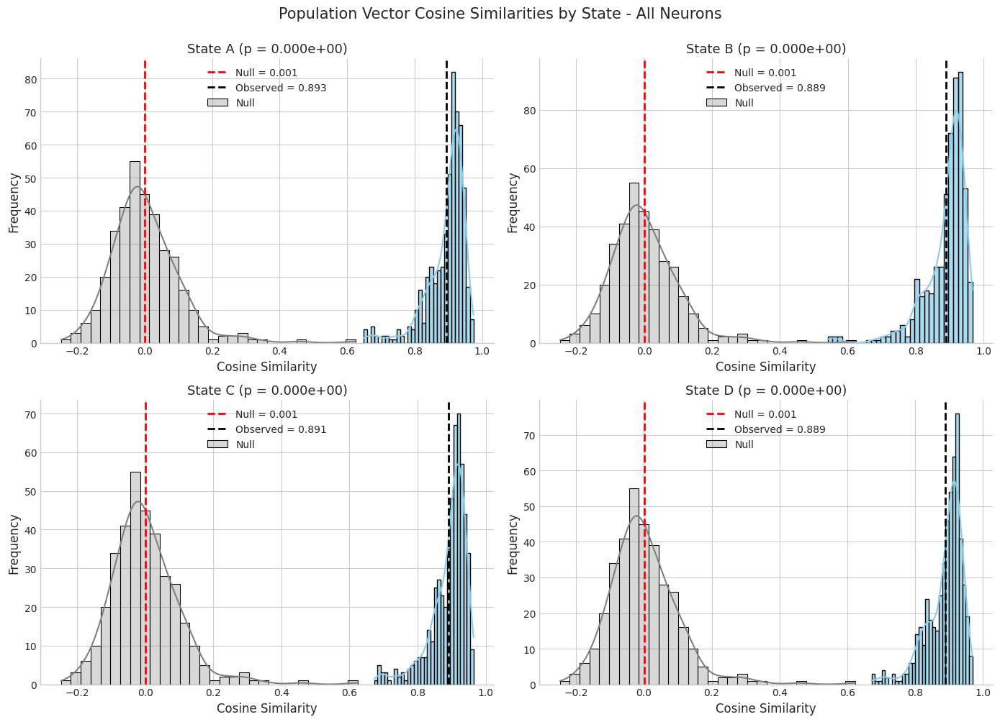


ANALYSIS ACROSS ALL STATES - All Neurons

All States Combined:
  N = 2172 similarities
  Observed mean = 0.890 ± 0.057
  Null mean = 0.001 ± 0.100
  t-statistic (vs null) = 725.924
  p-value (vs null) = 0.000e+00
  Effect size (Cohen's d) = 8.867


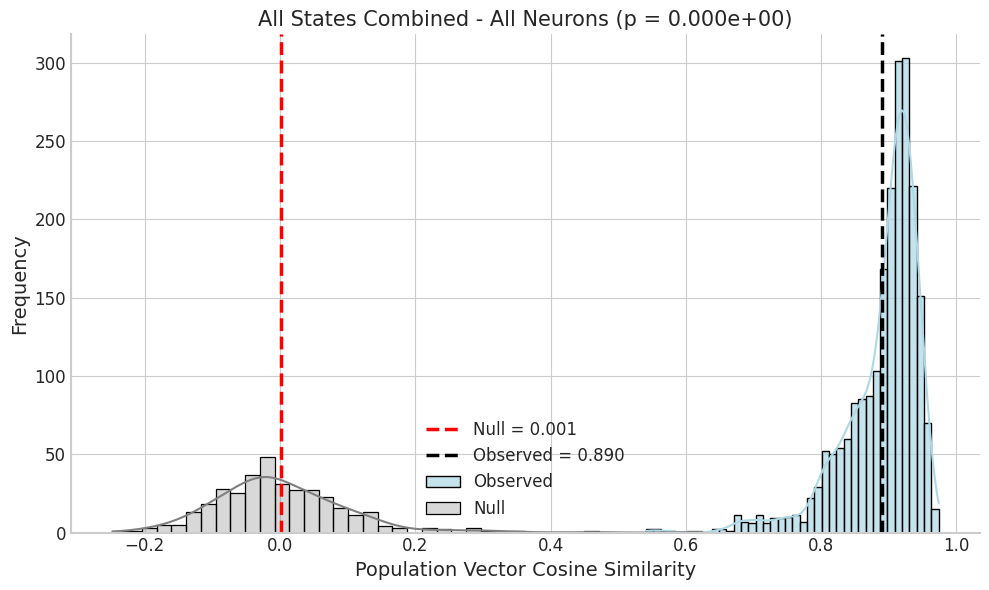


ANALYSIS BY MOUSE - All Neurons

Mouse ah08:
  N = 408
  Mean similarity = 0.867 ± 0.063
  t-statistic = 277.609
  p-value = 0.000e+00

Mouse ah10:
  N = 500
  Mean similarity = 0.903 ± 0.032
  t-statistic = 624.128
  p-value = 0.000e+00

Mouse ly05:
  N = 328
  Mean similarity = 0.844 ± 0.075
  t-statistic = 202.181
  p-value = 0.000e+00

Mouse ly06:
  N = 480
  Mean similarity = 0.927 ± 0.028
  t-statistic = 734.167
  p-value = 0.000e+00

Mouse ly07:
  N = 456
  Mean similarity = 0.892 ± 0.047
  t-statistic = 403.807
  p-value = 0.000e+00


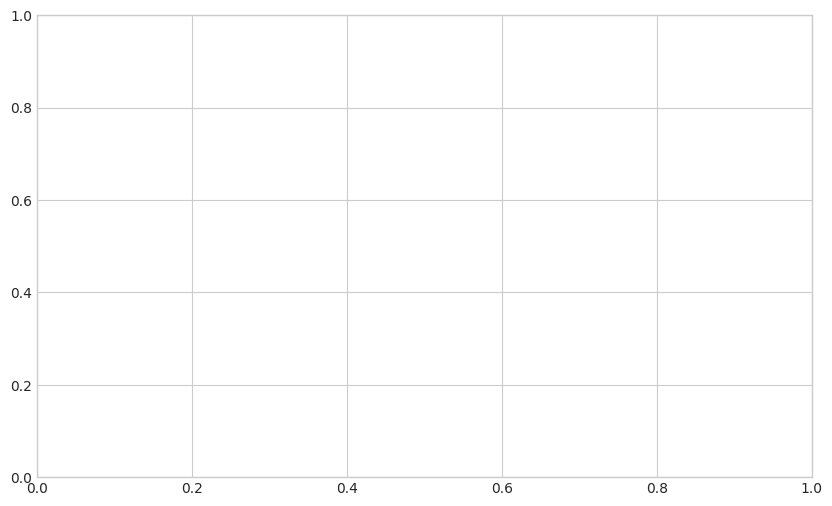

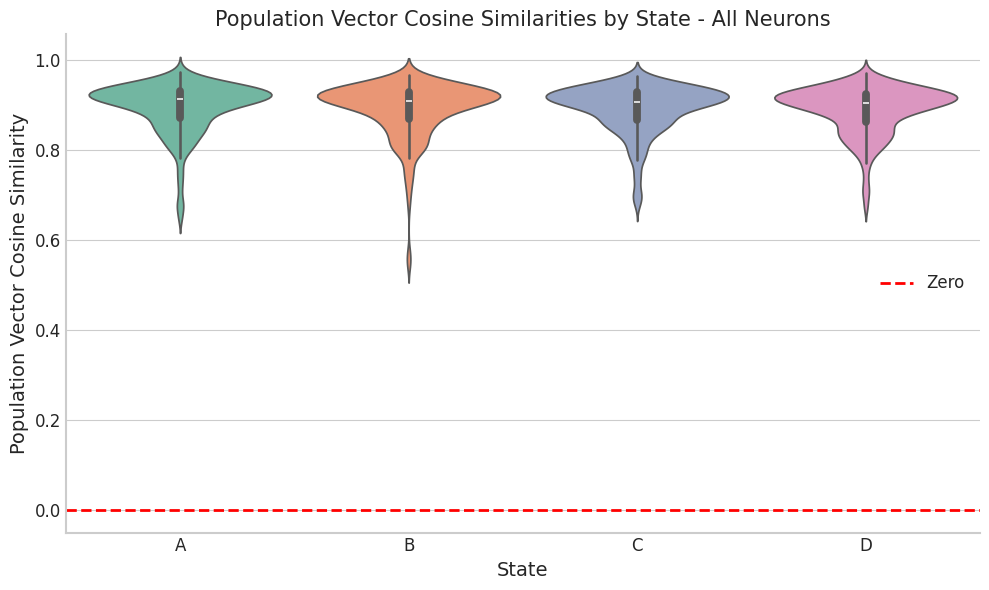


ANALYSIS BY STATE - Significant LEC Neurons

State A:
  N = 543 task pairs
  Observed mean = 0.436 ± 0.235
  Null mean = -0.011 ± 0.188
  t-statistic (vs null) = 44.323
  p-value (vs null) = 2.243e-182
  Effect size (Cohen's d) = 2.375

State B:
  N = 543 task pairs
  Observed mean = 0.432 ± 0.223
  Null mean = -0.011 ± 0.188
  t-statistic (vs null) = 46.351
  p-value (vs null) = 1.040e-190
  Effect size (Cohen's d) = 2.356

State C:
  N = 543 task pairs
  Observed mean = 0.432 ± 0.226
  Null mean = -0.011 ± 0.188
  t-statistic (vs null) = 45.673
  p-value (vs null) = 6.034e-188
  Effect size (Cohen's d) = 2.353

State D:
  N = 543 task pairs
  Observed mean = 0.429 ± 0.223
  Null mean = -0.011 ± 0.188
  t-statistic (vs null) = 45.912
  p-value (vs null) = 6.352e-189
  Effect size (Cohen's d) = 2.338


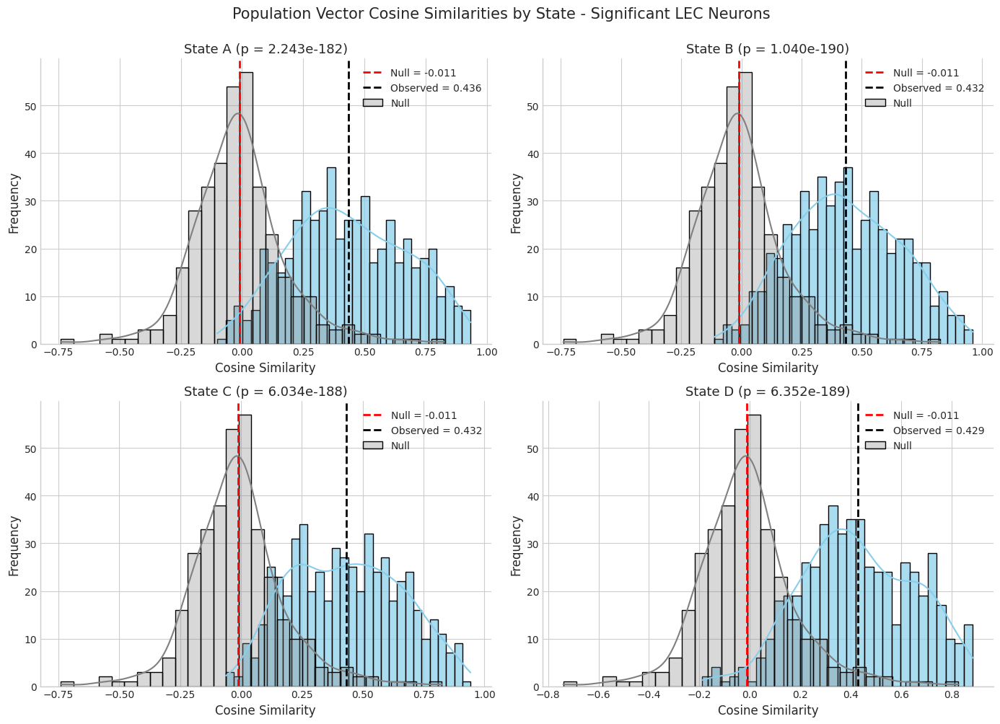


ANALYSIS ACROSS ALL STATES - Significant LEC Neurons

All States Combined:
  N = 2172 similarities
  Observed mean = 0.432 ± 0.227
  Null mean = -0.011 ± 0.188
  t-statistic (vs null) = 91.134
  p-value (vs null) = 0.000e+00
  Effect size (Cohen's d) = 2.355


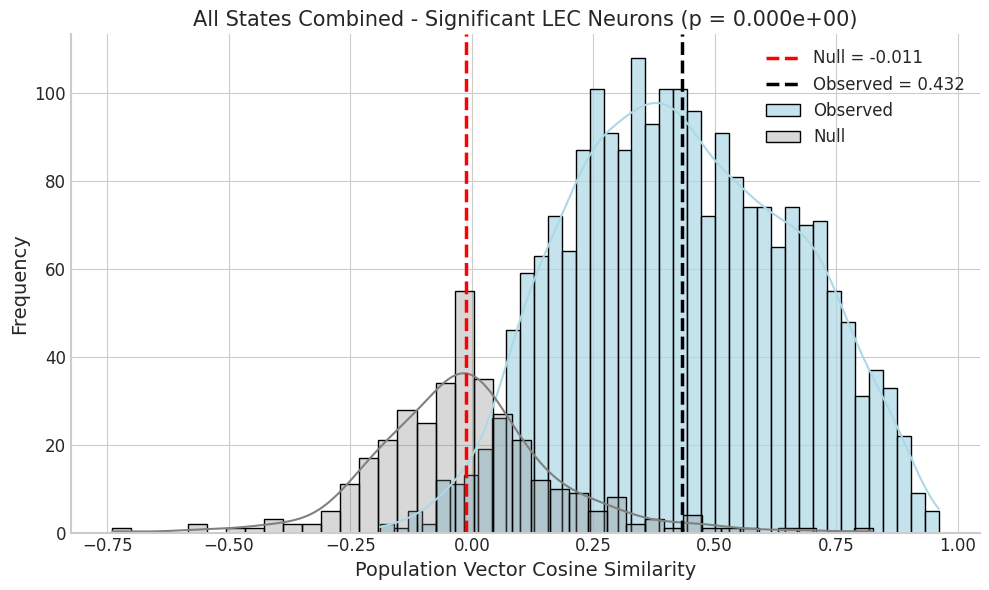


ANALYSIS BY MOUSE - Significant LEC Neurons

Mouse ah08:
  N = 408
  Mean similarity = 0.252 ± 0.161
  t-statistic = 31.565
  p-value = 1.887e-111

Mouse ah10:
  N = 500
  Mean similarity = 0.470 ± 0.196
  t-statistic = 53.457
  p-value = 1.119e-208

Mouse ly05:
  N = 328
  Mean similarity = 0.549 ± 0.232
  t-statistic = 42.844
  p-value = 3.465e-136

Mouse ly06:
  N = 480
  Mean similarity = 0.547 ± 0.212
  t-statistic = 56.309
  p-value = 2.346e-213

Mouse ly07:
  N = 456
  Mean similarity = 0.348 ± 0.179
  t-statistic = 41.510
  p-value = 8.117e-157


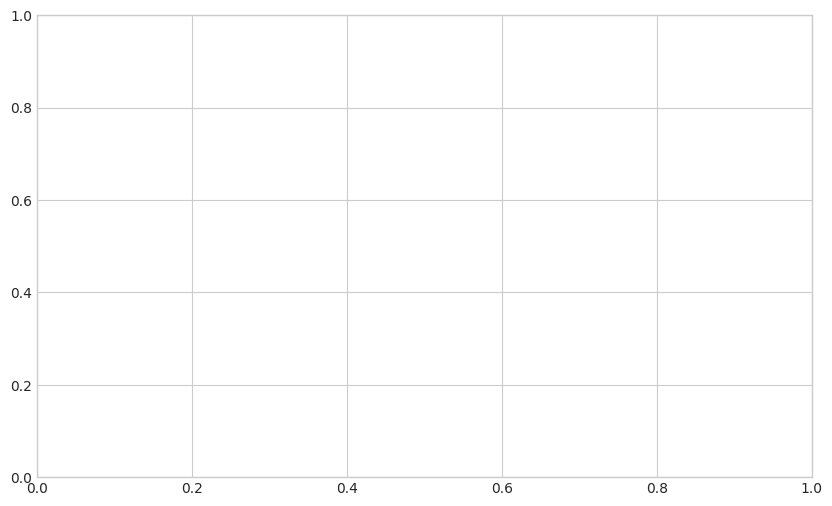

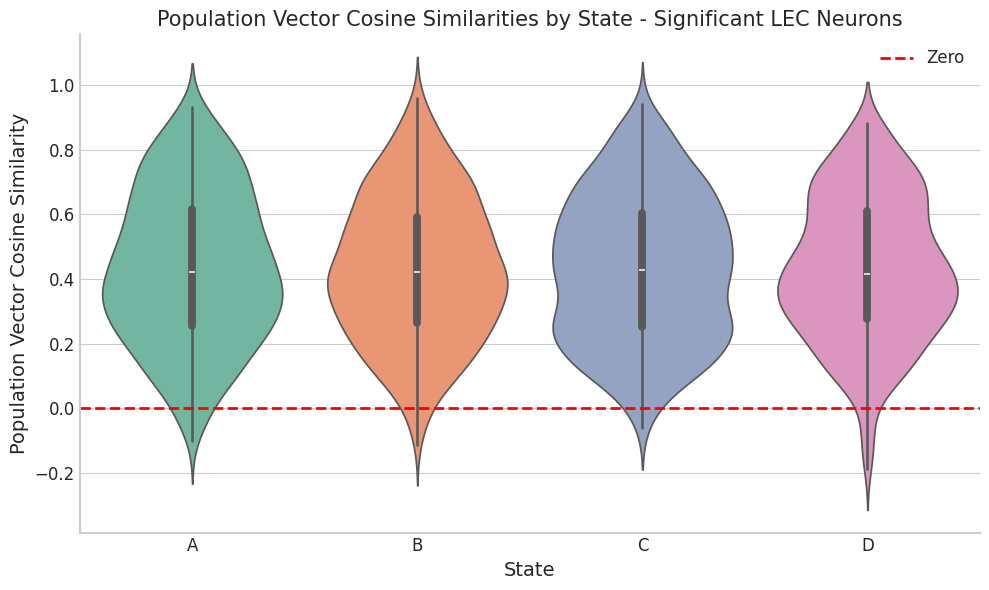


COMPARISON: ALL NEURONS vs SIGNIFICANT LEC NEURONS

All Neurons:
  N = 2172
  Mean = 0.890 ± 0.057

Significant LEC Neurons:
  N = 2172
  Mean = 0.432 ± 0.227

Mann-Whitney U test:
  U-statistic = 4632927.00
  p-value = 0.000e+00


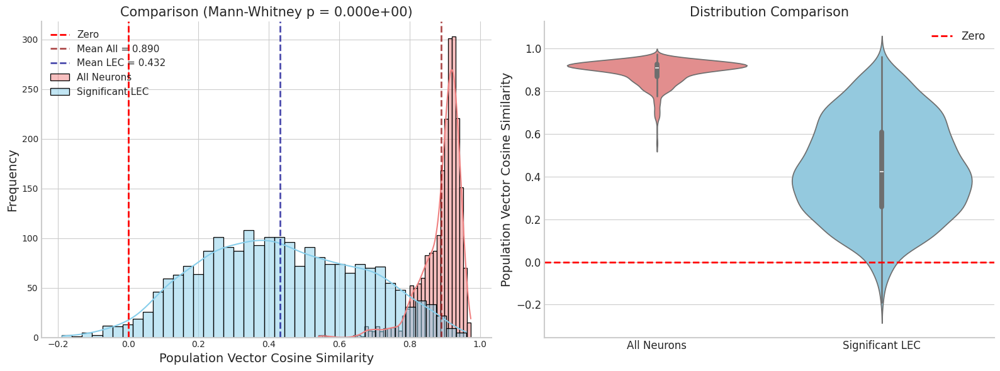

In [40]:
# Population Vector Similarity Analysis
# For each recday and each pair of tasks, calculate cosine similarity of population vectors across states

from scipy.stats import ttest_1samp, mannwhitneyu, zscore
from sklearn.metrics.pairwise import cosine_similarity
from itertools import combinations
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def calculate_population_vector_correlations(data_dic, session_inds_dic, norm_neurons_dic, 
                                             tasks_dic, significant_neurons=None, 
                                             n_shuffles=1000):
    """
    Calculate population vector cosine similarity between pairs of tasks within each recording day.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data for each mouse_recday and session
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    norm_neurons_dic : dict
        Dictionary containing normalized neuron data
    tasks_dic : dict
        Dictionary containing task information for each session
    significant_neurons : dict, optional
        Dictionary mapping mouse_recday to indices of significant neurons
    n_shuffles : int
        Number of shuffles to generate null distribution (default: 1000)
        
    Returns:
    --------
    results_df : pandas DataFrame
        DataFrame with columns: mouse_recday, mouse, date_pair, task_pair, state, similarity
    null_distribution : numpy array
        Array of null similarity values from shuffled data
    """
    
    results_list = []
    num_bins = 90
    num_states = 4
    
    for mouse_recday in data_dic.keys():
        if mouse_recday not in session_inds_dic:
            continue
            
        # Get valid sessions for this recday
        valid_sessions = session_inds_dic[mouse_recday]
        
        if len(valid_sessions) < 2:
            continue
            
        print(f"\nProcessing {mouse_recday}")
        print(f"  Valid sessions: {valid_sessions}")
        
        # Extract mouse ID and date pair
        parts = mouse_recday.split('_')
        mouse_id = parts[0]
        date_pair_str = '_'.join(parts[1:])
        
        # Get task labels for each session
        session_tasks = []
        for session in valid_sessions:
            if mouse_recday in tasks_dic and session in tasks_dic[mouse_recday]:
                task = tasks_dic[mouse_recday][session]
                session_tasks.append((session, task))
            else:
                print(f"  Warning: No task found for session {session}")
        
        # Create pairs of non-repeating tasks
        task_pairs = []
        for i, (sess1, task1) in enumerate(session_tasks):
            for sess2, task2 in session_tasks[i+1:]:
                if not np.array_equal(task1, task2):  # Only non-repeating tasks
                    task_pairs.append(((sess1, task1), (sess2, task2)))
        
        if len(task_pairs) == 0:
            print(f"  No valid task pairs found")
            continue
            
        print(f"  Task pairs to analyze: {len(task_pairs)}")
        
        # For each task pair, calculate correlations by state
        for (sess1, task1), (sess2, task2) in task_pairs:
            task1_str = str(task1) if isinstance(task1, str) else f"task_{sess1}"
            task2_str = str(task2) if isinstance(task2, str) else f"task_{sess2}"
            print(f"    Comparing {task1_str} (session {sess1}) vs {task2_str} (session {sess2})")
            
            # Get normalized neurons for both sessions
            if mouse_recday not in norm_neurons_dic:
                print(f"      Warning: No normalized neurons found")
                continue
            
            # norm_neurons_dic[mouse_recday] is a list indexed by position in valid_sessions
            # Need to map session numbers to list positions
            try:
                if isinstance(norm_neurons_dic[mouse_recday], dict):
                    # If it's a dict, use session numbers as keys
                    if isinstance(norm_neurons_dic[mouse_recday][sess1], dict):
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]['Neurons_norm']
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]['Neurons_norm']
                    else:
                        # Direct array access with session as key
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]
                else:
                    # It's a list indexed by position, not session number
                    # Find the position of sess1 and sess2 in the valid_sessions list
                    sess1_idx = valid_sessions.index(sess1)
                    sess2_idx = valid_sessions.index(sess2)
                    norm_data1 = norm_neurons_dic[mouse_recday][sess1_idx]
                    norm_data2 = norm_neurons_dic[mouse_recday][sess2_idx]
            except (IndexError, KeyError, ValueError) as e:
                print(f"      Warning: Could not access normalized data for sessions {sess1}, {sess2}: {e}")
                continue
            
            # Filter for significant neurons if provided
            if significant_neurons is not None and mouse_recday in significant_neurons:
                sig_neuron_inds = significant_neurons[mouse_recday]
                norm_data1 = norm_data1[sig_neuron_inds]
                norm_data2 = norm_data2[sig_neuron_inds]
                print(f"      Using {len(sig_neuron_inds)} significant neurons")
            else:
                print(f"      Using all {norm_data1.shape[0]} neurons")
            
            num_neurons = norm_data1.shape[0]
            
            # Ensure both have the same number of neurons
            if norm_data1.shape[0] != norm_data2.shape[0]:
                print(f"      Warning: Neuron count mismatch, skipping")
                continue
            
            # For each state, calculate population vector cosine similarity
            state_correlations = []
            for state_idx in range(num_states):
                # Extract bins for this state
                state_start = state_idx * num_bins
                state_end = (state_idx + 1) * num_bins
                
                # Get state data for both sessions
                # Shape: (num_neurons, num_trials, num_bins_in_state)
                state_data1 = norm_data1[:, :, state_start:state_end]
                state_data2 = norm_data2[:, :, state_start:state_end]
                
                # Average across trials to get one population vector per task per state
                # Shape: (num_neurons, num_bins_in_state)
                pop_vec_task1 = np.nanmean(state_data1, axis=1)
                pop_vec_task2 = np.nanmean(state_data2, axis=1)
                
                # Flatten to create population vectors
                # Shape: (num_neurons * num_bins,)
                pop_vec1_flat = pop_vec_task1.flatten()
                pop_vec2_flat = pop_vec_task2.flatten()
                
                # Remove NaN values
                valid_mask = ~(np.isnan(pop_vec1_flat) | np.isnan(pop_vec2_flat))
                pop_vec1_clean = pop_vec1_flat[valid_mask]
                pop_vec2_clean = pop_vec2_flat[valid_mask]
                
                if len(pop_vec1_clean) > 1:
                    # Z-score each population vector
                    pop_vec1_z = zscore(pop_vec1_clean, nan_policy='omit')
                    pop_vec2_z = zscore(pop_vec2_clean, nan_policy='omit')
                    
                    # Calculate cosine similarity between the two task-averaged population vectors
                    # Reshape for sklearn: (1, n_features) for each vector
                    similarity = cosine_similarity(
                        pop_vec1_z.reshape(1, -1), 
                        pop_vec2_z.reshape(1, -1)
                    )[0, 0]
                    
                    state_correlations.append(similarity)
                    
                    # Store result
                    state_name = ['A', 'B', 'C', 'D'][state_idx]
                    results_list.append({
                        'mouse_recday': mouse_recday,
                        'mouse': mouse_id,
                        'date_pair': date_pair_str,
                        'session1': sess1,
                        'session2': sess2,
                        'task1': task1_str,
                        'task2': task2_str,
                        'task_pair': f"{task1_str}_vs_{task2_str}",
                        'state': state_name,
                        'similarity': similarity,
                        'num_neurons': num_neurons,
                        'num_trials_task1': state_data1.shape[1],
                        'num_trials_task2': state_data2.shape[1]
                    })
                    
                    print(f"      State {state_name}: similarity={similarity:.3f}")
                else:
                    print(f"      Warning: Not enough valid data for state {state_idx}")
            
            if len(state_correlations) > 0:
                mean_sim = np.mean(state_correlations)
                print(f"      Mean similarity across states: {mean_sim:.3f}")
    
    # Generate null distribution by shuffling neuron identities
    print(f"\n{'='*80}")
    print(f"Generating null distribution with {n_shuffles} shuffles...")
    print(f"{'='*80}")
    
    null_similarities = []
    shuffle_count = 0
    
    for mouse_recday in data_dic.keys():
        if mouse_recday not in session_inds_dic:
            continue
            
        valid_sessions = session_inds_dic[mouse_recday]
        if len(valid_sessions) < 2:
            continue
        
        # Get task pairs for this recday
        session_tasks = []
        for session in valid_sessions:
            if mouse_recday in tasks_dic and session in tasks_dic[mouse_recday]:
                task = tasks_dic[mouse_recday][session]
                if not any(np.array_equal(task, t) for _, t in session_tasks):
                    session_tasks.append((session, task))
        
        if len(session_tasks) < 2:
            continue
        
        # For each task pair
        for (sess1, task1), (sess2, task2) in combinations(session_tasks, 2):
            if np.array_equal(task1, task2):
                continue
            
            # Get normalized neurons
            try:
                if isinstance(norm_neurons_dic[mouse_recday], dict):
                    if isinstance(norm_neurons_dic[mouse_recday][sess1], dict):
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]['Neurons_norm']
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]['Neurons_norm']
                    else:
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]
                else:
                    sess1_idx = valid_sessions.index(sess1)
                    sess2_idx = valid_sessions.index(sess2)
                    norm_data1 = norm_neurons_dic[mouse_recday][sess1_idx]
                    norm_data2 = norm_neurons_dic[mouse_recday][sess2_idx]
            except (IndexError, KeyError, ValueError):
                continue
            
            # Filter for significant neurons if provided
            if significant_neurons is not None and mouse_recday in significant_neurons:
                sig_neuron_inds = significant_neurons[mouse_recday]
                norm_data1 = norm_data1[sig_neuron_inds]
                norm_data2 = norm_data2[sig_neuron_inds]
            
            # Do a few shuffles for this task pair
            shuffles_per_pair = min(10, n_shuffles // max(1, len(results_list) // 4))
            
            for _ in range(shuffles_per_pair):
                if shuffle_count >= n_shuffles:
                    break
                
                # Randomly shuffle neuron identities in one of the tasks
                neuron_perm = np.random.permutation(norm_data2.shape[0])
                norm_data2_shuffled = norm_data2[neuron_perm]
                
                # Calculate similarity for a random state
                state_idx = np.random.randint(0, num_states)
                state_start = state_idx * num_bins
                state_end = (state_idx + 1) * num_bins
                
                state_data1 = norm_data1[:, :, state_start:state_end]
                state_data2_shuffled = norm_data2_shuffled[:, :, state_start:state_end]
                
                pop_vec1 = np.nanmean(state_data1, axis=1).flatten()
                pop_vec2 = np.nanmean(state_data2_shuffled, axis=1).flatten()
                
                valid_mask = ~(np.isnan(pop_vec1) | np.isnan(pop_vec2))
                pop_vec1_clean = pop_vec1[valid_mask]
                pop_vec2_clean = pop_vec2[valid_mask]
                
                if len(pop_vec1_clean) > 1:
                    pop_vec1_z = zscore(pop_vec1_clean, nan_policy='omit')
                    pop_vec2_z = zscore(pop_vec2_clean, nan_policy='omit')
                    
                    null_sim = cosine_similarity(
                        pop_vec1_z.reshape(1, -1), 
                        pop_vec2_z.reshape(1, -1)
                    )[0, 0]
                    
                    null_similarities.append(null_sim)
                    shuffle_count += 1
            
            if shuffle_count >= n_shuffles:
                break
        
        if shuffle_count >= n_shuffles:
            break
    
    null_distribution = np.array(null_similarities)
    print(f"Generated {len(null_distribution)} null similarity values")
    print(f"Null distribution: mean={np.mean(null_distribution):.3f}, std={np.std(null_distribution):.3f}")
    
    # Convert to DataFrame
    results_df = pd.DataFrame(results_list)
    
    return results_df, null_distribution


def plot_and_analyze_correlations(results_df, null_distribution=None, title_suffix=""):
    """
    Plot and analyze population vector cosine similarities.
    
    Parameters:
    -----------
    results_df : pandas DataFrame
        Results from calculate_population_vector_correlations
    null_distribution : numpy array, optional
        Null distribution from shuffled data
    title_suffix : str
        Suffix to add to plot titles (e.g., "All Neurons" or "Significant LEC Neurons")
    """
    if len(results_df) == 0:
        print(f"No results to plot for {title_suffix}")
        return
    
    # 1. Aggregate by state
    print(f"\n{'='*80}")
    print(f"ANALYSIS BY STATE - {title_suffix}")
    print(f"{'='*80}")
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()
    
    states = ['A', 'B', 'C', 'D']
    state_stats = {}
    
    for idx, state in enumerate(states):
        state_data = results_df[results_df['state'] == state]['similarity'].values
        
        if len(state_data) > 0:
            # Statistical test against null distribution if provided
            if null_distribution is not None and len(null_distribution) > 0:
                null_mean = np.mean(null_distribution)
                null_std = np.std(null_distribution)
                # Test against null mean
                t_stat, p_value = ttest_1samp(state_data, null_mean)
                print(f"\nState {state}:")
                print(f"  N = {len(state_data)} task pairs")
                print(f"  Observed mean = {np.mean(state_data):.3f} ± {np.std(state_data):.3f}")
                print(f"  Null mean = {null_mean:.3f} ± {null_std:.3f}")
                print(f"  t-statistic (vs null) = {t_stat:.3f}")
                print(f"  p-value (vs null) = {p_value:.3e}")
                
                # Calculate effect size (Cohen's d)
                cohens_d = (np.mean(state_data) - null_mean) / null_std
                print(f"  Effect size (Cohen's d) = {cohens_d:.3f}")
            else:
                # Test against zero
                t_stat, p_value = ttest_1samp(state_data, 0)
                print(f"\nState {state}:")
                print(f"  N = {len(state_data)} task pairs")
                print(f"  Mean similarity = {np.mean(state_data):.3f} ± {np.std(state_data):.3f}")
                print(f"  t-statistic = {t_stat:.3f}")
                print(f"  p-value = {p_value:.3e}")
            
            mean_sim = np.mean(state_data)
            std_sim = np.std(state_data)
            
            state_stats[state] = {
                'mean': mean_sim,
                'std': std_sim,
                't_stat': t_stat,
                'p_value': p_value,
                'n': len(state_data)
            }
            
            # Plot histogram
            ax = axes[idx]
            sns.histplot(state_data, kde=True, color="skyblue", bins=30, ax=ax, alpha=0.7)
            
            # Add null distribution if provided
            if null_distribution is not None and len(null_distribution) > 0:
                sns.histplot(null_distribution, kde=True, color="gray", bins=30, 
                           ax=ax, alpha=0.3, label='Null')
                ax.axvline(x=null_mean, color='red', linestyle='--', linewidth=2, 
                          label=f'Null = {null_mean:.3f}')
            else:
                ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
            
            ax.axvline(x=mean_sim, color='black', linestyle='--', linewidth=2, 
                      label=f'Observed = {mean_sim:.3f}')
            ax.set_xlabel('Cosine Similarity', fontsize=12)
            ax.set_ylabel('Frequency', fontsize=12)
            ax.set_title(f'State {state} (p = {p_value:.3e})', fontsize=13)
            ax.legend()
            sns.despine(ax=ax)
    
    plt.suptitle(f'Population Vector Cosine Similarities by State - {title_suffix}', 
                 fontsize=15, y=1.00)
    plt.tight_layout()
    plt.show()
    
    # 2. Aggregate across all states
    print(f"\n{'='*80}")
    print(f"ANALYSIS ACROSS ALL STATES - {title_suffix}")
    print(f"{'='*80}")
    
    all_sims = results_df['similarity'].values
    
    if null_distribution is not None and len(null_distribution) > 0:
        null_mean = np.mean(null_distribution)
        null_std = np.std(null_distribution)
        t_stat, p_value = ttest_1samp(all_sims, null_mean)
        
        print(f"\nAll States Combined:")
        print(f"  N = {len(all_sims)} similarities")
        print(f"  Observed mean = {np.mean(all_sims):.3f} ± {np.std(all_sims):.3f}")
        print(f"  Null mean = {null_mean:.3f} ± {null_std:.3f}")
        print(f"  t-statistic (vs null) = {t_stat:.3f}")
        print(f"  p-value (vs null) = {p_value:.3e}")
        
        cohens_d = (np.mean(all_sims) - null_mean) / null_std
        print(f"  Effect size (Cohen's d) = {cohens_d:.3f}")
    else:
        t_stat, p_value = ttest_1samp(all_sims, 0)
        print(f"\nAll States Combined:")
        print(f"  N = {len(all_sims)} similarities")
        print(f"  Mean similarity = {np.mean(all_sims):.3f} ± {np.std(all_sims):.3f}")
        print(f"  t-statistic = {t_stat:.3f}")
        print(f"  p-value = {p_value:.3e}")
    
    mean_sim = np.mean(all_sims)
    std_sim = np.std(all_sims)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.histplot(all_sims, kde=True, color="lightblue", bins=40, alpha=0.7, label='Observed')
    
    if null_distribution is not None and len(null_distribution) > 0:
        sns.histplot(null_distribution, kde=True, color="gray", bins=40, 
                    alpha=0.3, label='Null')
        ax.axvline(x=null_mean, color='red', linestyle='--', linewidth=2.5, 
                  label=f'Null = {null_mean:.3f}')
    else:
        ax.axvline(x=0, color='red', linestyle='--', linewidth=2.5, label='Zero')
    
    ax.axvline(x=mean_sim, color='black', linestyle='--', linewidth=2.5, 
              label=f'Observed = {mean_sim:.3f}')
    ax.set_xlabel('Population Vector Cosine Similarity', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title(f'All States Combined - {title_suffix} (p = {p_value:.3e})', fontsize=15)
    ax.legend(fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    sns.despine()
    plt.tight_layout()
    plt.show()
    
    # 3. Aggregate by mouse
    print(f"\n{'='*80}")
    print(f"ANALYSIS BY MOUSE - {title_suffix}")
    print(f"{'='*80}")
    
    mice = results_df['mouse'].unique()
    mouse_stats = {}
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for mouse in sorted(mice):
        mouse_data = results_df[results_df['mouse'] == mouse]['similarity'].values
        
        if len(mouse_data) > 0:
            mean_sim = np.mean(mouse_data)
            std_sim = np.std(mouse_data)
            t_stat, p_value = ttest_1samp(mouse_data, 0)
            
            mouse_stats[mouse] = {
                'mean': mean_sim,
                'std': std_sim,
                't_stat': t_stat,
                'p_value': p_value,
                'n': len(mouse_data)
            }
            
            print(f"\nMouse {mouse}:")
            print(f"  N = {len(mouse_data)}")
            print(f"  Mean similarity = {mean_sim:.3f} ± {std_sim:.3f}")
            print(f"  t-statistic = {t_stat:.3f}")
            print(f"  p-value = {p_value:.3e}")
    
    # Violin plot by state
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.violinplot(data=results_df, x='state', y='similarity', palette='Set2', ax=ax)
    ax.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.set_ylabel('Population Vector Cosine Similarity', fontsize=14)
    ax.set_xlabel('State', fontsize=14)
    ax.set_title(f'Population Vector Cosine Similarities by State - {title_suffix}', fontsize=15)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.legend(fontsize=12)
    sns.despine()
    plt.tight_layout()
    plt.show()
    
    return {
        'state_stats': state_stats,
        'mouse_stats': mouse_stats,
        'overall': {
            'mean': mean_sim,
            'std': std_sim,
            't_stat': t_stat,
            'p_value': p_value,
            'n': len(all_sims)
        }
    }


# Example usage (copy each section into separate cells):

# CELL 1: Run analysis for all neurons
print("=" * 80)
print("ANALYZING ALL NEURONS")
print("=" * 80)
correlation_results_all, null_dist_all = calculate_population_vector_correlations(
    data_dic, session_inds_dic, norm_neurons_dic, tasks_dic, 
    significant_neurons=None
)
print(f"\n\nTotal results: {len(correlation_results_all)}")
if len(correlation_results_all) > 0:
    print(correlation_results_all.head(10))

# CELL 2: Run analysis for significant LEC neurons
print("\n" + "=" * 80)
print("ANALYZING SIGNIFICANT LEC NEURONS ONLY")
print("=" * 80)
correlation_results_lec, null_dist_lec = calculate_population_vector_correlations(
    data_dic, session_inds_dic, norm_neurons_dic, tasks_dic, 
    significant_neurons=sig_lec_neurons_dic
)
print(f"\n\nTotal results: {len(correlation_results_lec)}")
if len(correlation_results_lec) > 0:
    print(correlation_results_lec.head(10))

# CELL 3: Plot and analyze results for all neurons
if len(correlation_results_all) > 0:
    stats_all = plot_and_analyze_correlations(correlation_results_all, null_dist_all, "All Neurons")

# CELL 4: Plot and analyze results for significant LEC neurons
if len(correlation_results_lec) > 0:
    stats_lec = plot_and_analyze_correlations(correlation_results_lec, null_dist_lec, "Significant LEC Neurons")

# CELL 5: Comparison between All Neurons and Significant LEC Neurons
print("\n" + "=" * 80)
print("COMPARISON: ALL NEURONS vs SIGNIFICANT LEC NEURONS")
print("=" * 80)

if len(correlation_results_all) > 0 and len(correlation_results_lec) > 0:
    # Compare overall similarities
    all_sims_all = correlation_results_all['similarity'].values
    all_sims_lec = correlation_results_lec['similarity'].values
    
    # Mann-Whitney U test
    u_stat, p_value = mannwhitneyu(all_sims_all, all_sims_lec, alternative='two-sided')
    
    print(f"\nAll Neurons:")
    print(f"  N = {len(all_sims_all)}")
    print(f"  Mean = {np.mean(all_sims_all):.3f} ± {np.std(all_sims_all):.3f}")
    
    print(f"\nSignificant LEC Neurons:")
    print(f"  N = {len(all_sims_lec)}")
    print(f"  Mean = {np.mean(all_sims_lec):.3f} ± {np.std(all_sims_lec):.3f}")
    
    print(f"\nMann-Whitney U test:")
    print(f"  U-statistic = {u_stat:.2f}")
    print(f"  p-value = {p_value:.3e}")
    
    # Side-by-side comparison plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Histogram comparison
    ax = axes[0]
    sns.histplot(all_sims_all, kde=True, color="lightcoral", bins=40, 
                 alpha=0.5, label='All Neurons', ax=ax)
    sns.histplot(all_sims_lec, kde=True, color="skyblue", bins=40, 
                 alpha=0.5, label='Significant LEC', ax=ax)
    ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.axvline(x=np.mean(all_sims_all), color='darkred', linestyle='--', 
              linewidth=2, alpha=0.7, label=f'Mean All = {np.mean(all_sims_all):.3f}')
    ax.axvline(x=np.mean(all_sims_lec), color='darkblue', linestyle='--', 
              linewidth=2, alpha=0.7, label=f'Mean LEC = {np.mean(all_sims_lec):.3f}')
    ax.set_xlabel('Population Vector Cosine Similarity', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title(f'Comparison (Mann-Whitney p = {p_value:.3e})', fontsize=15)
    ax.legend(fontsize=11)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    sns.despine(ax=ax)
    
    # Violin plot comparison
    ax = axes[1]
    combined_df = pd.DataFrame({
        'Similarity': np.concatenate([all_sims_all, all_sims_lec]),
        'Group': ['All Neurons'] * len(all_sims_all) + ['Significant LEC'] * len(all_sims_lec)
    })
    sns.violinplot(data=combined_df, x='Group', y='Similarity', palette=['lightcoral', 'skyblue'], ax=ax)
    ax.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.set_ylabel('Population Vector Cosine Similarity', fontsize=14)
    ax.set_xlabel('', fontsize=14)
    ax.set_title('Distribution Comparison', fontsize=15)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.legend(fontsize=12)
    sns.despine(ax=ax)
    
    plt.tight_layout()
    plt.show()


ANALYZING ALL NEURONS

Processing ah08_20250613_20250615
  Valid sessions: [0, 1, 2, 3, 4, 5, 6, 7]
  Task pairs to analyze: 26
    Comparing task_0 (session 0) vs task_1 (session 1)
      Using all 151 neurons
      State A: similarity=0.910
      State B: similarity=0.886
      State C: similarity=0.884
      State D: similarity=0.859
      Mean similarity across states: 0.885
    Comparing task_0 (session 0) vs task_2 (session 2)
      Using all 151 neurons
      State A: similarity=0.909
      State B: similarity=0.913
      State C: similarity=0.871
      State D: similarity=0.839
      Mean similarity across states: 0.883
    Comparing task_0 (session 0) vs task_4 (session 4)
      Using all 151 neurons
      State A: similarity=0.857
      State B: similarity=0.862
      State C: similarity=0.828
      State D: similarity=0.804
      Mean similarity across states: 0.838
    Comparing task_0 (session 0) vs task_5 (session 5)
      Using all 151 neurons
      State A: similarity=0

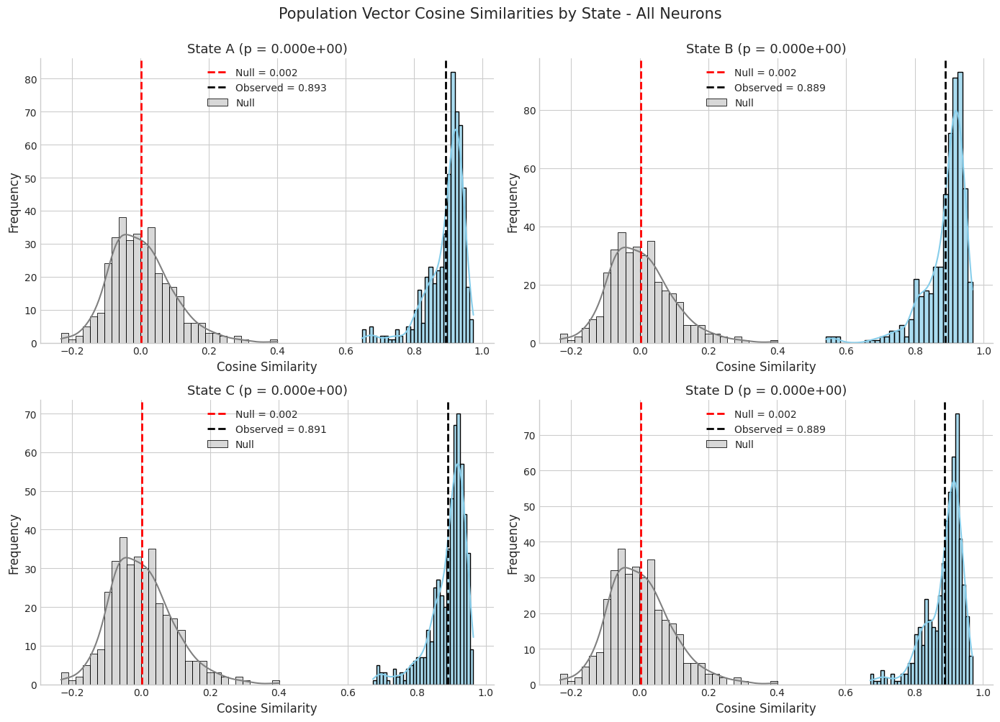


ANALYSIS ACROSS ALL STATES - All Neurons

All States Combined:
  N = 2172 similarities
  Observed mean = 0.890 ± 0.057
  Null mean = 0.002 ± 0.092
  t-statistic (vs null) = 725.052
  p-value (vs null) = 0.000e+00
  Effect size (Cohen's d) = 9.631


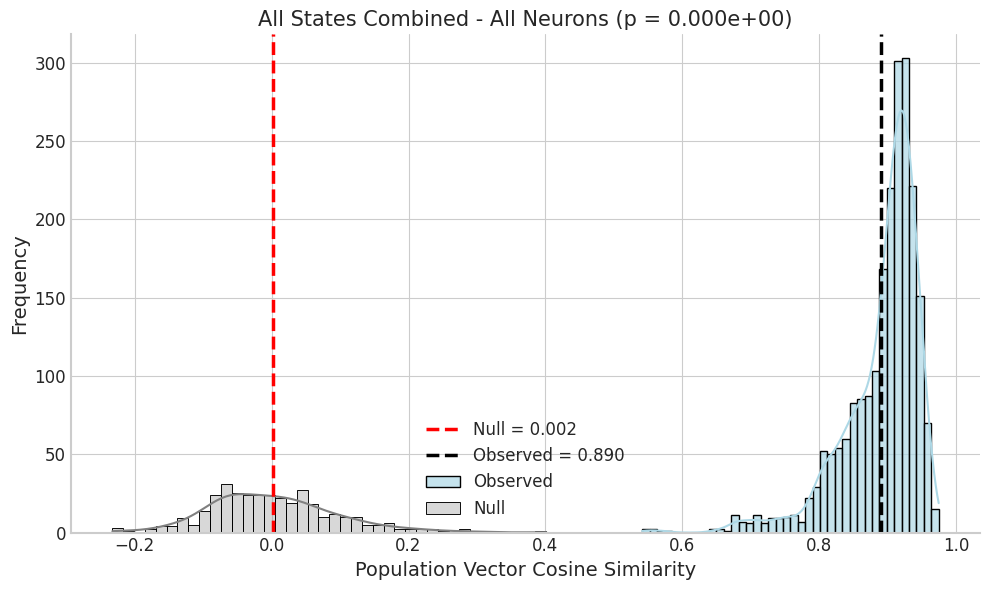


ANALYSIS BY MOUSE - All Neurons

Mouse ah08:
  N = 408
  Mean similarity = 0.867 ± 0.063
  t-statistic = 277.609
  p-value = 0.000e+00

Mouse ah10:
  N = 500
  Mean similarity = 0.903 ± 0.032
  t-statistic = 624.128
  p-value = 0.000e+00

Mouse ly05:
  N = 328
  Mean similarity = 0.844 ± 0.075
  t-statistic = 202.181
  p-value = 0.000e+00

Mouse ly06:
  N = 480
  Mean similarity = 0.927 ± 0.028
  t-statistic = 734.167
  p-value = 0.000e+00

Mouse ly07:
  N = 456
  Mean similarity = 0.892 ± 0.047
  t-statistic = 403.807
  p-value = 0.000e+00


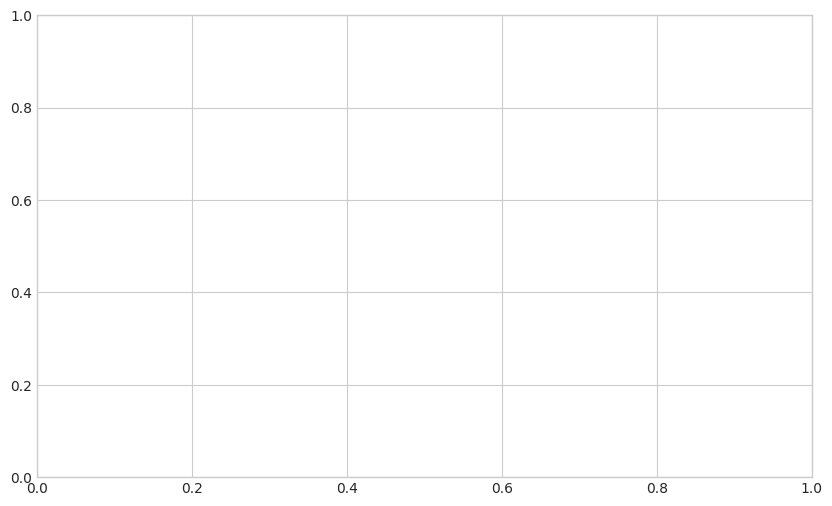

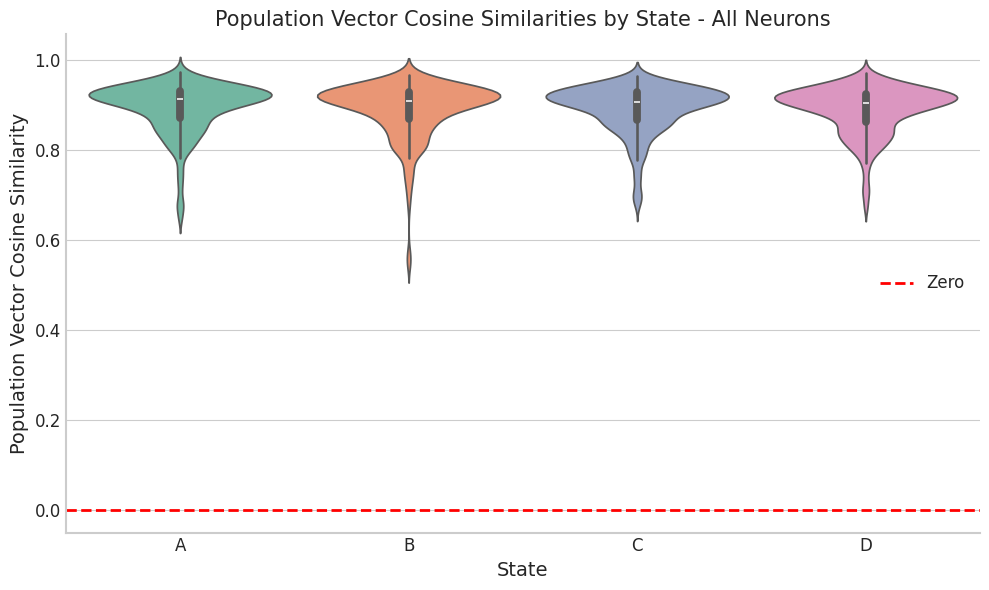


ANALYSIS BY STATE - Significant LEC Neurons

State A:
  N = 543 task pairs
  Observed mean = 0.436 ± 0.235
  Null mean = 0.018 ± 0.203
  t-statistic (vs null) = 41.396
  p-value (vs null) = 5.906e-170
  Effect size (Cohen's d) = 2.059

State B:
  N = 543 task pairs
  Observed mean = 0.432 ± 0.223
  Null mean = 0.018 ± 0.203
  t-statistic (vs null) = 43.265
  p-value (vs null) = 6.168e-178
  Effect size (Cohen's d) = 2.041

State C:
  N = 543 task pairs
  Observed mean = 0.432 ± 0.226
  Null mean = 0.018 ± 0.203
  t-statistic (vs null) = 42.628
  p-value (vs null) = 3.070e-175
  Effect size (Cohen's d) = 2.038

State D:
  N = 543 task pairs
  Observed mean = 0.429 ± 0.223
  Null mean = 0.018 ± 0.203
  t-statistic (vs null) = 42.833
  p-value (vs null) = 4.158e-176
  Effect size (Cohen's d) = 2.025


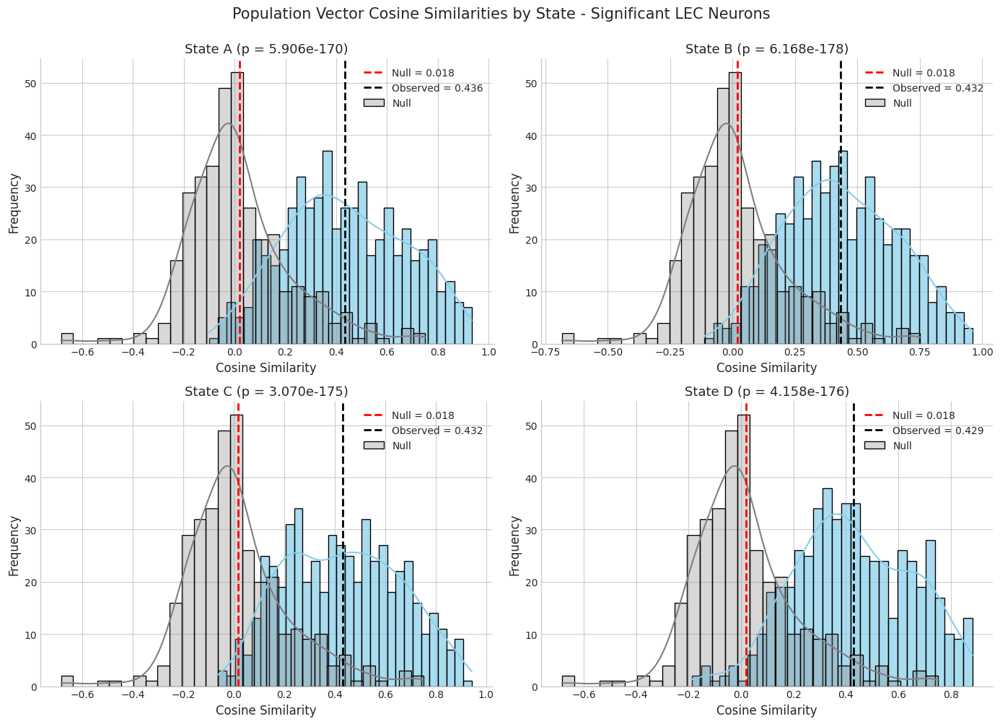


ANALYSIS ACROSS ALL STATES - Significant LEC Neurons

All States Combined:
  N = 2172 similarities
  Observed mean = 0.432 ± 0.227
  Null mean = 0.018 ± 0.203
  t-statistic (vs null) = 85.066
  p-value (vs null) = 0.000e+00
  Effect size (Cohen's d) = 2.041


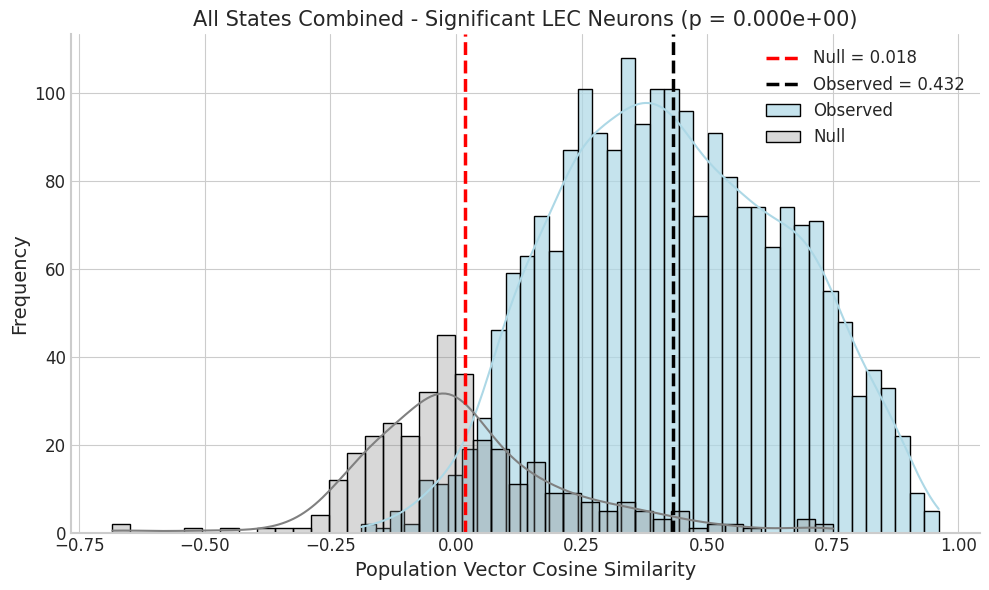


ANALYSIS BY MOUSE - Significant LEC Neurons

Mouse ah08:
  N = 408
  Mean similarity = 0.252 ± 0.161
  t-statistic = 31.565
  p-value = 1.887e-111

Mouse ah10:
  N = 500
  Mean similarity = 0.470 ± 0.196
  t-statistic = 53.457
  p-value = 1.119e-208

Mouse ly05:
  N = 328
  Mean similarity = 0.549 ± 0.232
  t-statistic = 42.844
  p-value = 3.465e-136

Mouse ly06:
  N = 480
  Mean similarity = 0.547 ± 0.212
  t-statistic = 56.309
  p-value = 2.346e-213

Mouse ly07:
  N = 456
  Mean similarity = 0.348 ± 0.179
  t-statistic = 41.510
  p-value = 8.117e-157


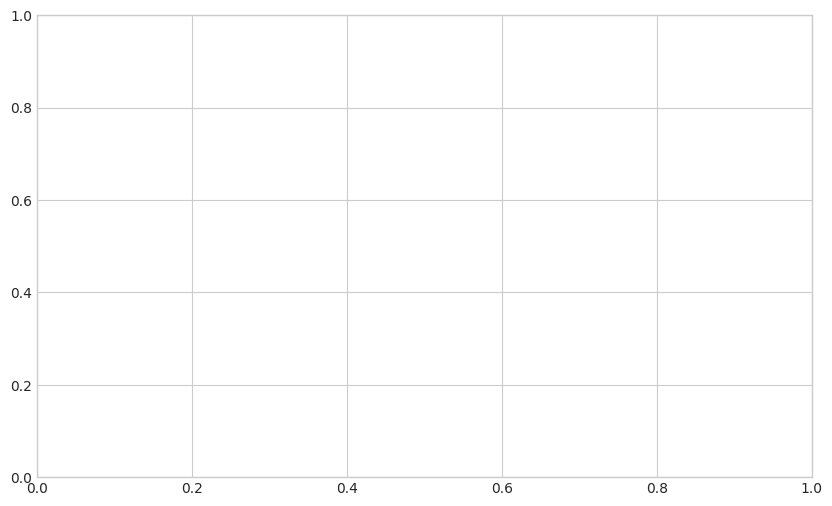

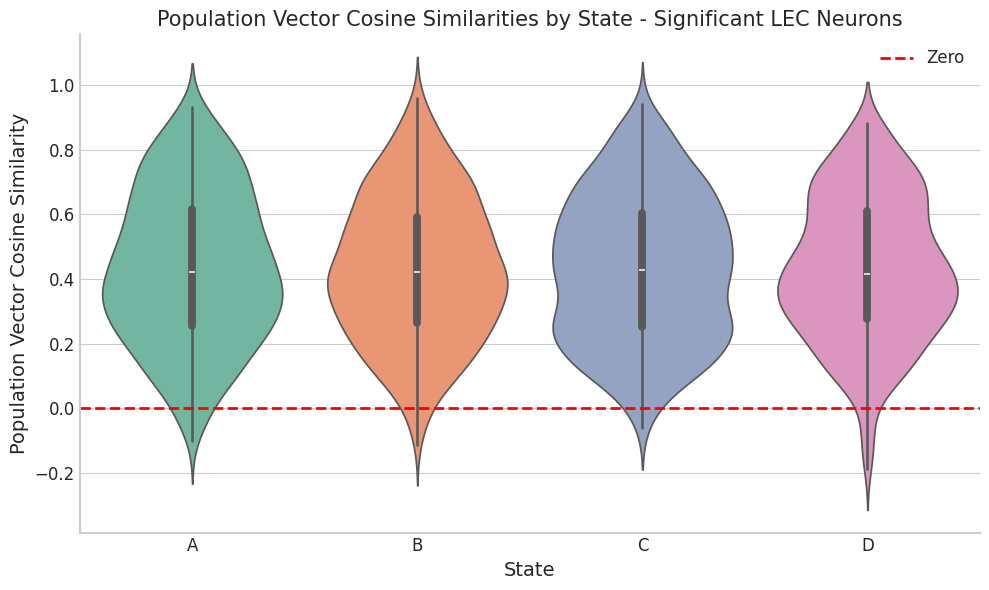


COMPARISON: ALL NEURONS vs SIGNIFICANT LEC NEURONS

All Neurons:
  N = 2172
  Mean = 0.890 ± 0.057

Significant LEC Neurons:
  N = 2172
  Mean = 0.432 ± 0.227

Mann-Whitney U test:
  U-statistic = 4632927.00
  p-value = 0.000e+00


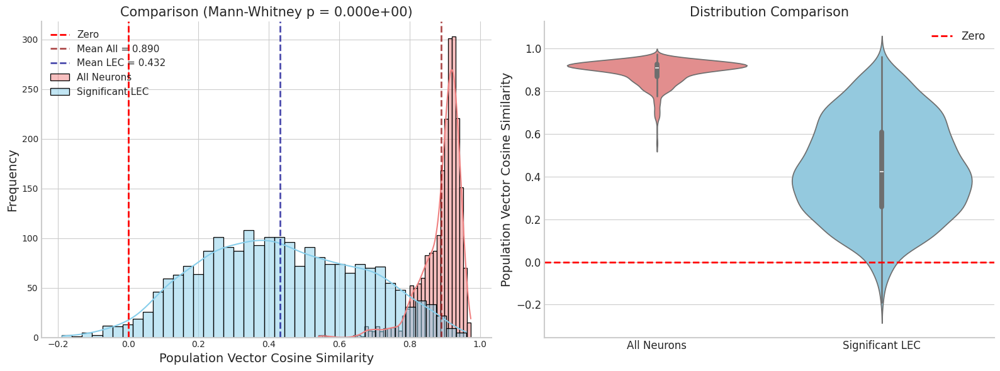


CALCULATING ACROSS-STATE SIMILARITIES (CONTROL)

Processing ah08_20250613_20250615
  Valid sessions: [0, 1, 2, 3, 4, 5, 6, 7]
  Task pairs to analyze: 26
    Comparing task_0 (session 0) vs task_1 (session 1)
      Using all 151 neurons
    Comparing task_0 (session 0) vs task_2 (session 2)
      Using all 151 neurons
    Comparing task_0 (session 0) vs task_4 (session 4)
      Using all 151 neurons
    Comparing task_0 (session 0) vs task_5 (session 5)
      Using all 151 neurons
    Comparing task_0 (session 0) vs task_6 (session 6)
      Using all 151 neurons
    Comparing task_0 (session 0) vs task_7 (session 7)
      Using all 151 neurons
    Comparing task_1 (session 1) vs task_2 (session 2)
      Using all 151 neurons
    Comparing task_1 (session 1) vs task_3 (session 3)
      Using all 151 neurons
    Comparing task_1 (session 1) vs task_4 (session 4)
      Using all 151 neurons
    Comparing task_1 (session 1) vs task_5 (session 5)
      Using all 151 neurons
    Comparing t

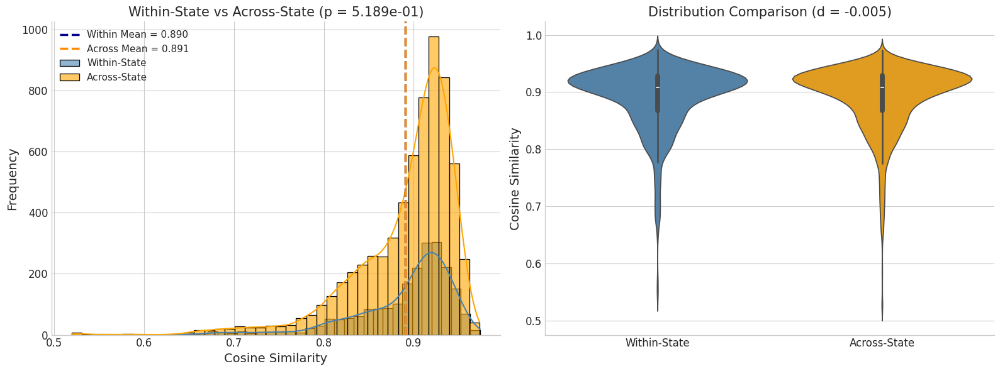

In [41]:
# Population Vector Similarity Analysis
# For each recday and each pair of tasks, calculate cosine similarity of population vectors across states

from scipy.stats import ttest_1samp, mannwhitneyu, zscore
from sklearn.metrics.pairwise import cosine_similarity
from itertools import combinations
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def calculate_population_vector_correlations(data_dic, session_inds_dic, norm_neurons_dic, 
                                             tasks_dic, significant_neurons=None, 
                                             n_shuffles=1000):
    """
    Calculate population vector cosine similarity between pairs of tasks within each recording day.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data for each mouse_recday and session
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    norm_neurons_dic : dict
        Dictionary containing normalized neuron data
    tasks_dic : dict
        Dictionary containing task information for each session
    significant_neurons : dict, optional
        Dictionary mapping mouse_recday to indices of significant neurons
    n_shuffles : int
        Number of shuffles to generate null distribution (default: 1000)
        
    Returns:
    --------
    results_df : pandas DataFrame
        DataFrame with columns: mouse_recday, mouse, date_pair, task_pair, state, similarity
    null_distribution : numpy array
        Array of null similarity values from shuffled data
    """
    
    results_list = []
    num_bins = 90
    num_states = 4
    
    for mouse_recday in data_dic.keys():
        if mouse_recday not in session_inds_dic:
            continue
            
        # Get valid sessions for this recday
        valid_sessions = session_inds_dic[mouse_recday]
        
        if len(valid_sessions) < 2:
            continue
            
        print(f"\nProcessing {mouse_recday}")
        print(f"  Valid sessions: {valid_sessions}")
        
        # Extract mouse ID and date pair
        parts = mouse_recday.split('_')
        mouse_id = parts[0]
        date_pair_str = '_'.join(parts[1:])
        
        # Get task labels for each session
        session_tasks = []
        for session in valid_sessions:
            if mouse_recday in tasks_dic and session in tasks_dic[mouse_recday]:
                task = tasks_dic[mouse_recday][session]
                session_tasks.append((session, task))
            else:
                print(f"  Warning: No task found for session {session}")
        
        # Create pairs of non-repeating tasks
        task_pairs = []
        for i, (sess1, task1) in enumerate(session_tasks):
            for sess2, task2 in session_tasks[i+1:]:
                if not np.array_equal(task1, task2):  # Only non-repeating tasks
                    task_pairs.append(((sess1, task1), (sess2, task2)))
        
        if len(task_pairs) == 0:
            print(f"  No valid task pairs found")
            continue
            
        print(f"  Task pairs to analyze: {len(task_pairs)}")
        
        # For each task pair, calculate correlations by state
        for (sess1, task1), (sess2, task2) in task_pairs:
            task1_str = str(task1) if isinstance(task1, str) else f"task_{sess1}"
            task2_str = str(task2) if isinstance(task2, str) else f"task_{sess2}"
            print(f"    Comparing {task1_str} (session {sess1}) vs {task2_str} (session {sess2})")
            
            # Get normalized neurons for both sessions
            if mouse_recday not in norm_neurons_dic:
                print(f"      Warning: No normalized neurons found")
                continue
            
            # norm_neurons_dic[mouse_recday] is a list indexed by position in valid_sessions
            # Need to map session numbers to list positions
            try:
                if isinstance(norm_neurons_dic[mouse_recday], dict):
                    # If it's a dict, use session numbers as keys
                    if isinstance(norm_neurons_dic[mouse_recday][sess1], dict):
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]['Neurons_norm']
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]['Neurons_norm']
                    else:
                        # Direct array access with session as key
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]
                else:
                    # It's a list indexed by position, not session number
                    # Find the position of sess1 and sess2 in the valid_sessions list
                    sess1_idx = valid_sessions.index(sess1)
                    sess2_idx = valid_sessions.index(sess2)
                    norm_data1 = norm_neurons_dic[mouse_recday][sess1_idx]
                    norm_data2 = norm_neurons_dic[mouse_recday][sess2_idx]
            except (IndexError, KeyError, ValueError) as e:
                print(f"      Warning: Could not access normalized data for sessions {sess1}, {sess2}: {e}")
                continue
            
            # Filter for significant neurons if provided
            if significant_neurons is not None and mouse_recday in significant_neurons:
                sig_neuron_inds = significant_neurons[mouse_recday]
                norm_data1 = norm_data1[sig_neuron_inds]
                norm_data2 = norm_data2[sig_neuron_inds]
                print(f"      Using {len(sig_neuron_inds)} significant neurons")
            else:
                print(f"      Using all {norm_data1.shape[0]} neurons")
            
            num_neurons = norm_data1.shape[0]
            
            # Ensure both have the same number of neurons
            if norm_data1.shape[0] != norm_data2.shape[0]:
                print(f"      Warning: Neuron count mismatch, skipping")
                continue
            
            # For each state, calculate population vector cosine similarity
            state_correlations = []
            for state_idx in range(num_states):
                # Extract bins for this state
                state_start = state_idx * num_bins
                state_end = (state_idx + 1) * num_bins
                
                # Get state data for both sessions
                # Shape: (num_neurons, num_trials, num_bins_in_state)
                state_data1 = norm_data1[:, :, state_start:state_end]
                state_data2 = norm_data2[:, :, state_start:state_end]
                
                # Average across trials to get one population vector per task per state
                # Shape: (num_neurons, num_bins_in_state)
                pop_vec_task1 = np.nanmean(state_data1, axis=1)
                pop_vec_task2 = np.nanmean(state_data2, axis=1)
                
                # Flatten to create population vectors
                # Shape: (num_neurons * num_bins,)
                pop_vec1_flat = pop_vec_task1.flatten()
                pop_vec2_flat = pop_vec_task2.flatten()
                
                # Remove NaN values
                valid_mask = ~(np.isnan(pop_vec1_flat) | np.isnan(pop_vec2_flat))
                pop_vec1_clean = pop_vec1_flat[valid_mask]
                pop_vec2_clean = pop_vec2_flat[valid_mask]
                
                if len(pop_vec1_clean) > 1:
                    # Z-score each population vector
                    pop_vec1_z = zscore(pop_vec1_clean, nan_policy='omit')
                    pop_vec2_z = zscore(pop_vec2_clean, nan_policy='omit')
                    
                    # Calculate cosine similarity between the two task-averaged population vectors
                    # Reshape for sklearn: (1, n_features) for each vector
                    similarity = cosine_similarity(
                        pop_vec1_z.reshape(1, -1), 
                        pop_vec2_z.reshape(1, -1)
                    )[0, 0]
                    
                    state_correlations.append(similarity)
                    
                    # Store result
                    state_name = ['A', 'B', 'C', 'D'][state_idx]
                    results_list.append({
                        'mouse_recday': mouse_recday,
                        'mouse': mouse_id,
                        'date_pair': date_pair_str,
                        'session1': sess1,
                        'session2': sess2,
                        'task1': task1_str,
                        'task2': task2_str,
                        'task_pair': f"{task1_str}_vs_{task2_str}",
                        'state': state_name,
                        'similarity': similarity,
                        'num_neurons': num_neurons,
                        'num_trials_task1': state_data1.shape[1],
                        'num_trials_task2': state_data2.shape[1]
                    })
                    
                    print(f"      State {state_name}: similarity={similarity:.3f}")
                else:
                    print(f"      Warning: Not enough valid data for state {state_idx}")
            
            if len(state_correlations) > 0:
                mean_sim = np.mean(state_correlations)
                print(f"      Mean similarity across states: {mean_sim:.3f}")
    
    # Generate null distribution by shuffling neuron identities
    print(f"\n{'='*80}")
    print(f"Generating null distribution with {n_shuffles} shuffles...")
    print(f"{'='*80}")
    
    null_similarities = []
    shuffle_count = 0
    
    for mouse_recday in data_dic.keys():
        if mouse_recday not in session_inds_dic:
            continue
            
        valid_sessions = session_inds_dic[mouse_recday]
        if len(valid_sessions) < 2:
            continue
        
        # Get task pairs for this recday
        session_tasks = []
        for session in valid_sessions:
            if mouse_recday in tasks_dic and session in tasks_dic[mouse_recday]:
                task = tasks_dic[mouse_recday][session]
                if not any(np.array_equal(task, t) for _, t in session_tasks):
                    session_tasks.append((session, task))
        
        if len(session_tasks) < 2:
            continue
        
        # For each task pair
        for (sess1, task1), (sess2, task2) in combinations(session_tasks, 2):
            if np.array_equal(task1, task2):
                continue
            
            # Get normalized neurons
            try:
                if isinstance(norm_neurons_dic[mouse_recday], dict):
                    if isinstance(norm_neurons_dic[mouse_recday][sess1], dict):
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]['Neurons_norm']
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]['Neurons_norm']
                    else:
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]
                else:
                    sess1_idx = valid_sessions.index(sess1)
                    sess2_idx = valid_sessions.index(sess2)
                    norm_data1 = norm_neurons_dic[mouse_recday][sess1_idx]
                    norm_data2 = norm_neurons_dic[mouse_recday][sess2_idx]
            except (IndexError, KeyError, ValueError):
                continue
            
            # Filter for significant neurons if provided
            if significant_neurons is not None and mouse_recday in significant_neurons:
                sig_neuron_inds = significant_neurons[mouse_recday]
                norm_data1 = norm_data1[sig_neuron_inds]
                norm_data2 = norm_data2[sig_neuron_inds]
            
            # Do a few shuffles for this task pair
            shuffles_per_pair = min(10, n_shuffles // max(1, len(results_list) // 4))
            
            for _ in range(shuffles_per_pair):
                if shuffle_count >= n_shuffles:
                    break
                
                # Randomly shuffle neuron identities in one of the tasks
                neuron_perm = np.random.permutation(norm_data2.shape[0])
                norm_data2_shuffled = norm_data2[neuron_perm]
                
                # Calculate similarity for a random state
                state_idx = np.random.randint(0, num_states)
                state_start = state_idx * num_bins
                state_end = (state_idx + 1) * num_bins
                
                state_data1 = norm_data1[:, :, state_start:state_end]
                state_data2_shuffled = norm_data2_shuffled[:, :, state_start:state_end]
                
                pop_vec1 = np.nanmean(state_data1, axis=1).flatten()
                pop_vec2 = np.nanmean(state_data2_shuffled, axis=1).flatten()
                
                valid_mask = ~(np.isnan(pop_vec1) | np.isnan(pop_vec2))
                pop_vec1_clean = pop_vec1[valid_mask]
                pop_vec2_clean = pop_vec2[valid_mask]
                
                if len(pop_vec1_clean) > 1:
                    pop_vec1_z = zscore(pop_vec1_clean, nan_policy='omit')
                    pop_vec2_z = zscore(pop_vec2_clean, nan_policy='omit')
                    
                    null_sim = cosine_similarity(
                        pop_vec1_z.reshape(1, -1), 
                        pop_vec2_z.reshape(1, -1)
                    )[0, 0]
                    
                    null_similarities.append(null_sim)
                    shuffle_count += 1
            
            if shuffle_count >= n_shuffles:
                break
        
        if shuffle_count >= n_shuffles:
            break
    
    null_distribution = np.array(null_similarities)
    print(f"Generated {len(null_distribution)} null similarity values")
    print(f"Null distribution: mean={np.mean(null_distribution):.3f}, std={np.std(null_distribution):.3f}")
    
    # Convert to DataFrame
    results_df = pd.DataFrame(results_list)
    
    return results_df, null_distribution


def calculate_across_state_correlations(data_dic, session_inds_dic, norm_neurons_dic, 
                                        tasks_dic, significant_neurons=None):
    """
    Calculate population vector cosine similarity ACROSS different states (control analysis).
    For each task pair, compare state A from task 1 with states B, C, D from task 2, etc.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data for each mouse_recday and session
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    norm_neurons_dic : dict
        Dictionary containing normalized neuron data
    tasks_dic : dict
        Dictionary containing task information for each session
    significant_neurons : dict, optional
        Dictionary mapping mouse_recday to indices of significant neurons
        
    Returns:
    --------
    results_df : pandas DataFrame
        DataFrame with columns: mouse_recday, mouse, date_pair, task_pair, state1, state2, similarity
    """
    
    results_list = []
    num_bins = 90
    num_states = 4
    state_names = ['A', 'B', 'C', 'D']
    
    for mouse_recday in data_dic.keys():
        if mouse_recday not in session_inds_dic:
            continue
            
        valid_sessions = session_inds_dic[mouse_recday]
        
        if len(valid_sessions) < 2:
            continue
            
        print(f"\nProcessing {mouse_recday}")
        print(f"  Valid sessions: {valid_sessions}")
        
        parts = mouse_recday.split('_')
        mouse_id = parts[0]
        date_pair_str = '_'.join(parts[1:])
        
        # Get task labels for each session
        session_tasks = []
        for session in valid_sessions:
            if mouse_recday in tasks_dic and session in tasks_dic[mouse_recday]:
                task = tasks_dic[mouse_recday][session]
                session_tasks.append((session, task))
        
        # Create pairs of non-repeating tasks
        task_pairs = []
        for i, (sess1, task1) in enumerate(session_tasks):
            for sess2, task2 in session_tasks[i+1:]:
                if not np.array_equal(task1, task2):
                    task_pairs.append(((sess1, task1), (sess2, task2)))
        
        if len(task_pairs) == 0:
            print(f"  No valid task pairs found")
            continue
            
        print(f"  Task pairs to analyze: {len(task_pairs)}")
        
        # For each task pair, calculate across-state similarities
        for (sess1, task1), (sess2, task2) in task_pairs:
            task1_str = str(task1) if isinstance(task1, str) else f"task_{sess1}"
            task2_str = str(task2) if isinstance(task2, str) else f"task_{sess2}"
            print(f"    Comparing {task1_str} (session {sess1}) vs {task2_str} (session {sess2})")
            
            # Get normalized neurons
            try:
                if isinstance(norm_neurons_dic[mouse_recday], dict):
                    if isinstance(norm_neurons_dic[mouse_recday][sess1], dict):
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]['Neurons_norm']
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]['Neurons_norm']
                    else:
                        norm_data1 = norm_neurons_dic[mouse_recday][sess1]
                        norm_data2 = norm_neurons_dic[mouse_recday][sess2]
                else:
                    sess1_idx = valid_sessions.index(sess1)
                    sess2_idx = valid_sessions.index(sess2)
                    norm_data1 = norm_neurons_dic[mouse_recday][sess1_idx]
                    norm_data2 = norm_neurons_dic[mouse_recday][sess2_idx]
            except (IndexError, KeyError, ValueError) as e:
                print(f"      Warning: Could not access normalized data: {e}")
                continue
            
            # Filter for significant neurons if provided
            if significant_neurons is not None and mouse_recday in significant_neurons:
                sig_neuron_inds = significant_neurons[mouse_recday]
                norm_data1 = norm_data1[sig_neuron_inds]
                norm_data2 = norm_data2[sig_neuron_inds]
                print(f"      Using {len(sig_neuron_inds)} significant neurons")
            else:
                print(f"      Using all {norm_data1.shape[0]} neurons")
            
            num_neurons = norm_data1.shape[0]
            
            if norm_data1.shape[0] != norm_data2.shape[0]:
                print(f"      Warning: Neuron count mismatch, skipping")
                continue
            
            # For each pair of different states
            for state1_idx in range(num_states):
                for state2_idx in range(num_states):
                    if state1_idx == state2_idx:
                        continue  # Skip same-state comparisons
                    
                    state1_start = state1_idx * num_bins
                    state1_end = (state1_idx + 1) * num_bins
                    state2_start = state2_idx * num_bins
                    state2_end = (state2_idx + 1) * num_bins
                    
                    # Get state data
                    state_data1 = norm_data1[:, :, state1_start:state1_end]
                    state_data2 = norm_data2[:, :, state2_start:state2_end]
                    
                    # Average across trials
                    pop_vec_task1 = np.nanmean(state_data1, axis=1)
                    pop_vec_task2 = np.nanmean(state_data2, axis=1)
                    
                    # Flatten
                    pop_vec1_flat = pop_vec_task1.flatten()
                    pop_vec2_flat = pop_vec_task2.flatten()
                    
                    # Remove NaN values
                    valid_mask = ~(np.isnan(pop_vec1_flat) | np.isnan(pop_vec2_flat))
                    pop_vec1_clean = pop_vec1_flat[valid_mask]
                    pop_vec2_clean = pop_vec2_flat[valid_mask]
                    
                    if len(pop_vec1_clean) > 1:
                        # Z-score
                        pop_vec1_z = zscore(pop_vec1_clean, nan_policy='omit')
                        pop_vec2_z = zscore(pop_vec2_clean, nan_policy='omit')
                        
                        # Calculate cosine similarity
                        similarity = cosine_similarity(
                            pop_vec1_z.reshape(1, -1), 
                            pop_vec2_z.reshape(1, -1)
                        )[0, 0]
                        
                        # Store result
                        results_list.append({
                            'mouse_recday': mouse_recday,
                            'mouse': mouse_id,
                            'date_pair': date_pair_str,
                            'session1': sess1,
                            'session2': sess2,
                            'task1': task1_str,
                            'task2': task2_str,
                            'task_pair': f"{task1_str}_vs_{task2_str}",
                            'state1': state_names[state1_idx],
                            'state2': state_names[state2_idx],
                            'state_pair': f"{state_names[state1_idx]}_vs_{state_names[state2_idx]}",
                            'similarity': similarity,
                            'num_neurons': num_neurons
                        })
    
    results_df = pd.DataFrame(results_list)
    return results_df


def plot_and_analyze_correlations(results_df, null_distribution=None, title_suffix=""):
    """
    Plot and analyze population vector cosine similarities.
    
    Parameters:
    -----------
    results_df : pandas DataFrame
        Results from calculate_population_vector_correlations
    null_distribution : numpy array, optional
        Null distribution from shuffled data
    title_suffix : str
        Suffix to add to plot titles (e.g., "All Neurons" or "Significant LEC Neurons")
    """
    if len(results_df) == 0:
        print(f"No results to plot for {title_suffix}")
        return
    
    # 1. Aggregate by state
    print(f"\n{'='*80}")
    print(f"ANALYSIS BY STATE - {title_suffix}")
    print(f"{'='*80}")
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()
    
    states = ['A', 'B', 'C', 'D']
    state_stats = {}
    
    for idx, state in enumerate(states):
        state_data = results_df[results_df['state'] == state]['similarity'].values
        
        if len(state_data) > 0:
            # Statistical test against null distribution if provided
            if null_distribution is not None and len(null_distribution) > 0:
                null_mean = np.mean(null_distribution)
                null_std = np.std(null_distribution)
                # Test against null mean
                t_stat, p_value = ttest_1samp(state_data, null_mean)
                print(f"\nState {state}:")
                print(f"  N = {len(state_data)} task pairs")
                print(f"  Observed mean = {np.mean(state_data):.3f} ± {np.std(state_data):.3f}")
                print(f"  Null mean = {null_mean:.3f} ± {null_std:.3f}")
                print(f"  t-statistic (vs null) = {t_stat:.3f}")
                print(f"  p-value (vs null) = {p_value:.3e}")
                
                # Calculate effect size (Cohen's d)
                cohens_d = (np.mean(state_data) - null_mean) / null_std
                print(f"  Effect size (Cohen's d) = {cohens_d:.3f}")
            else:
                # Test against zero
                t_stat, p_value = ttest_1samp(state_data, 0)
                print(f"\nState {state}:")
                print(f"  N = {len(state_data)} task pairs")
                print(f"  Mean similarity = {np.mean(state_data):.3f} ± {np.std(state_data):.3f}")
                print(f"  t-statistic = {t_stat:.3f}")
                print(f"  p-value = {p_value:.3e}")
            
            mean_sim = np.mean(state_data)
            std_sim = np.std(state_data)
            
            state_stats[state] = {
                'mean': mean_sim,
                'std': std_sim,
                't_stat': t_stat,
                'p_value': p_value,
                'n': len(state_data)
            }
            
            # Plot histogram
            ax = axes[idx]
            sns.histplot(state_data, kde=True, color="skyblue", bins=30, ax=ax, alpha=0.7)
            
            # Add null distribution if provided
            if null_distribution is not None and len(null_distribution) > 0:
                sns.histplot(null_distribution, kde=True, color="gray", bins=30, 
                           ax=ax, alpha=0.3, label='Null')
                ax.axvline(x=null_mean, color='red', linestyle='--', linewidth=2, 
                          label=f'Null = {null_mean:.3f}')
            else:
                ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
            
            ax.axvline(x=mean_sim, color='black', linestyle='--', linewidth=2, 
                      label=f'Observed = {mean_sim:.3f}')
            ax.set_xlabel('Cosine Similarity', fontsize=12)
            ax.set_ylabel('Frequency', fontsize=12)
            ax.set_title(f'State {state} (p = {p_value:.3e})', fontsize=13)
            ax.legend()
            sns.despine(ax=ax)
    
    plt.suptitle(f'Population Vector Cosine Similarities by State - {title_suffix}', 
                 fontsize=15, y=1.00)
    plt.tight_layout()
    plt.show()
    
    # 2. Aggregate across all states
    print(f"\n{'='*80}")
    print(f"ANALYSIS ACROSS ALL STATES - {title_suffix}")
    print(f"{'='*80}")
    
    all_sims = results_df['similarity'].values
    
    if null_distribution is not None and len(null_distribution) > 0:
        null_mean = np.mean(null_distribution)
        null_std = np.std(null_distribution)
        t_stat, p_value = ttest_1samp(all_sims, null_mean)
        
        print(f"\nAll States Combined:")
        print(f"  N = {len(all_sims)} similarities")
        print(f"  Observed mean = {np.mean(all_sims):.3f} ± {np.std(all_sims):.3f}")
        print(f"  Null mean = {null_mean:.3f} ± {null_std:.3f}")
        print(f"  t-statistic (vs null) = {t_stat:.3f}")
        print(f"  p-value (vs null) = {p_value:.3e}")
        
        cohens_d = (np.mean(all_sims) - null_mean) / null_std
        print(f"  Effect size (Cohen's d) = {cohens_d:.3f}")
    else:
        t_stat, p_value = ttest_1samp(all_sims, 0)
        print(f"\nAll States Combined:")
        print(f"  N = {len(all_sims)} similarities")
        print(f"  Mean similarity = {np.mean(all_sims):.3f} ± {np.std(all_sims):.3f}")
        print(f"  t-statistic = {t_stat:.3f}")
        print(f"  p-value = {p_value:.3e}")
    
    mean_sim = np.mean(all_sims)
    std_sim = np.std(all_sims)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.histplot(all_sims, kde=True, color="lightblue", bins=40, alpha=0.7, label='Observed')
    
    if null_distribution is not None and len(null_distribution) > 0:
        sns.histplot(null_distribution, kde=True, color="gray", bins=40, 
                    alpha=0.3, label='Null')
        ax.axvline(x=null_mean, color='red', linestyle='--', linewidth=2.5, 
                  label=f'Null = {null_mean:.3f}')
    else:
        ax.axvline(x=0, color='red', linestyle='--', linewidth=2.5, label='Zero')
    
    ax.axvline(x=mean_sim, color='black', linestyle='--', linewidth=2.5, 
              label=f'Observed = {mean_sim:.3f}')
    ax.set_xlabel('Population Vector Cosine Similarity', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title(f'All States Combined - {title_suffix} (p = {p_value:.3e})', fontsize=15)
    ax.legend(fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    sns.despine()
    plt.tight_layout()
    plt.show()
    
    # 3. Aggregate by mouse
    print(f"\n{'='*80}")
    print(f"ANALYSIS BY MOUSE - {title_suffix}")
    print(f"{'='*80}")
    
    mice = results_df['mouse'].unique()
    mouse_stats = {}
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for mouse in sorted(mice):
        mouse_data = results_df[results_df['mouse'] == mouse]['similarity'].values
        
        if len(mouse_data) > 0:
            mean_sim = np.mean(mouse_data)
            std_sim = np.std(mouse_data)
            t_stat, p_value = ttest_1samp(mouse_data, 0)
            
            mouse_stats[mouse] = {
                'mean': mean_sim,
                'std': std_sim,
                't_stat': t_stat,
                'p_value': p_value,
                'n': len(mouse_data)
            }
            
            print(f"\nMouse {mouse}:")
            print(f"  N = {len(mouse_data)}")
            print(f"  Mean similarity = {mean_sim:.3f} ± {std_sim:.3f}")
            print(f"  t-statistic = {t_stat:.3f}")
            print(f"  p-value = {p_value:.3e}")
    
    # Violin plot by state
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.violinplot(data=results_df, x='state', y='similarity', palette='Set2', ax=ax)
    ax.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.set_ylabel('Population Vector Cosine Similarity', fontsize=14)
    ax.set_xlabel('State', fontsize=14)
    ax.set_title(f'Population Vector Cosine Similarities by State - {title_suffix}', fontsize=15)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.legend(fontsize=12)
    sns.despine()
    plt.tight_layout()
    plt.show()
    
    return {
        'state_stats': state_stats,
        'mouse_stats': mouse_stats,
        'overall': {
            'mean': mean_sim,
            'std': std_sim,
            't_stat': t_stat,
            'p_value': p_value,
            'n': len(all_sims)
        }
    }


# Example usage (copy each section into separate cells):

# CELL 1: Run analysis for all neurons
print("=" * 80)
print("ANALYZING ALL NEURONS")
print("=" * 80)
correlation_results_all, null_dist_all = calculate_population_vector_correlations(
    data_dic, session_inds_dic, norm_neurons_dic, tasks_dic, 
    significant_neurons=None
)
print(f"\n\nTotal results: {len(correlation_results_all)}")
if len(correlation_results_all) > 0:
    print(correlation_results_all.head(10))

# CELL 2: Run analysis for significant LEC neurons
print("\n" + "=" * 80)
print("ANALYZING SIGNIFICANT LEC NEURONS ONLY")
print("=" * 80)
correlation_results_lec, null_dist_lec = calculate_population_vector_correlations(
    data_dic, session_inds_dic, norm_neurons_dic, tasks_dic, 
    significant_neurons=sig_lec_neurons_dic
)
print(f"\n\nTotal results: {len(correlation_results_lec)}")
if len(correlation_results_lec) > 0:
    print(correlation_results_lec.head(10))

# CELL 3: Plot and analyze results for all neurons
if len(correlation_results_all) > 0:
    stats_all = plot_and_analyze_correlations(correlation_results_all, null_dist_all, "All Neurons")

# CELL 4: Plot and analyze results for significant LEC neurons
if len(correlation_results_lec) > 0:
    stats_lec = plot_and_analyze_correlations(correlation_results_lec, null_dist_lec, "Significant LEC Neurons")

# CELL 5: Comparison between All Neurons and Significant LEC Neurons
print("\n" + "=" * 80)
print("COMPARISON: ALL NEURONS vs SIGNIFICANT LEC NEURONS")
print("=" * 80)

if len(correlation_results_all) > 0 and len(correlation_results_lec) > 0:
    # Compare overall similarities
    all_sims_all = correlation_results_all['similarity'].values
    all_sims_lec = correlation_results_lec['similarity'].values
    
    # Mann-Whitney U test
    u_stat, p_value = mannwhitneyu(all_sims_all, all_sims_lec, alternative='two-sided')
    
    print(f"\nAll Neurons:")
    print(f"  N = {len(all_sims_all)}")
    print(f"  Mean = {np.mean(all_sims_all):.3f} ± {np.std(all_sims_all):.3f}")
    
    print(f"\nSignificant LEC Neurons:")
    print(f"  N = {len(all_sims_lec)}")
    print(f"  Mean = {np.mean(all_sims_lec):.3f} ± {np.std(all_sims_lec):.3f}")
    
    print(f"\nMann-Whitney U test:")
    print(f"  U-statistic = {u_stat:.2f}")
    print(f"  p-value = {p_value:.3e}")
    
    # Side-by-side comparison plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Histogram comparison
    ax = axes[0]
    sns.histplot(all_sims_all, kde=True, color="lightcoral", bins=40, 
                 alpha=0.5, label='All Neurons', ax=ax)
    sns.histplot(all_sims_lec, kde=True, color="skyblue", bins=40, 
                 alpha=0.5, label='Significant LEC', ax=ax)
    ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.axvline(x=np.mean(all_sims_all), color='darkred', linestyle='--', 
              linewidth=2, alpha=0.7, label=f'Mean All = {np.mean(all_sims_all):.3f}')
    ax.axvline(x=np.mean(all_sims_lec), color='darkblue', linestyle='--', 
              linewidth=2, alpha=0.7, label=f'Mean LEC = {np.mean(all_sims_lec):.3f}')
    ax.set_xlabel('Population Vector Cosine Similarity', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title(f'Comparison (Mann-Whitney p = {p_value:.3e})', fontsize=15)
    ax.legend(fontsize=11)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    sns.despine(ax=ax)
    
    # Violin plot comparison
    ax = axes[1]
    combined_df = pd.DataFrame({
        'Similarity': np.concatenate([all_sims_all, all_sims_lec]),
        'Group': ['All Neurons'] * len(all_sims_all) + ['Significant LEC'] * len(all_sims_lec)
    })
    sns.violinplot(data=combined_df, x='Group', y='Similarity', palette=['lightcoral', 'skyblue'], ax=ax)
    ax.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero')
    ax.set_ylabel('Population Vector Cosine Similarity', fontsize=14)
    ax.set_xlabel('', fontsize=14)
    ax.set_title('Distribution Comparison', fontsize=15)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.legend(fontsize=12)
    sns.despine(ax=ax)
    
    plt.tight_layout()
    plt.show()

# CELL 6: Calculate across-state similarities (control)
print("\n" + "=" * 80)
print("CALCULATING ACROSS-STATE SIMILARITIES (CONTROL)")
print("=" * 80)
across_state_results = calculate_across_state_correlations(
    data_dic, session_inds_dic, norm_neurons_dic, tasks_dic, 
    significant_neurons=None
)
print(f"\nTotal across-state comparisons: {len(across_state_results)}")
if len(across_state_results) > 0:
    print(across_state_results.head(10))

# CELL 7: Compare within-state vs across-state similarities
print("\n" + "=" * 80)
print("COMPARISON: WITHIN-STATE vs ACROSS-STATE SIMILARITIES")
print("=" * 80)

if len(correlation_results_all) > 0 and len(across_state_results) > 0:
    within_state_sims = correlation_results_all['similarity'].values
    across_state_sims = across_state_results['similarity'].values
    
    # Mann-Whitney U test
    u_stat, p_value = mannwhitneyu(within_state_sims, across_state_sims, alternative='two-sided')
    
    print(f"\nWithin-State (same state across tasks):")
    print(f"  N = {len(within_state_sims)}")
    print(f"  Mean = {np.mean(within_state_sims):.3f} ± {np.std(within_state_sims):.3f}")
    
    print(f"\nAcross-State (different states across tasks):")
    print(f"  N = {len(across_state_sims)}")
    print(f"  Mean = {np.mean(across_state_sims):.3f} ± {np.std(across_state_sims):.3f}")
    
    print(f"\nMann-Whitney U test:")
    print(f"  U-statistic = {u_stat:.2f}")
    print(f"  p-value = {p_value:.3e}")
    
    # Effect size
    cohens_d = (np.mean(within_state_sims) - np.mean(across_state_sims)) / np.sqrt(
        (np.std(within_state_sims)**2 + np.std(across_state_sims)**2) / 2
    )
    print(f"  Effect size (Cohen's d) = {cohens_d:.3f}")
    
    # Comparison plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Histogram comparison
    ax = axes[0]
    sns.histplot(within_state_sims, kde=True, color="steelblue", bins=40, 
                 alpha=0.6, label='Within-State', ax=ax)
    sns.histplot(across_state_sims, kde=True, color="orange", bins=40, 
                 alpha=0.6, label='Across-State', ax=ax)
    ax.axvline(x=np.mean(within_state_sims), color='darkblue', linestyle='--', 
              linewidth=2.5, label=f'Within Mean = {np.mean(within_state_sims):.3f}')
    ax.axvline(x=np.mean(across_state_sims), color='darkorange', linestyle='--', 
              linewidth=2.5, label=f'Across Mean = {np.mean(across_state_sims):.3f}')
    ax.set_xlabel('Cosine Similarity', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title(f'Within-State vs Across-State (p = {p_value:.3e})', fontsize=15)
    ax.legend(fontsize=11)
    ax.tick_params(axis='both', which='major', labelsize=12)
    sns.despine(ax=ax)
    
    # Violin plot comparison
    ax = axes[1]
    combined_df = pd.DataFrame({
        'Similarity': np.concatenate([within_state_sims, across_state_sims]),
        'Comparison': ['Within-State'] * len(within_state_sims) + ['Across-State'] * len(across_state_sims)
    })
    sns.violinplot(data=combined_df, x='Comparison', y='Similarity', 
                   palette=['steelblue', 'orange'], ax=ax)
    ax.set_ylabel('Cosine Similarity', fontsize=14)
    ax.set_xlabel('', fontsize=14)
    ax.set_title(f'Distribution Comparison (d = {cohens_d:.3f})', fontsize=15)
    ax.tick_params(axis='both', which='major', labelsize=12)
    sns.despine(ax=ax)
    
    plt.tight_layout()
    plt.show()


In [ ]:
# State Decoding Analysis using SVM-RBF with Leave-One-Out Cross-Validation
# Uses 1-second bins and all neurons

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.model_selection import LeaveOneOut
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from scipy.stats import binned_statistic
import warnings
warnings.filterwarnings('ignore')


def bin_neural_data_1sec(neuron_raw, trial_times, sampling_rate=40):
    """
    Bin neural data into 1-second bins for each trial and state.
    
    Parameters:
    -----------
    neuron_raw : np.ndarray
        Neural data of shape (num_neurons, time_points)
    trial_times : np.ndarray
        Trial times of shape (num_trials, num_states+1) with time indices for state transitions
    sampling_rate : int
        Sampling rate in Hz (default 40 Hz)
        
    Returns:
    --------
    binned_data : list of np.ndarray
        List of binned data arrays, one per trial-state combination
    state_labels : list of int
        Corresponding state labels (0=A, 1=B, 2=C, 3=D)
    trial_indices : list of int
        Corresponding trial indices
    """
    num_neurons = neuron_raw.shape[0]
    num_states = 4
    bin_size = sampling_rate  # 1 second = sampling_rate points
    
    binned_data = []
    state_labels = []
    trial_indices = []
    
    for trial_idx, trial in enumerate(trial_times):
        for state_idx in range(num_states):
            # Get start and end times for this state
            start_time = int(trial[state_idx])
            end_time = int(trial[state_idx + 1])
            
            # Extract neural data for this state
            state_data = neuron_raw[:, start_time:end_time]
            
            # Calculate number of complete 1-second bins
            num_bins = (end_time - start_time) // bin_size
            
            if num_bins > 0:
                # Bin the data into 1-second bins
                for bin_idx in range(num_bins):
                    bin_start = bin_idx * bin_size
                    bin_end = (bin_idx + 1) * bin_size
                    
                    # Average firing rate across this 1-second bin
                    bin_fr = np.mean(state_data[:, bin_start:bin_end], axis=1)
                    
                    binned_data.append(bin_fr)
                    state_labels.append(state_idx)
                    trial_indices.append(trial_idx)
    
    return binned_data, state_labels, trial_indices


def decode_states_loo_cv(data_dic, session_inds_dic, tasks_dic, mouse_recday, 
                          significant_neurons=None, sampling_rate=40):
    """
    Decode states using SVM-RBF with leave-one-task-out cross-validation.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    tasks_dic : dict
        Dictionary containing task information
    mouse_recday : str
        Mouse and recording day identifier
    significant_neurons : dict, optional
        Dictionary mapping mouse_recday to indices of significant neurons
    sampling_rate : int
        Sampling rate in Hz
        
    Returns:
    --------
    results : dict
        Dictionary containing accuracy scores, predictions, and other metrics
    """
    if mouse_recday not in session_inds_dic:
        print(f"No valid sessions for {mouse_recday}")
        return None
    
    valid_sessions = session_inds_dic[mouse_recday]
    
    # Get non-repeating task sessions
    session_tasks = []
    for session in valid_sessions:
        if mouse_recday in tasks_dic and session in tasks_dic[mouse_recday]:
            task = tasks_dic[mouse_recday][session]
            # Check if this task hasn't been seen yet
            if not any(np.array_equal(task, t) for _, t in session_tasks):
                session_tasks.append((session, task))
    
    if len(session_tasks) < 2:
        print(f"Need at least 2 non-repeating tasks for leave-one-task-out CV (found {len(session_tasks)})")
        return None
    
    print(f"\n{'='*80}")
    print(f"Decoding states for {mouse_recday}")
    print(f"Found {len(session_tasks)} non-repeating task sessions")
    print(f"Performing leave-one-task-out cross-validation")
    print(f"{'='*80}")
    
    # Prepare data for all tasks
    all_task_data = []
    
    for session, task in session_tasks:
        print(f"\nLoading session {session}")
        
        # Get neural data
        if 'Neuron_raw' not in data_dic[mouse_recday][session]:
            print(f"  No neural data found for session {session}")
            continue
        
        neuron_raw = data_dic[mouse_recday][session]['Neuron_raw']
        trial_times = data_dic[mouse_recday][session]['Trial_times']
        
        # Filter for significant neurons if provided
        if significant_neurons is not None and mouse_recday in significant_neurons:
            sig_neuron_inds = significant_neurons[mouse_recday]
            neuron_raw = neuron_raw[sig_neuron_inds]
            num_neurons = len(sig_neuron_inds)
        else:
            num_neurons = neuron_raw.shape[0]
        
        # Bin neural data into 1-second bins
        binned_data, state_labels, trial_indices = bin_neural_data_1sec(
            neuron_raw, trial_times, sampling_rate
        )
        
        if len(binned_data) == 0:
            print(f"  No data after binning")
            continue
        
        # Store data for this task
        all_task_data.append({
            'session': session,
            'X': np.array(binned_data),
            'y': np.array(state_labels),
            'trials': np.array(trial_indices),
            'num_neurons': num_neurons
        })
        
        print(f"  Loaded {len(binned_data)} samples from {len(np.unique(trial_indices))} trials")
    
    if len(all_task_data) < 2:
        print(f"Need at least 2 tasks with data (found {len(all_task_data)})")
        return None
    
    print(f"\n{'='*80}")
    print(f"Performing leave-one-task-out CV with {len(all_task_data)} tasks")
    print(f"Using {all_task_data[0]['num_neurons']} neurons")
    print(f"{'='*80}")
    
    # Leave-one-task-out cross-validation
    task_results = []
    all_predictions = []
    all_true_labels = []
    all_test_sessions = []
    
    for test_idx in range(len(all_task_data)):
        # Separate training and test tasks
        test_task = all_task_data[test_idx]
        train_tasks = [all_task_data[i] for i in range(len(all_task_data)) if i != test_idx]
        
        # Combine training data from all training tasks
        X_train_list = [task['X'] for task in train_tasks]
        y_train_list = [task['y'] for task in train_tasks]
        
        X_train = np.vstack(X_train_list)
        y_train = np.concatenate(y_train_list)
        
        X_test = test_task['X']
        y_test = test_task['y']
        
        # Check that all states are present in training data
        if len(np.unique(y_train)) < 4:
            print(f"\nWarning: Not all states present in training data for test task {test_task['session']}")
            continue
        
        print(f"\nFold {test_idx + 1}/{len(all_task_data)}: Testing on session {test_task['session']}")
        print(f"  Training samples: {len(X_train)} from {len(train_tasks)} tasks")
        print(f"  Test samples: {len(X_test)}")
        
        # Standardize features
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        
        # Train SVM with RBF kernel
        svm = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)
        svm.fit(X_train_scaled, y_train)
        
        # Predict on test task
        y_pred = svm.predict(X_test_scaled)
        
        # Calculate accuracy for this fold
        fold_accuracy = accuracy_score(y_test, y_pred)
        
        # Per-state accuracy for this fold
        state_accuracies = []
        for state in range(4):
            state_mask = y_test == state
            if np.sum(state_mask) > 0:
                state_acc = accuracy_score(y_test[state_mask], y_pred[state_mask])
                state_accuracies.append(state_acc)
            else:
                state_accuracies.append(np.nan)
        
        print(f"  Accuracy: {fold_accuracy:.3f}")
        print(f"  State accuracies: A={state_accuracies[0]:.3f}, B={state_accuracies[1]:.3f}, "
              f"C={state_accuracies[2]:.3f}, D={state_accuracies[3]:.3f}")
        
        # Store predictions
        all_predictions.extend(y_pred)
        all_true_labels.extend(y_test)
        all_test_sessions.extend([test_task['session']] * len(y_test))
        
        # Store fold results
        task_results.append({
            'test_session': test_task['session'],
            'fold_accuracy': fold_accuracy,
            'state_A_accuracy': state_accuracies[0],
            'state_B_accuracy': state_accuracies[1],
            'state_C_accuracy': state_accuracies[2],
            'state_D_accuracy': state_accuracies[3],
            'n_train_samples': len(X_train),
            'n_test_samples': len(X_test)
        })
    
    # Calculate overall metrics across all folds
    all_predictions = np.array(all_predictions)
    all_true_labels = np.array(all_true_labels)
    
    overall_accuracy = accuracy_score(all_true_labels, all_predictions)
    conf_matrix = confusion_matrix(all_true_labels, all_predictions)
    
    # Per-state accuracy overall
    state_accuracies_overall = []
    for state in range(4):
        state_mask = all_true_labels == state
        if np.sum(state_mask) > 0:
            state_acc = accuracy_score(
                all_true_labels[state_mask], 
                all_predictions[state_mask]
            )
            state_accuracies_overall.append(state_acc)
        else:
            state_accuracies_overall.append(np.nan)
    
    # Mean accuracy across folds
    fold_accuracies = [r['fold_accuracy'] for r in task_results]
    mean_fold_accuracy = np.mean(fold_accuracies)
    std_fold_accuracy = np.std(fold_accuracies)
    
    print(f"\n{'='*80}")
    print(f"Overall Results for {mouse_recday}:")
    print(f"  Overall accuracy (all predictions): {overall_accuracy:.3f}")
    print(f"  Mean fold accuracy: {mean_fold_accuracy:.3f} ± {std_fold_accuracy:.3f}")
    print(f"  State A accuracy: {state_accuracies_overall[0]:.3f}")
    print(f"  State B accuracy: {state_accuracies_overall[1]:.3f}")
    print(f"  State C accuracy: {state_accuracies_overall[2]:.3f}")
    print(f"  State D accuracy: {state_accuracies_overall[3]:.3f}")
    print(f"{'='*80}")
    
    # Return single result for this mouse_recday
    return [{
        'mouse_recday': mouse_recday,
        'overall_accuracy': overall_accuracy,
        'mean_fold_accuracy': mean_fold_accuracy,
        'std_fold_accuracy': std_fold_accuracy,
        'state_A_accuracy': state_accuracies_overall[0],
        'state_B_accuracy': state_accuracies_overall[1],
        'state_C_accuracy': state_accuracies_overall[2],
        'state_D_accuracy': state_accuracies_overall[3],
        'confusion_matrix': conf_matrix,
        'all_predictions': all_predictions,
        'all_true_labels': all_true_labels,
        'num_neurons': all_task_data[0]['num_neurons'],
        'num_tasks': len(all_task_data),
        'num_samples': len(all_predictions),
        'fold_results': task_results
    }]


def run_decoding_analysis_all_mice(data_dic, session_inds_dic, tasks_dic, 
                                    significant_neurons=None, sampling_rate=40):
    """
    Run state decoding analysis across all mice.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    tasks_dic : dict
        Dictionary containing task information
    significant_neurons : dict, optional
        Dictionary mapping mouse_recday to indices of significant neurons
    sampling_rate : int
        Sampling rate in Hz
        
    Returns:
    --------
    all_results : list
        List of result dictionaries from all mice
    results_df : pd.DataFrame
        DataFrame with all results
    """
    all_results = []
    
    for mouse_recday in data_dic.keys():
        results = decode_states_loo_cv(
            data_dic, session_inds_dic, tasks_dic, mouse_recday,
            significant_neurons=significant_neurons,
            sampling_rate=sampling_rate
        )
        
        if results is not None:
            all_results.extend(results)
    
    # Convert to DataFrame
    results_df = pd.DataFrame([
        {k: v for k, v in r.items() if k not in ['confusion_matrix', 'all_predictions', 'all_true_labels']}
        for r in all_results
    ])
    
    return all_results, results_df


def plot_decoding_results(all_results, results_df, title_suffix="All Neurons"):
    """
    Plot state decoding results.
    
    Parameters:
    -----------
    all_results : list
        List of result dictionaries
    results_df : pd.DataFrame
        DataFrame with results
    title_suffix : str
        Suffix for plot titles
    """
    if len(all_results) == 0:
        print("No results to plot")
        return
    
    # 1. Overall accuracy distribution
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Overall accuracy histogram
    ax = axes[0, 0]
    overall_accs = results_df['overall_accuracy'].values
    chance_level = 0.25  # 4 states
    
    sns.histplot(overall_accs, kde=True, bins=20, ax=ax, color='skyblue', alpha=0.7)
    ax.axvline(x=chance_level, color='red', linestyle='--', linewidth=2, label='Chance (0.25)')
    ax.axvline(x=np.mean(overall_accs), color='black', linestyle='--', linewidth=2, 
              label=f'Mean = {np.mean(overall_accs):.3f}')
    ax.set_xlabel('Overall Accuracy', fontsize=12)
    ax.set_ylabel('Frequency', fontsize=12)
    ax.set_title('Overall Decoding Accuracy', fontsize=13)
    ax.legend()
    sns.despine(ax=ax)
    
    # Per-state accuracy comparison
    ax = axes[0, 1]
    state_data = results_df[['state_A_accuracy', 'state_B_accuracy', 
                             'state_C_accuracy', 'state_D_accuracy']].values
    state_means = np.nanmean(state_data, axis=0)
    state_stds = np.nanstd(state_data, axis=0)
    
    states = ['A', 'B', 'C', 'D']
    ax.bar(states, state_means, yerr=state_stds, capsize=5, alpha=0.7, color='lightgreen')
    ax.axhline(y=chance_level, color='red', linestyle='--', linewidth=2, label='Chance')
    ax.set_xlabel('State', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)
    ax.set_title('Per-State Decoding Accuracy', fontsize=13)
    ax.set_ylim([0, 1])
    ax.legend()
    sns.despine(ax=ax)
    
    # Aggregate confusion matrix
    ax = axes[1, 0]
    # Sum all confusion matrices
    total_conf_matrix = np.zeros((4, 4))
    for result in all_results:
        total_conf_matrix += result['confusion_matrix']
    
    # Normalize by row (true labels)
    conf_matrix_norm = total_conf_matrix / total_conf_matrix.sum(axis=1, keepdims=True)
    
    sns.heatmap(conf_matrix_norm, annot=True, fmt='.2f', cmap='Blues', 
                xticklabels=states, yticklabels=states, ax=ax, vmin=0, vmax=1)
    ax.set_xlabel('Predicted State', fontsize=12)
    ax.set_ylabel('True State', fontsize=12)
    ax.set_title('Normalized Confusion Matrix\n(Aggregated Across All Sessions)', fontsize=13)
    
    # Accuracy by mouse
    ax = axes[1, 1]
    results_df['mouse'] = results_df['mouse_recday'].str.split('_').str[0]
    mouse_accs = results_df.groupby('mouse')['overall_accuracy'].agg(['mean', 'std', 'count'])
    
    ax.bar(mouse_accs.index, mouse_accs['mean'], yerr=mouse_accs['std'], 
           capsize=5, alpha=0.7, color='salmon')
    ax.axhline(y=chance_level, color='red', linestyle='--', linewidth=2, label='Chance')
    ax.set_xlabel('Mouse', fontsize=12)
    ax.set_ylabel('Mean Accuracy', fontsize=12)
    ax.set_title('Decoding Accuracy by Mouse', fontsize=13)
    ax.set_ylim([0, 1])
    ax.legend()
    sns.despine(ax=ax)
    
    plt.suptitle(f'State Decoding Results - {title_suffix}', fontsize=15, y=1.00)
    plt.tight_layout()
    plt.show()
    
    # 2. Summary statistics
    print(f"\n{'='*80}")
    print(f"SUMMARY STATISTICS - {title_suffix}")
    print(f"{'='*80}")
    print(f"\nOverall Accuracy:")
    print(f"  Mean: {np.mean(overall_accs):.3f} ± {np.std(overall_accs):.3f}")
    print(f"  Median: {np.median(overall_accs):.3f}")
    print(f"  Range: [{np.min(overall_accs):.3f}, {np.max(overall_accs):.3f}]")
    print(f"  Chance level: {chance_level:.3f}")
    
    print(f"\nPer-State Accuracy:")
    for i, state in enumerate(states):
        print(f"  State {state}: {state_means[i]:.3f} ± {state_stds[i]:.3f}")
    
    print(f"\nNumber of sessions analyzed: {len(all_results)}")
    print(f"Total samples across all sessions: {results_df['num_samples'].sum()}")


# Example usage:
# ==============

# CELL 1: Run decoding analysis for all neurons
print("="*80)
print("STATE DECODING ANALYSIS - ALL NEURONS")
print("="*80)

all_results_all, results_df_all = run_decoding_analysis_all_mice(
    data_dic, session_inds_dic, tasks_dic,
    significant_neurons=None,
    sampling_rate=40  # Adjust if your sampling rate is different
)

print(f"\n\nTotal sessions analyzed: {len(all_results_all)}")
if len(all_results_all) > 0:
    print(results_df_all.head())


# CELL 2: Plot results for all neurons
if len(all_results_all) > 0:
    plot_decoding_results(all_results_all, results_df_all, "All Neurons")


# CELL 3 (Optional): Run for significant LEC neurons only
# Uncomment if you want to also decode using only significant neurons
"""
print("\n" + "="*80)
print("STATE DECODING ANALYSIS - SIGNIFICANT LEC NEURONS")
print("="*80)

all_results_lec, results_df_lec = run_decoding_analysis_all_mice(
    data_dic, session_inds_dic, tasks_dic,
    significant_neurons=sig_lec_neurons_dic,
    sampling_rate=40
)

print(f"\n\nTotal sessions analyzed: {len(all_results_lec)}")
if len(all_results_lec) > 0:
    print(results_df_lec.head())
    plot_decoding_results(all_results_lec, results_df_lec, "Significant LEC Neurons")
"""


# CELL 4 (Optional): Compare all neurons vs significant LEC neurons
"""
if len(all_results_all) > 0 and len(all_results_lec) > 0:
    print("\n" + "="*80)
    print("COMPARISON: ALL NEURONS vs SIGNIFICANT LEC NEURONS")
    print("="*80)
    
    from scipy.stats import mannwhitneyu
    
    accs_all = results_df_all['overall_accuracy'].values
    accs_lec = results_df_lec['overall_accuracy'].values
    
    u_stat, p_value = mannwhitneyu(accs_all, accs_lec, alternative='two-sided')
    
    print(f"\nAll Neurons:")
    print(f"  Mean accuracy: {np.mean(accs_all):.3f} ± {np.std(accs_all):.3f}")
    print(f"  N sessions: {len(accs_all)}")
    
    print(f"\nSignificant LEC Neurons:")
    print(f"  Mean accuracy: {np.mean(accs_lec):.3f} ± {np.std(accs_lec):.3f}")
    print(f"  N sessions: {len(accs_lec)}")
    
    print(f"\nMann-Whitney U test:")
    print(f"  U-statistic: {u_stat:.2f}")
    print(f"  p-value: {p_value:.3e}")
    
    # Comparison plot
    fig, ax = plt.subplots(figsize=(8, 6))
    combined_df = pd.DataFrame({
        'Accuracy': np.concatenate([accs_all, accs_lec]),
        'Group': ['All Neurons']*len(accs_all) + ['Sig LEC']*len(accs_lec)
    })
    sns.violinplot(data=combined_df, x='Group', y='Accuracy', palette=['lightcoral', 'skyblue'], ax=ax)
    ax.axhline(y=0.25, color='red', linestyle='--', linewidth=2, label='Chance')
    ax.set_ylabel('Decoding Accuracy', fontsize=14)
    ax.set_title(f'Decoding Accuracy Comparison (p = {p_value:.3e})', fontsize=15)
    ax.legend()
    sns.despine()
    plt.tight_layout()
    plt.show()
"""


STATE DECODING ANALYSIS - ALL NEURONS

Decoding states for ah08_20250613_20250615
Found 6 non-repeating task sessions
Performing leave-one-task-out cross-validation

Loading session 0
  Loaded 1124 samples from 5 trials

Loading session 1
  Loaded 1133 samples from 9 trials

Loading session 2
  Loaded 1010 samples from 7 trials

Loading session 4
  Loaded 1149 samples from 11 trials

Loading session 5
  Loaded 1166 samples from 21 trials

Loading session 6
  Loaded 1125 samples from 10 trials

Performing leave-one-task-out CV with 6 tasks
Using 151 neurons

Fold 1/6: Testing on session 0
  Training samples: 5583 from 5 tasks
  Test samples: 1124
  Accuracy: 0.169
  State accuracies: A=0.092, B=0.485, C=0.033, D=0.328

Fold 2/6: Testing on session 1
  Training samples: 5574 from 5 tasks
  Test samples: 1133
  Accuracy: 0.167
  State accuracies: A=0.204, B=0.648, C=0.081, D=0.059

Fold 3/6: Testing on session 2
  Training samples: 5697 from 5 tasks
  Test samples: 1010
  Accuracy: 0.216


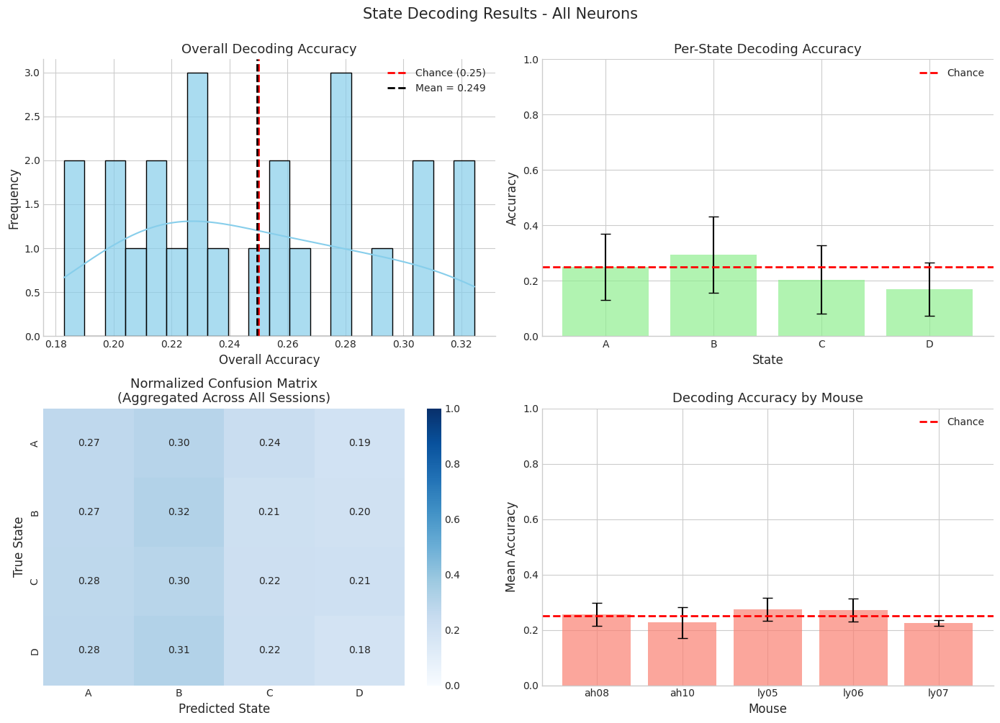


SUMMARY STATISTICS - All Neurons

Overall Accuracy:
  Mean: 0.249 ± 0.042
  Median: 0.244
  Range: [0.183, 0.325]
  Chance level: 0.250

Per-State Accuracy:
  State A: 0.250 ± 0.119
  State B: 0.294 ± 0.138
  State C: 0.204 ± 0.123
  State D: 0.169 ± 0.096

Number of sessions analyzed: 24
Total samples across all sessions: 153718


'\nif len(all_results_all) > 0 and len(all_results_lec) > 0:\n    print("\n" + "="*80)\n    print("COMPARISON: ALL NEURONS vs SIGNIFICANT LEC NEURONS")\n    print("="*80)\n    \n    from scipy.stats import mannwhitneyu\n    \n    accs_all = results_df_all[\'overall_accuracy\'].values\n    accs_lec = results_df_lec[\'overall_accuracy\'].values\n    \n    u_stat, p_value = mannwhitneyu(accs_all, accs_lec, alternative=\'two-sided\')\n    \n    print(f"\nAll Neurons:")\n    print(f"  Mean accuracy: {np.mean(accs_all):.3f} ± {np.std(accs_all):.3f}")\n    print(f"  N sessions: {len(accs_all)}")\n    \n    print(f"\nSignificant LEC Neurons:")\n    print(f"  Mean accuracy: {np.mean(accs_lec):.3f} ± {np.std(accs_lec):.3f}")\n    print(f"  N sessions: {len(accs_lec)}")\n    \n    print(f"\nMann-Whitney U test:")\n    print(f"  U-statistic: {u_stat:.2f}")\n    print(f"  p-value: {p_value:.3e}")\n    \n    # Comparison plot\n    fig, ax = plt.subplots(figsize=(8, 6))\n    combined_df = pd.DataFram

In [36]:
# State Decoding Analysis using SVM-RBF with Leave-One-Out Cross-Validation
# Uses 1-second bins and all neurons

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.model_selection import LeaveOneOut
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from scipy.stats import binned_statistic
import warnings
warnings.filterwarnings('ignore')


def bin_neural_data_1sec(neuron_raw, trial_times, sampling_rate=40):
    """
    Bin neural data into 1-second bins for each trial and state.
    
    Parameters:
    -----------
    neuron_raw : np.ndarray
        Neural data of shape (num_neurons, time_points)
    trial_times : np.ndarray
        Trial times of shape (num_trials, num_states+1) with time indices for state transitions
    sampling_rate : int
        Sampling rate in Hz (default 40 Hz)
        
    Returns:
    --------
    binned_data : list of np.ndarray
        List of binned data arrays, one per trial-state combination
    state_labels : list of int
        Corresponding state labels (0=A, 1=B, 2=C, 3=D)
    trial_indices : list of int
        Corresponding trial indices
    """
    num_neurons = neuron_raw.shape[0]
    num_states = 4
    bin_size = sampling_rate  # 1 second = sampling_rate points
    
    binned_data = []
    state_labels = []
    trial_indices = []
    
    for trial_idx, trial in enumerate(trial_times):
        for state_idx in range(num_states):
            # Get start and end times for this state
            start_time = int(trial[state_idx])
            end_time = int(trial[state_idx + 1])
            
            # Extract neural data for this state
            state_data = neuron_raw[:, start_time:end_time]
            
            # Calculate number of complete 1-second bins
            num_bins = (end_time - start_time) // bin_size
            
            if num_bins > 0:
                # Bin the data into 1-second bins
                for bin_idx in range(num_bins):
                    bin_start = bin_idx * bin_size
                    bin_end = (bin_idx + 1) * bin_size
                    
                    # Average firing rate across this 1-second bin
                    bin_fr = np.mean(state_data[:, bin_start:bin_end], axis=1)
                    
                    binned_data.append(bin_fr)
                    state_labels.append(state_idx)
                    trial_indices.append(trial_idx)
    
    return binned_data, state_labels, trial_indices


def decode_states_loo_cv(data_dic, session_inds_dic, tasks_dic, mouse_recday, 
                          significant_neurons=None, sampling_rate=40):
    """
    Decode states using SVM-RBF with leave-one-task-out cross-validation.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    tasks_dic : dict
        Dictionary containing task information
    mouse_recday : str
        Mouse and recording day identifier
    significant_neurons : dict, optional
        Dictionary mapping mouse_recday to indices of significant neurons
    sampling_rate : int
        Sampling rate in Hz
        
    Returns:
    --------
    results : dict
        Dictionary containing accuracy scores, predictions, and other metrics
    """
    if mouse_recday not in session_inds_dic:
        print(f"No valid sessions for {mouse_recday}")
        return None
    
    valid_sessions = session_inds_dic[mouse_recday]
    
    # Get non-repeating task sessions
    session_tasks = []
    for session in valid_sessions:
        if mouse_recday in tasks_dic and session in tasks_dic[mouse_recday]:
            task = tasks_dic[mouse_recday][session]
            # Check if this task hasn't been seen yet
            if not any(np.array_equal(task, t) for _, t in session_tasks):
                session_tasks.append((session, task))
    
    if len(session_tasks) < 2:
        print(f"Need at least 2 non-repeating tasks for leave-one-task-out CV (found {len(session_tasks)})")
        return None
    
    print(f"\n{'='*80}")
    print(f"Decoding states for {mouse_recday}")
    print(f"Found {len(session_tasks)} non-repeating task sessions")
    print(f"Performing leave-one-task-out cross-validation")
    print(f"{'='*80}")
    
    # Prepare data for all tasks
    all_task_data = []
    
    for session, task in session_tasks:
        print(f"\nLoading session {session}")
        
        # Get neural data
        if 'Neuron_raw' not in data_dic[mouse_recday][session]:
            print(f"  No neural data found for session {session}")
            continue
        
        neuron_raw = data_dic[mouse_recday][session]['Neuron_raw']
        trial_times = data_dic[mouse_recday][session]['Trial_times']
        
        # Filter for significant neurons if provided
        if significant_neurons is not None and mouse_recday in significant_neurons:
            sig_neuron_inds = significant_neurons[mouse_recday]
            neuron_raw = neuron_raw[sig_neuron_inds]
            num_neurons = len(sig_neuron_inds)
        else:
            num_neurons = neuron_raw.shape[0]
        
        # Bin neural data into 1-second bins
        binned_data, state_labels, trial_indices = bin_neural_data_1sec(
            neuron_raw, trial_times, sampling_rate
        )
        
        if len(binned_data) == 0:
            print(f"  No data after binning")
            continue
        
        # Store data for this task
        all_task_data.append({
            'session': session,
            'X': np.array(binned_data),
            'y': np.array(state_labels),
            'trials': np.array(trial_indices),
            'num_neurons': num_neurons
        })
        
        print(f"  Loaded {len(binned_data)} samples from {len(np.unique(trial_indices))} trials")
    
    if len(all_task_data) < 2:
        print(f"Need at least 2 tasks with data (found {len(all_task_data)})")
        return None
    
    print(f"\n{'='*80}")
    print(f"Performing leave-one-task-out CV with {len(all_task_data)} tasks")
    print(f"Using {all_task_data[0]['num_neurons']} neurons")
    print(f"{'='*80}")
    
    # Leave-one-task-out cross-validation
    task_results = []
    all_predictions = []
    all_true_labels = []
    all_test_sessions = []
    
    for test_idx in range(len(all_task_data)):
        # Separate training and test tasks
        test_task = all_task_data[test_idx]
        train_tasks = [all_task_data[i] for i in range(len(all_task_data)) if i != test_idx]
        
        # Combine training data from all training tasks
        X_train_list = [task['X'] for task in train_tasks]
        y_train_list = [task['y'] for task in train_tasks]
        
        X_train = np.vstack(X_train_list)
        y_train = np.concatenate(y_train_list)
        
        X_test = test_task['X']
        y_test = test_task['y']
        
        # Check that all states are present in training data
        if len(np.unique(y_train)) < 4:
            print(f"\nWarning: Not all states present in training data for test task {test_task['session']}")
            continue
        
        print(f"\nFold {test_idx + 1}/{len(all_task_data)}: Testing on session {test_task['session']}")
        print(f"  Training samples: {len(X_train)} from {len(train_tasks)} tasks")
        print(f"  Test samples: {len(X_test)}")
        
        # Standardize features
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        
        # Train SVM with RBF kernel
        svm = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)
        svm.fit(X_train_scaled, y_train)
        
        # Predict on test task
        y_pred = svm.predict(X_test_scaled)
        
        # Calculate accuracy for this fold
        fold_accuracy = accuracy_score(y_test, y_pred)
        
        # Per-state accuracy for this fold
        state_accuracies = []
        for state in range(4):
            state_mask = y_test == state
            if np.sum(state_mask) > 0:
                state_acc = accuracy_score(y_test[state_mask], y_pred[state_mask])
                state_accuracies.append(state_acc)
            else:
                state_accuracies.append(np.nan)
        
        print(f"  Accuracy: {fold_accuracy:.3f}")
        print(f"  State accuracies: A={state_accuracies[0]:.3f}, B={state_accuracies[1]:.3f}, "
              f"C={state_accuracies[2]:.3f}, D={state_accuracies[3]:.3f}")
        
        # Store predictions
        all_predictions.extend(y_pred)
        all_true_labels.extend(y_test)
        all_test_sessions.extend([test_task['session']] * len(y_test))
        
        # Store fold results
        task_results.append({
            'test_session': test_task['session'],
            'fold_accuracy': fold_accuracy,
            'state_A_accuracy': state_accuracies[0],
            'state_B_accuracy': state_accuracies[1],
            'state_C_accuracy': state_accuracies[2],
            'state_D_accuracy': state_accuracies[3],
            'n_train_samples': len(X_train),
            'n_test_samples': len(X_test)
        })
    
    # Calculate overall metrics across all folds
    all_predictions = np.array(all_predictions)
    all_true_labels = np.array(all_true_labels)
    
    overall_accuracy = accuracy_score(all_true_labels, all_predictions)
    conf_matrix = confusion_matrix(all_true_labels, all_predictions)
    
    # Per-state accuracy overall
    state_accuracies_overall = []
    for state in range(4):
        state_mask = all_true_labels == state
        if np.sum(state_mask) > 0:
            state_acc = accuracy_score(
                all_true_labels[state_mask], 
                all_predictions[state_mask]
            )
            state_accuracies_overall.append(state_acc)
        else:
            state_accuracies_overall.append(np.nan)
    
    # Mean accuracy across folds
    fold_accuracies = [r['fold_accuracy'] for r in task_results]
    mean_fold_accuracy = np.mean(fold_accuracies)
    std_fold_accuracy = np.std(fold_accuracies)
    
    print(f"\n{'='*80}")
    print(f"Overall Results for {mouse_recday}:")
    print(f"  Overall accuracy (all predictions): {overall_accuracy:.3f}")
    print(f"  Mean fold accuracy: {mean_fold_accuracy:.3f} ± {std_fold_accuracy:.3f}")
    print(f"  State A accuracy: {state_accuracies_overall[0]:.3f}")
    print(f"  State B accuracy: {state_accuracies_overall[1]:.3f}")
    print(f"  State C accuracy: {state_accuracies_overall[2]:.3f}")
    print(f"  State D accuracy: {state_accuracies_overall[3]:.3f}")
    print(f"{'='*80}")
    
    # Return single result for this mouse_recday
    return [{
        'mouse_recday': mouse_recday,
        'overall_accuracy': overall_accuracy,
        'mean_fold_accuracy': mean_fold_accuracy,
        'std_fold_accuracy': std_fold_accuracy,
        'state_A_accuracy': state_accuracies_overall[0],
        'state_B_accuracy': state_accuracies_overall[1],
        'state_C_accuracy': state_accuracies_overall[2],
        'state_D_accuracy': state_accuracies_overall[3],
        'confusion_matrix': conf_matrix,
        'all_predictions': all_predictions,
        'all_true_labels': all_true_labels,
        'num_neurons': all_task_data[0]['num_neurons'],
        'num_tasks': len(all_task_data),
        'num_samples': len(all_predictions),
        'fold_results': task_results
    }]


def run_decoding_analysis_all_mice(data_dic, session_inds_dic, tasks_dic, 
                                    significant_neurons=None, sampling_rate=40):
    """
    Run state decoding analysis across all mice.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    tasks_dic : dict
        Dictionary containing task information
    significant_neurons : dict, optional
        Dictionary mapping mouse_recday to indices of significant neurons
    sampling_rate : int
        Sampling rate in Hz
        
    Returns:
    --------
    all_results : list
        List of result dictionaries from all mice
    results_df : pd.DataFrame
        DataFrame with all results
    """
    all_results = []
    
    for mouse_recday in data_dic.keys():
        results = decode_states_loo_cv(
            data_dic, session_inds_dic, tasks_dic, mouse_recday,
            significant_neurons=significant_neurons,
            sampling_rate=sampling_rate
        )
        
        if results is not None:
            all_results.extend(results)
    
    # Convert to DataFrame
    results_df = pd.DataFrame([
        {k: v for k, v in r.items() if k not in ['confusion_matrix', 'all_predictions', 'all_true_labels']}
        for r in all_results
    ])
    
    return all_results, results_df


def plot_decoding_results(all_results, results_df, title_suffix="All Neurons"):
    """
    Plot state decoding results.
    
    Parameters:
    -----------
    all_results : list
        List of result dictionaries
    results_df : pd.DataFrame
        DataFrame with results
    title_suffix : str
        Suffix for plot titles
    """
    if len(all_results) == 0:
        print("No results to plot")
        return
    
    # 1. Overall accuracy distribution
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Overall accuracy histogram
    ax = axes[0, 0]
    overall_accs = results_df['overall_accuracy'].values
    chance_level = 0.25  # 4 states
    
    sns.histplot(overall_accs, kde=True, bins=20, ax=ax, color='skyblue', alpha=0.7)
    ax.axvline(x=chance_level, color='red', linestyle='--', linewidth=2, label='Chance (0.25)')
    ax.axvline(x=np.mean(overall_accs), color='black', linestyle='--', linewidth=2, 
              label=f'Mean = {np.mean(overall_accs):.3f}')
    ax.set_xlabel('Overall Accuracy', fontsize=12)
    ax.set_ylabel('Frequency', fontsize=12)
    ax.set_title('Overall Decoding Accuracy', fontsize=13)
    ax.legend()
    sns.despine(ax=ax)
    
    # Per-state accuracy comparison
    ax = axes[0, 1]
    state_data = results_df[['state_A_accuracy', 'state_B_accuracy', 
                             'state_C_accuracy', 'state_D_accuracy']].values
    state_means = np.nanmean(state_data, axis=0)
    state_stds = np.nanstd(state_data, axis=0)
    
    states = ['A', 'B', 'C', 'D']
    ax.bar(states, state_means, yerr=state_stds, capsize=5, alpha=0.7, color='lightgreen')
    ax.axhline(y=chance_level, color='red', linestyle='--', linewidth=2, label='Chance')
    ax.set_xlabel('State', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)
    ax.set_title('Per-State Decoding Accuracy', fontsize=13)
    ax.set_ylim([0, 1])
    ax.legend()
    sns.despine(ax=ax)
    
    # Aggregate confusion matrix
    ax = axes[1, 0]
    # Sum all confusion matrices
    total_conf_matrix = np.zeros((4, 4))
    for result in all_results:
        total_conf_matrix += result['confusion_matrix']
    
    # Normalize by row (true labels)
    conf_matrix_norm = total_conf_matrix / total_conf_matrix.sum(axis=1, keepdims=True)
    
    sns.heatmap(conf_matrix_norm, annot=True, fmt='.2f', cmap='Blues', 
                xticklabels=states, yticklabels=states, ax=ax, vmin=0, vmax=1)
    ax.set_xlabel('Predicted State', fontsize=12)
    ax.set_ylabel('True State', fontsize=12)
    ax.set_title('Normalized Confusion Matrix\n(Aggregated Across All Sessions)', fontsize=13)
    
    # Accuracy by mouse
    ax = axes[1, 1]
    results_df['mouse'] = results_df['mouse_recday'].str.split('_').str[0]
    mouse_accs = results_df.groupby('mouse')['overall_accuracy'].agg(['mean', 'std', 'count'])
    
    ax.bar(mouse_accs.index, mouse_accs['mean'], yerr=mouse_accs['std'], 
           capsize=5, alpha=0.7, color='salmon')
    ax.axhline(y=chance_level, color='red', linestyle='--', linewidth=2, label='Chance')
    ax.set_xlabel('Mouse', fontsize=12)
    ax.set_ylabel('Mean Accuracy', fontsize=12)
    ax.set_title('Decoding Accuracy by Mouse', fontsize=13)
    ax.set_ylim([0, 1])
    ax.legend()
    sns.despine(ax=ax)
    
    plt.suptitle(f'State Decoding Results - {title_suffix}', fontsize=15, y=1.00)
    plt.tight_layout()
    plt.show()
    
    # 2. Summary statistics
    print(f"\n{'='*80}")
    print(f"SUMMARY STATISTICS - {title_suffix}")
    print(f"{'='*80}")
    print(f"\nOverall Accuracy:")
    print(f"  Mean: {np.mean(overall_accs):.3f} ± {np.std(overall_accs):.3f}")
    print(f"  Median: {np.median(overall_accs):.3f}")
    print(f"  Range: [{np.min(overall_accs):.3f}, {np.max(overall_accs):.3f}]")
    print(f"  Chance level: {chance_level:.3f}")
    
    print(f"\nPer-State Accuracy:")
    for i, state in enumerate(states):
        print(f"  State {state}: {state_means[i]:.3f} ± {state_stds[i]:.3f}")
    
    print(f"\nNumber of sessions analyzed: {len(all_results)}")
    print(f"Total samples across all sessions: {results_df['num_samples'].sum()}")


# Example usage:
# ==============

# CELL 1: Run decoding analysis for all neurons
print("="*80)
print("STATE DECODING ANALYSIS - ALL NEURONS")
print("="*80)

all_results_all, results_df_all = run_decoding_analysis_all_mice(
    data_dic, session_inds_dic, tasks_dic,
    significant_neurons=None,
    sampling_rate=40  # Adjust if your sampling rate is different
)

print(f"\n\nTotal sessions analyzed: {len(all_results_all)}")
if len(all_results_all) > 0:
    print(results_df_all.head())


# CELL 2: Plot results for all neurons
if len(all_results_all) > 0:
    plot_decoding_results(all_results_all, results_df_all, "All Neurons")


# CELL 3 (Optional): Run for significant LEC neurons only
# Uncomment if you want to also decode using only significant neurons
"""
print("\n" + "="*80)
print("STATE DECODING ANALYSIS - SIGNIFICANT LEC NEURONS")
print("="*80)

all_results_lec, results_df_lec = run_decoding_analysis_all_mice(
    data_dic, session_inds_dic, tasks_dic,
    significant_neurons=sig_lec_neurons_dic,
    sampling_rate=40
)

print(f"\n\nTotal sessions analyzed: {len(all_results_lec)}")
if len(all_results_lec) > 0:
    print(results_df_lec.head())
    plot_decoding_results(all_results_lec, results_df_lec, "Significant LEC Neurons")
"""


# CELL 4 (Optional): Compare all neurons vs significant LEC neurons
"""
if len(all_results_all) > 0 and len(all_results_lec) > 0:
    print("\n" + "="*80)
    print("COMPARISON: ALL NEURONS vs SIGNIFICANT LEC NEURONS")
    print("="*80)
    
    from scipy.stats import mannwhitneyu
    
    accs_all = results_df_all['overall_accuracy'].values
    accs_lec = results_df_lec['overall_accuracy'].values
    
    u_stat, p_value = mannwhitneyu(accs_all, accs_lec, alternative='two-sided')
    
    print(f"\nAll Neurons:")
    print(f"  Mean accuracy: {np.mean(accs_all):.3f} ± {np.std(accs_all):.3f}")
    print(f"  N sessions: {len(accs_all)}")
    
    print(f"\nSignificant LEC Neurons:")
    print(f"  Mean accuracy: {np.mean(accs_lec):.3f} ± {np.std(accs_lec):.3f}")
    print(f"  N sessions: {len(accs_lec)}")
    
    print(f"\nMann-Whitney U test:")
    print(f"  U-statistic: {u_stat:.2f}")
    print(f"  p-value: {p_value:.3e}")
    
    # Comparison plot
    fig, ax = plt.subplots(figsize=(8, 6))
    combined_df = pd.DataFrame({
        'Accuracy': np.concatenate([accs_all, accs_lec]),
        'Group': ['All Neurons']*len(accs_all) + ['Sig LEC']*len(accs_lec)
    })
    sns.violinplot(data=combined_df, x='Group', y='Accuracy', palette=['lightcoral', 'skyblue'], ax=ax)
    ax.axhline(y=0.25, color='red', linestyle='--', linewidth=2, label='Chance')
    ax.set_ylabel('Decoding Accuracy', fontsize=14)
    ax.set_title(f'Decoding Accuracy Comparison (p = {p_value:.3e})', fontsize=15)
    ax.legend()
    sns.despine()
    plt.tight_layout()
    plt.show()
"""


In [49]:
# Time Coding Analysis for LEC Neurons
# Analyze coding of elapsed time at three timescales: session, trial, and state

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr, ttest_1samp, mannwhitneyu
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score, KFold
import warnings
warnings.filterwarnings('ignore')


def calculate_time_variables(data_dic, mouse_recday, session, sampling_rate=40):
    """
    Calculate elapsed time at three timescales for each timepoint.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data
    mouse_recday : str
        Mouse and recording day identifier
    session : int
        Session number
    sampling_rate : int
        Sampling rate in Hz
        
    Returns:
    --------
    time_from_session_start : array
        Time elapsed from start of session (seconds)
    time_from_trial_start : array
        Time elapsed from start of current trial (seconds)
    time_from_state_start : array
        Time elapsed from start of current state (seconds)
    trial_labels : array
        Trial index for each timepoint
    state_labels : array
        State label (0-3) for each timepoint
    """
    
    # Get trial times for this session
    trial_times = data_dic[mouse_recday]['Trial_times'][session]
    num_trials = trial_times.shape[0]
    
    # Each trial has 360 timepoints (4 states × 90 bins each)
    timepoints_per_trial = 360
    state_length = 90  # timepoints per state
    
    # Total timepoints in session
    total_timepoints = num_trials * timepoints_per_trial
    
    # Initialize arrays
    time_from_session_start = np.zeros(total_timepoints)
    time_from_trial_start = np.zeros(total_timepoints)
    time_from_state_start = np.zeros(total_timepoints)
    trial_labels = np.zeros(total_timepoints, dtype=int)
    state_labels = np.zeros(total_timepoints, dtype=int)
    
    # Fill in time variables for each trial
    for trial_idx in range(num_trials):
        start_idx = trial_idx * timepoints_per_trial
        end_idx = start_idx + timepoints_per_trial
        
        # Trial labels
        trial_labels[start_idx:end_idx] = trial_idx
        
        # Time from session start (cumulative)
        session_start_time = trial_idx * timepoints_per_trial / sampling_rate
        time_from_session_start[start_idx:end_idx] = session_start_time + np.arange(timepoints_per_trial) / sampling_rate
        
        # Time from trial start (resets each trial)
        time_from_trial_start[start_idx:end_idx] = np.arange(timepoints_per_trial) / sampling_rate
        
        # Time from state start and state labels (resets at state boundaries)
        for state_idx in range(4):  # 4 states: A, B, C, D
            state_start = start_idx + state_idx * state_length
            state_end = state_start + state_length
            
            state_labels[state_start:state_end] = state_idx
            time_from_state_start[state_start:state_end] = np.arange(state_length) / sampling_rate
    
    return (time_from_session_start, time_from_trial_start, time_from_state_start,
            trial_labels, state_labels, num_trials)


def analyze_single_cell_time_coding(neuron_activity, time_variable, method='pearson'):
    """
    Analyze single neuron's coding of time variable.
    
    Parameters:
    -----------
    neuron_activity : array
        Firing rates for a single neuron across time
    time_variable : array
        Time variable (session, trial, or state elapsed time)
    method : str
        'pearson' or 'spearman' correlation
        
    Returns:
    --------
    correlation : float
        Correlation coefficient
    p_value : float
        P-value
    r_squared : float
        R-squared from linear regression
    slope : float
        Slope from linear regression
    """
    
    # Remove NaN values
    valid_mask = ~np.isnan(neuron_activity)
    neuron_clean = neuron_activity[valid_mask]
    time_clean = time_variable[valid_mask]
    
    if len(neuron_clean) < 10:
        return np.nan, np.nan, np.nan, np.nan
    
    # Correlation
    if method == 'pearson':
        corr, p_val = pearsonr(time_clean, neuron_clean)
    else:
        corr, p_val = spearmanr(time_clean, neuron_clean)
    
    # Linear regression
    X = time_clean.reshape(-1, 1)
    y = neuron_clean
    
    reg = LinearRegression()
    reg.fit(X, y)
    
    y_pred = reg.predict(X)
    ss_res = np.sum((y - y_pred) ** 2)
    ss_tot = np.sum((y - np.mean(y)) ** 2)
    r_squared = 1 - (ss_res / ss_tot) if ss_tot > 0 else 0
    
    slope = reg.coef_[0]
    
    return corr, p_val, r_squared, slope


def analyze_time_coding_all_neurons(data_dic, session_inds_dic, mouse_recday, 
                                    neuron_filter=None, sampling_rate=40):
    """
    Analyze time coding for all neurons in a recording day.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    mouse_recday : str
        Mouse and recording day identifier
    neuron_filter : array, optional
        Indices of neurons to analyze (e.g., LEC neurons only)
    sampling_rate : int
        Sampling rate in Hz
        
    Returns:
    --------
    results_df : pandas DataFrame
        Results for each neuron and time scale
    """
    
    results_list = []
    
    print(f"\nAnalyzing {mouse_recday}")
    
    # Get neural data for this mouse_recday
    if mouse_recday not in norm_neurons_dic:
        print(f"  No neural data found for {mouse_recday}")
        return results_list
    
    # Get valid sessions from session_inds_dic
    if mouse_recday not in session_inds_dic:
        print(f"  No valid sessions for {mouse_recday}")
        return results_list
    
    valid_sessions = session_inds_dic[mouse_recday]
    
    for session_idx, session in enumerate(valid_sessions):
        print(f"  Session {session_idx}")
        
        # Get the neural data for this session (2D: neurons × concatenated_timepoints)
        neuron_raw = norm_neurons_dic[mouse_recday][session_idx]
        
        # Check shape of neural data
        if neuron_raw.ndim != 2:
            print(f"    Warning: Expected 2D neural data, got {neuron_raw.ndim}D. Skipping.")
            continue
        
        num_neurons = neuron_raw.shape[0]
        total_timepoints = neuron_raw.shape[1]
        
        # Calculate time variables
        time_vars = calculate_time_variables(data_dic, mouse_recday, session, sampling_rate)
        time_session, time_trial, time_state, trial_labels, state_labels, num_trials = time_vars
        
        # Verify dimensions match
        if len(time_session) != total_timepoints:
            print(f"    Warning: Dimension mismatch. Time variables length {len(time_session)} != neural data timepoints {total_timepoints}. Skipping.")
            continue
        
        print(f"    Analyzing {num_neurons} neurons, {num_trials} trials, {total_timepoints} total timepoints")
        
        # Apply neuron filter if provided
        if neuron_filter is not None:
            if len(neuron_filter) != num_neurons:
                print(f"    Warning: Neuron filter length {len(neuron_filter)} != num_neurons {num_neurons}. Skipping.")
                continue
            neuron_indices = np.where(neuron_filter)[0] if neuron_filter.dtype == bool else neuron_filter
        else:
            neuron_indices = np.arange(num_neurons)
        
        # For each neuron
        for neuron_idx in range(num_neurons):
            # Skip if not in filter
            if neuron_filter is not None:
                if neuron_filter.dtype == bool:
                    if not neuron_filter[neuron_idx]:
                        continue
                else:
                    if neuron_idx not in neuron_filter:
                        continue
            
            # Get firing rates for this neuron (already flattened across trials)
            neuron_data = neuron_raw[neuron_idx]
            
            # Analyze coding of session time
            corr_sess, p_sess, r2_sess, slope_sess = analyze_single_cell_time_coding(
                neuron_data, time_session, method='pearson'
            )
            
            # Analyze coding of trial time
            corr_trial, p_trial, r2_trial, slope_trial = analyze_single_cell_time_coding(
                neuron_data, time_trial, method='pearson'
            )
            
            # Analyze coding of state time
            corr_state, p_state, r2_state, slope_state = analyze_single_cell_time_coding(
                neuron_data, time_state, method='pearson'
            )
            
            results_list.append({
                'mouse_recday': mouse_recday,
                'session': session,
                'neuron_idx': global_neuron_idx,
                'session_time_corr': corr_sess,
                'session_time_pval': p_sess,
                'session_time_r2': r2_sess,
                'session_time_slope': slope_sess,
                'trial_time_corr': corr_trial,
                'trial_time_pval': p_trial,
                'trial_time_r2': r2_trial,
                'trial_time_slope': slope_trial,
                'state_time_corr': corr_state,
                'state_time_pval': p_state,
                'state_time_r2': r2_state,
                'state_time_slope': slope_state
            })
    
    results_df = pd.DataFrame(results_list)
    return results_df


def population_time_decoding(data_dic, session_inds_dic, mouse_recday,
                             neuron_filter=None, sampling_rate=40, n_folds=5):
    """
    Decode elapsed time from population activity using cross-validated regression.
    
    Parameters:
    -----------
    data_dic : dict
        Dictionary containing neural data
    session_inds_dic : dict
        Dictionary mapping mouse_recday to valid session indices
    mouse_recday : str
        Mouse and recording day identifier
    neuron_filter : array, optional
        Indices of neurons to analyze
    sampling_rate : int
        Sampling rate in Hz
    n_folds : int
        Number of cross-validation folds
        
    Returns:
    --------
    decoding_results : dict
        Decoding performance for each time scale
    """
    
    if mouse_recday not in session_inds_dic:
        return None
    
    valid_sessions = session_inds_dic[mouse_recday]
    
    results = {
        'session_time': [],
        'trial_time': [],
        'state_time': []
    }
    
    print(f"\nPopulation decoding for {mouse_recday}")
    
    # Get neural data for this mouse_recday
    if mouse_recday not in norm_neurons_dic:
        print(f"  No neural data found for {mouse_recday}")
        return None
    
    # Get valid sessions from session_inds_dic
    if mouse_recday not in session_inds_dic:
        print(f"  No valid sessions for {mouse_recday}")
        return None
    
    valid_sessions = session_inds_dic[mouse_recday]
    
    for session_idx, session in enumerate(valid_sessions):
        print(f"  Session {session_idx}")
        
        # Get the neural data for this session (2D: neurons × concatenated_timepoints)
        neuron_raw = norm_neurons_dic[mouse_recday][session_idx]
        
        # Check shape
        if neuron_raw.ndim != 2:
            print(f"    Warning: Expected 2D neural data, got {neuron_raw.ndim}D. Skipping.")
            continue
        
        num_neurons = neuron_raw.shape[0]
        total_timepoints = neuron_raw.shape[1]
        
        # Calculate time variables
        time_vars = calculate_time_variables(data_dic, mouse_recday, session, sampling_rate)
        time_session, time_trial, time_state, trial_labels, state_labels, num_trials = time_vars
        
        # Verify dimensions
        if len(time_session) != total_timepoints:
            print(f"    Warning: Dimension mismatch. Time variables ({len(time_session)}) != neural data ({total_timepoints}). Skipping.")
            continue
        
        print(f"    Using {num_neurons} neurons, {num_trials} trials, {total_timepoints} total timepoints")
        
        # Prepare population matrix: (timepoints, neurons)
        # Transpose 2D data: (neurons, timepoints) -> (timepoints, neurons)
        if neuron_filter is not None:
            if len(neuron_filter) != num_neurons:
                print(f"    Warning: Neuron filter length {len(neuron_filter)} != num_neurons {num_neurons}. Skipping.")
                continue
            neuron_indices = np.where(neuron_filter)[0] if neuron_filter.dtype == bool else neuron_filter
            X = neuron_raw[neuron_indices].T
        else:
            X = neuron_raw.T
        
        # Remove NaN rows
        valid_rows = ~np.isnan(X).any(axis=1)
        X_clean = X[valid_rows]
        time_session_clean = time_session[valid_rows]
        time_trial_clean = time_trial[valid_rows]
        time_state_clean = time_state[valid_rows]
        
        if len(X_clean) < 50:
            print(f"    Warning: Too few valid timepoints ({len(X_clean)}). Skipping.")
            continue
        
        # Standardize features
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X_clean)
        
        # Cross-validated regression for each time scale
        kfold = KFold(n_splits=n_folds, shuffle=True, random_state=42)
        
        # Session time
        reg_session = LinearRegression()
        scores_session = cross_val_score(reg_session, X_scaled, time_session_clean,
                                        cv=kfold, scoring='r2')
        results['session_time'].append({
            'mouse_recday': mouse_recday,
            'session': session,
            'r2_mean': np.mean(scores_session),
            'r2_std': np.std(scores_session)
        })
        
        # Trial time
        reg_trial = LinearRegression()
        scores_trial = cross_val_score(reg_trial, X_scaled, time_trial_clean,
                                      cv=kfold, scoring='r2')
        results['trial_time'].append({
            'mouse_recday': mouse_recday,
            'session': session,
            'r2_mean': np.mean(scores_trial),
            'r2_std': np.std(scores_trial)
        })
        
        # State time
        reg_state = LinearRegression()
        scores_state = cross_val_score(reg_state, X_scaled, time_state_clean,
                                      cv=kfold, scoring='r2')
        results['state_time'].append({
            'mouse_recday': mouse_recday,
            'session': session,
            'r2_mean': np.mean(scores_state),
            'r2_std': np.std(scores_state)
        })
        
        print(f"      Session time R² = {np.mean(scores_session):.3f}")
        print(f"      Trial time R² = {np.mean(scores_trial):.3f}")
        print(f"      State time R² = {np.mean(scores_state):.3f}")
    
    return results


def plot_single_cell_results(results_df, title_suffix=""):
    """
    Plot single-cell time coding results.
    
    Parameters:
    -----------
    results_df : pandas DataFrame
        Results from analyze_time_coding_all_neurons
    title_suffix : str
        Suffix for plot titles
    """
    
    if len(results_df) == 0:
        print("No results to plot")
        return
    
    # Significance threshold
    alpha = 0.05
    
    # Count significant neurons for each time scale
    sig_session = np.sum(results_df['session_time_pval'] < alpha)
    sig_trial = np.sum(results_df['trial_time_pval'] < alpha)
    sig_state = np.sum(results_df['state_time_pval'] < alpha)
    total_neurons = len(results_df)
    
    print(f"\n{'='*80}")
    print(f"SINGLE-CELL TIME CODING SUMMARY - {title_suffix}")
    print(f"{'='*80}")
    print(f"Total neurons: {total_neurons}")
    print(f"Session time: {sig_session} ({100*sig_session/total_neurons:.1f}%) significant")
    print(f"Trial time: {sig_trial} ({100*sig_trial/total_neurons:.1f}%) significant")
    print(f"State time: {sig_state} ({100*sig_state/total_neurons:.1f}%) significant")
    
    # Create comprehensive plot
    fig, axes = plt.subplots(3, 3, figsize=(18, 15))
    
    time_scales = ['session_time', 'trial_time', 'state_time']
    time_labels = ['Session Time', 'Trial Time', 'State Time']
    
    for idx, (time_scale, time_label) in enumerate(zip(time_scales, time_labels)):
        # Correlation distribution
        ax = axes[idx, 0]
        corr_data = results_df[f'{time_scale}_corr'].values
        corr_data = corr_data[~np.isnan(corr_data)]
        
        sns.histplot(corr_data, kde=True, bins=50, ax=ax, color='steelblue', alpha=0.7)
        ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
        ax.axvline(x=np.mean(corr_data), color='black', linestyle='--', 
                  linewidth=2, label=f'Mean={np.mean(corr_data):.3f}')
        ax.set_xlabel('Correlation with Time', fontsize=12)
        ax.set_ylabel('Count', fontsize=12)
        ax.set_title(f'{time_label} - Correlation Distribution', fontsize=13)
        ax.legend()
        sns.despine(ax=ax)
        
        # R-squared distribution
        ax = axes[idx, 1]
        r2_data = results_df[f'{time_scale}_r2'].values
        r2_data = r2_data[~np.isnan(r2_data)]
        
        sns.histplot(r2_data, kde=True, bins=50, ax=ax, color='coral', alpha=0.7)
        ax.axvline(x=np.mean(r2_data), color='black', linestyle='--',
                  linewidth=2, label=f'Mean={np.mean(r2_data):.3f}')
        ax.set_xlabel('R²', fontsize=12)
        ax.set_ylabel('Count', fontsize=12)
        ax.set_title(f'{time_label} - R² Distribution', fontsize=13)
        ax.legend()
        sns.despine(ax=ax)
        
        # Slope distribution
        ax = axes[idx, 2]
        slope_data = results_df[f'{time_scale}_slope'].values
        slope_data = slope_data[~np.isnan(slope_data)]
        
        sns.histplot(slope_data, kde=True, bins=50, ax=ax, color='forestgreen', alpha=0.7)
        ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero')
        ax.axvline(x=np.mean(slope_data), color='black', linestyle='--',
                  linewidth=2, label=f'Mean={np.mean(slope_data):.3f}')
        ax.set_xlabel('Slope (Hz/sec)', fontsize=12)
        ax.set_ylabel('Count', fontsize=12)
        ax.set_title(f'{time_label} - Slope Distribution', fontsize=13)
        ax.legend()
        sns.despine(ax=ax)
    
    plt.suptitle(f'Single-Cell Time Coding Analysis - {title_suffix}', 
                 fontsize=16, y=0.995)
    plt.tight_layout()
    plt.show()
    
    # Statistical tests
    print(f"\n{'='*80}")
    print(f"STATISTICAL TESTS - {title_suffix}")
    print(f"{'='*80}")
    
    for time_scale, time_label in zip(time_scales, time_labels):
        corr_data = results_df[f'{time_scale}_corr'].values
        corr_data = corr_data[~np.isnan(corr_data)]
        
        t_stat, p_val = ttest_1samp(corr_data, 0)
        
        print(f"\n{time_label}:")
        print(f"  Mean correlation: {np.mean(corr_data):.4f} ± {np.std(corr_data):.4f}")
        print(f"  t-statistic: {t_stat:.3f}")
        print(f"  p-value: {p_val:.3e}")


def plot_population_decoding_results(decoding_results, title_suffix=""):
    """
    Plot population-level time decoding results.
    
    Parameters:
    -----------
    decoding_results : dict
        Results from population_time_decoding
    title_suffix : str
        Suffix for plot titles
    """
    
    # Convert to DataFrames
    session_df = pd.DataFrame(decoding_results['session_time'])
    trial_df = pd.DataFrame(decoding_results['trial_time'])
    state_df = pd.DataFrame(decoding_results['state_time'])
    
    if len(session_df) == 0:
        print("No decoding results to plot")
        return
    
    print(f"\n{'='*80}")
    print(f"POPULATION TIME DECODING SUMMARY - {title_suffix}")
    print(f"{'='*80}")
    print(f"Session time: R² = {session_df['r2_mean'].mean():.3f} ± {session_df['r2_mean'].std():.3f}")
    print(f"Trial time: R² = {trial_df['r2_mean'].mean():.3f} ± {trial_df['r2_mean'].std():.3f}")
    print(f"State time: R² = {state_df['r2_mean'].mean():.3f} ± {state_df['r2_mean'].std():.3f}")
    
    # Create comparison plot
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Bar plot
    ax = axes[0]
    time_scales = ['Session', 'Trial', 'State']
    means = [session_df['r2_mean'].mean(), trial_df['r2_mean'].mean(), state_df['r2_mean'].mean()]
    stds = [session_df['r2_mean'].std(), trial_df['r2_mean'].std(), state_df['r2_mean'].std()]
    
    bars = ax.bar(time_scales, means, yerr=stds, capsize=10, 
                  color=['steelblue', 'coral', 'forestgreen'], alpha=0.7)
    ax.set_ylabel('Cross-Validated R²', fontsize=14)
    ax.set_xlabel('Time Scale', fontsize=14)
    ax.set_title(f'Population Time Decoding - {title_suffix}', fontsize=15)
    ax.axhline(y=0, color='red', linestyle='--', linewidth=1)
    sns.despine(ax=ax)
    
    # Violin plot
    ax = axes[1]
    combined_df = pd.DataFrame({
        'R²': np.concatenate([session_df['r2_mean'].values, 
                             trial_df['r2_mean'].values,
                             state_df['r2_mean'].values]),
        'Time Scale': (['Session'] * len(session_df) + 
                      ['Trial'] * len(trial_df) + 
                      ['State'] * len(state_df))
    })
    
    sns.violinplot(data=combined_df, x='Time Scale', y='R²', 
                  palette=['steelblue', 'coral', 'forestgreen'], ax=ax)
    ax.set_ylabel('Cross-Validated R²', fontsize=14)
    ax.set_xlabel('Time Scale', fontsize=14)
    ax.set_title('Distribution Comparison', fontsize=15)
    ax.axhline(y=0, color='red', linestyle='--', linewidth=1)
    sns.despine(ax=ax)
    
    plt.tight_layout()
    plt.show()


# Example usage:

# CELL 1: Analyze all neurons - single cell level
print("="*80)
print("SINGLE-CELL TIME CODING - ALL NEURONS")
print("="*80)

all_neurons_results = []
for mouse_recday in data_dic.keys():
    result = analyze_time_coding_all_neurons(
        data_dic, session_inds_dic, mouse_recday,
        neuron_filter=None
    )
    if result is not None:
        all_neurons_results.append(result)

if len(all_neurons_results) > 0:
    all_neurons_df = pd.concat(all_neurons_results, ignore_index=True)
    print(f"\nTotal results: {len(all_neurons_df)}")
    print(all_neurons_df.head())

# CELL 2: Analyze LEC neurons only - single cell level  
print("\n" + "="*80)
print("SINGLE-CELL TIME CODING - LEC NEURONS ONLY")
print("="*80)

# Note: Need to get LEC spatial filter (not state tuning filter)
# This would be something like lec_spatial_neurons_dic that identifies neurons in LEC anatomically
# For now, using sig_lec_neurons_dic as a placeholder - replace with spatial filter

lec_neurons_results = []
for mouse_recday in data_dic.keys():
    if mouse_recday in sig_lec_neurons_dic:  # Replace with LEC spatial filter
        result = analyze_time_coding_all_neurons(
            data_dic, session_inds_dic, mouse_recday,
            neuron_filter=sig_lec_neurons_dic[mouse_recday]  # Replace with spatial filter
        )
        if result is not None:
            lec_neurons_results.append(result)

if len(lec_neurons_results) > 0:
    lec_neurons_df = pd.concat(lec_neurons_results, ignore_index=True)
    print(f"\nTotal results: {len(lec_neurons_df)}")
    print(lec_neurons_df.head())

# CELL 3: Plot single-cell results for all neurons
if len(all_neurons_results) > 0:
    plot_single_cell_results(all_neurons_df, "All Neurons")

# CELL 4: Plot single-cell results for LEC neurons
if len(lec_neurons_results) > 0:
    plot_single_cell_results(lec_neurons_df, "LEC Neurons")

# CELL 5: Population decoding - all neurons
print("\n" + "="*80)
print("POPULATION TIME DECODING - ALL NEURONS")
print("="*80)

all_neurons_decoding = {}
for key in ['session_time', 'trial_time', 'state_time']:
    all_neurons_decoding[key] = []

for mouse_recday in data_dic.keys():
    result = population_time_decoding(
        data_dic, session_inds_dic, mouse_recday,
        neuron_filter=None
    )
    if result is not None:
        for key in ['session_time', 'trial_time', 'state_time']:
            all_neurons_decoding[key].extend(result[key])

# CELL 6: Population decoding - LEC neurons
print("\n" + "="*80)
print("POPULATION TIME DECODING - LEC NEURONS ONLY")
print("="*80)

lec_neurons_decoding = {}
for key in ['session_time', 'trial_time', 'state_time']:
    lec_neurons_decoding[key] = []

for mouse_recday in data_dic.keys():
    if mouse_recday in sig_lec_neurons_dic:  # Replace with spatial filter
        result = population_time_decoding(
            data_dic, session_inds_dic, mouse_recday,
            neuron_filter=sig_lec_neurons_dic[mouse_recday]  # Replace with spatial filter
        )
        if result is not None:
            for key in ['session_time', 'trial_time', 'state_time']:
                lec_neurons_decoding[key].extend(result[key])

# CELL 7: Plot population decoding results - all neurons
if len(all_neurons_decoding['session_time']) > 0:
    plot_population_decoding_results(all_neurons_decoding, "All Neurons")

# CELL 8: Plot population decoding results - LEC neurons
if len(lec_neurons_decoding['session_time']) > 0:
    plot_population_decoding_results(lec_neurons_decoding, "LEC Neurons")

# CELL 9: Compare all neurons vs LEC neurons
print("\n" + "="*80)
print("COMPARISON: ALL NEURONS vs LEC NEURONS")
print("="*80)

if len(all_neurons_df) > 0 and len(lec_neurons_df) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    time_scales = ['session_time', 'trial_time', 'state_time']
    time_labels = ['Session Time', 'Trial Time', 'State Time']
    
    for idx, (time_scale, time_label) in enumerate(zip(time_scales, time_labels)):
        ax = axes[idx]
        
        all_corrs = all_neurons_df[f'{time_scale}_corr'].dropna().values
        lec_corrs = lec_neurons_df[f'{time_scale}_corr'].dropna().values
        
        # Mann-Whitney U test
        u_stat, p_val = mannwhitneyu(all_corrs, lec_corrs, alternative='two-sided')
        
        # Plot
        combined = pd.DataFrame({
            'Correlation': np.concatenate([all_corrs, lec_corrs]),
            'Group': ['All'] * len(all_corrs) + ['LEC'] * len(lec_corrs)
        })
        
        sns.violinplot(data=combined, x='Group', y='Correlation', 
                      palette=['lightcoral', 'steelblue'], ax=ax)
        ax.axhline(y=0, color='red', linestyle='--', linewidth=1)
        ax.set_ylabel('Correlation', fontsize=12)
        ax.set_xlabel('', fontsize=12)
        ax.set_title(f'{time_label}\n(p={p_val:.3e})', fontsize=13)
        sns.despine(ax=ax)
        
        print(f"\n{time_label}:")
        print(f"  All neurons: {np.mean(all_corrs):.4f} ± {np.std(all_corrs):.4f}")
        print(f"  LEC neurons: {np.mean(lec_corrs):.4f} ± {np.std(lec_corrs):.4f}")
        print(f"  Mann-Whitney U: {u_stat:.2f}, p={p_val:.3e}")
    
    plt.suptitle('Time Coding: All Neurons vs LEC Neurons', fontsize=16)
    plt.tight_layout()
    plt.show()


SINGLE-CELL TIME CODING - ALL NEURONS

Analyzing ah08_20250613_20250615
  Session 0
  Session 1
  Session 2
  Session 3
  Session 4
  Session 5
  Session 6
  Session 7

Analyzing ah08_20250616_20250617
  Session 0
  Session 1
  Session 2
  Session 3
  Session 4
  Session 5
  Session 6
  Session 7


IndexError: list index out of range

In [98]:
data_dic[mouse_recday][session]['Neuron_raw'].shape

(86, 36212)

In [38]:
for mouse in mouse_corrs_dic:
    print(len(mouse_corrs_dic[mouse]))

977
560
264
208
218


--- Mouse: ah08 ---
Component 1: Mean=0.31, StdDev=0.25, Weight=0.48
Component 2: Mean=-0.16, StdDev=0.15, Weight=0.52


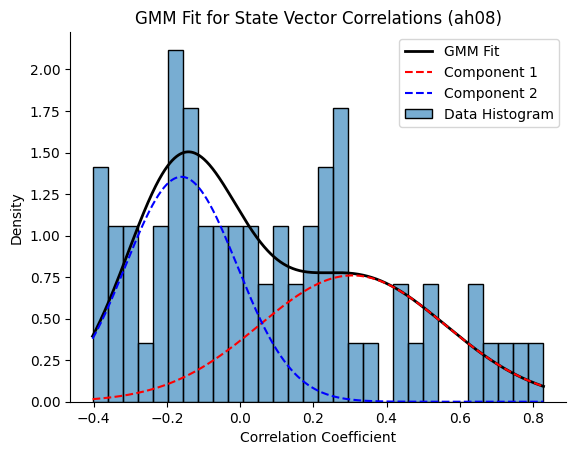

--- Mouse: ah10 ---
Component 1: Mean=0.25, StdDev=0.25, Weight=0.25
Component 2: Mean=-0.10, StdDev=0.16, Weight=0.75


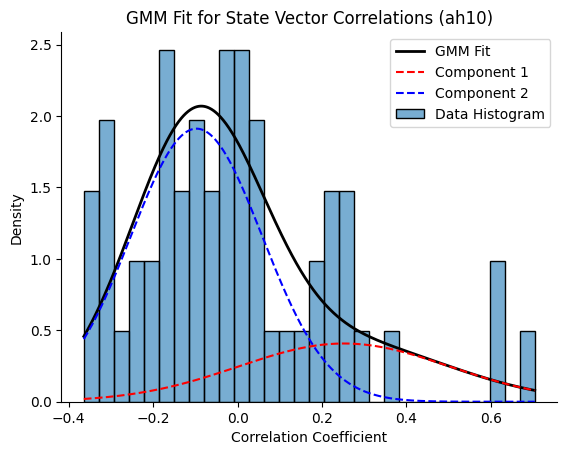

--- Mouse: ly05 ---
Component 1: Mean=-0.13, StdDev=0.13, Weight=0.80
Component 2: Mean=0.42, StdDev=0.17, Weight=0.20


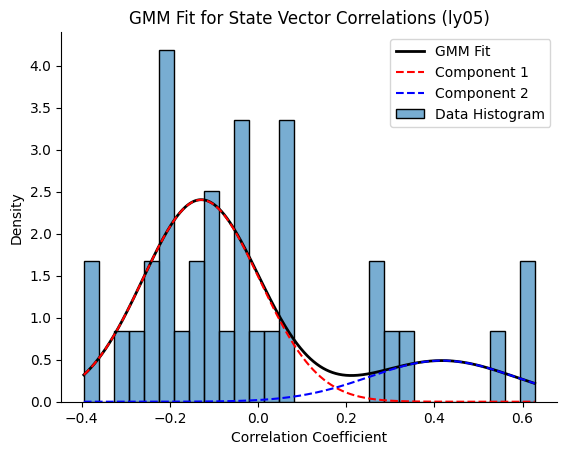

--- Mouse: ly06 ---
Component 1: Mean=0.14, StdDev=0.22, Weight=0.56
Component 2: Mean=-0.08, StdDev=0.20, Weight=0.44


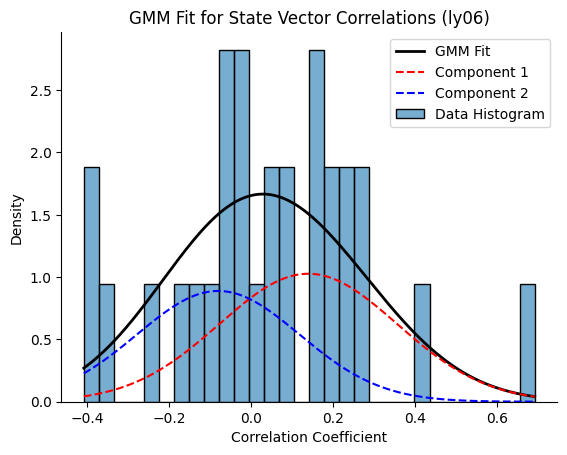

--- Mouse: ly07 ---
Component 1: Mean=-0.18, StdDev=0.13, Weight=0.87
Component 2: Mean=0.24, StdDev=0.08, Weight=0.13


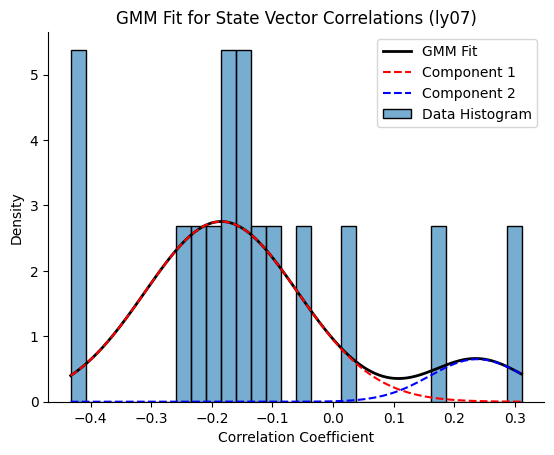

In [92]:
from sklearn.mixture import GaussianMixture
from scipy.stats import norm

for mouse in mouse_corrs_dic:
    corrs = mouse_corrs_dic[mouse]
    # Reshape data for GMM
    corrs = np.array(corrs).reshape(-1, 1)

    # Fit a 2-component Gaussian Mixture Model
    gmm = GaussianMixture(n_components=2, random_state=0).fit(corrs)
    
    # Get the parameters of the fitted model
    means = gmm.means_.flatten()
    covariances = gmm.covariances_.flatten()
    weights = gmm.weights_.flatten()

    print(f"--- Mouse: {mouse} ---")
    print(f"Component 1: Mean={means[0]:.2f}, StdDev={np.sqrt(covariances[0]):.2f}, Weight={weights[0]:.2f}")
    print(f"Component 2: Mean={means[1]:.2f}, StdDev={np.sqrt(covariances[1]):.2f}, Weight={weights[1]:.2f}")

    # --- Visualization ---
    fig, ax = plt.subplots()
    
    # Plot histogram of the data
    sns.histplot(corrs, bins=30, stat='density', color='grey', alpha=0.6, label='Data Histogram')
    
    # Generate x-values for plotting the PDF
    x_range = np.linspace(corrs.min(), corrs.max(), 1000).reshape(-1, 1)
    
    # Calculate the PDF for the combined GMM
    log_prob = gmm.score_samples(x_range)
    pdf = np.exp(log_prob)
    
    # Plot the individual Gaussian components
    pdf_individual = [w * norm.pdf(x_range.flatten(), m, np.sqrt(c)) for w, m, c in zip(weights, means, covariances)]
    
    ax.plot(x_range, pdf, 'k-', linewidth=2, label='GMM Fit')
    ax.plot(x_range, pdf_individual[0], 'r--', label='Component 1')
    ax.plot(x_range, pdf_individual[1], 'b--', label='Component 2')
    
    ax.set_title(f'GMM Fit for State Vector Correlations ({mouse})')
    ax.set_xlabel('Correlation Coefficient')
    ax.set_ylabel('Density')
    ax.legend()
    sns.despine()
    plt.show()

--- Mouse: ah08 ---
Component 1: Mean=-0.12, StdDev=0.14, Weight=0.45
Component 2: Mean=0.37, StdDev=0.16, Weight=0.18
Component 3: Mean=0.01, StdDev=0.13, Weight=0.37


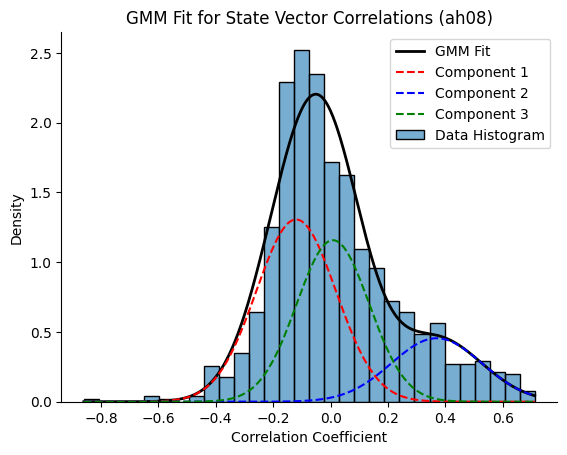

--- Mouse: ah10 ---
Component 1: Mean=-0.02, StdDev=0.11, Weight=0.44
Component 2: Mean=-0.11, StdDev=0.17, Weight=0.37
Component 3: Mean=0.26, StdDev=0.15, Weight=0.19


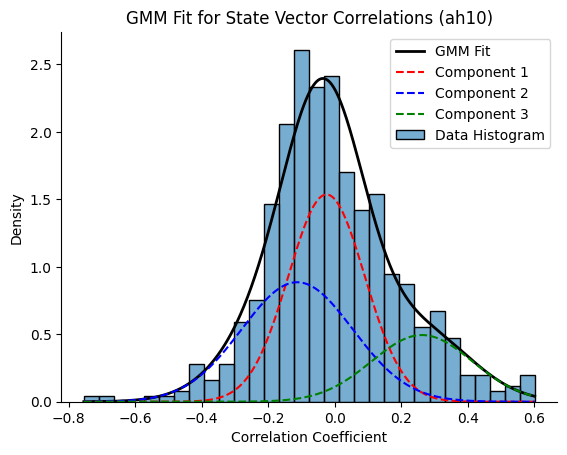

--- Mouse: ly05 ---
Component 1: Mean=-0.10, StdDev=0.14, Weight=0.54
Component 2: Mean=0.44, StdDev=0.18, Weight=0.15
Component 3: Mean=0.05, StdDev=0.14, Weight=0.31


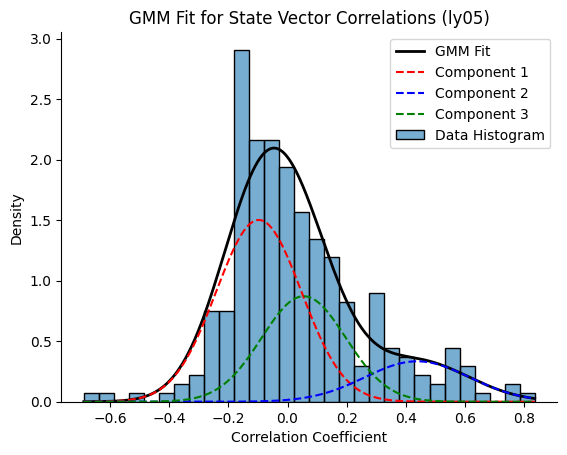

--- Mouse: ly06 ---
Component 1: Mean=0.10, StdDev=0.12, Weight=0.19
Component 2: Mean=-0.07, StdDev=0.13, Weight=0.66
Component 3: Mean=0.26, StdDev=0.13, Weight=0.14


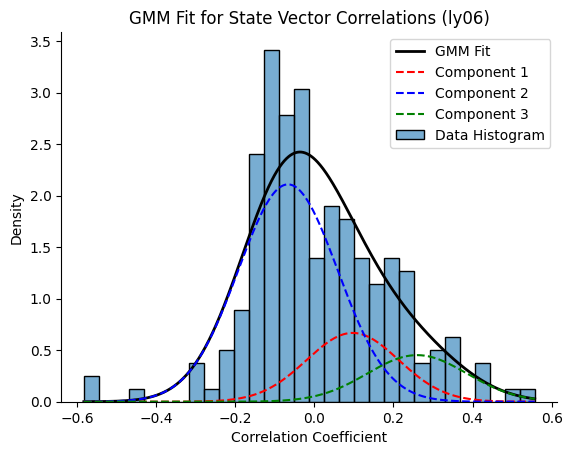

--- Mouse: ly07 ---
Component 1: Mean=0.01, StdDev=0.07, Weight=0.37
Component 2: Mean=-0.14, StdDev=0.10, Weight=0.47
Component 3: Mean=0.18, StdDev=0.11, Weight=0.15


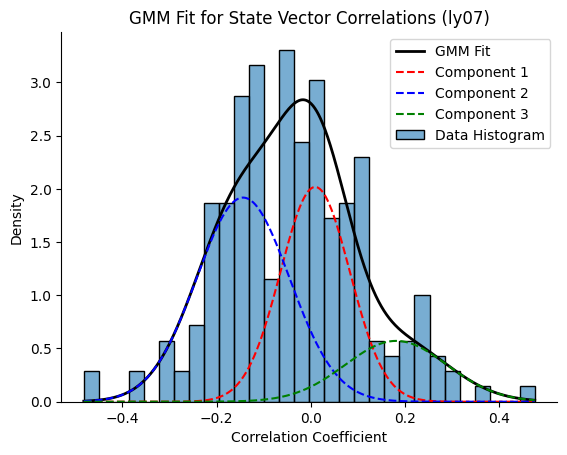

In [42]:
from sklearn.mixture import GaussianMixture
from scipy.stats import norm

for mouse in mouse_corrs_dic:
    corrs = mouse_corrs_dic[mouse]
    # Reshape data for GMM
    corrs = np.array(corrs).reshape(-1, 1)

    # Fit a 2-component Gaussian Mixture Model
    gmm = GaussianMixture(n_components=3, random_state=0).fit(corrs)
    
    # Get the parameters of the fitted model
    means = gmm.means_.flatten()
    covariances = gmm.covariances_.flatten()
    weights = gmm.weights_.flatten()

    print(f"--- Mouse: {mouse} ---")
    print(f"Component 1: Mean={means[0]:.2f}, StdDev={np.sqrt(covariances[0]):.2f}, Weight={weights[0]:.2f}")
    print(f"Component 2: Mean={means[1]:.2f}, StdDev={np.sqrt(covariances[1]):.2f}, Weight={weights[1]:.2f}")
    print(f"Component 3: Mean={means[2]:.2f}, StdDev={np.sqrt(covariances[2]):.2f}, Weight={weights[2]:.2f}")
    # --- Visualization ---
    fig, ax = plt.subplots()
    
    # Plot histogram of the data
    sns.histplot(corrs, bins=30, stat='density', color='grey', alpha=0.6, label='Data Histogram')
    
    # Generate x-values for plotting the PDF
    x_range = np.linspace(corrs.min(), corrs.max(), 1000).reshape(-1, 1)
    
    # Calculate the PDF for the combined GMM
    log_prob = gmm.score_samples(x_range)
    pdf = np.exp(log_prob)
    
    # Plot the individual Gaussian components
    pdf_individual = [w * norm.pdf(x_range.flatten(), m, np.sqrt(c)) for w, m, c in zip(weights, means, covariances)]
    
    ax.plot(x_range, pdf, 'k-', linewidth=2, label='GMM Fit')
    ax.plot(x_range, pdf_individual[0], 'r--', label='Component 1')
    ax.plot(x_range, pdf_individual[1], 'b--', label='Component 2')
    ax.plot(x_range, pdf_individual[2], 'g--', label='Component 3')
    
    ax.set_title(f'GMM Fit for State Vector Correlations ({mouse})')
    ax.set_xlabel('Correlation Coefficient')
    ax.set_ylabel('Density')
    ax.legend()
    sns.despine()
    plt.show()

In [43]:
data_dic[mouse_recday][0]['num_trials']


24

In [22]:
from tqdm import tqdm

def compute_remapping_angle(mean1, mean2):
    n_bins = len(mean1)
    angles = np.arange(n_bins) * (2 * np.pi / n_bins)  # Angles corresponding to each bin
    correlations = []
    for shift in range(n_bins):
        # Circularly shift mean1
        shifted_mean1 = np.roll(mean1, shift)
        # Compute correlation
        correlation = np.corrcoef(shifted_mean1, mean2)[0, 1]
        correlations.append(correlation)
    # Find the shift that maximizes the correlation
    best_shift = np.argmax(correlations)
    best_angle = angles[best_shift]
    return best_shift
    
pair_angles_dic = {}
angle_shifts = []
angle_1s = []
angle_2s = []
for mouse_recday in tqdm(mouse_recdays):

    # if 'ah08' not in mouse_recday:
    #     continue

    pair_angles = defaultdict(list)
    try:
        sig_neurons = sig_lec_neurons_dic[mouse_recday]
    except KeyError:
        print(f"No significant LEC neurons for {mouse_recday}, skipping.")
        continue
    valid_sessions = valid_sessions_dic[mouse_recday]
    for ind, session1_idx in enumerate(valid_sessions[:-1]):
        for session2_idx in valid_sessions[ind+1:]:
            for i, n1 in enumerate(sig_neurons[:-1]):
                for j, n2 in enumerate(sig_neurons[i+1:]):
                    if n1!=n2:
                        # Get firing rates for these two neurons in session X
                        mean1 = data_dic[mouse_recday][session1_idx]['Smoothed_norm'][n1]
                        mean1 = mean1-np.mean(mean1)
                        mean2 = data_dic[mouse_recday][session1_idx]['Smoothed_norm'][n2]
                        mean2 = mean2-np.mean(mean2)
                        angle1 = compute_remapping_angle(mean1, mean2)
                        angle_1s.append(angle1)

                        mean1 = data_dic[mouse_recday][session2_idx]['Smoothed_norm'][n1]
                        mean1 = mean1-np.mean(mean1)
                        mean2 = data_dic[mouse_recday][session2_idx]['Smoothed_norm'][n2]
                        mean2 = mean2-np.mean(mean2)   
                        angle2 = compute_remapping_angle(mean1, mean2)
                        angle_2s.append(angle2)
                        # Compute the difference in their angles between sessions
                        angle_diff = (angle1 - angle2) % 360
                        # angle_diff = (angle_diff + 180) % 360 - 180
                
                        pair_key = (n1, n2)
                        pair_angles[pair_key].append(angle_diff)
                        angle_shifts.append(angle_diff)
    pair_angles_dic[mouse_recday] = pair_angles

  0%|          | 0/24 [00:22<?, ?it/s]


KeyboardInterrupt: 

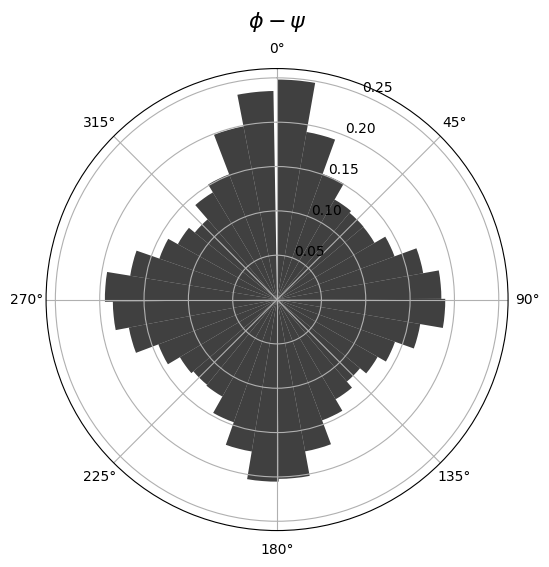

In [22]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 6))
ax.hist(np.deg2rad(angle_shifts), bins=36, density=True, alpha=0.75, color='black')
ax.set_title(r'$\phi - \psi$', va='bottom', fontsize=16)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
# fig.savefig('../data/figures/remapping_angle_differences_all_mice_LEC.pdf', dpi=300)

In [23]:

def compute_remapping_angle(mean1, mean2):
    n_bins = len(mean1)
    angles = np.arange(n_bins) * (2 * np.pi / n_bins)  # Angles corresponding to each bin
    correlations = []
    for shift in range(n_bins):
        # Circularly shift mean1
        shifted_mean1 = np.roll(mean1, shift)
        # Compute correlation
        correlation = np.corrcoef(shifted_mean1, mean2)[0, 1]
        correlations.append(correlation)
    # Find the shift that maximizes the correlation
    best_shift = np.argmax(correlations)
    best_angle = angles[best_shift]
    return best_shift

In [24]:
between_neurons_dic = {}
coherence_dic = {}


for mouse_recday in mouse_recdays:

    # if 'ah08' not in mouse_recday:
    #     continue
    
    between_neurons_dic[mouse_recday] = {}
    coherence_dic[mouse_recday] = {}

    # get neusons and sessions
    try:
        sig_neurons = sig_lec_neurons_dic[mouse_recday]
    except KeyError:
        print(f"No significant LEC neurons for {mouse_recday}, skipping.")
        continue
    # sig_neurons = sig_lec_neurons_dic[mouse_recday]
    valid_sessions = valid_sessions_dic[mouse_recday]
    print(mouse_recday)
    print(valid_sessions)
    
    # split sessions into days

    if len(valid_sessions)>=6:
        individual_days = {
            'day1': valid_sessions[:3],
            'day2': valid_sessions[3:6],
        }
    elif len(valid_sessions)<6 and len(valid_sessions)>3:
        individual_days = {
            'day1': valid_sessions[:3],
        }
    else:
        continue

    # start analysis

    for day in individual_days.keys():

        between_neurons_dic[mouse_recday][day] = {}
        coherence_dic[mouse_recday][day] = {}

        sessions = individual_days[day]
        session_x = sessions[0]

        session_ids = ['y', 'z']

        for session_y, session_id in zip(sessions[1:], session_ids):
            
            data_session_x = data_dic[mouse_recday][session_x]['Smoothed_norm']
            data_session_y = data_dic[mouse_recday][session_y]['Smoothed_norm']

            angle1_coherence_analysis = []
            angle2_coherence_analysis = []
            angle_shifts_cohrence_analysis = []

            for i, n1 in enumerate(sig_neurons[:-1]):
                for j, n2 in enumerate(sig_neurons[i+1:]):

                    mean1 = data_session_x[n1]
                    mean1 = mean1-np.mean(mean1)
                    mean2 = data_session_x[n2]
                    mean2 = mean2-np.mean(mean2)
                    angle1 = compute_remapping_angle(mean1, mean2)
                    angle1_coherence_analysis.append(angle1)


                    mean1 = data_session_y[n1]
                    mean1 = mean1-np.mean(mean1)
                    mean2 = data_session_y[n2]
                    mean2 = mean2-np.mean(mean2)   
                    angle2 = compute_remapping_angle(mean1, mean2)
                    angle2_coherence_analysis.append(angle2)

                    angle_diff = (angle1 - angle2) % 360

                    angle_shifts_cohrence_analysis.append(angle_diff)
           
            between_neurons_dic[mouse_recday][day][session_id] = {
                'angle2': angle2_coherence_analysis,
                'angle1': angle1_coherence_analysis,
                'angle_shift': angle_shifts_cohrence_analysis
            } 
    




ah08_20250613_20250615
[0, 1, 2, 4, 5, 6]
ah08_20250616_20250617
[0, 1, 2, 4, 5, 6]
ah08_20250618_20250619
[0, 1, 2, 4, 5, 6]
ah08_20250620_20250623
[0, 1, 2, 4, 5, 6]
ah08_20250624_20250625
[0, 2, 6, 7]
ah10_20250613_20250615
[0, 1, 2, 4, 5, 6]
ah10_20250616_20250617
[0, 1, 2, 4, 5, 6]
ah10_20250618_20250619
[0, 1, 2, 4, 5, 6]
ah10_20250620_20250623
[0, 1, 2, 4, 5, 6]
ah10_20250624_20250625
[0, 2, 3, 6, 7, 8]
ly05_20250613_20250615
[0, 1, 2, 4, 5, 6]
ly05_20250616_20250617
[0, 1, 2, 4, 5, 6]
No significant LEC neurons for ly05_20250618_20250619, skipping.
ly05_20250624_20250625
[0, 2, 6, 7]
ly06_20250613_20250615
[0, 1, 2, 4, 5, 6]
ly06_20250616_20250617
[0, 1, 2, 4, 5, 6]
ly06_20250618_20250619
[0, 1, 2, 4, 5, 6, 7]
ly06_20250620_20250623
[0, 1, 3, 4, 5, 6]
ly06_20250624_20250625
[0, 2, 3, 6, 7, 8]
ly07_20250613_20250615
[0, 1, 2, 4, 5, 6]
ly07_20250616_20250617
[0, 1, 2, 4, 5, 6]
ly07_20250618_20250619
[0, 1, 2, 4, 5, 6]
ly07_20250620_20250623
[0, 1, 2, 4, 5, 6]
ly07_20250624_202506

In [25]:
days_dic = {}
close_dic = {}
far_dic = {}
ii = 0

for mouse_recday in between_neurons_dic.keys():
    for day in between_neurons_dic[mouse_recday].keys():
        
        ii+=1
        days_dic[ii] = {}
        xy_coherent = []
        xz_coherent = []
        neuron_pairs_angle = []


        for session in between_neurons_dic[mouse_recday][day].keys():
            print(session)
            if session == 'y':
                xy_coherent.append(between_neurons_dic[mouse_recday][day][session]['angle_shift'])
            elif session == 'z':
                xz_coherent.append(between_neurons_dic[mouse_recday][day][session]['angle_shift'])

            angle_forward = between_neurons_dic[mouse_recday][day]['y']['angle1']
            angle_circular = [min(a, 360 - a) for a in angle_forward]

            neuron_pairs_angle.append(angle_circular)
        
        coherent_xy_bool = (np.array(xy_coherent[0])+45)%360 < 90
        coherent_xz_bool = (np.array(xz_coherent[0])+45)%360 < 90


        neuron_pairs_cat = np.array(neuron_pairs_angle)<45
        coherent_neurons = np.logical_and(coherent_xy_bool, coherent_xz_bool)

        close_neurons = coherent_neurons[neuron_pairs_cat[0,:]]
        far_neurons = coherent_neurons[~neuron_pairs_cat[0,:]]

        far_dic[ii]=[]
        mask = ~neuron_pairs_cat[0,:]
        far_dic[ii].append(np.array(xz_coherent[0])[mask])
        far_dic[ii].append(np.array(xy_coherent[0])[mask])

        close_dic[ii]=[]
        close_dic[ii].append(np.array(xz_coherent[0])[neuron_pairs_cat[0,:]])
        close_dic[ii].append(np.array(xy_coherent[0])[neuron_pairs_cat[0,:]])


        days_dic[ii]['close'] = close_neurons
        days_dic[ii]['far'] = far_neurons

close_all = []
far_all = []
for ii in days_dic.keys():
    if len(days_dic[ii]['close']) > 0:
        close_all.append(sum(days_dic[ii]['close'])/len(days_dic[ii]['close']))
    if len(days_dic[ii]['far']) > 0:
        far_all.append(sum(days_dic[ii]['far'])/len(days_dic[ii]['far']))

     


y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z
y
z


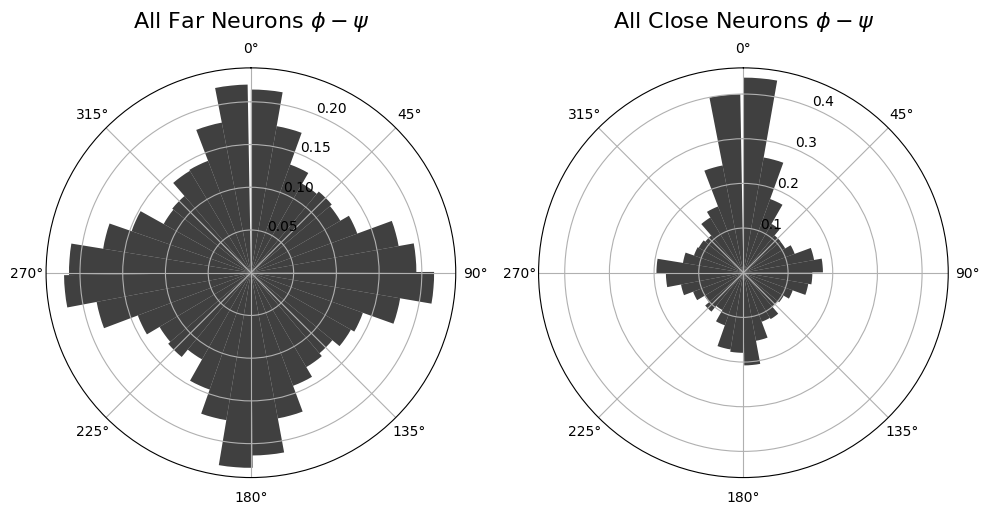

In [26]:
all_far_data = []
all_close_data = []

for day in far_dic.keys():
    all_far_data.extend(np.concatenate(far_dic[day]))
    all_close_data.extend(np.concatenate(close_dic[day]))

fig, ax = plt.subplots(nrows=1, ncols=2, subplot_kw={'projection': 'polar'}, figsize=(10, 6))

# Plot for all aggregated "far" neurons
ax[0].hist(np.deg2rad(all_far_data), bins=36, density=True, alpha=0.75, color='black')
ax[0].set_title(r'All Far Neurons $\phi - \psi$', va='bottom', fontsize=16)
ax[0].set_theta_zero_location("N")
ax[0].set_theta_direction(-1)

# Plot for all aggregated "close" neurons
ax[1].hist(np.deg2rad(all_close_data), bins=36, density=True, alpha=0.75, color='black')
ax[1].set_title(r'All Close Neurons $\phi - \psi$', va='bottom', fontsize=16)
ax[1].set_theta_zero_location("N")
ax[1].set_theta_direction(-1)

plt.tight_layout()
# fig.savefig('../data/figures/remapping_angle_coherence_far_close_all_LEC.pdf', dpi=300)
plt.show()

Close neurons: t-statistic = 4.614, p-value = 0.000
Far neurons: t-statistic = 2.034, p-value = 0.048


/tmp/ipykernel_1086625/2611840024.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_1086625/2611840024.py:9: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': 'black'}` instead.

  sns.barplot(
/tmp/ipykernel_1086625/2611840024.py:9: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.5}` instead.

  sns.barplot(


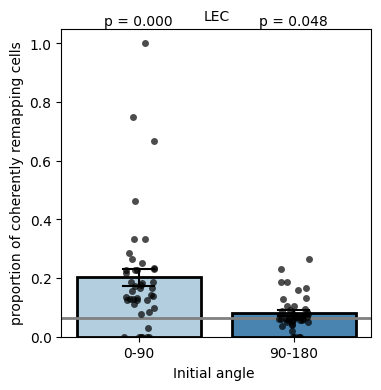

In [27]:
from scipy.stats import ttest_1samp

analysis_coherent_pairs_dic = {
    'proportion': close_all + far_all,
    'group': ['0-90']*len(close_all) + ['90-180']*len(far_all)
}

fig, ax = plt.subplots(figsize=(4, 4))
sns.barplot(
    data=analysis_coherent_pairs_dic,
    x='group',
    y='proportion',
    errorbar='se',       # or ci=95, etc.
    capsize=0.2,   # adds a little cap on the error bars
    errcolor='black',
    errwidth=1.5, 
    linewidth=2,
    palette='Blues', 
    edgecolor="black"
)

# Overlay individual data points:
# 1) stripplot - jittered
sns.stripplot(
    data=analysis_coherent_pairs_dic,
    x='group',
    y='proportion',
    color='black',     # set color for the data points
    alpha=0.7,         # slightly transparent for visibility
    jitter=True        # add jitter so points don’t overlap
)

# 2) t-test against chance (1/16)

# Perform t-test for each group
t_stat_close, p_val_close = ttest_1samp(close_all, 1/16)
t_stat_far, p_val_far = ttest_1samp(far_all, 1/16)

print (f"Close neurons: t-statistic = {t_stat_close:.3f}, p-value = {p_val_close:.3f}")
print (f"Far neurons: t-statistic = {t_stat_far:.3f}, p-value = {p_val_far:.3f}")

# Add p-values to the plot
y_max = max(close_all + far_all)
ax.text(0, y_max + 0.05, f'p = {p_val_close:.3f}', ha='center', va='bottom', color='black')
ax.text(1, y_max + 0.05, f'p = {p_val_far:.3f}', ha='center', va='bottom', color='black')

# Final plot adjustments
plt.ylim(bottom=0)
plt.xlabel('Initial angle ', fontsize=10)
plt.ylabel('proportion of coherently remapping cells', fontsize=10)
plt.title('LEC', fontsize=10)
plt.axhline(1/16, color='grey', linestyle='-', linewidth=2, label='$x=1/16$')
# fig.savefig('../data/figures/remapping_coherence_proportion_LEC.pdf', dpi=300)



In [28]:
remapping_angles = []

for mouse_recday in mouse_recdays:
    print(f'Processing {mouse_recday}')
    for i, session1 in enumerate(list(data_dic[mouse_recday].keys())[:-1]):
        if not isinstance(session1, str):
            try:
                
                Task1 = data_dic[mouse_recday][session1]['Task']
                print(f'Processing session {session1} with task {Task1}')
            except Exception as e:
                print(f'Error processing session {session1}: {e}')
                continue
            if data_dic[mouse_recday][session1]['num_trials'] < 2:
                print('not enough trials for task 1, skipping')
                continue
            if 'defaultdict' in str(Task1):
                print('no task for task 1, skipping)')
                continue
            for j, session2 in enumerate(list(data_dic[mouse_recday].keys())[i+1:]):
                if not isinstance(session2, str):
                    try:
                        Task2 = data_dic[mouse_recday][session2]['Task']
                        if data_dic[mouse_recday][session2]['num_trials'] < 2:
                            print('not enough trials for task 2, skipping')
                            continue
                        if 'defaultdict' in str(Task2):
                            print('no task for task 2, skipping)')
                            continue
                        if not np.array_equal(Task1, Task2):
                            print('valid task pair, proceeding')
                            mean1 = data_dic[mouse_recday][session1]['Smoothed_norm']
                            mean2 = data_dic[mouse_recday][session2]['Smoothed_norm']

                            # Normalize the mean firing rates (subtract the mean)
                            if np.array_equal(mean1.shape, mean2.shape):
                                print('neuron arrays compatible, computing remapping angle')
                                for neuron in sig_lec_neurons_dic[mouse_recday]:
                                    mean1x = mean1[neuron] - np.mean(mean1[neuron])
                                    mean2x = mean2[neuron] - np.mean(mean2[neuron])
                                    # Compute the remapping angle
                                    angle = compute_remapping_angle(mean1x, mean2x)
                                remapping_angles.append(angle)
                    except Exception as e:
                        print(f'Error processing session {session2}: {e}')
                        continue





Processing ah08_20250613_20250615
Processing session 0 with task [3 2 7 1]
valid task pair, proceeding
neuron arrays compatible, computing remapping angle
valid task pair, proceeding
neuron arrays compatible, computing remapping angle
valid task pair, proceeding
neuron arrays compatible, computing remapping angle
valid task pair, proceeding
neuron arrays compatible, computing remapping angle
valid task pair, proceeding
neuron arrays compatible, computing remapping angle
not enough trials for task 2, skipping
Processing session 1 with task [3 4 6 7]
valid task pair, proceeding
neuron arrays compatible, computing remapping angle
valid task pair, proceeding
neuron arrays compatible, computing remapping angle
valid task pair, proceeding
neuron arrays compatible, computing remapping angle
valid task pair, proceeding
neuron arrays compatible, computing remapping angle
valid task pair, proceeding
neuron arrays compatible, computing remapping angle
not enough trials for task 2, skipping
Proces

In [ ]:
remapping_angles = []

for mouse_recday in mouse_recdays:
    print(f'Processing {mouse_recday}')
    for i, session1 in enumerate(list(data_dic[mouse_recday].keys())[:-1]):
        if not isinstance(session1, str):
            try:
                
                Task1 = data_dic[mouse_recday][session1]['Task']
                print(f'Processing session {session1} with task {Task1}')
            except Exception as e:
                print(f'Error processing session {session1}: {e}')
                continue
            if data_dic[mouse_recday][session1]['num_trials'] < 2:
                print('not enough trials for task 1, skipping')
                continue
            if 'defaultdict' in str(Task1):
                print('no task for task 1, skipping)')
                continue
            for j, session2 in enumerate(list(data_dic[mouse_recday].keys())[i+1:]):
                if not isinstance(session2, str):
                    try:
                        Task2 = data_dic[mouse_recday][session2]['Task']
                        if data_dic[mouse_recday][session2]['num_trials'] < 2:
                            print('not enough trials for task 2, skipping')
                            continue
                        if 'defaultdict' in str(Task2):
                            print('no task for task 2, skipping)')
                            continue
                        if not np.array_equal(Task1, Task2):
                            print('valid task pair, proceeding')
                            mean1 = data_dic[mouse_recday][session1]['Smoothed_norm']
                            mean2 = data_dic[mouse_recday][session2]['Smoothed_norm']

                            # Normalize the mean firing rates (subtract the mean)
                            if np.array_equal(mean1.shape, mean2.shape):
                                print('neuron arrays compatible, computing remapping angle')
                                for neuron in sig_lec_neurons_dic[mouse_recday]:
                                    mean1x = mean1[neuron] - np.mean(mean1[neuron])
                                    mean2x = mean2[neuron] - np.mean(mean2[neuron])
                                    # Compute the remapping angle
                                    angle = compute_remapping_angle(mean1x, mean2x)
                                remapping_angles.append(angle)
                    except Exception as e:
                        print(f'Error processing session {session2}: {e}')
                        continue





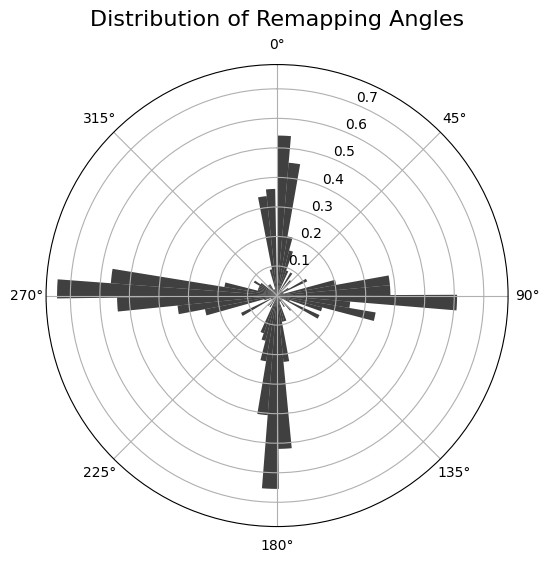

In [51]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 6))
ax.hist(np.deg2rad(remapping_angles), bins=72, density=True, alpha=0.75, color='black')
ax.set_title("Distribution of Remapping Angles", va='bottom', fontsize=16)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
plt.show()

Processing ah08_20250613_20250615
Valid task pair: session 0 vs 1
Neuron arrays compatible, computing remapping angle
Valid task pair: session 0 vs 2
Neuron arrays compatible, computing remapping angle
Valid task pair: session 1 vs 2
Neuron arrays compatible, computing remapping angle
Valid task pair: session 4 vs 5
Neuron arrays compatible, computing remapping angle
Valid task pair: session 4 vs 6
Neuron arrays compatible, computing remapping angle
Valid task pair: session 5 vs 6
Neuron arrays compatible, computing remapping angle
Processing ah08_20250616_20250617
Valid task pair: session 0 vs 1
Neuron arrays compatible, computing remapping angle
Valid task pair: session 0 vs 2
Neuron arrays compatible, computing remapping angle
Valid task pair: session 1 vs 2
Neuron arrays compatible, computing remapping angle
Valid task pair: session 4 vs 5
Neuron arrays compatible, computing remapping angle
Valid task pair: session 4 vs 6
Neuron arrays compatible, computing remapping angle
Valid ta

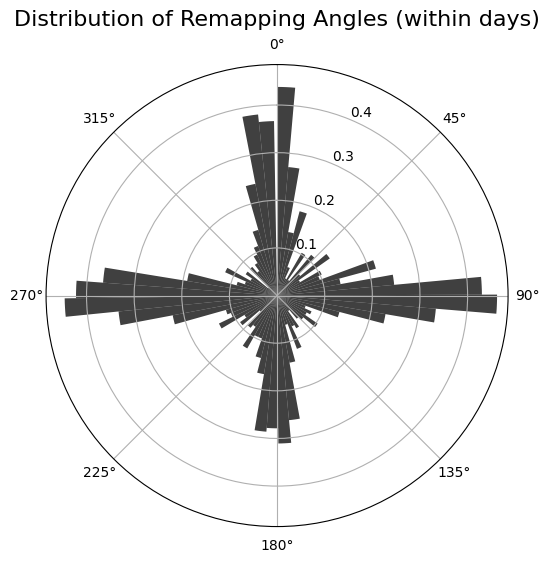

In [29]:
remapping_angles = []

def compute_remapping_angle(mean1, mean2):
    n_bins = len(mean1)
    angles = np.arange(n_bins) * (2 * np.pi / n_bins)  # Angles corresponding to each bin
    correlations = []
    for shift in range(n_bins):
        # Circularly shift mean1
        shifted_mean1 = np.roll(mean1, shift)
        # Compute correlation
        correlation = np.corrcoef(shifted_mean1, mean2)[0, 1]
        correlations.append(correlation)
    # Find the shift that maximizes the correlation
    best_shift = np.argmax(correlations)
    best_angle = angles[best_shift]
    return best_shift

for mouse_recday in mouse_recdays:
    print(f'Processing {mouse_recday}')
    
    if 'ah08' not in mouse_recday:
        continue
    if mouse_recday not in valid_sessions_dic or mouse_recday not in sig_lec_neurons_dic:
        print(f"Missing data for {mouse_recday}, skipping.")
        continue
        
    valid_sessions = valid_sessions_dic[mouse_recday]
    sig_lec_neurons = sig_lec_neurons_dic[mouse_recday]

    # Define days based on session indices
    day1_sessions = valid_sessions[:3]
    day2_sessions = valid_sessions[3:6] # Taking next 3 as day 2
    
    days = [day1_sessions, day2_sessions]

    for day_sessions in days:
        if len(day_sessions) < 2:
            continue # Need at least two sessions to compare

        # Iterate over pairs of sessions within the same day
        for i, session1 in enumerate(day_sessions[:-1]):
            for session2 in day_sessions[i+1:]:
                try:
                    # --- Check Session 1 ---
                    if data_dic[mouse_recday][session1]['num_trials'] < 2:
                        continue
                    Task1 = data_dic[mouse_recday][session1]['Task']
                    if 'defaultdict' in str(Task1):
                        continue

                    # --- Check Session 2 ---
                    if data_dic[mouse_recday][session2]['num_trials'] < 2:
                        continue
                    Task2 = data_dic[mouse_recday][session2]['Task']
                    if 'defaultdict' in str(Task2):
                        continue

                    # --- Compare Tasks ---
                    if not np.array_equal(Task1, Task2):
                        print(f'Valid task pair: session {session1} vs {session2}')
                        mean1 = data_dic[mouse_recday][session1]['Smoothed_norm']
                        mean2 = data_dic[mouse_recday][session2]['Smoothed_norm']

                        if np.array_equal(mean1.shape, mean2.shape):
                            print('Neuron arrays compatible, computing remapping angle')
                            for neuron in sig_lec_neurons:
                                mean1x = mean1[neuron] - np.mean(mean1[neuron])
                                mean2x = mean2[neuron] - np.mean(mean2[neuron])
                                angle = compute_remapping_angle(mean1x, mean2x)
                                remapping_angles.append(angle)
                except Exception as e:
                    print(f'Error processing session pair ({session1}, {session2}): {e}')
                    continue

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 6))
ax.hist(np.deg2rad(remapping_angles), bins=72, density=True, alpha=0.75, color='black')
ax.set_title("Distribution of Remapping Angles (within days)", va='bottom', fontsize=16)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
plt.show()

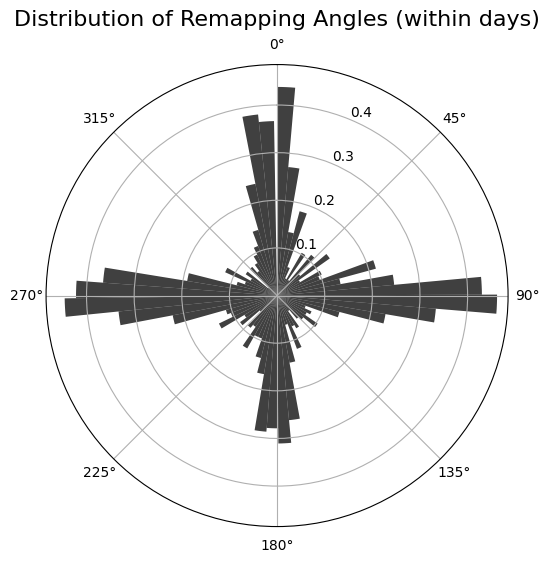

In [ ]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 6))
ax.hist(np.deg2rad(remapping_angles), bins=72, density=True, alpha=0.75, color='black')
ax.set_title("Distribution of Remapping Angles (within days)", va='bottom', fontsize=16)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
# fig.savefig('../data/figures/remapping_angles_within_days_LEC.pdf', dpi=300)

plt.show()

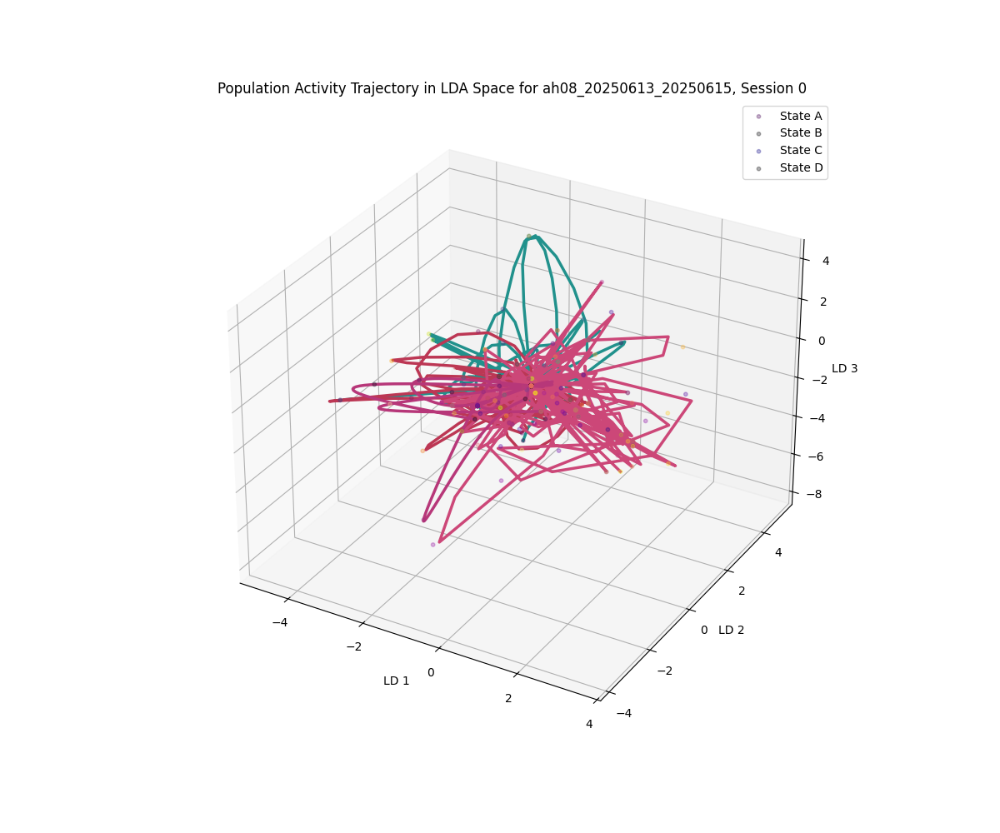

In [40]:
%matplotlib widget

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import make_interp_spline
from scipy.ndimage import gaussian_filter1d

# --- 1. Configuration ---
# Using the same data as the PCA example
mouse_recday = mouse_recdays[0]
if mouse_recday not in valid_sessions_dic or not valid_sessions_dic[mouse_recday]:
    print(f"No valid sessions for {mouse_recday}")
else:
    session_idx = valid_sessions_dic[mouse_recday][0]

    if mouse_recday not in sig_lec_neurons_dic or not sig_lec_neurons_dic[mouse_recday]:
        print(f"No significant LEC neurons for {mouse_recday}")
    else:
        sig_lec_neurons = sig_lec_neurons_dic[mouse_recday]

        # --- 2. Data Preparation (same as PCA cell) ---
        neuron_data = data_dic[mouse_recday][session_idx]['Neuron_raw'][sig_lec_neurons, :]
        
        trial_times = data_dic[mouse_recday][session_idx]['Trial_times']
        
        X = neuron_data.T
        state_labels = np.full(X.shape[0], 'None', dtype=object)
        state_map = {0: 'A', 1: 'B', 2: 'C', 3: 'D'}
        time_scaling_factor = 25

        for trial in trial_times:
            trial_bins = (trial / time_scaling_factor).astype(int)
            for i in range(4):
                start, end = trial_bins[i], trial_bins[i+1]
                if end > len(state_labels): end = len(state_labels)
                state_labels[start:end] = state_map[i]

        valid_indices = state_labels != 'None'
        X_filtered = X[valid_indices]
        labels_filtered = state_labels[valid_indices]

        # --- Downsample Data ---
        downsample_factor = 5  # Keep one in every 5 data points
        X_filtered = X_filtered[::downsample_factor]
        labels_filtered = labels_filtered[::downsample_factor]


        # --- 3. LDA and Projection ---
        # Scale data before LDA
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X_filtered)

        # Fit LDA. n_components is at most n_classes - 1
        lda = LinearDiscriminantAnalysis(n_components=3)
        X_projected = lda.fit_transform(X_scaled, labels_filtered)

        # --- 4. Visualization with Time-Colored Splines ---
        fig = plt.figure(figsize=(12, 10))
        ax = fig.add_subplot(111, projection='3d')

        # Define a different colormap for each state
        cmap_map = {'A': 'viridis', 'B': 'inferno', 'C': 'plasma', 'D': 'magma'}

        for state in np.unique(labels_filtered):
            state_indices = labels_filtered == state
            X_state = X_projected[state_indices]
            
            # Create a time vector for coloring points within this state
            time_in_state = np.arange(X_state.shape[0])

            # Plot the individual time points
            ax.scatter(X_state[:, 0], X_state[:, 1], X_state[:, 2], 
                       c=time_in_state, cmap=cmap_map[state], 
                       label=f'State {state}', alpha=0.3, s=10)

            # Fit a spline to show the trajectory over time
            if len(time_in_state) > 3: # Need enough points for a spline
                # Sort points by time just in case, though they should be ordered
                order = np.argsort(time_in_state)
                t = time_in_state[order]
                points = X_state[order]
                
                # Create a smooth spline
                t_smooth = np.linspace(t.min(), t.max(), 300)
                spline_x = make_interp_spline(t, points[:, 0], k=3)(t_smooth)
                spline_y = make_interp_spline(t, points[:, 1], k=3)(t_smooth)
                spline_z = make_interp_spline(t, points[:, 2], k=3)(t_smooth)
                
                # Plot the smoothed trajectory, also colored by time
                ax.plot(spline_x, spline_y, spline_z, color=plt.get_cmap(cmap_map[state])(0.5), lw=2.5)


        ax.set_title(f'Population Activity Trajectory in LDA Space for {mouse_recday}, Session {session_idx}')
        ax.set_xlabel('LD 1')
        ax.set_ylabel('LD 2')
        ax.set_zlabel('LD 3')
        ax.legend()
        plt.show()


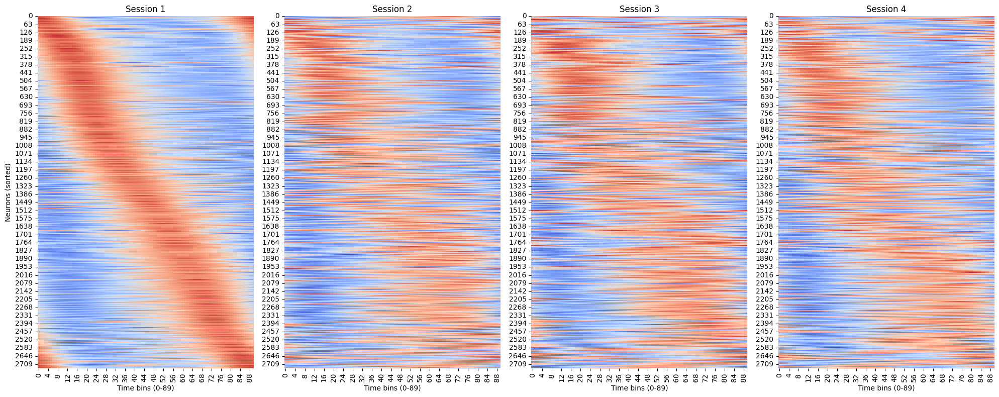

In [73]:
def get_sessions_for_glm(recday_data):
    # Filter sessions with more than two trials
    valid_sessions = {k: v for k, v in recday_data.items() if v['num_trials'] > 2}
    
    # Sort sessions by number of trials in descending order
    sorted_sessions = sorted(valid_sessions.items(), key=lambda x: x[1]['num_trials'], reverse=True)
    
    # Track unique tasks and corresponding sessions
    unique_tasks = {}
    for session, data in sorted_sessions:
        task = str(data['Task'])  # Convert numpy.ndarray to string
        if task not in unique_tasks:
            unique_tasks[task] = session
    
    # Extract session numbers and tasks
    session_numbers = list(unique_tasks.values())
    tasks = list(unique_tasks.keys())
    
    return session_numbers, tasks

# =============================================================================
# STEP 1: Process the data per recday and session
# =============================================================================

# We'll store the processed (averaged) data for each session across recdays.
# Keys are the session numbers (1-4) and the values will be lists of arrays.
session_data = {1: [], 2: [], 3: [], 4: []}

# Loop over each recday in the data dictionary.
for recday in data_dic:
    # For robustness, we sort the sessions and take the first four.
    # (If the sessions are stored as integers, sorting works directly.)
    recday_sessions, _ = get_sessions_for_glm(data_dic[recday])

    # Process only the first four sessions for each recday
    for j, session in enumerate(recday_sessions[:4]):
 
        # Retrieve the smoothed normalized firing rate array.
        # Expected shape: (n_neurons, 360)
        smoothed_norm = data_dic[recday][session]['Smoothed_norm']
        
        # Sanity check: Ensure that the time dimension is 360
        if smoothed_norm.shape[1] != 360:
            raise ValueError(f"Expected 360 time bins, got {smoothed_norm.shape[1]} for recday {recday}, session {session}")
        
        # Reshape into (n_neurons, 4 states, 90 time bins per state)
        # This groups together the corresponding time bins of each state.
        n_neurons = smoothed_norm.shape[0]
        reshaped = smoothed_norm.reshape(n_neurons, 4, 90)
        
        # Average across the four task states (axis=1) to obtain an array of shape (n_neurons, 90)
        avg_norm = np.mean(reshaped, axis=1)
        # try:
        #     avg_norm = avg_norm[sig_lec_neurons_dic[recday], :]  # Keep only significant LEC neurons
        # except KeyError:
        #     print(f"No significant LEC neurons found for recday {recday}")
        #     continue

        # Append the processed array for this recday and session
        session_data[j+1].append(avg_norm)
    

# =============================================================================
# STEP 2: Combine data across recdays for each session
# =============================================================================

# For each session (1-4), vertically stack the arrays from all recdays.
# This yields an array of shape (total_neurons_across_recday, 90)
session_arrays = {}
for session in session_data:
    if session_data[session]:
        session_arrays[session] = np.vstack(session_data[session])
    else:
        raise ValueError(f"No data available for session {session}")

# =============================================================================
# STEP 3: Z-score session 1 and sort neurons by their peak firing time
# =============================================================================

# Z-score each neuron's activity across the 90 time bins (axis=1) for session 1.
# This ensures that differences in baseline firing rate across neurons are removed.
session1_z = zscore(session_arrays[1], axis=1)

# For each neuron, find the time bin (0-89) at which its firing rate is maximal.
peak_indices = np.argmax(session1_z, axis=1)

# Sort the neurons by their peak indices.
sort_order = np.argsort(peak_indices)

# Apply the sort order to the z-scored session 1 data.
session1_sorted = session1_z[sort_order, :]

# =============================================================================
# STEP 4: Process sessions 2, 3, and 4 using the same sorting order
# =============================================================================

# Z-score sessions 2, 3, and 4 along each neuron's time axis.
session2_z = zscore(session_arrays[2], axis=1)
session3_z = zscore(session_arrays[3], axis=1)
session4_z = zscore(session_arrays[4], axis=1)

# Apply the sorting order determined from session 1.
session2_sorted = session2_z[sort_order, :]
session3_sorted = session3_z[sort_order, :]
session4_sorted = session4_z[sort_order, :]

# =============================================================================
# STEP 5: Plot the results using seaborn heatmap
# =============================================================================

# Create a 1x4 subplot figure for the four sessions.
fig, axs = plt.subplots(1, 4, figsize=(20, 8))

# Plot Session 1 heatmap
sns.heatmap(session1_sorted, ax=axs[0], cmap='coolwarm', cbar=False)
axs[0].set_title('Session 1')
axs[0].set_xlabel('Time bins (0-89)')
axs[0].set_ylabel('Neurons (sorted)')

# Plot Session 2 heatmap
sns.heatmap(session2_sorted, ax=axs[1], cmap='coolwarm', cbar=False)
axs[1].set_title('Session 2')
axs[1].set_xlabel('Time bins (0-89)')
axs[1].set_ylabel('')  # Remove redundant ylabel for cleaner appearance

# Plot Session 3 heatmap
sns.heatmap(session3_sorted, ax=axs[2], cmap='coolwarm', cbar=False)
axs[2].set_title('Session 3')
axs[2].set_xlabel('Time bins (0-89)')
axs[2].set_ylabel('')

# Plot Session 4 heatmap
sns.heatmap(session4_sorted, ax=axs[3], cmap='coolwarm', cbar=False)
axs[3].set_title('Session 4')
axs[3].set_xlabel('Time bins (0-89)')
axs[3].set_ylabel('')

plt.tight_layout()
fig.savefig('../data/figures/LEC_goal-progression_heatmaps.png', dpi=300)
plt.show()


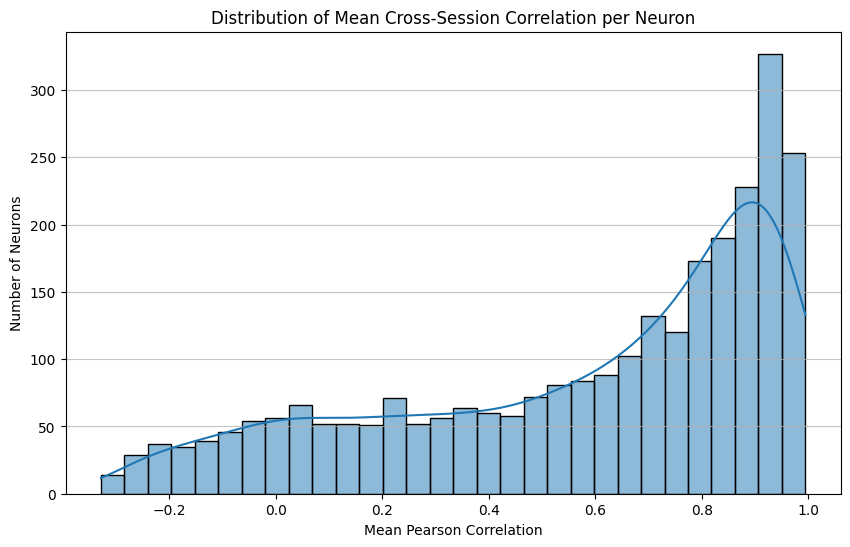

In [42]:
# =============================================================================
# STEP 6: Compute and plot the mean correlation for each neuron across sessions
# =============================================================================

# Combine the sorted session data into a single list for easier iteration
sorted_sessions = [session1_sorted, session2_sorted, session3_sorted, session4_sorted]
n_neurons = session1_sorted.shape[0]
n_sessions = len(sorted_sessions)

# List to store the mean correlation for each neuron
mean_correlations = []

# Loop over each neuron
for i in range(n_neurons):
    neuron_correlations = []
    # Calculate correlation between all pairs of sessions for the current neuron
    for j1 in range(n_sessions):
        for j2 in range(j1 + 1, n_sessions):
            # Get the activity vectors for neuron i for two different sessions
            vec1 = sorted_sessions[j1][i, :]
            vec2 = sorted_sessions[j2][i, :]
            
            # Compute Pearson correlation and add to the list
            corr = np.corrcoef(vec1, vec2)[0, 1]
            neuron_correlations.append(corr)
    
    # Calculate the mean of the pairwise correlations for this neuron
    mean_correlations.append(np.mean(neuron_correlations))

# Plot the histogram of mean correlations
plt.figure(figsize=(10, 6))
sns.histplot(mean_correlations, bins=30, kde=True)
plt.title('Distribution of Mean Cross-Session Correlation per Neuron')
plt.xlabel('Mean Pearson Correlation')
plt.ylabel('Number of Neurons')
plt.grid(axis='y', alpha=0.75)
plt.show()


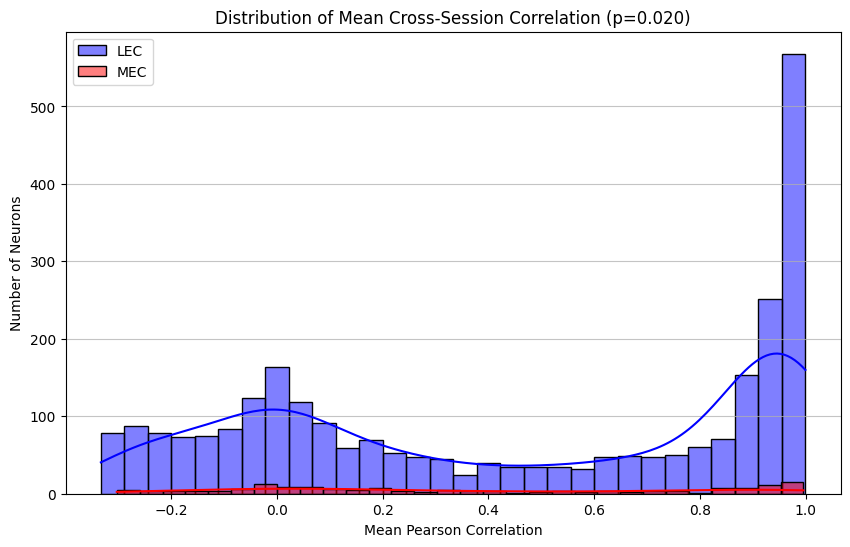

In [60]:
from scipy.stats import mannwhitneyu

# =============================================================================
# STEP 6: Compute and plot the mean correlation for each neuron across sessions
# =============================================================================

# Combine the sorted session data into a single list for easier iteration
sorted_sessions = [session1_sorted, session2_sorted, session3_sorted, session4_sorted]
n_neurons = session1_sorted.shape[0]
n_sessions = len(sorted_sessions)

# List to store the mean correlation for each neuron
mean_correlations = []
# Define the start and end of the slice to keep the middle half
n_bins = sorted_sessions[0].shape[1]
start_bin = n_bins // 3
end_bin = n_bins - (n_bins // 3)

# Loop over each neuron
for i in range(n_neurons):
    neuron_correlations = []
    # Calculate correlation between all pairs of sessions for the current neuron
    for j1 in range(n_sessions):
        for j2 in range(j1 + 1, n_sessions):
            # Get the activity vectors for neuron i for two different sessions and slice them
            vec1 = sorted_sessions[j1][i, start_bin:end_bin]
            vec2 = sorted_sessions[j2][i, start_bin:end_bin]
            
            # Compute Pearson correlation and add to the list
            corr = np.corrcoef(vec1, vec2)[0, 1]
            neuron_correlations.append(corr)
    
    # Calculate the mean of the pairwise correlations for this neuron
    mean_correlations.append(np.mean(neuron_correlations))

# Load the MEC correlations
mec_correlations = np.load('/ceph/behrens/adam_harris/Taskspace_abstraction_lEC/mean_cross_session_correlations_mec_trimmed.npy')

# Perform Mann-Whitney U test
statistic, p_value = mannwhitneyu(mean_correlations, mec_correlations)

# Plot the histogram of mean correlations
plt.figure(figsize=(10, 6))
sns.histplot(mean_correlations, bins=30, kde=True, color='blue', label='LEC')
sns.histplot(mec_correlations, bins=30, kde=True, color='red', label='MEC')
plt.title(f'Distribution of Mean Cross-Session Correlation (p={p_value:.3f})')
plt.xlabel('Mean Pearson Correlation')
plt.ylabel('Number of Neurons')
plt.grid(axis='y', alpha=0.75)
plt.legend()
plt.show()

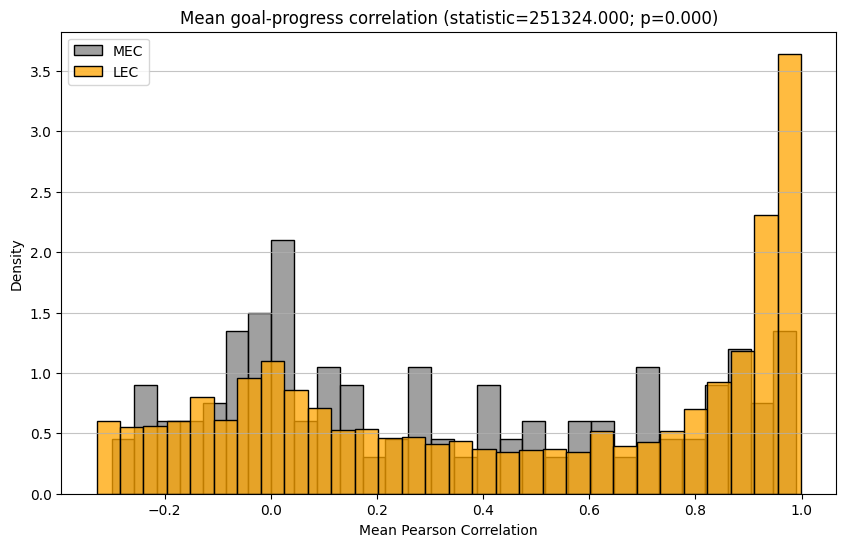

In [71]:
from scipy.stats import mannwhitneyu

# =============================================================================
# STEP 6: Compute and plot the mean correlation for each neuron across sessions
# =============================================================================

# Combine the sorted session data into a single list for easier iteration
sorted_sessions = [session1_sorted, session2_sorted, session3_sorted, session4_sorted]
n_neurons = session1_sorted.shape[0]
n_sessions = len(sorted_sessions)

# List to store the mean correlation for each neuron
mean_correlations = []
# Define the start and end of the slice to keep the middle half
n_bins = sorted_sessions[0].shape[1]
start_bin = n_bins // 3
end_bin = n_bins - (n_bins // 4)

# Loop over each neuron
for i in range(n_neurons):
    neuron_correlations = []
    # Calculate correlation between all pairs of sessions for the current neuron
    for j1 in range(n_sessions):
        for j2 in range(j1 + 1, n_sessions):
            # Get the activity vectors for neuron i for two different sessions and slice them
            vec1 = sorted_sessions[j1][i, start_bin:end_bin]
            vec2 = sorted_sessions[j2][i, start_bin:end_bin]
            
            # Compute Pearson correlation and add to the list
            corr = np.corrcoef(vec1, vec2)[0, 1]
            neuron_correlations.append(corr)
    
    # Calculate the mean of the pairwise correlations for this neuron
    mean_correlations.append(np.mean(neuron_correlations))

# Load the MEC correlations
mec_correlations = np.load('/ceph/behrens/adam_harris/Taskspace_abstraction_lEC/mean_cross_session_correlations_mec_trimmed.npy')

# Perform Mann-Whitney U test
statistic, p_value = mannwhitneyu(mean_correlations, mec_correlations)

# Plot the histogram of mean correlations
fig, ax = plt.subplots(figsize=(10, 6))
sns.histplot(mec_correlations, bins=30, kde=False, color='gray', label='MEC', stat='density', ax=ax)
sns.histplot(mean_correlations, bins=30, kde=False, color='orange', label='LEC', stat='density', ax=ax)
ax.set_title(f'Mean goal-progress correlation (statistic={statistic:.3f}; p={p_value:.3f})')
ax.set_xlabel('Mean Pearson Correlation')
ax.set_ylabel('Density')
ax.grid(axis='y', alpha=0.75)
ax.legend()
fig.savefig('/ceph/behrens/adam_harris/Taskspace_abstraction_lEC/data/figures/mean_goal_progress_correlation_lec_vs_mec.pdf', dpi=300)
plt.show()

In [67]:
p_value

np.float64(0.00012731058401227569)

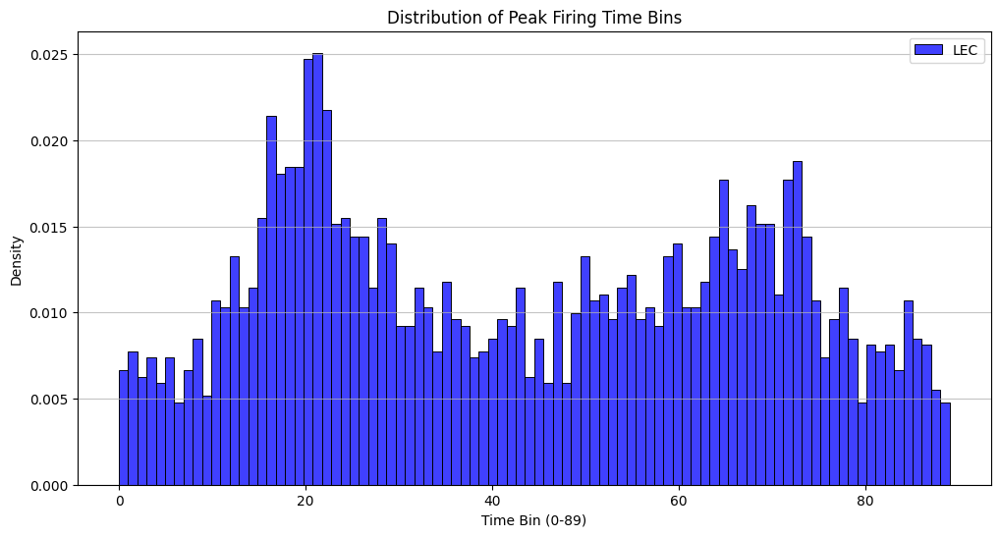

In [ ]:
# Average the sorted session data across all four sessions
all_sessions_sorted = np.stack(sorted_sessions)
mean_activity_across_sessions = np.mean(all_sessions_sorted, axis=0)

# Find the peak firing time for each neuron in the averaged data
peak_indices_mean = np.argmax(mean_activity_across_sessions, axis=1)

# Plot the distribution of these peak indices
plt.figure(figsize=(10, 6))
sns.histplot(peak_indices_mean, bins=90, kde=False)
plt.title('Distribution of Peak Firing Times in Averaged Session Data')
plt.xlabel('Time Bins (0-89)')
plt.ylabel('Number of Neurons')
plt.grid(axis='y', alpha=0.75)
plt.show()

# Also plot the heatmap of the averaged data
plt.figure(figsize=(8, 6))
sns.heatmap(mean_activity_across_sessions, cmap='coolwarm', cbar=True)
plt.title('Heatmap of Averaged Activity Across Sessions')
plt.xlabel('Time bins (0-89)')
plt.ylabel('Neurons (sorted by Session 1 peak)')
plt.show()

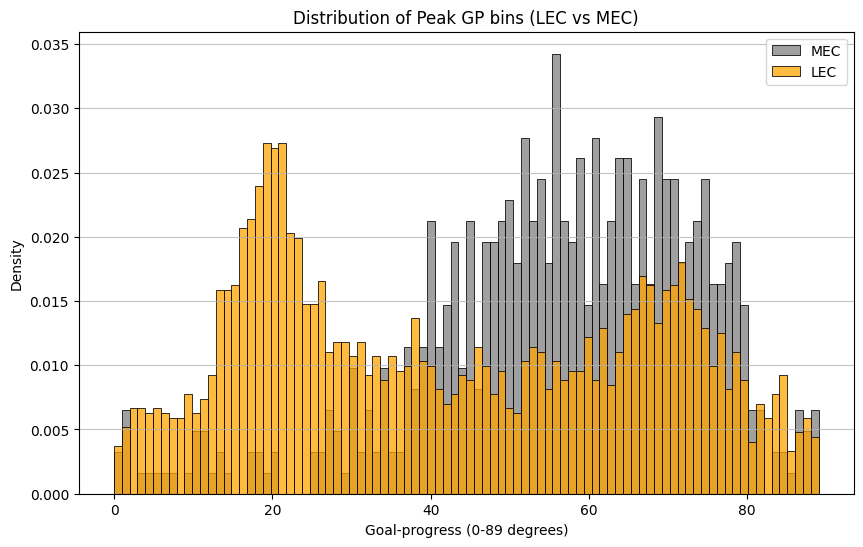

In [70]:
# Average the sorted session data across all four sessions
all_sessions_sorted = np.stack(sorted_sessions)
mean_activity_across_sessions = np.mean(all_sessions_sorted, axis=0)

# Find the peak firing time for each neuron in the averaged data
peak_indices_mean = np.argmax(mean_activity_across_sessions, axis=1)

# Load the MEC peak indices
mec_peak_indices = np.load('/ceph/behrens/adam_harris/Taskspace_abstraction_lEC/all_peak_indices_mec.npy')

# Plot the distribution of these peak indices for both LEC and MEC
fig, ax = plt.subplots(figsize=(10, 6))
sns.histplot(mec_peak_indices, bins=90, kde=False, color='gray', label='MEC', stat='density', ax=ax)
sns.histplot(peak_indices_mean, bins=90, kde=False, color='orange', label='LEC', stat='density', ax=ax)

ax.set_title('Distribution of Peak GP bins (LEC vs MEC)')
ax.set_xlabel('Goal-progress (0-89 degrees)')
ax.set_ylabel('Density')
ax.legend()
ax.grid(axis='y', alpha=0.75)
fig.savefig('/ceph/behrens/adam_harris/Taskspace_abstraction_lEC/data/figures/peak_goal_progress_bins_lec_vs_mec.pdf', dpi=300)
plt.show()

Recday ah08_20250616_20250617 has fewer than 6 sessions after filtering, skipping.
Recday ly06_20250620_20250623 has fewer than 6 sessions after filtering, skipping.


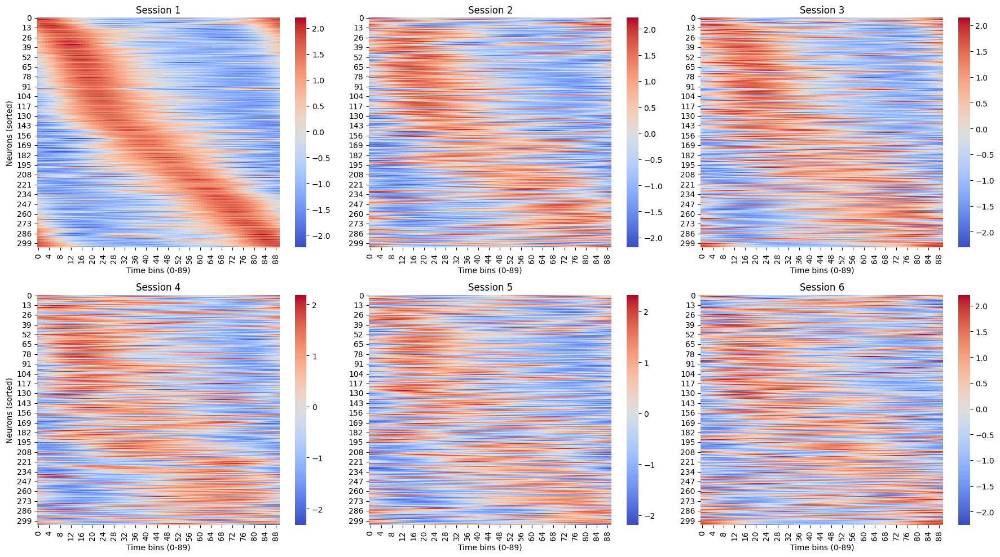

In [44]:
from scipy.stats import zscore
import seaborn as sns

# Find recdays with at least 6 valid sessions
recdays_with_6_tasks = [recday for recday, sessions in valid_sessions_dic.items() if len(sessions) >= 6]

# We'll store the processed (averaged) data for each session across recdays.
session_data = {i: [] for i in range(1, 7)}

# Loop over each recday that has at least 6 tasks.
for recday in recdays_with_6_tasks:
    # Get the sessions for the current recday
    recday_sessions, _ = get_sessions_for_glm(data_dic[recday])

    # Ensure we have significant neurons for this recday and the list is not empty
    if recday not in sig_lec_neurons_dic or not sig_lec_neurons_dic[recday]:
        print(f"No significant LEC neurons found for recday {recday}, skipping.")
        continue
    sig_neurons = np.array(sig_lec_neurons_dic[recday])

    # We need exactly 6 sessions to proceed for consistent array shapes later
    if len(recday_sessions) < 6:
        print(f"Recday {recday} has fewer than 6 sessions after filtering, skipping.")
        continue

    # Process the 6 sessions for each recday
    recday_session_data = []
    valid_recday = True
    for j, session in enumerate(recday_sessions[:6]):
        # Retrieve the smoothed normalized firing rate array.
        smoothed_norm = data_dic[recday][session]['Smoothed_norm']
        
        # Sanity check
        if smoothed_norm.shape[1] != 360:
            raise ValueError(f"Expected 360 time bins, got {smoothed_norm.shape[1]} for recday {recday}, session {session}")
        
        # Ensure significant neuron indices are within bounds for this session's data
        if sig_neurons.max() >= smoothed_norm.shape[0]:
            print(f"Neuron index out of bounds for recday {recday}, session {session}. Skipping recday.")
            valid_recday = False
            break

        # Reshape into (n_neurons, 4 states, 90 time bins per state)
        n_neurons = smoothed_norm.shape[0]
        reshaped = smoothed_norm.reshape(n_neurons, 4, 90)
        
        # Average across the four task states
        avg_norm = np.mean(reshaped, axis=1)
        
        # Filter for significant LEC neurons
        avg_norm_sig = avg_norm[sig_neurons, :]
        recday_session_data.append(avg_norm_sig)

    # If all sessions for the recday were processed successfully, add them to the main data list
    if valid_recday:
        for i in range(6):
            session_data[i+1].append(recday_session_data[i])


# Combine data across recdays for each session
session_arrays = {}
for session in session_data:
    if session_data[session]:
        session_arrays[session] = np.vstack(session_data[session])
    else:
        # This might happen if no recdays with 6 tasks are found or pass validation
        print(f"No data available for session {session}")
        continue

# Proceed only if there is data to plot
if session_arrays and all(s in session_arrays for s in range(1, 7)):
    # Z-score session 1 and sort neurons by their peak firing time
    session1_z = zscore(session_arrays[1], axis=1)
    peak_indices = np.argmax(session1_z, axis=1)
    sort_order = np.argsort(peak_indices)
    session1_sorted = session1_z[sort_order, :]

    # Store all sorted sessions in a dictionary
    sorted_sessions_data = {1: session1_sorted}

    # Process sessions 2 through 6 using the same sorting order
    for i in range(2, 7):
        session_z = zscore(session_arrays[i], axis=1)
        sorted_sessions_data[i] = session_z[sort_order, :]

    # Plot the results
    fig, axs = plt.subplots(2, 3, figsize=(18, 10))
    axs = axs.flatten() # Flatten the 2x3 grid to easily iterate

    for i in range(1, 7):
        sns.heatmap(sorted_sessions_data[i], ax=axs[i-1], cmap='coolwarm', cbar=True)
        axs[i-1].set_title(f'Session {i}')
        axs[i-1].set_xlabel('Time bins (0-89)')
        if (i-1) % 3 == 0: # Add ylabel only for the first column
            axs[i-1].set_ylabel('Neurons (sorted)')
        else:
            axs[i-1].set_ylabel('')

    plt.tight_layout()
    plt.show()
else:
    print("No recording days with 6 valid tasks found to plot.")


Recday ah08_20250616_20250617 has fewer than 6 sessions after filtering, skipping.
Recday ly06_20250620_20250623 has fewer than 6 sessions after filtering, skipping.


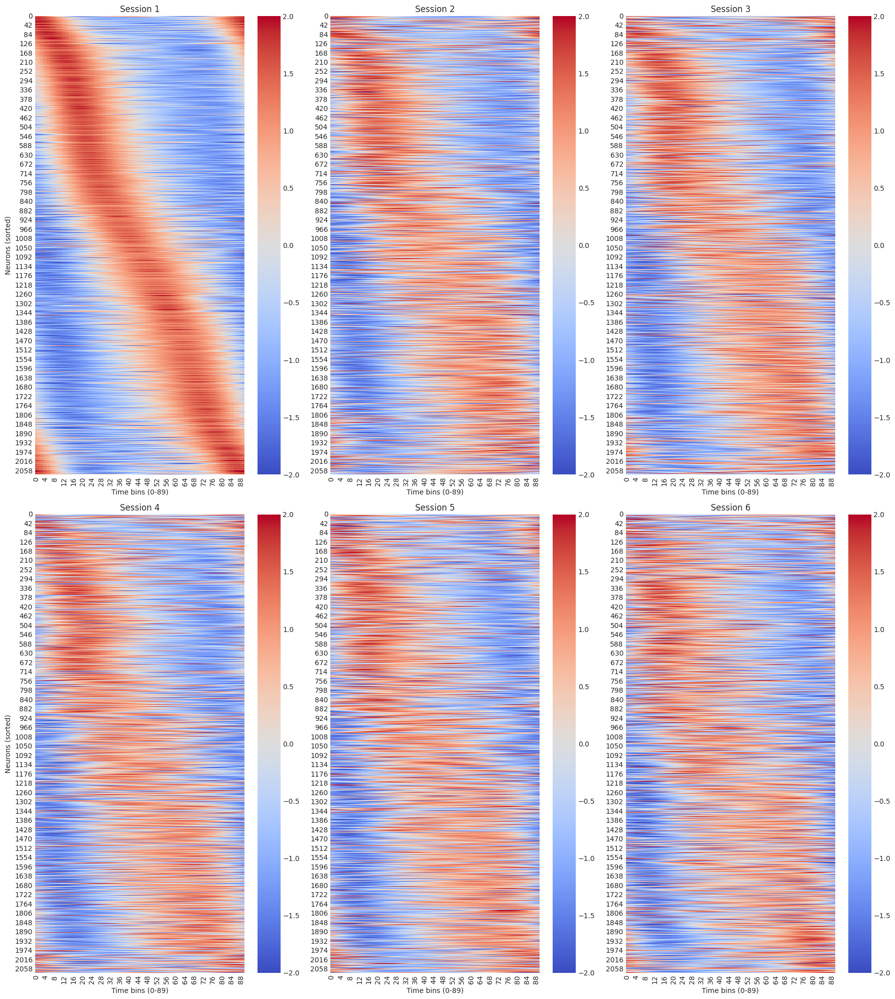

In [72]:
from scipy.stats import zscore
import seaborn as sns

# Find recdays with at least 6 valid sessions
recdays_with_6_tasks = [recday for recday, sessions in valid_sessions_dic.items() if len(sessions) >= 6]

# We'll store the processed (averaged) data for each session across recdays.
session_data = {i: [] for i in range(1, 7)}

# Loop over each recday that has at least 6 tasks.
for recday in recdays_with_6_tasks:
    # Get the sessions for the current recday
    recday_sessions, _ = get_sessions_for_glm(data_dic[recday])

    # We need at least 6 sessions to proceed
    if len(recday_sessions) < 6:
        print(f"Recday {recday} has fewer than 6 sessions after filtering, skipping.")
        continue

    # Process the first 6 sessions for each recday
    recday_session_data = []
    for j, session in enumerate(recday_sessions[:6]):
        # Retrieve the smoothed normalized firing rate array.
        smoothed_norm = data_dic[recday][session]['Smoothed_norm']
        
        # Sanity check for time bins
        if smoothed_norm.shape[1] != 360:
            raise ValueError(f"Expected 360 time bins, got {smoothed_norm.shape[1]} for recday {recday}, session {session}")
        
        # Reshape into (n_neurons, 4 states, 90 time bins per state)
        n_neurons = smoothed_norm.shape[0]
        reshaped = smoothed_norm.reshape(n_neurons, 4, 90)
        
        # Average across the four task states
        avg_norm = np.mean(reshaped, axis=1)
        
        # Append the data for all neurons
        recday_session_data.append(avg_norm)

    # Add the processed session data to the main data list
    for i in range(6):
        session_data[i+1].append(recday_session_data[i])


# Combine data across recdays for each session
session_arrays = {}
for session in session_data:
    if session_data[session]:
        # Use np.vstack to stack the neuron data from different recdays
        session_arrays[session] = np.vstack(session_data[session])
    else:
        print(f"No data available for session {session}")
        continue

# Proceed only if there is data to plot
if session_arrays and all(s in session_arrays for s in range(1, 7)):
    # Z-score session 1 and sort neurons by their peak firing time
    session1_z = zscore(session_arrays[1], axis=1)
    peak_indices = np.argmax(session1_z, axis=1)
    sort_order = np.argsort(peak_indices)
    session1_sorted = session1_z[sort_order, :]

    # Store all sorted sessions in a dictionary
    sorted_sessions_data = {1: session1_sorted}

    # Process sessions 2 through 6 using the same sorting order
    for i in range(2, 7):
        session_z = zscore(session_arrays[i], axis=1)
        sorted_sessions_data[i] = session_z[sort_order, :]

    # Plot the results
    fig, axs = plt.subplots(2, 3, figsize=(18, 20))
    axs = axs.flatten() # Flatten the 2x3 grid to easily iterate

    for i in range(1, 7):
        sns.heatmap(sorted_sessions_data[i], ax=axs[i-1], cmap='coolwarm', cbar=True, vmin=-2, vmax=2)
        axs[i-1].set_title(f'Session {i}')
        axs[i-1].set_xlabel('Time bins (0-89)')
        if (i-1) % 3 == 0: # Add ylabel only for the first column
            axs[i-1].set_ylabel('Neurons (sorted)')
        else:
            axs[i-1].set_ylabel('')

    plt.tight_layout()
    plt.savefig('../data/figures/sorted_session_heatmaps.png', dpi=300, bbox_inches='tight')
    plt.show()
else:
    print("No recording days with 6 valid tasks found to plot.")


In [130]:
valid_sessions_dic.keys()

dict_keys(['ah08_20250613_20250615', 'ah08_20250616_20250617', 'ah08_20250618_20250619', 'ah08_20250620_20250623', 'ah08_20250624_20250625', 'ah10_20250613_20250615', 'ah10_20250616_20250617', 'ah10_20250618_20250619', 'ah10_20250620_20250623', 'ah10_20250624_20250625', 'ly05_20250613_20250615', 'ly05_20250616_20250617', 'ly05_20250624_20250625', 'ly06_20250613_20250615', 'ly06_20250616_20250617', 'ly06_20250618_20250619', 'ly06_20250620_20250623', 'ly06_20250624_20250625', 'ly07_20250613_20250615', 'ly07_20250616_20250617', 'ly07_20250618_20250619', 'ly07_20250620_20250623', 'ly07_20250624_20250625'])

/nfs/nhome/live/aharris/.conda/envs/maze_ephys/lib/python3.12/site-packages/sklearn/manifold/_mds.py:677: FutureWarning: The default value of `n_init` will change from 4 to 1 in 1.9.
  warnings.warn(


MDS embedding shape: (360, 3)


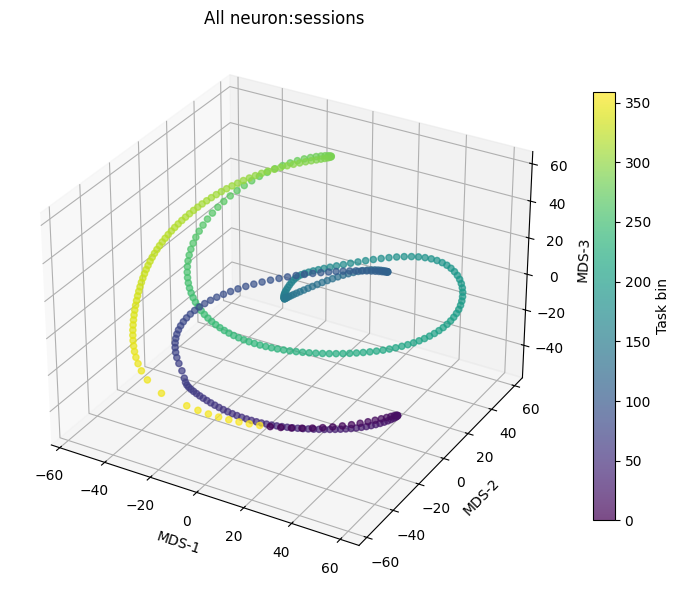

In [96]:
# -------------------------
# Preprocessing (Optional)
# -------------------------
# Standard scaling the data so that each feature (neuron) has zero mean and unit variance.

import numpy as np
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from joblib import Parallel, delayed
from sklearn.manifold import MDS


from mpl_toolkits.mplot3d import Axes3D  # Just to be explicit, though in newer Matplotlib versions not always needed
import importlib


from sklearn.preprocessing import StandardScaler


all_neurons_concat = []
for mouse_recday in mouse_recdays:
    for session in data_dic[mouse_recday]:
        if session == 'valid_sessions':
            continue
        try:
            xxx = data_dic[mouse_recday][session]['Smoothed_norm']
            all_neurons_concat.append(xxx[sig_lec_neurons_dic[mouse_recday],:])
        except KeyError:
            continue
       
all_neurons_concat = np.vstack((all_neurons_concat))


labels = list(range(360))
scaler = StandardScaler()
X_scaled = scaler.fit_transform(all_neurons_concat.T)

# -------------------------
# MDS Dimensionality Reduction
# -------------------------
# We set n_components=3 to get a 3D embedding.

mds = MDS(n_components=3, random_state=100, normalized_stress='auto')
X_embedding = mds.fit_transform(X_scaled)


# X_embedding will now be of shape (n_samples, 3)
print("MDS embedding shape:", X_embedding.shape)

# -------------------------
# Visualization
# -------------------------
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot: we color points by their condition/label
scatter = ax.scatter(X_embedding[:,0], X_embedding[:,1], X_embedding[:,2], 
                     c=labels, cmap='viridis', alpha=0.7)

ax.set_title('All neuron:sessions')
ax.set_xlabel('MDS-1')
ax.set_ylabel('MDS-2')
ax.set_zlabel('MDS-3')

# Optionally add a legend or colorbar
cbar = plt.colorbar(scatter, ax=ax, fraction=0.03)
cbar.set_label('Task bin')

plt.tight_layout()
plt.show()


In [133]:
data_dic[mouse_recday][session]

{'Trial_times': None, 'num_trials': 0, 'num_neurons': 0}

In [152]:
import numpy as np
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from joblib import Parallel, delayed

# We know that states A, B, C, D each span 90 bins
state_bins = [(0, 90), (90, 180), (180, 270), (270, 360)]
state_labels = ['A', 'B', 'C', 'D']

def get_sessions_for_glm(recday_data):
    # Filter sessions with more than two trials
    valid_sessions = {k: v for k, v in recday_data.items() if v['num_trials'] > 2}
    
    # Sort sessions by number of trials in descending order
    sorted_sessions = sorted(valid_sessions.items(), key=lambda x: x[1]['num_trials'], reverse=True)
    
    # Track unique tasks and corresponding sessions
    unique_tasks = {}
    for session, data in sorted_sessions:
        task = str(data['Task'])  # Convert numpy.ndarray to string
        if task not in unique_tasks:
            unique_tasks[task] = session
    
    # Extract session numbers and tasks
    session_numbers = list(unique_tasks.values())
    tasks = list(unique_tasks.keys())
    
    return session_numbers, tasks

def assign_state_labels(num_timebins=360):
    """Create a label array of length num_timebins indicating which state each bin belongs to."""
    labels = np.empty(num_timebins, dtype=object)
    for state_idx, (start, end) in enumerate(state_bins):
        labels[start:end] = state_labels[state_idx]
    return labels

timebin_labels = assign_state_labels(360)

# A helper function to reshape data into samples and labels
def prepare_data_for_decoding(session_array):
    """
    session_array: shape (num_neurons, num_trials, 360)
    We will return:
    X: shape (num_trials * 360, num_neurons)
    y: shape (num_trials * 360,)
    """
    num_neurons, num_trials, num_timebins = session_array.shape
    # Flatten trials and timebins
    # We want (trial * timebin) samples each of length num_neurons
    X = session_array.transpose(1, 2, 0).reshape(num_trials * num_timebins, num_neurons)
    # Labels repeat for each trial
    y = np.tile(timebin_labels, num_trials)
    return X, y

def decode_session(mouse_recday, held_out_session_idx, sessions_for_decoding):
    # Prepare training data (all sessions except the held_out)
    train_sessions = [i for i in sessions_for_decoding if i != held_out_session_idx]
    X_train_list = []
    y_train_list = []

    for s in train_sessions:
        X_tmp, y_tmp = prepare_data_for_decoding(data_dic[mouse_recday][s]['Neurons_norm'])
        X_train_list.append(X_tmp)
        y_train_list.append(y_tmp)

    X_train = np.vstack(X_train_list)
    y_train = np.hstack(y_train_list)

    # Prepare test data
    X_test, y_test = prepare_data_for_decoding(data_dic[mouse_recday][held_out_session_idx]['Neurons_norm'])

    # Optional: scale data (important for SVM)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Train SVM decoder
    clf = SVC(kernel='rbf', C=5.0, class_weight='balanced', random_state=42)
    clf.fit(X_train_scaled, y_train)

    # Evaluate on test
    acc = clf.score(X_test_scaled, y_test)
    return acc

accuracies_dic = {}
mean_accuracies = []

for mouse_recday in [mouse_recdays[0]]:
    # Cross-validation over sessions
    print(mouse_recday)
    # remove 'valid_sessions' key if it exists
    if 'valid_sessions' in data_dic[mouse_recday]:
        del data_dic[mouse_recday]['valid_sessions']
    sessions_for_decoding, tasks_for_decoding = get_sessions_for_glm(data_dic[mouse_recday])
    print(sessions_for_decoding)

    # Use joblib to parallelize the decoding process
    accuracies = Parallel(n_jobs=-1)(delayed(decode_session)(mouse_recday, held_out_session_idx, sessions_for_decoding) for held_out_session_idx in sessions_for_decoding)

    accuracies_dic[mouse_recday] = accuracies
    # Compute the mean accuracy over all folds
    mean_accuracy = np.mean(accuracies)
    std_accuracy = np.std(accuracies)
    print(f"Cross-validated decoding accuracy: {mean_accuracy:.3f} ± {std_accuracy:.3f}")


ah08_20250613_20250615
[5, 4, 6, 1, 2, 0]


Cross-validated decoding accuracy: 0.253 ± 0.035


Processing ah08_20250613_20250615 with 6 valid sessions.
Found 51 LEC units.


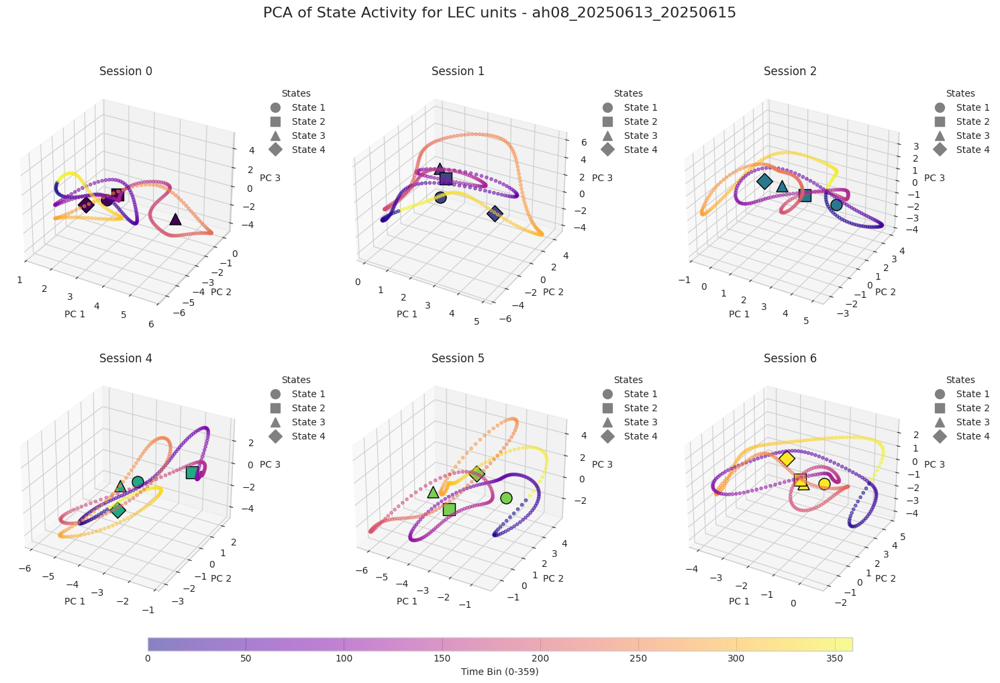

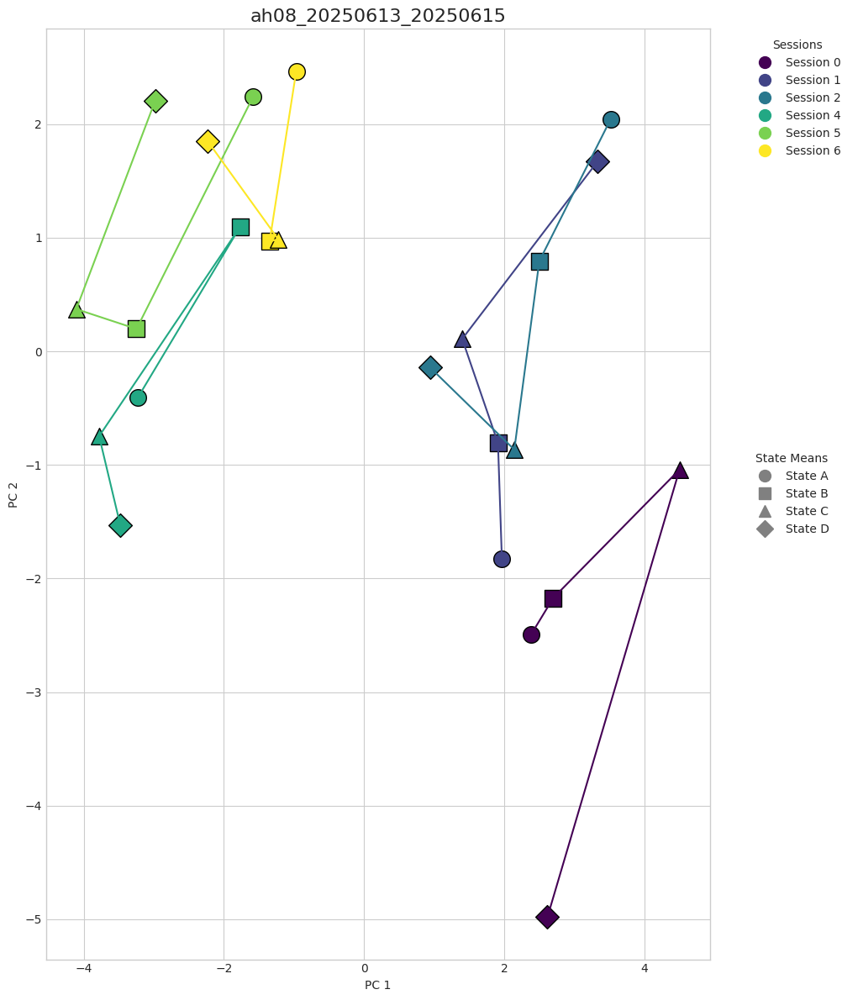

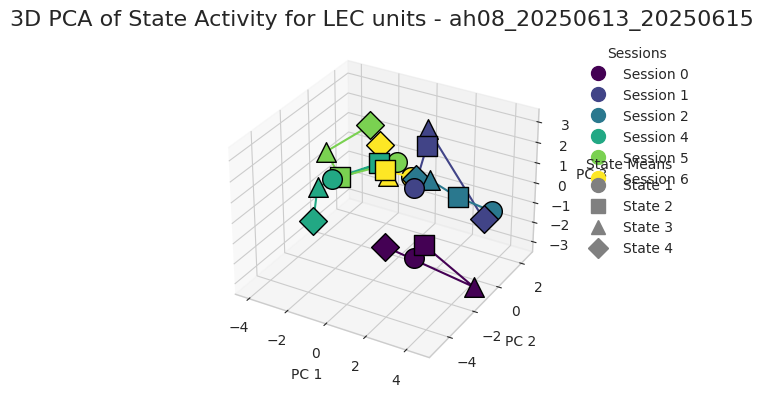

In [87]:
# get for valid sessions for first mouse_recday, get LEC units and compute PCA on all sessions together.
# Plot the average of each of the 4 states for each session, along with all individual time points.
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import math

# 1. Select the first mouse_recday and get its valid sessions
mouse_recday = mouse_recdays[0]
mouse_id = mouse_recday.split('_')[0]
valid_sessions = valid_sessions_dic[mouse_recday]


# 2. Get the LEC units mask for this mouse
max_y_lec = 200# Default to 200 if mouse_id not in dict
LEC_units_mask = find_LEC_units(mouse_recday, preprocessed_folder, max_y_lec=max_y_lec)
lec_indices = np.where(LEC_units_mask == 1)[0]

print(f"Processing {mouse_recday} with {len(valid_sessions)} valid sessions.")
print(f"Found {len(lec_indices)} LEC units.")

# 3. Prepare data from all valid sessions to fit PCA
# We will use all 360 time bins from each session as samples
all_sessions_full_data = []
state_bins = [(0, 90), (90, 180), (180, 270), (270, 360)]

for i, session_idx in enumerate(valid_sessions):
    # Get data for the current session (n_neurons, 360_timebins)
    session_data = data_dic[mouse_recday][session_idx]['Smoothed_norm']
    
    # Filter for LEC units
    session_lec_data = session_data[lec_indices, :]
    
    # Transpose so that time bins are samples and neurons are features (360, n_lec_neurons)
    all_sessions_full_data.append(session_lec_data.T)

# Vertically stack to create one large array (n_sessions * 360, n_lec_neurons)
all_sessions_full_data = np.vstack(all_sessions_full_data)

# Z-score the data across all samples (time bins)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(all_sessions_full_data)

# 4. Fit and transform PCA on the aggregated data
pca = PCA(n_components=3)
projected_data = pca.fit_transform(data_scaled)

# 5. Visualize the results
n_sessions = len(valid_sessions)
n_cols = math.ceil(math.sqrt(n_sessions))
n_rows = math.ceil(n_sessions / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows), subplot_kw={'projection': '3d'})
axes = axes.flatten() # Flatten to 1D array for easy iteration

# Use a colormap to distinguish sessions
cmap = plt.get_cmap('viridis', n_sessions)
colors = [cmap(i) for i in range(n_sessions)]

# Markers for the 4 states
state_markers = ['o', 's', '^', 'D']

time_colors = np.arange(360)  # Color by time bin
time_cmap = plt.get_cmap('plasma')
# Plot the points for each session on a separate subplot
for i, session_idx in enumerate(valid_sessions):
    ax = axes[i]
    
    # Get all 360 projected points for this session
    session_all_points = projected_data[i*360 : (i+1)*360]
    
    # Plot all individual time bins, colored by time
    scatter = ax.scatter(session_all_points[:, 0], session_all_points[:, 1], session_all_points[:, 2],
                         c=time_colors,
                         cmap=time_cmap,
                         alpha=0.5,
                         s=10)
    
    # Calculate and plot the mean for each of the 4 states
    for state_idx, (start, end) in enumerate(state_bins):
        # Get the points corresponding to the current state
        state_points = session_all_points[start:end]
        
        # Calculate the mean of these points
        mean_point = np.mean(state_points, axis=0)
        
        # Plot the mean point as a large, opaque marker
        ax.scatter(mean_point[0], mean_point[1], mean_point[2], 
                   color=colors[i], 
                   marker=state_markers[state_idx],
                   s=150, 
                   edgecolor='black',
                   label=f'State {state_idx+1} (mean)')

    # Create a custom legend for states
    from matplotlib.lines import Line2D
    state_legend = [Line2D([0], [0], marker=m, color='grey', label=f'State {j+1}', linestyle='None', markersize=10) for j, m in enumerate(state_markers)]
    ax.legend(handles=state_legend, title="States", bbox_to_anchor=(1.05, 1), loc='upper left')

    ax.set_title(f'Session {session_idx}')
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

fig.suptitle(f'PCA of State Activity for LEC units - {mouse_recday}', fontsize=16)
plt.tight_layout(rect=[0, 0.05, 1, 0.96]) # Adjust layout to make room for suptitle and colorbar

# Add a single colorbar for the time points
cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.02]) # [left, bottom, width, height]
cbar = fig.colorbar(scatter, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Time Bin (0-359)')

plt.show()





# 6. Create a single 2D PCA plot for all sessions together
fig, ax = plt.subplots(figsize=(12, 12))

# Calculate and plot the mean for each state in each session
for i, session_idx in enumerate(valid_sessions):
    # Get all 360 projected points for this session
    session_all_points = projected_data[i*360 : (i+1)*360]
    
    session_mean_points = []
    for state_idx, (start, end) in enumerate(state_bins):
        # Get the points corresponding to the current state
        state_points = session_all_points[start:end]
        
        # Calculate the mean of these points
        mean_point = np.mean(state_points, axis=0)
        session_mean_points.append(mean_point)
        
        # Plot the mean point
        ax.scatter(mean_point[0], mean_point[1], 
                   color=colors[i], 
                   marker=state_markers[state_idx],
                   s=200, 
                   edgecolor='black')

    # Draw lines connecting the state means for the current session
    session_mean_points = np.array(session_mean_points)
    ax.plot(session_mean_points[:, 0], session_mean_points[:, 1], color=colors[i], linestyle='-', marker='')

states = ['A', 'B', 'C', 'D']
# Create custom legends
from matplotlib.lines import Line2D
session_legend = [Line2D([0], [0], marker='o', color=c, label=f'Session {s_idx}', linestyle='None', markersize=10) for c, s_idx in zip(colors, valid_sessions)]
state_legend = [Line2D([0], [0], marker=m, color='grey', label=f'State {states[j]}', linestyle='None', markersize=10) for j, m in enumerate(state_markers)]

# Add legends to the plot
leg1 = ax.legend(handles=session_legend, title="Sessions", bbox_to_anchor=(1.05, 1), loc='upper left')
ax.add_artist(leg1)
ax.legend(handles=state_legend, title="State Means", bbox_to_anchor=(1.05, 0.5), loc='center left')


# Set titles and labels
ax.set_title(f'{mouse_recday}', fontsize=16)
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
ax.grid(True)

plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust layout to make room for legends
fig.savefig(f'../data/figures/2D_PCA_LEC_states_{mouse_recday}.pdf', dpi=300, bbox_inches='tight')
plt.show()


# 6. Create a single 3D PCA plot for all sessions together
fig = plt.figure(figsize=(7, 4))
ax = fig.add_subplot(111, projection='3d')

# Calculate and plot the mean for each state in each session
for i, session_idx in enumerate(valid_sessions):
    # Get all 360 projected points for this session
    session_all_points = projected_data[i*360 : (i+1)*360]
    
    session_mean_points = []
    for state_idx, (start, end) in enumerate(state_bins):
        # Get the points corresponding to the current state
        state_points = session_all_points[start:end]
        
        # Calculate the mean of these points
        mean_point = np.mean(state_points, axis=0)
        session_mean_points.append(mean_point)
        
        # Plot the mean point
        ax.scatter(mean_point[0], mean_point[1], mean_point[2],
                   color=colors[i], 
                   marker=state_markers[state_idx],
                   s=200, 
                   edgecolor='black')

    # Draw lines connecting the state means for the current session
    session_mean_points = np.array(session_mean_points)
    ax.plot(session_mean_points[:, 0], session_mean_points[:, 1], session_mean_points[:, 2], color=colors[i], linestyle='-', marker='')


# Create custom legends
from matplotlib.lines import Line2D
session_legend = [Line2D([0], [0], marker='o', color=c, label=f'Session {s_idx}', linestyle='None', markersize=10) for c, s_idx in zip(colors, valid_sessions)]
state_legend = [Line2D([0], [0], marker=m, color='grey', label=f'State {j+1}', linestyle='None', markersize=10) for j, m in enumerate(state_markers)]

# Add legends to the plot
leg1 = ax.legend(handles=session_legend, title="Sessions", bbox_to_anchor=(1.05, 1), loc='upper left')
ax.add_artist(leg1)
ax.legend(handles=state_legend, title="State Means", bbox_to_anchor=(1.05, 0.5), loc='center left')


# Set titles and labels
ax.set_title(f'3D PCA of State Activity for LEC units - {mouse_recday}', fontsize=16)
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
ax.set_zlabel('PC 3')
ax.grid(True)

plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust layout to make room for legends
plt.show()


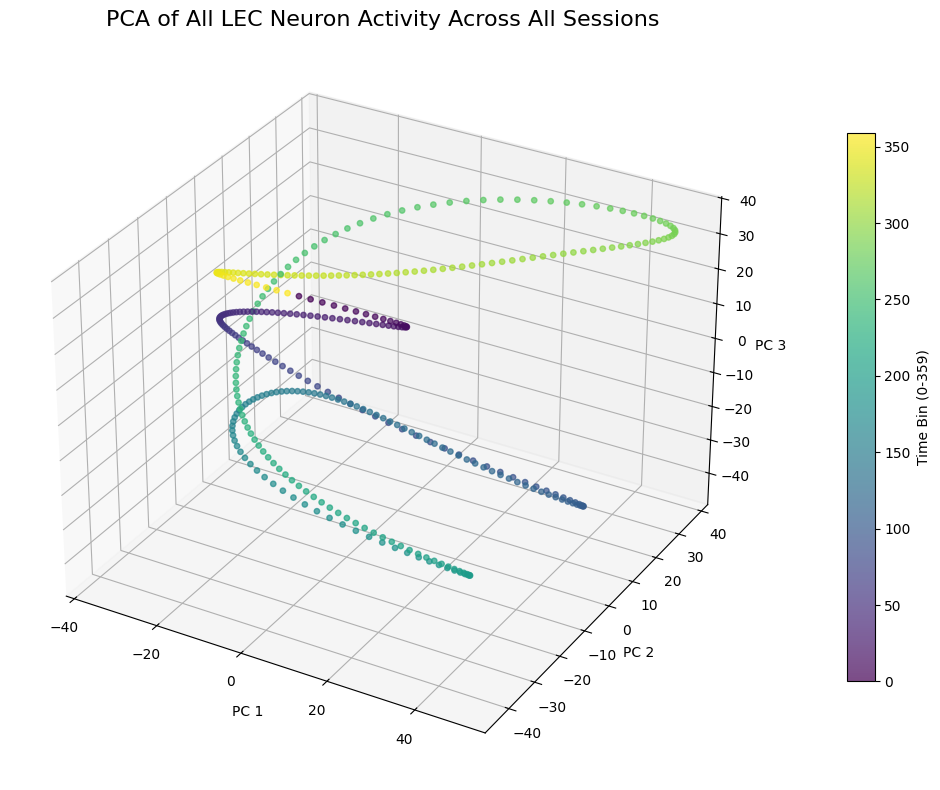

In [72]:
import os
import importlib

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
import math
import numpy as np


import matplotlib.pyplot as plt

# 1. Aggregate data from all valid sessions across all mouse_recdays
all_sessions_data_lec = []
all_labels = []
time_colors = np.arange(360)
time_cmap = plt.get_cmap('viridis')

for mouse_recday in mouse_recdays:
    mouse_id = mouse_recday.split('_')[0]
    if mouse_id not in max_y_lec_dic:
        continue  # Skip if mouse_id is not in the dictionary

    max_y_lec = max_y_lec_dic.get(mouse_id, 200)
    LEC_units_mask = find_LEC_units(mouse_recday, preprocessed_folder, max_y_lec=max_y_lec)
    lec_indices = np.where(LEC_units_mask == 1)[0]

    if len(lec_indices) == 0:
        print(f"No LEC units found for {mouse_recday}, skipping.")
        continue

    valid_sessions = valid_sessions_dic.get(mouse_recday, [])
    
    for session_idx in valid_sessions:
        if 'Smoothed_norm' in data_dic[mouse_recday][session_idx]:
            session_data = data_dic[mouse_recday][session_idx]['Smoothed_norm']
            
            # Ensure lec_indices are within bounds
            valid_lec_indices = [i for i in lec_indices if i < session_data.shape[0]]
            if not valid_lec_indices:
                continue

            session_lec_data = session_data[valid_lec_indices, :]
            all_sessions_data_lec.append(session_lec_data)
            # We create labels for each session added
            all_labels.extend(np.repeat(f"{mouse_recday}_{session_idx}", len(valid_lec_indices)))


# 2. Stack, scale, and perform PCA
if all_sessions_data_lec:
    # Horizontally stack to create one large array (total_lec_neurons, 360)
    full_data = np.vstack(all_sessions_data_lec)

    # Z-score the data (features are time bins, samples are neurons)
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(full_data.T)

    # Fit and transform PCA (on time bins)
    pca = PCA(n_components=3)
    projected_data = pca.fit_transform(data_scaled)

    # 3. Visualize the results
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # The projected data has shape (360, 3). We have 360 points to plot.
    # The color of each point corresponds to its time bin index.
    scatter = ax.scatter(projected_data[:, 0], projected_data[:, 1], projected_data[:, 2],
                         c=time_colors,
                         cmap=time_cmap,
                         alpha=0.7,
                         s=15)

    ax.set_title('PCA of All LEC Neuron Activity Across All Sessions', fontsize=16)
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')

    cbar = fig.colorbar(scatter, ax=ax, fraction=0.03, pad=0.1)
    cbar.set_label('Time Bin (0-359)')

    plt.tight_layout()
    plt.show()
else:
    print("No data available to perform PCA.")

Processing ah08_20250613_20250615 with 6 valid sessions.
Found 77 LEC units.


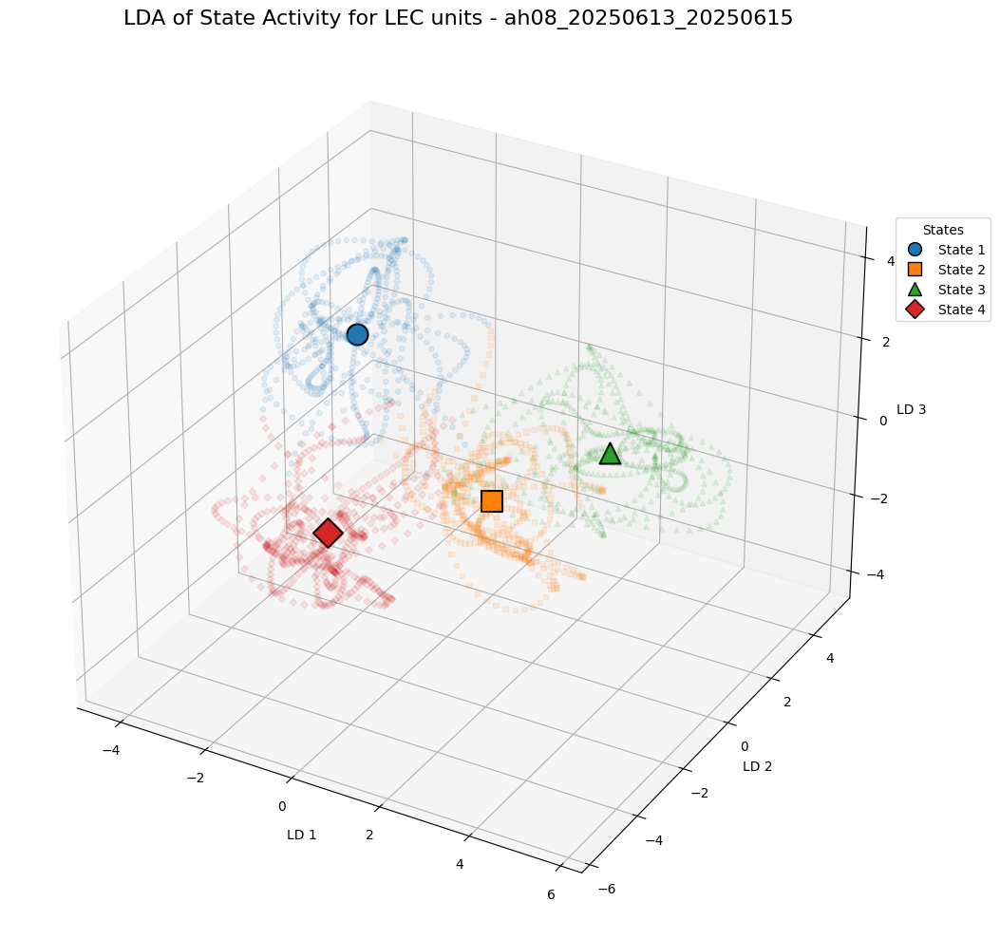

In [74]:
# Perform Linear Discriminant Analysis (LDA) to separate the 4 states
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# 1. Prepare labels for LDA

mouse_recday = mouse_recdays[0]
mouse_id = mouse_recday.split('_')[0]
valid_sessions = valid_sessions_dic[mouse_recday]


# 2. Get the LEC units mask for this mouse
max_y_lec = 300# Default to 200 if mouse_id not in dict
LEC_units_mask = find_LEC_units(mouse_recday, preprocessed_folder, max_y_lec=max_y_lec)
lec_indices = np.where(LEC_units_mask == 1)[0]

print(f"Processing {mouse_recday} with {len(valid_sessions)} valid sessions.")
print(f"Found {len(lec_indices)} LEC units.")

# 3. Prepare data from all valid sessions to fit PCA
# We will use all 360 time bins from each session as samples
all_sessions_full_data = []
state_bins = [(0, 90), (90, 180), (180, 270), (270, 360)]

for i, session_idx in enumerate(valid_sessions):
    # Get data for the current session (n_neurons, 360_timebins)
    session_data = data_dic[mouse_recday][session_idx]['Smoothed_norm']
    
    # Filter for LEC units
    session_lec_data = session_data[lec_indices, :]
    
    # Transpose so that time bins are samples and neurons are features (360, n_lec_neurons)
    all_sessions_full_data.append(session_lec_data.T)

# Vertically stack to create one large array (n_sessions * 360, n_lec_neurons)
all_sessions_full_data = np.vstack(all_sessions_full_data)

# Z-score the data across all samples (time bins)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(all_sessions_full_data)


# The labels correspond to the 4 states (90 bins each)
n_sessions = len(valid_sessions)
state_labels_per_session = np.repeat(np.arange(4), 90) # [0...0, 1...1, 2...2, 3...3]
y_lda = np.tile(state_labels_per_session, n_sessions) # Repeat for each session

# The data is already scaled from the PCA step (data_scaled)

# 2. Fit and transform LDA
# n_components can be at most min(n_classes - 1, n_features)
# Here, n_classes = 4, so max components is 3.
lda = LinearDiscriminantAnalysis(n_components=3)
projected_data_lda = lda.fit_transform(data_scaled, y_lda)

# 3. Visualize the LDA results in a single 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Define colors and markers for the 4 states
state_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'] # Blue, Orange, Green, Red
state_markers = ['o', 's', '^', 'D']

# Plot all points, colored by their state
for state_idx in range(4):
    # Get all points belonging to this state from all sessions
    state_points = projected_data_lda[y_lda == state_idx]
    
    # Scatter plot individual time points with some transparency
    ax.scatter(state_points[:, 0], state_points[:, 1], state_points[:, 2], 
               color=state_colors[state_idx],
               marker=state_markers[state_idx],
               alpha=0.1, 
               s=15,
               label=f'State {state_idx+1} points')

# Calculate and plot the overall mean for each state
for state_idx in range(4):
    state_points = projected_data_lda[y_lda == state_idx]
    mean_point = np.mean(state_points, axis=0)
    
    # Plot the mean point as a large, opaque marker
    ax.scatter(mean_point[0], mean_point[1], mean_point[2], 
               color=state_colors[state_idx], 
               marker=state_markers[state_idx],
               s=250, 
               edgecolor='black',
               linewidth=1.5,
               label=f'State {state_idx+1} (Mean)')

# Create a clean legend
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker=m, color=c, label=f'State {i+1}', 
                          linestyle='None', markersize=10, markeredgecolor='black') 
                   for i, (m, c) in enumerate(zip(state_markers, state_colors))]
ax.legend(handles=legend_elements, title="States", bbox_to_anchor=(1.1, 0.8))

# Set titles and labels
ax.set_title(f'LDA of State Activity for LEC units - {mouse_recday}', fontsize=16)
ax.set_xlabel('LD 1')
ax.set_ylabel('LD 2')
ax.set_zlabel('LD 3')

plt.tight_layout()
plt.show()


Processing ah08_20250616_20250617
Training on 5 sessions, holding out session 6.
Found 85 LEC units.


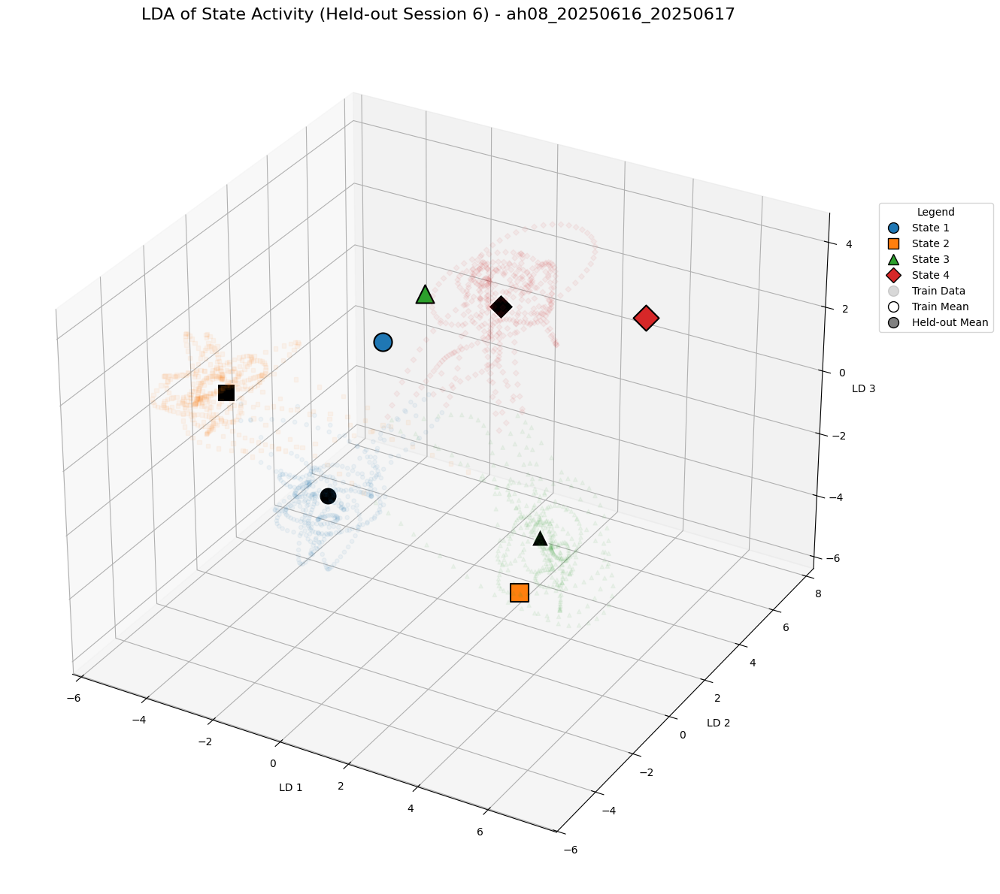

In [78]:
# Perform Linear Discriminant Analysis (LDA) to separate the 4 states
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

# 1. Prepare labels and data for LDA, holding one session out

mouse_recday = mouse_recdays[1]
mouse_id = mouse_recday.split('_')[0]
valid_sessions = valid_sessions_dic[mouse_recday]

# Hold out the last valid session for testing
held_out_session_idx = valid_sessions[-1]
train_session_indices = valid_sessions[:-1]

# 2. Get the LEC units mask for this mouse
max_y_lec = 300 # Default to 200 if mouse_id not in dict
LEC_units_mask = find_LEC_units(mouse_recday, preprocessed_folder, max_y_lec=max_y_lec)
lec_indices = np.where(LEC_units_mask == 1)[0]

print(f"Processing {mouse_recday}")
print(f"Training on {len(train_session_indices)} sessions, holding out session {held_out_session_idx}.")
print(f"Found {len(lec_indices)} LEC units.")

# 3. Prepare training and held-out data
state_bins = [(0, 90), (90, 180), (180, 270), (270, 360)]
train_data_list = []
held_out_data = None

# Prepare training data
for session_idx in train_session_indices:
    session_data = data_dic[mouse_recday][session_idx]['Smoothed_norm'][lec_indices, :].T
    train_data_list.append(session_data)

# Prepare held-out data
session_data = data_dic[mouse_recday][held_out_session_idx]['Smoothed_norm'][lec_indices, :].T
held_out_data = session_data

# Stack training data and scale
train_data = np.vstack(train_data_list)
scaler = StandardScaler()
train_data_scaled = scaler.fit_transform(train_data)

# Scale held-out data with the same scaler
held_out_data_scaled = scaler.transform(held_out_data)

# 4. Prepare labels
n_train_sessions = len(train_session_indices)
state_labels_per_session = np.repeat(np.arange(4), 90)
y_train = np.tile(state_labels_per_session, n_train_sessions)
y_held_out = state_labels_per_session

# 5. Fit LDA on training data and transform both sets
lda = LinearDiscriminantAnalysis(n_components=3)
projected_train_data = lda.fit_transform(train_data_scaled, y_train)
projected_held_out_data = lda.transform(held_out_data_scaled)

# 6. Visualize the LDA results
fig = plt.figure(figsize=(14, 12))
ax = fig.add_subplot(111, projection='3d')

state_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
state_markers = ['o', 's', '^', 'D']

# Plot training data points (transparent)
for state_idx in range(4):
    state_points = projected_train_data[y_train == state_idx]
    ax.scatter(state_points[:, 0], state_points[:, 1], state_points[:, 2],
               color=state_colors[state_idx], marker=state_markers[state_idx],
               alpha=0.05, s=15)

# Calculate and plot overall mean for each state from training data
for state_idx in range(4):
    state_points = projected_train_data[y_train == state_idx]
    mean_point = np.mean(state_points, axis=0)
    ax.scatter(mean_point[0], mean_point[1], mean_point[2],
               color='black', marker=state_markers[state_idx],
               s=300, edgecolor='white', linewidth=1.5,
               label=f'Train Mean State {state_idx+1}')

# Calculate and plot mean for each state from held-out data
for state_idx in range(4):
    state_points = projected_held_out_data[y_held_out == state_idx]
    mean_point = np.mean(state_points, axis=0)
    ax.scatter(mean_point[0], mean_point[1], mean_point[2],
               color=state_colors[state_idx], marker=state_markers[state_idx],
               s=300, edgecolor='black', linewidth=1.5,
               label=f'Held-out Mean State {state_idx+1}')

# Create a clean legend
legend_elements = [Line2D([0], [0], marker=m, color=c, label=f'State {i+1}',
                          linestyle='None', markersize=10, markeredgecolor='k')
                   for i, (m, c) in enumerate(zip(state_markers, state_colors))]
legend_elements.append(Line2D([0], [0], marker='o', color='gray', label='Train Data',
                       linestyle='None', markersize=10, alpha=0.3))
legend_elements.append(Line2D([0], [0], marker='o', color='w', label='Train Mean',
                       linestyle='None', markersize=10, markeredgecolor='k'))
legend_elements.append(Line2D([0], [0], marker='o', color='gray', label='Held-out Mean',
                       linestyle='None', markersize=10, markeredgecolor='k'))


ax.legend(handles=legend_elements, title="Legend", bbox_to_anchor=(1.15, 0.8))

# Set titles and labels
ax.set_title(f'LDA of State Activity (Held-out Session {held_out_session_idx}) - {mouse_recday}', fontsize=16)
ax.set_xlabel('LD 1')
ax.set_ylabel('LD 2')
ax.set_zlabel('LD 3')

plt.tight_layout()
plt.show()


Processing ah08_20250613_20250615
Fitting LDA on session 0.
Projecting sessions 1 and 2.
Found 77 LEC units.


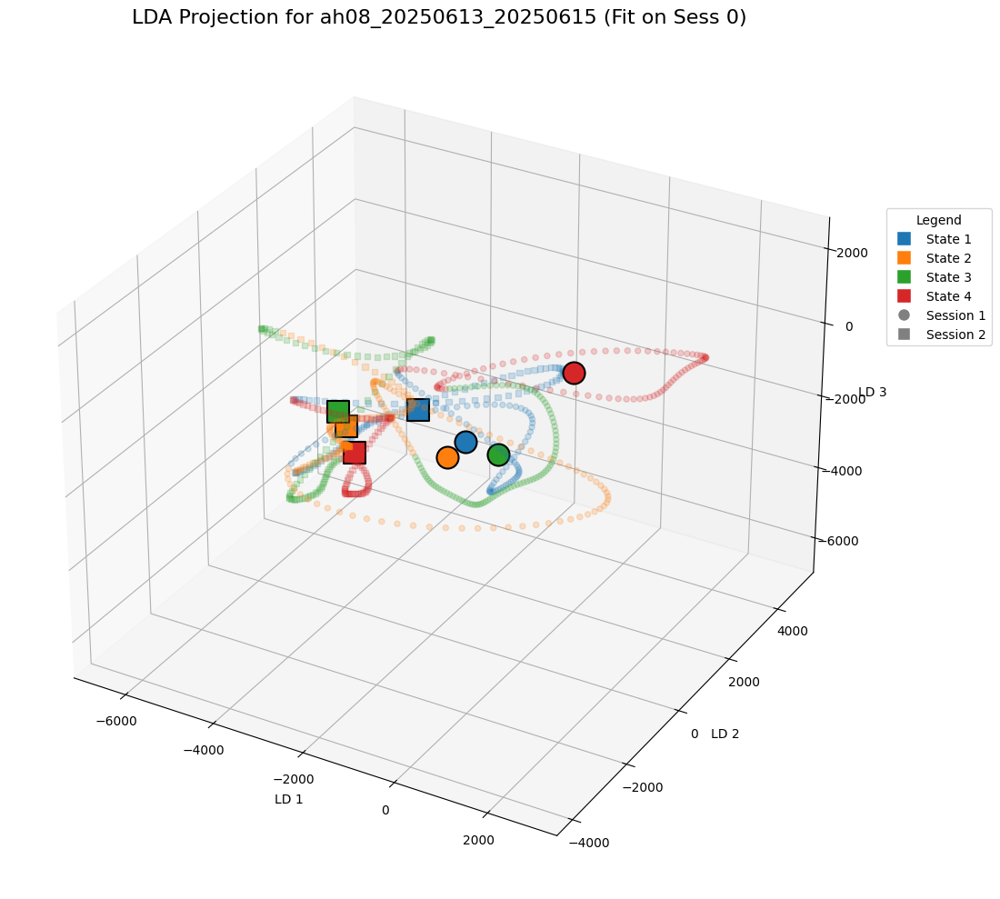

In [75]:
# Perform Linear Discriminant Analysis (LDA) to separate the 4 states
# Fit on one session, project others.
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D
import numpy as np

# 1. Setup and Data Preparation
mouse_recday = mouse_recdays[0]
mouse_id = mouse_recday.split('_')[0]
valid_sessions = valid_sessions_dic[mouse_recday]

# Ensure there are at least 3 sessions to work with
if len(valid_sessions) < 3:
    print(f"Skipping {mouse_recday}: requires at least 3 valid sessions, but found {len(valid_sessions)}.")
else:
    session_for_fit = valid_sessions[0]
    sessions_to_project = valid_sessions[1:3] # Use the next two sessions

    # Get the LEC units mask for this mouse
    max_y_lec = 300
    LEC_units_mask = find_LEC_units(mouse_recday, preprocessed_folder, max_y_lec=max_y_lec)
    lec_indices = np.where(LEC_units_mask == 1)[0]

    print(f"Processing {mouse_recday}")
    print(f"Fitting LDA on session {session_for_fit}.")
    print(f"Projecting sessions {sessions_to_project[0]} and {sessions_to_project[1]}.")
    print(f"Found {len(lec_indices)} LEC units.")

    # 2. Prepare data for the session to fit the LDA model
    data_fit_raw = data_dic[mouse_recday][session_for_fit]['Smoothed_norm'][lec_indices, :].T
    
    # Scale the data: fit and transform on the first session's data
    scaler = StandardScaler()
    data_fit_scaled = scaler.fit_transform(data_fit_raw)
    
    # Create labels for the fitting data
    y_fit = np.repeat(np.arange(4), 90) # 4 states, 90 bins each

    # 3. Fit the LDA model
    lda = LinearDiscriminantAnalysis(n_components=3)
    lda.fit(data_fit_scaled, y_fit)

    # 4. Prepare and project data for the other sessions
    projected_data_sessions = {}
    for session_idx in sessions_to_project:
        # Get data, filter for LEC units, and transpose
        data_project_raw = data_dic[mouse_recday][session_idx]['Smoothed_norm'][lec_indices, :].T
        
        # Scale using the *same* scaler fitted on the first session
        data_project_scaled = scaler.transform(data_project_raw)
        
        # Transform the data using the fitted LDA model
        projected_data_sessions[session_idx] = lda.transform(data_project_scaled)

    # 5. Visualize the results in a single 3D plot
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Define colors for states and markers for sessions
    state_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'] # Blue, Orange, Green, Red
    session_markers = ['o', 's'] # Circle for first projected session, Square for second
    
    y_plot = np.repeat(np.arange(4), 90)

    # Plot projected data for each session
    for i, session_idx in enumerate(sessions_to_project):
        projected_data = projected_data_sessions[session_idx]
        marker = session_markers[i]
        
        # Plot all points for this session, colored by state
        for state_idx in range(4):
            state_points = projected_data[y_plot == state_idx]
            ax.scatter(state_points[:, 0], state_points[:, 1], state_points[:, 2],
                       color=state_colors[state_idx],
                       marker=marker,
                       alpha=0.2,
                       s=20,
                       label=f'State {state_idx+1} (Sess {session_idx})' if state_idx == 0 else "") # Avoid duplicate labels

    # Calculate and plot the mean for each state in each projected session
    for i, session_idx in enumerate(sessions_to_project):
        projected_data = projected_data_sessions[session_idx]
        marker = session_markers[i]
        for state_idx in range(4):
            state_points = projected_data[y_plot == state_idx]
            mean_point = np.mean(state_points, axis=0)
            ax.scatter(mean_point[0], mean_point[1], mean_point[2],
                       color=state_colors[state_idx],
                       marker=marker,
                       s=300,
                       edgecolor='black',
                       linewidth=1.5)

    # Create a custom legend
    legend_elements = []
    for i, c in enumerate(state_colors):
        legend_elements.append(Line2D([0], [0], marker='s', color='w', label=f'State {i+1}',
                                      markerfacecolor=c, markersize=12))
    legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Session {sessions_to_project[0]}',
                                  markerfacecolor='grey', markersize=10))
    legend_elements.append(Line2D([0], [0], marker='s', color='w', label=f'Session {sessions_to_project[1]}',
                                  markerfacecolor='grey', markersize=10))

    ax.legend(handles=legend_elements, title="Legend", bbox_to_anchor=(1.15, 0.8))

    # Set titles and labels
    ax.set_title(f'LDA Projection for {mouse_recday} (Fit on Sess {session_for_fit})', fontsize=16)
    ax.set_xlabel('LD 1')
    ax.set_ylabel('LD 2')
    ax.set_zlabel('LD 3')

    plt.tight_layout()
    plt.show()


In [159]:
projected_data.shape

(360, 3)

In [ ]:
from scipy.stats import ttest_1samp

# Calculate mean and standard deviation of decoding accuracies for each mouse_recday
mean_accuracies = {mouse_recday: np.mean(accuracies) for mouse_recday, accuracies in accuracies_dic.items()}
std_accuracies = {mouse_recday: np.std(accuracies) for mouse_recday, accuracies in accuracies_dic.items()}

# Perform t-test against chance level (0.25)
chance_level = 0.25
t_stats = {}
p_values = {}
for mouse_recday, accuracies in accuracies_dic.items():
    t_stat, p_value = ttest_1samp(accuracies, chance_level)
    t_stats[mouse_recday] = t_stat
    p_values[mouse_recday] = p_value

# Plot mean decoding accuracy with standard deviation
fig, ax = plt.subplots(figsize=(5, 6))
mouse_recdays = list(mean_accuracies.keys())
mean_values = list(mean_accuracies.values())
# Create a stripplot for decoding accuracies
sns.stripplot(data=list(accuracies_dic.values()), jitter=True, color='black')
ax.set_ylim(0, 1)

ax.errorbar(mouse_recdays, mean_values, yerr=std_values, fmt='o', color='black', ecolor='gray', capsize=5)
ax.axhline(y=chance_level, color='red', linestyle='--', label='Chance Level (0.25)')

# Add t and p values to the plot
for i, mouse_recday in enumerate(mouse_recdays):
    t_stat = t_stats[mouse_recday]
    p_value = p_values[mouse_recday]
    significance = '*' if p_value < 0.05 else ''
    # ax.text(i, mean_values[i] + std_values[i] + 0.02, f't={t_stat:.2f}\np={p_value:.3f}{significance}', ha='center')

ax.set_xlabel('Mouse Recday')
ax.set_ylabel('Mean Decoding Accuracy')
t, p = ttest_1samp(mean_values, chance_level)
ax.set_title(f"T={t}, p={p}")
ax.legend()
plt.show()

In [ ]:
len(Trial_times)

0

_____
Example output neuron
trials x normalised time bins
dashed lines represent reward times


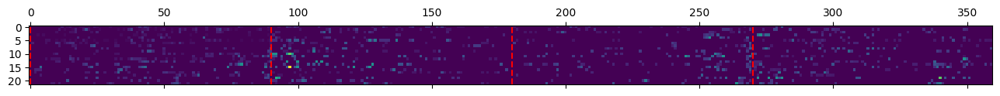

In [ ]:
print('_____')
print('Example output neuron')
print('trials x normalised time bins')
print('dashed lines represent reward times')
### plotting example
neuron = 0
plt.matshow(norm_neurons_dic[mouse_recday][0][0])
for angle in np.arange(4) * 90:
    plt.axvline(angle, color='red', ls='dashed')
plt.show()

In [ ]:
len(norm_neurons_dic['ah08_20250618_20250619'])

8

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages
from scipy.stats import sem


for mouse_recday in mouse_recdays:
    n_sessions = norm_neurons_dic[mouse_recday].__len__()
    norm_neurons_list = norm_neurons_dic[mouse_recday]
    n_neurons = norm_neurons_list[0].shape[0]
    output_pdf_path = f"{figures_folder}/neuron_polar_plots_lEC_{mouse_recday}.pdf"
    custom_labels = ["A", "B", "C", "D"]
    with PdfPages(output_pdf_path) as pdf:
        for neuron_idx in range(n_neurons):
            fig, axes = plt.subplots(
                1, n_sessions, 
                subplot_kw={'projection': 'polar'},
                figsize=(15, 5),
                constrained_layout=True
            )
            
            for session_idx, session_data in enumerate(norm_neurons_list):
                # Extract data for the current neuron in the current session
                neuron_data = session_data[neuron_idx]
                std_err_neuron = std_err(neuron_data)
                # Compute the mean firing rate across trials
                mean_firing_rates = np.mean(neuron_data, axis=0)
                mean_firing_rates = smooth_circ(mean_firing_rates)
                
                # Define angles for the polar plot
                angles = np.linspace(0, 2 * np.pi, num=360, endpoint=False)
                
                # Plot for the current session
                ax = axes[session_idx]
                ax.plot(angles, mean_firing_rates, label=f"Session {session_idx + 1}")
                ax.fill(
                    np.concatenate([angles, angles[::-1]]),
                    np.concatenate([mean_firing_rates + std_err_neuron, (mean_firing_rates - std_err_neuron)[::-1]]),
                    alpha=0.3,
                    label=f"± SEM"
                )
                ax.set_theta_zero_location("N")
                ax.set_theta_direction(-1)
                ax.set_title(f"Session {session_idx + 1}", fontsize=10)
                # Customize the axis labels
                ax.set_xticks([0, np.pi / 2, np.pi, 3 * np.pi / 2])  # Positions: North, East, South, West
                ax.set_xticklabels(custom_labels, fontsize=12)
            
            # Set a global title for the neuron
            fig.suptitle(f"Neuron {neuron_idx + 1}", fontsize=16)
            
            # Show the plot
            pdf.savefig(fig)
            plt.close(fig) 

/nfs/nhome/live/aharris/.conda/envs/maze_ephys/lib/python3.12/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/nfs/nhome/live/aharris/.conda/envs/maze_ephys/lib/python3.12/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/nfs/nhome/live/aharris/.conda/envs/maze_ephys/lib/python3.12/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/nfs/nhome/live/aharris/.conda/envs/maze_ephys/lib/python3.12/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/nfs/nhome/live/aharris/.conda/envs/maze_ephys/lib/python3.12/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof

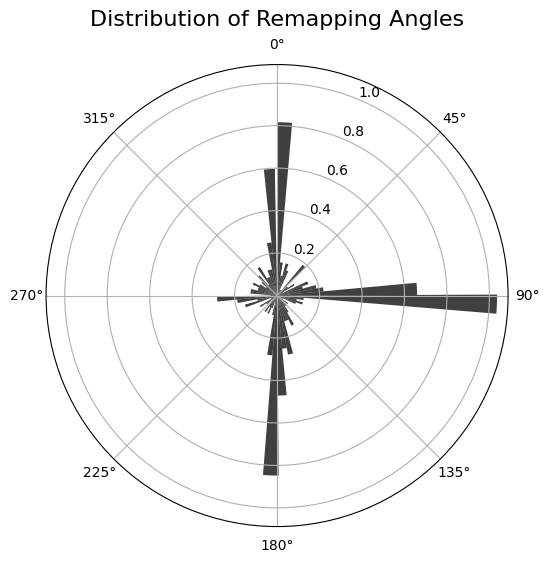

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

# # Example data: list of sessions with 3D arrays (neurons x trials x timepoints)
# # Replace these with your actual data
# n_sessions = 4
# n_neurons = 5
# n_trials = 100
# n_timepoints = 360
# sessions = [np.random.rand(n_neurons, n_trials, n_timepoints) for _ in range(n_sessions)]

# # Compute mean firing rates for each neuron in each session
mean_firing_rates = [np.mean(arr, axis=1) for arr in norm_neurons_list]  # List of arrays (neurons x timepoints)

# # Function to compute remapping angles for a single neuron
def compute_remapping_angle(mean1, mean2):
    n_bins = len(mean1)
    angles = np.arange(n_bins) * (2 * np.pi / n_bins)  # Angles corresponding to each bin
    correlations = []
    for shift in range(n_bins):
        # Circularly shift mean1
        shifted_mean1 = np.roll(mean1, shift)
        # Compute correlation
        correlation = np.corrcoef(shifted_mean1, mean2)[0, 1]
        correlations.append(correlation)
    # Find the shift that maximizes the correlation
    best_shift = np.argmax(correlations)
    best_angle = angles[best_shift]
    return best_angle

# # Compute remapping angles for all neurons and pairs of sessions
sessions = [4,5,6]  # Example session indices
remapping_angles = []
for neuron_idx in range(n_neurons):
    for session1_idx in sessions[:-1]:
        session2_idx = session1_idx + 1
        # Normalize the mean firing rates (subtract the mean)
        mean1 = mean_firing_rates[session1_idx][neuron_idx] - np.mean(mean_firing_rates[session1_idx][neuron_idx])
        mean2 = mean_firing_rates[session2_idx][neuron_idx] - np.mean(mean_firing_rates[session2_idx][neuron_idx])
        # Compute the remapping angle
        angle = compute_remapping_angle(mean1, mean2)
        remapping_angles.append(angle)

# Plot a polar histogram of remapping angles
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 6))
ax.hist(remapping_angles, bins=72, density=True, alpha=0.75, color='black')
ax.set_title("Distribution of Remapping Angles", va='bottom', fontsize=16)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
plt.show()


In [ ]:
mean_firing_rates

[array([], shape=(0, 1080), dtype=float64),
 array([], shape=(0, 1080), dtype=float64),
 array([], shape=(0, 1080), dtype=float64),
 array([], shape=(0, 1080), dtype=float64),
 array([], shape=(0, 1080), dtype=float64),
 array([], shape=(0, 1080), dtype=float64),
 array([], shape=(0, 1080), dtype=float64),
 array([], shape=(0, 1080), dtype=float64)]